# Dawson Pallotta - Machine Learning Project

## Package instilation and importing

In [ ]:
import pandas as pd
import sklearn
import numpy as np
import matplotlib
import plotly
import seaborn
import keras
# import pytorch
import tensorflow as tf
import statsmodels
import yfinance as yf
import datetime as dt
from pandas_datareader import data as pdr
import mplfinance as mpf
import plotly.graph_objects as go
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import math
from prophet import Prophet

ModuleNotFoundError: No module named 'mplfinance'

## Model creation

### Energy Sector Models

#### ARIMA

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


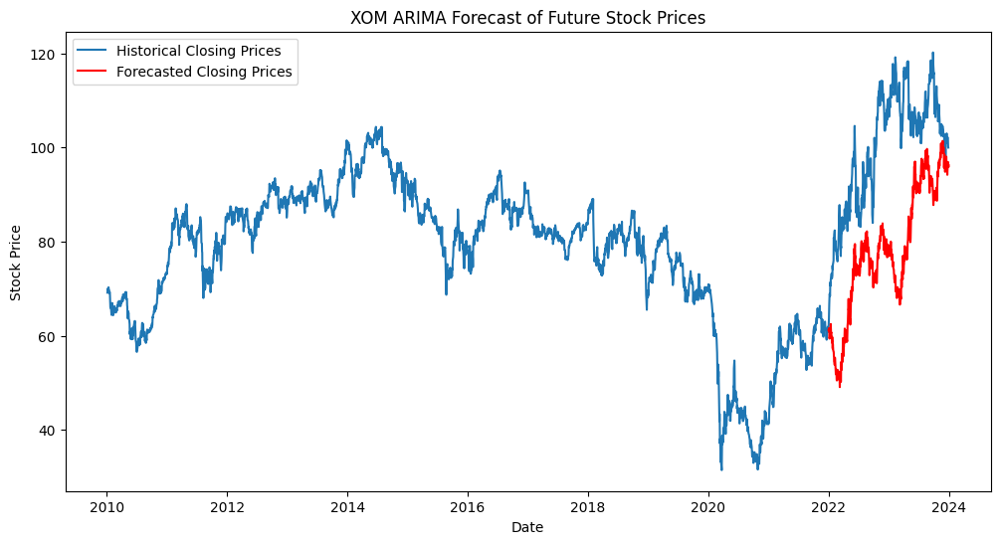

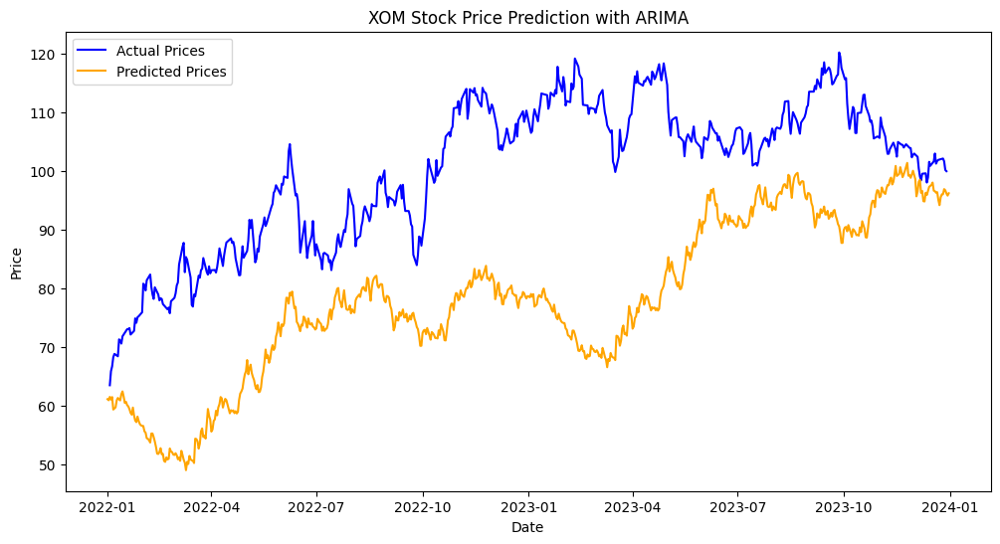

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


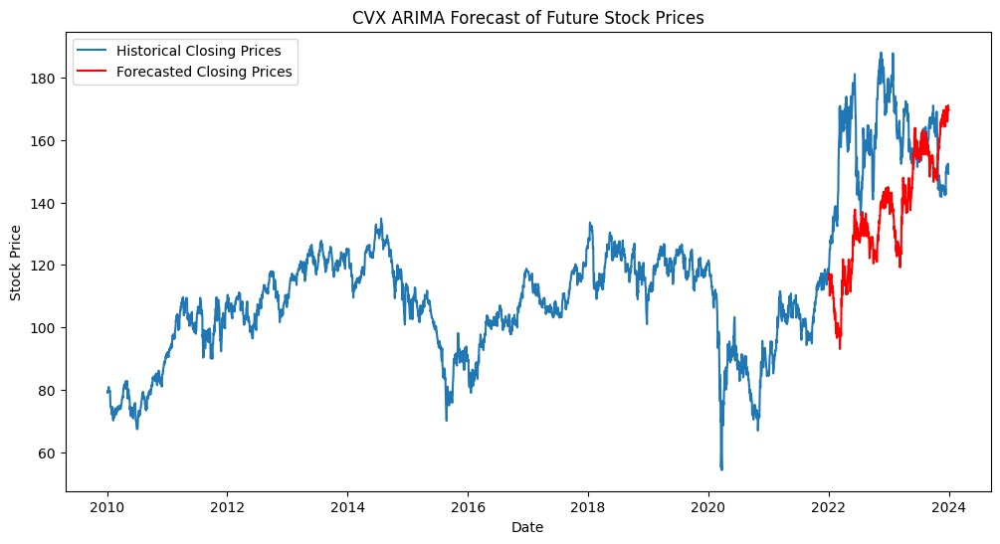

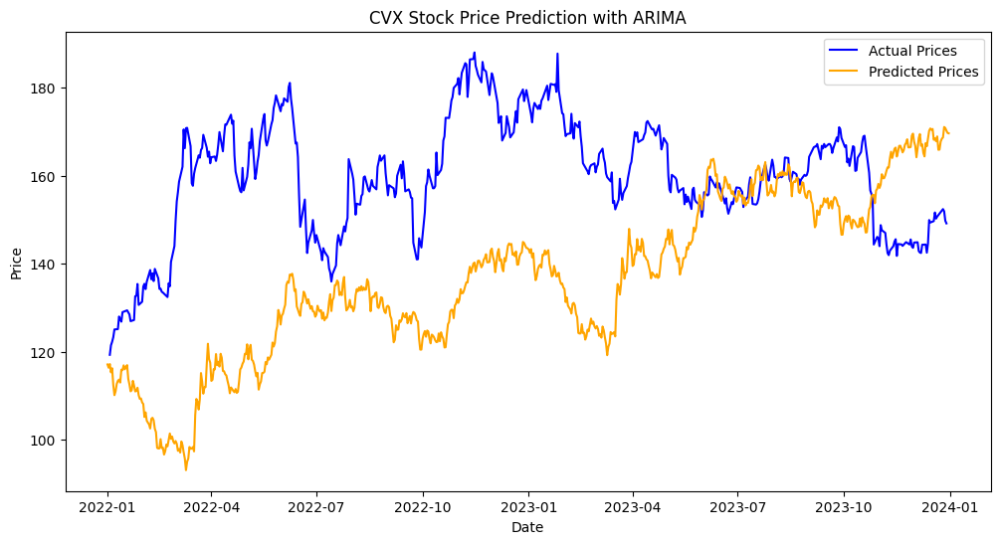

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


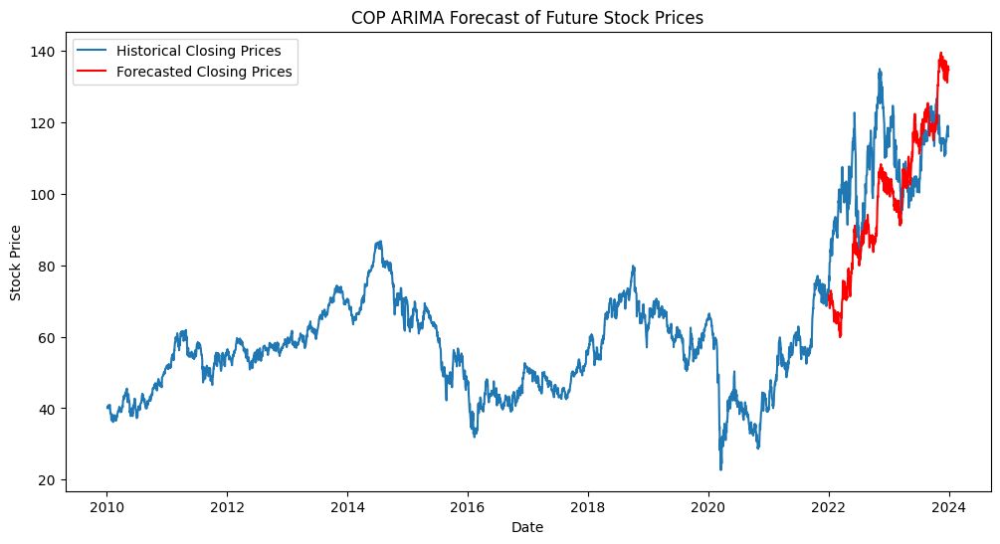

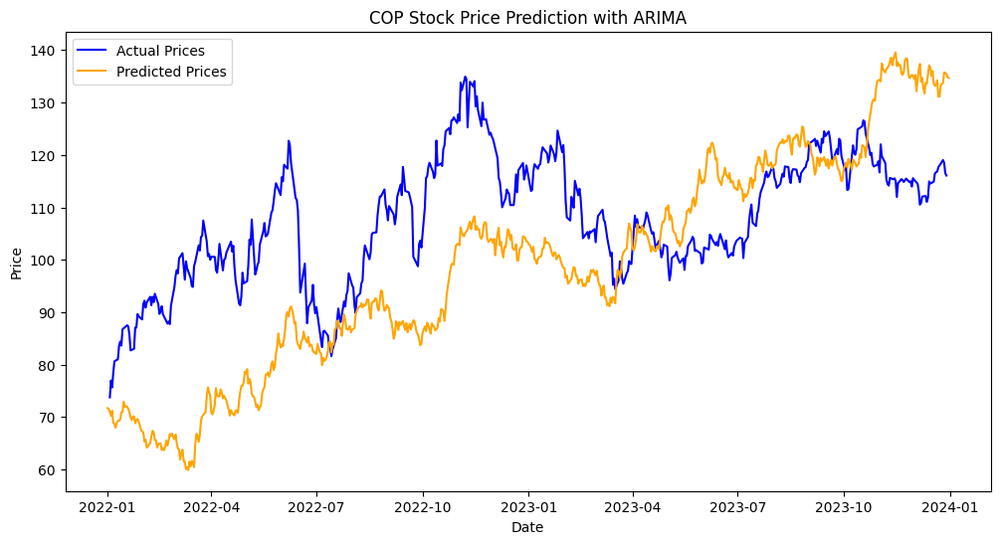

In [ ]:
import yfinance as yf
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import numpy as np

# Function to create a differenced series to make the data stationary
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return np.array(diff)

# Function to invert differenced value
def inverse_difference(history, yhat, interval=1):
    return yhat + history[-interval]

# List of tickers
tickers = ["XOM", "CVX", "COP"]

# Loop through each ticker
for ticker in tickers:
    # Download historical data for each ticker
    historical_data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(ticker, start="2010-01-01", end="2022-01-01")
    close_prices = data['Close'].values

    # Assuming yearly differencing might be needed
    days_in_year = 365
    differenced = difference(close_prices, days_in_year)

    # Fit ARIMA model on the differenced data
    model = ARIMA(differenced, order=(1,1,1))
    model_fit = model.fit()

    # Forecast for the next two years (2022 to 2024)
    forecast = model_fit.forecast(steps=2*365)  # daily data

    # Invert the differenced forecast to something usable
    history = list(close_prices)
    predictions = []
    day = 1
    for yhat in forecast:
        inverted = inverse_difference(history, yhat, days_in_year)
        predictions.append(inverted)
        history.append(inverted)
        day += 1

    # Plotting the results for historical closing prices and forecasts
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.index, historical_data['Close'], label='Historical Closing Prices')
    forecast_index = pd.date_range(start='2022-01-01', periods=730, freq='D')
    plt.plot(forecast_index, predictions, color='red', label='Forecasted Closing Prices')
    plt.title(f'{ticker} ARIMA Forecast of Future Stock Prices')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

    # Plotting actual prices and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.loc['2022-01-01':].index, historical_data.loc['2022-01-01':]['Close'], label='Actual Prices', color='blue')
    plt.plot(forecast_index, predictions, label='Predicted Prices', color='orange')
    plt.legend()
    plt.title(f"{ticker} Stock Price Prediction with ARIMA")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


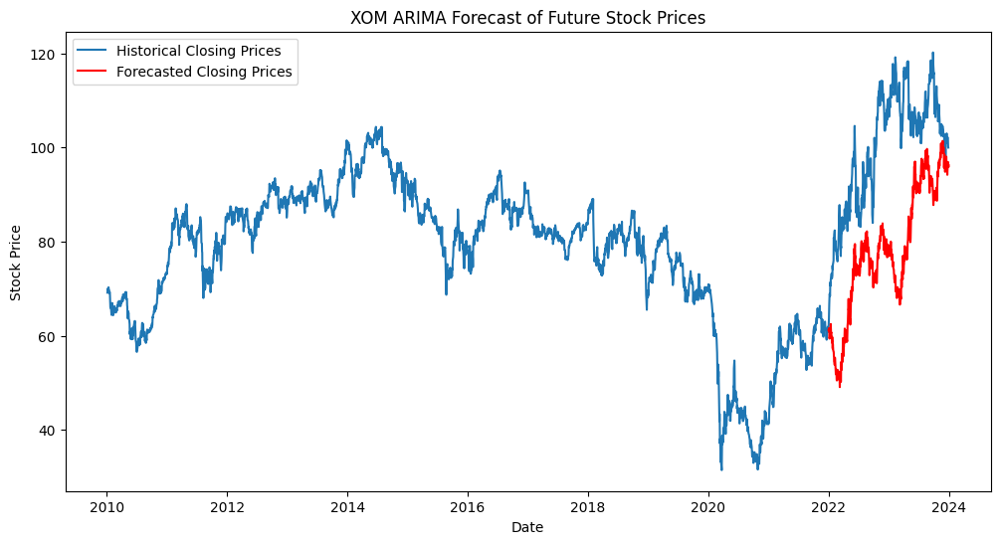

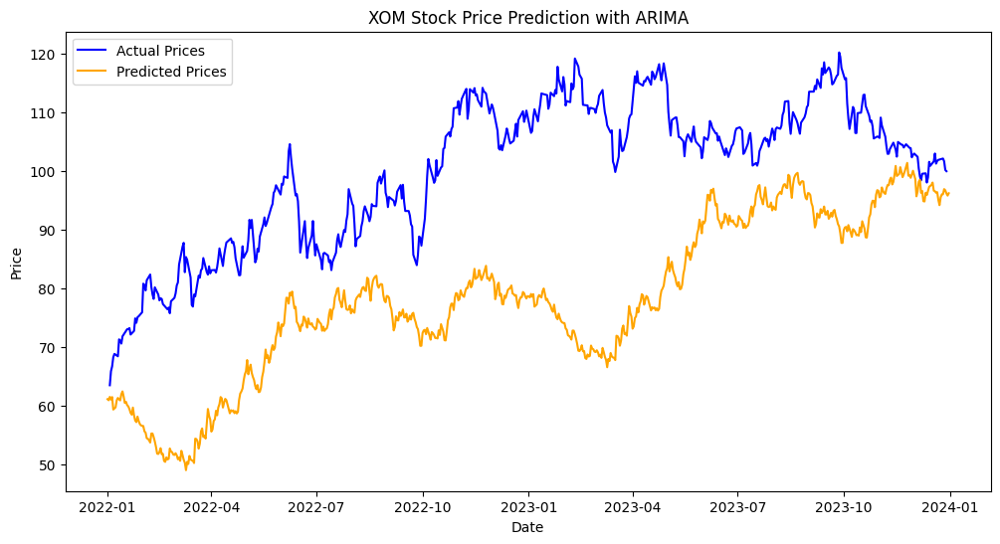

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Average margin of difference for XOM: 29.13
Average margin of difference for XOM (percentage): 28.80%
Directional accuracy for XOM: 47.70%


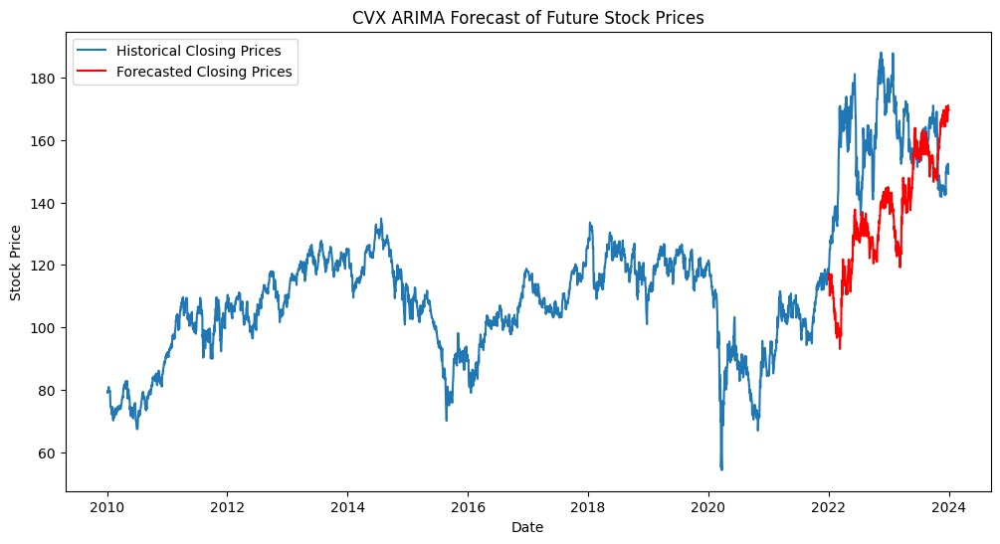

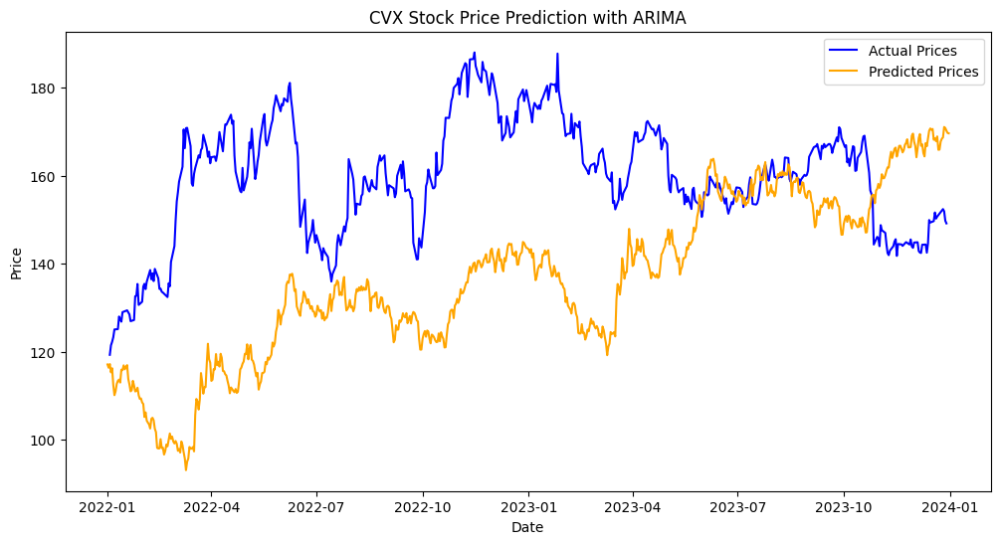

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Average margin of difference for CVX: 32.87
Average margin of difference for CVX (percentage): 20.08%
Directional accuracy for CVX: 50.10%


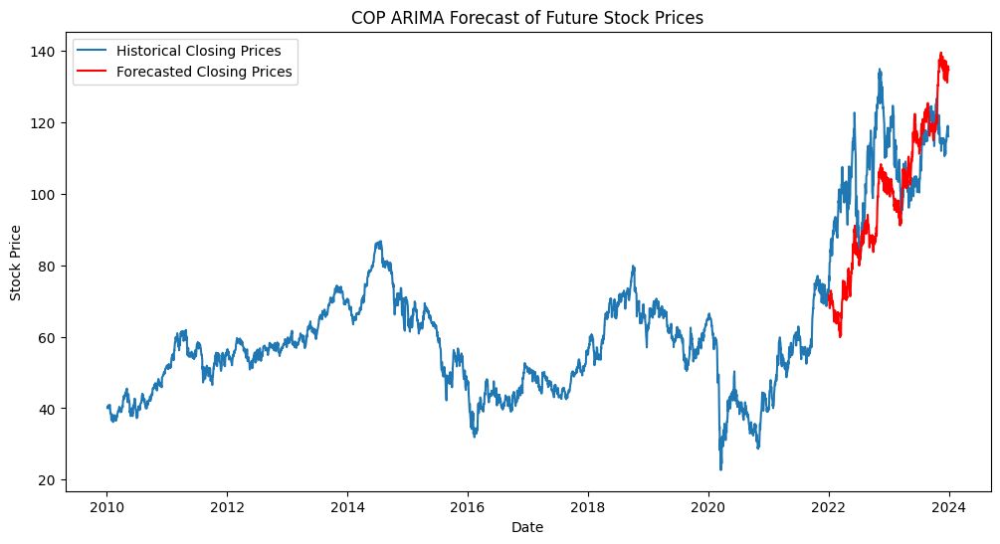

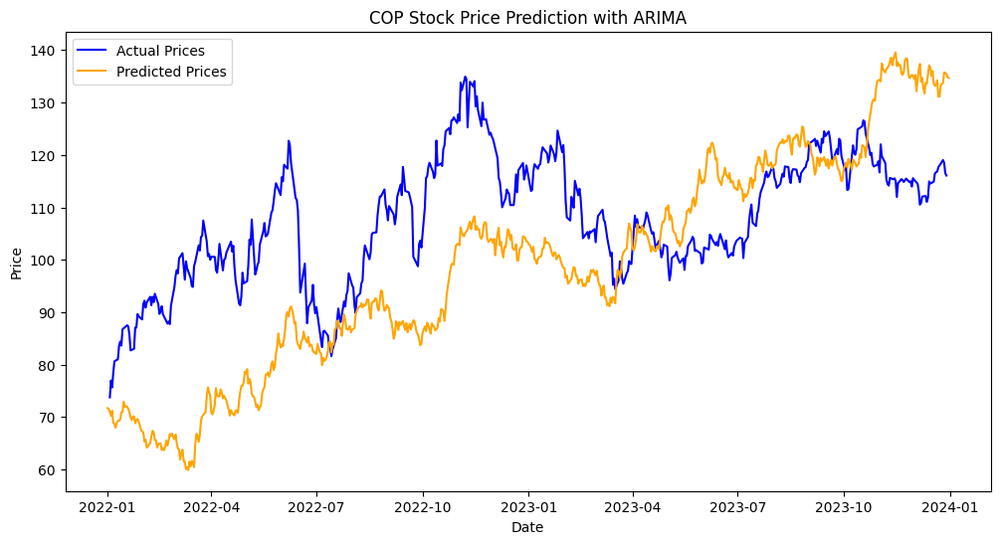


Average margin of difference for COP: 20.34
Average margin of difference for COP (percentage): 18.60%
Directional accuracy for COP: 45.71%


In [ ]:
import yfinance as yf
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import numpy as np

# Function to create a differenced series to make the data stationary
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return np.array(diff)

# Function to invert differenced value
def inverse_difference(history, yhat, interval=1):
    return yhat + history[-interval]

# Function to calculate the average margin of difference between actual and predicted prices
def average_margin_of_difference(actual, predicted):
    margins = actual.values - predicted
    avg_margin = np.mean(np.abs(margins))
    return avg_margin

# Function to calculate the average margin of difference as a percentage
def average_margin_of_difference_percentage(actual, predicted):
    margins = actual.values - predicted
    avg_margin_percentage = np.mean(np.abs(margins) / actual.values) * 100
    return avg_margin_percentage

# Function to calculate directional accuracy
def directional_accuracy(actual, predicted):
    actual_diff = np.sign(np.diff(actual.values, prepend=actual.values[0]))
    predicted_diff = np.sign(np.diff(predicted, prepend=predicted[0]))
    accuracy = np.mean(actual_diff == predicted_diff) * 100
    return accuracy

# List of tickers
tickers = ["XOM", "CVX", "COP"]

# Loop through each ticker
for ticker in tickers:
    # Download historical data for each ticker
    historical_data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(ticker, start="2010-01-01", end="2022-01-01")
    close_prices = data['Close'].values

    # Assuming yearly differencing might be needed
    days_in_year = 365
    differenced = difference(close_prices, days_in_year)

    # Fit ARIMA model on the differenced data
    model = ARIMA(differenced, order=(1,1,1))
    model_fit = model.fit()

    # Forecast for the next two years (2022 to 2024)
    forecast = model_fit.forecast(steps=2*365)  # daily data

    # Invert the differenced forecast to something usable
    history = list(close_prices)
    predictions = []
    day = 1
    for yhat in forecast:
        inverted = inverse_difference(history, yhat, days_in_year)
        predictions.append(inverted)
        history.append(inverted)
        day += 1

    # Plotting the results for historical closing prices and forecasts
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.index, historical_data['Close'], label='Historical Closing Prices')
    forecast_index = pd.date_range(start='2022-01-01', periods=730, freq='D')
    plt.plot(forecast_index, predictions, color='red', label='Forecasted Closing Prices')
    plt.title(f'{ticker} ARIMA Forecast of Future Stock Prices')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

    # Plotting actual prices and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.loc['2022-01-01':].index, historical_data.loc['2022-01-01':]['Close'], label='Actual Prices', color='blue')
    plt.plot(forecast_index, predictions, label='Predicted Prices', color='orange')
    plt.legend()
    plt.title(f"{ticker} Stock Price Prediction with ARIMA")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Calculate and print the average margin of difference
    actual_prices = historical_data.loc['2022-01-01':]['Close']
    predicted_prices = pd.Series(predictions, index=forecast_index)
    avg_margin = average_margin_of_difference(actual_prices, predicted_prices[:len(actual_prices)])
    avg_margin_percentage = average_margin_of_difference_percentage(actual_prices, predicted_prices[:len(actual_prices)])
    direction_accuracy = directional_accuracy(actual_prices, predicted_prices[:len(actual_prices)])

    print(f"\nAverage margin of difference for {ticker}: {avg_margin:.2f}")
    print(f"Average margin of difference for {ticker} (percentage): {avg_margin_percentage:.2f}%")
    print(f"Directional accuracy for {ticker}: {direction_accuracy:.2f}%")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


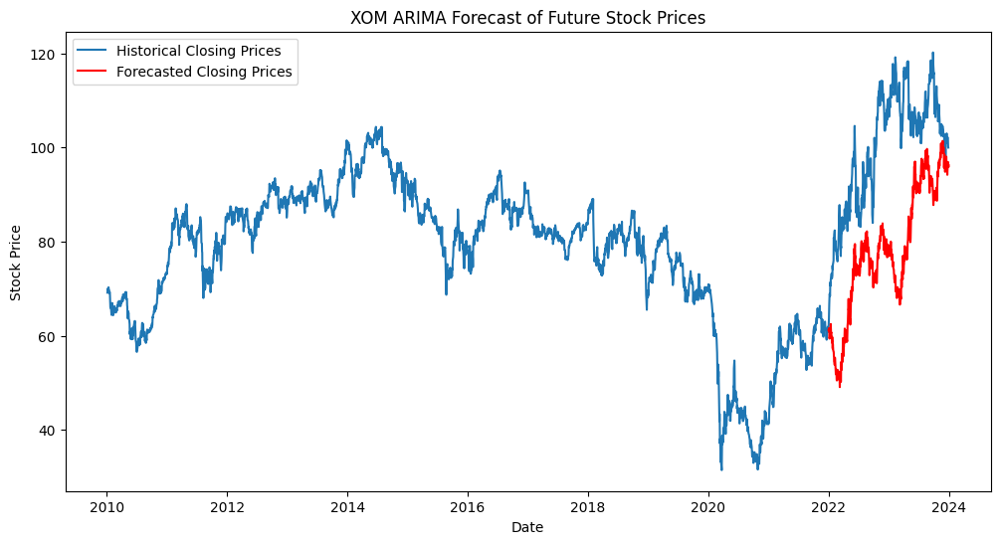

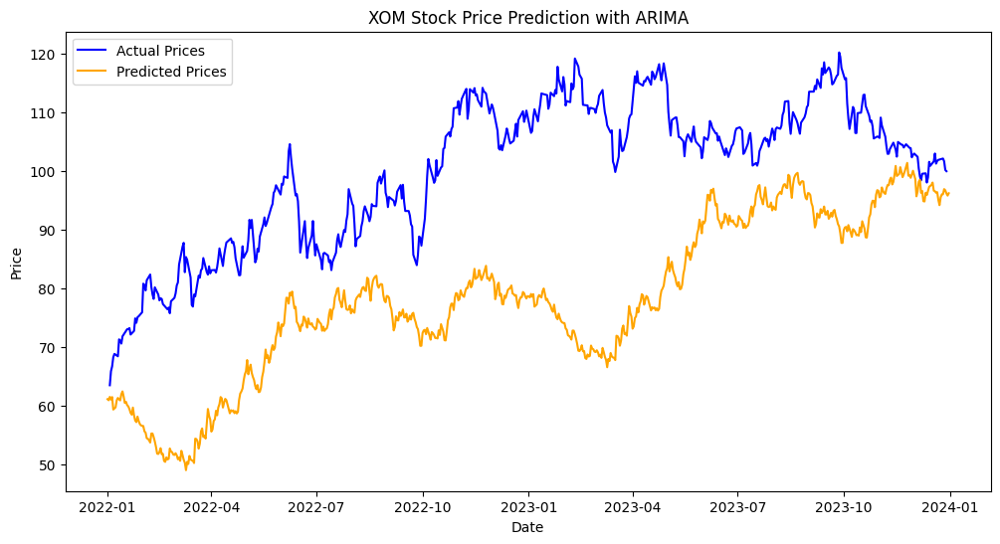

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Average margin of difference for XOM: 25.98
Accuracy of predictions for XOM:
Mean Absolute Error (MAE): 29.13
Mean Squared Error (MSE): 926.42
Root Mean Squared Error (RMSE): 30.44


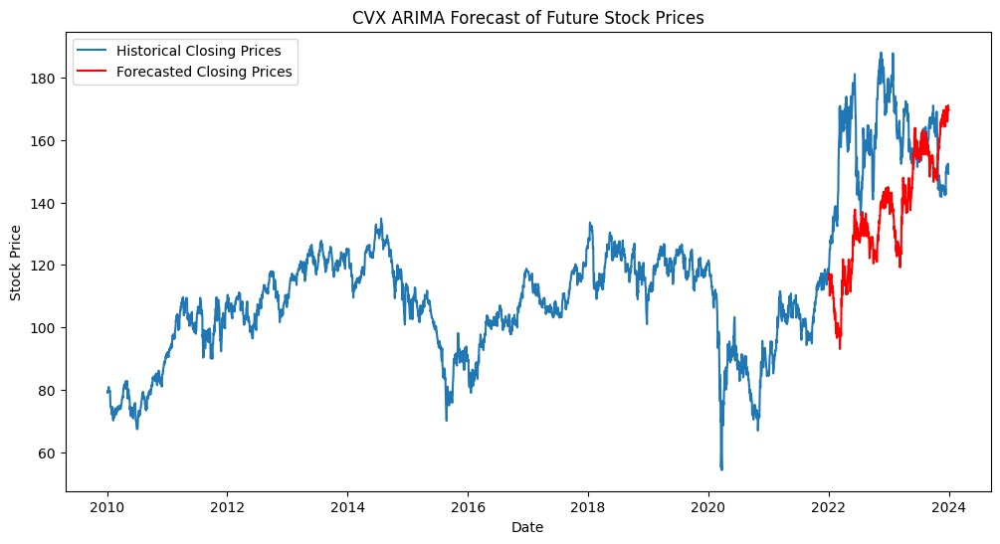

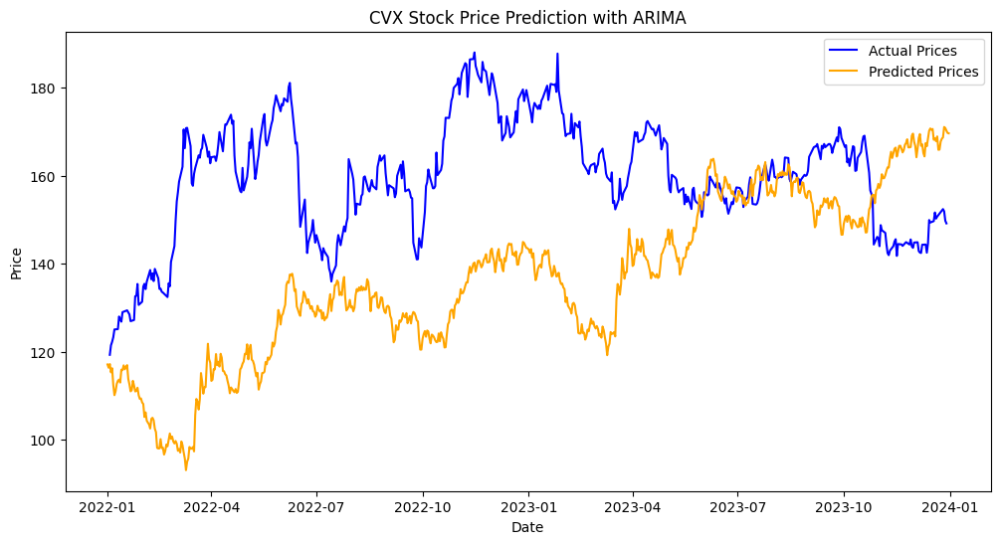

[*********************100%%**********************]  1 of 1 completed

Average margin of difference for CVX: 34.36
Accuracy of predictions for CVX:
Mean Absolute Error (MAE): 32.87
Mean Squared Error (MSE): 1399.85
Root Mean Squared Error (RMSE): 37.41



[*********************100%%**********************]  1 of 1 completed


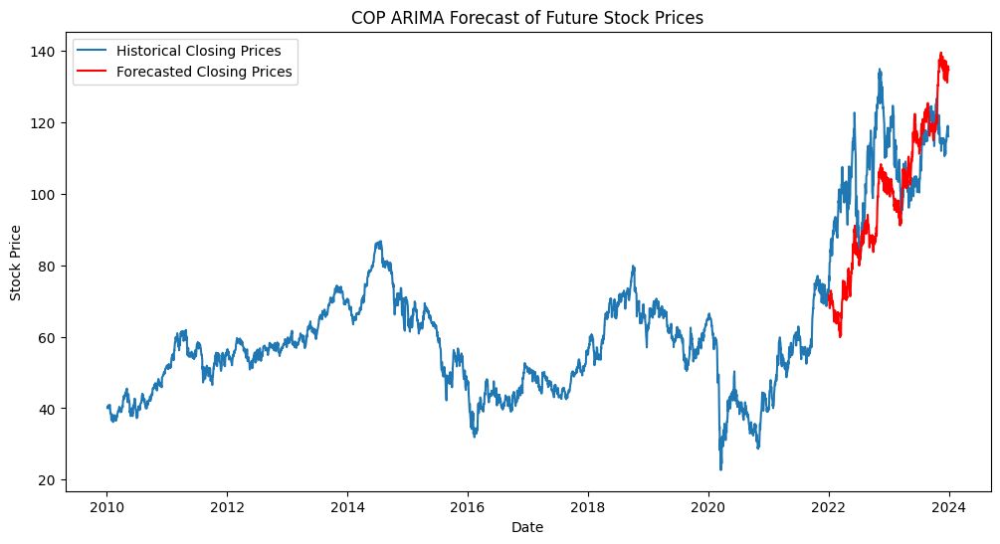

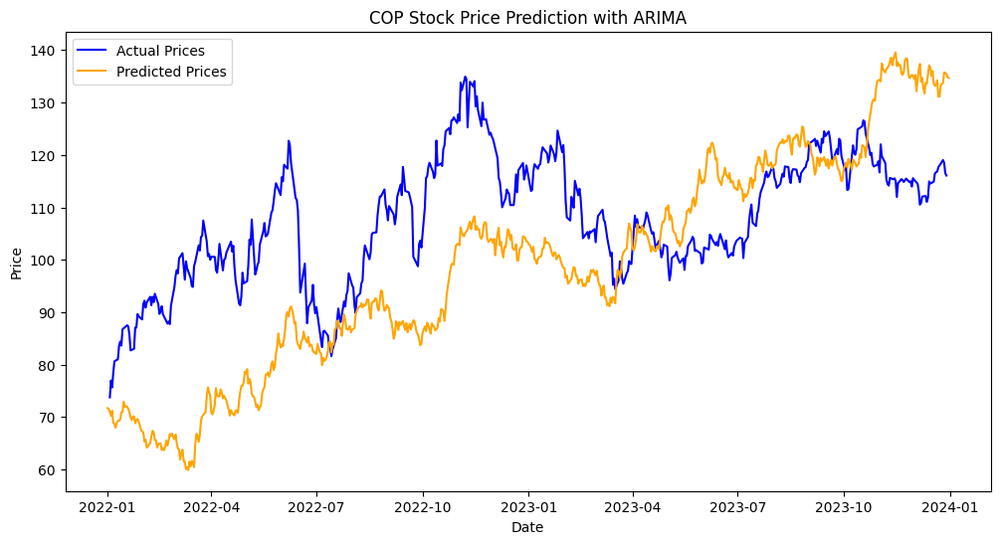

Average margin of difference for COP: 17.72
Accuracy of predictions for COP:
Mean Absolute Error (MAE): 20.34
Mean Squared Error (MSE): 568.71
Root Mean Squared Error (RMSE): 23.85


In [ ]:
import yfinance as yf
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Function to create a differenced series to make the data stationary
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return np.array(diff)

# Function to invert differenced value
def inverse_difference(history, yhat, interval=1):
    return yhat + history[-interval]

# Function to calculate the average margin of difference between actual and predicted prices
def average_margin_of_difference(actual, predicted):
    margins = actual - predicted
    avg_margin = np.mean(np.abs(margins))
    return avg_margin

# Function to assess the accuracy of predictions
def assess_accuracy(actual, predicted):
    mae = mean_absolute_error(actual, predicted)
    mse = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List of tickers
tickers = ["XOM", "CVX", "COP"]

# Loop through each ticker
for ticker in tickers:
    # Download historical data for each ticker
    historical_data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(ticker, start="2010-01-01", end="2022-01-01")
    close_prices = data['Close'].values

    # Assuming yearly differencing might be needed
    days_in_year = 365
    differenced = difference(close_prices, days_in_year)

    # Fit ARIMA model on the differenced data
    model = ARIMA(differenced, order=(1,1,1))
    model_fit = model.fit()

    # Forecast for the next two years (2022 to 2024)
    forecast = model_fit.forecast(steps=2*365)  # daily data

    # Invert the differenced forecast to something usable
    history = list(close_prices)
    predictions = []
    day = 1
    for yhat in forecast:
        inverted = inverse_difference(history, yhat, days_in_year)
        predictions.append(inverted)
        history.append(inverted)
        day += 1

    # Plotting the results for historical closing prices and forecasts
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.index, historical_data['Close'], label='Historical Closing Prices')
    forecast_index = pd.date_range(start='2022-01-01', periods=730, freq='D')
    plt.plot(forecast_index, predictions, color='red', label='Forecasted Closing Prices')
    plt.title(f'{ticker} ARIMA Forecast of Future Stock Prices')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

    # Plotting actual prices and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.loc['2022-01-01':].index, historical_data.loc['2022-01-01':]['Close'], label='Actual Prices', color='blue')
    plt.plot(forecast_index, predictions, label='Predicted Prices', color='orange')
    plt.legend()
    plt.title(f"{ticker} Stock Price Prediction with ARIMA")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Calculate and print the average margin of difference
    actual_prices = historical_data.loc['2022-01-01':]['Close']
    predicted_prices = pd.Series(predictions, index=forecast_index)
    avg_margin = average_margin_of_difference(actual_prices, predicted_prices[:len(actual_prices)])
    print(f"Average margin of difference for {ticker}: {avg_margin:.2f}")

    # Assess and print the accuracy of the predictions
    mae, mse, rmse = assess_accuracy(actual_prices, predicted_prices[:len(actual_prices)])
    print(f"Accuracy of predictions for {ticker}:")
    print(f"Mean Absolute Error (MAE): {mae:.2f}")
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")


#### LSTM

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating XOM


Epoch 1/50
74/74 [==============================] - 15s 137ms/step - loss: 0.0230 - val_loss: 0.0107
Epoch 2/50
74/74 [==============================] - 11s 144ms/step - loss: 0.0020 - val_loss: 0.0040
Epoch 3/50
74/74 [==============================] - 10s 132ms/step - loss: 0.0015 - val_loss: 0.0021
Epoch 4/50
74/74 [==============================] - 7s 91ms/step - loss: 0.0014 - val_loss: 0.0017
Epoch 5/50
74/74 [==============================] - 4s 49ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 6/50
74/74 [==============================] - 4s 58ms/step - loss: 0.0013 - val_loss: 0.0017
Epoch 7/50
74/74 [==============================] - 5s 61ms/step - loss: 0.0013 - val_loss: 0.0016
Epoch 8/50
74/74 [==============================] - 3s 47ms/step - loss: 0.0012 - val_loss: 0.0016
Epoch 9/50
74/74 [==============================] - 3s 45ms/step - loss: 0.0012 - val_loss: 0.0016
Epoch 10/50
74/74 [==============================] - 5s 68ms/step - loss: 0.0011 - val_loss: 0.0015
Epo

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 2s 29ms/step
XOM - Mean Absolute Error (MAE): 101.88059343065277
XOM - Mean Squared Error (MSE): 10467.03632730045
XOM - Root Mean Squared Error (RMSE): 102.30853496800964


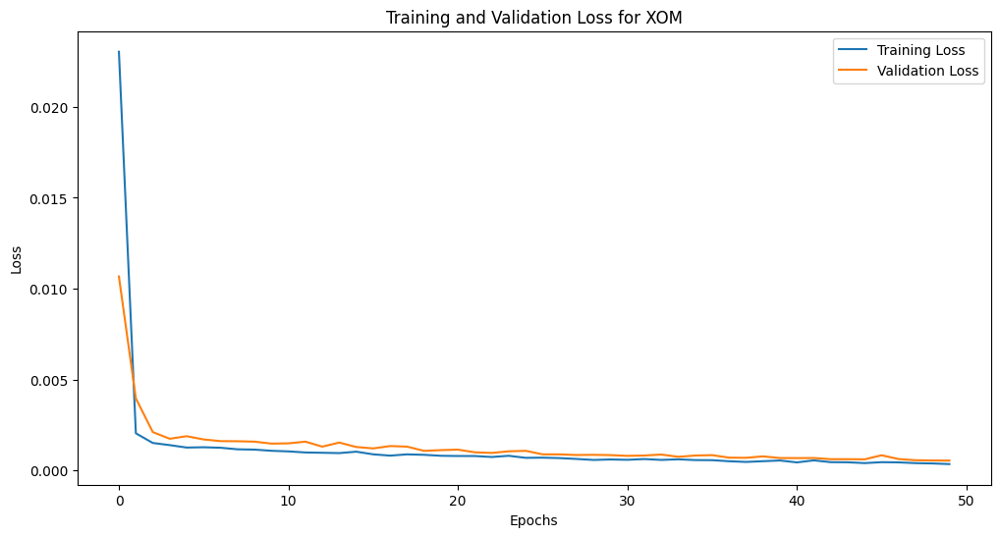

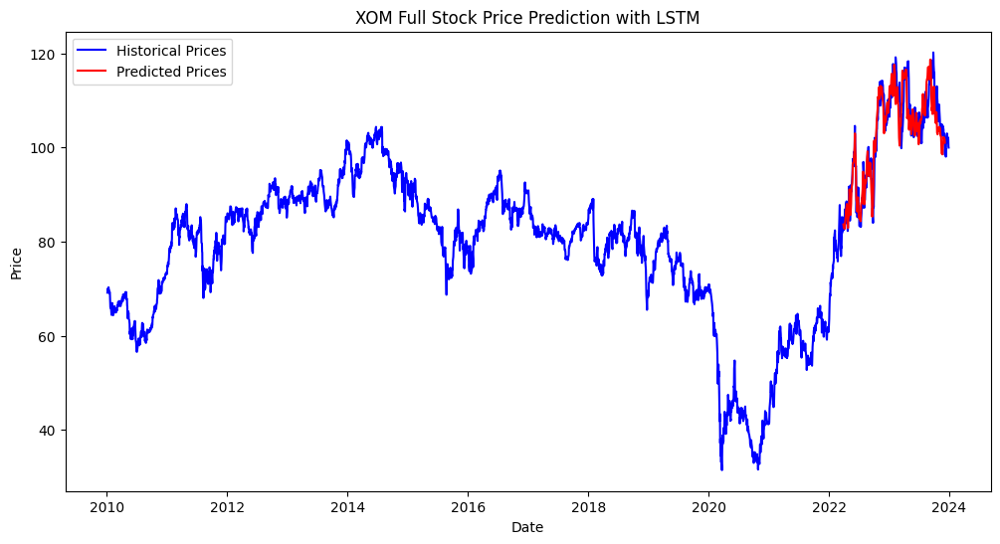

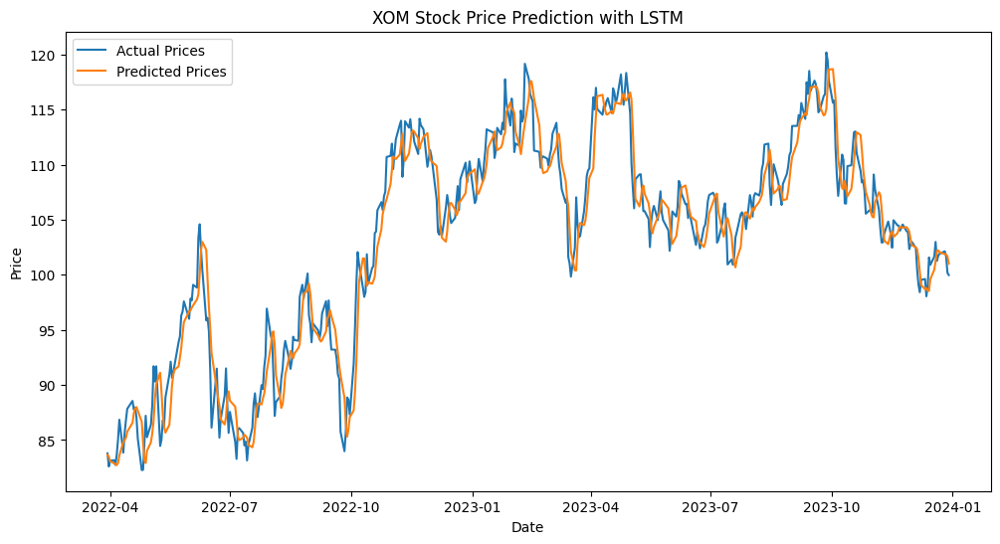

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating CVX


Epoch 1/50
74/74 [==============================] - 9s 79ms/step - loss: 0.0238 - val_loss: 0.0051
Epoch 2/50
74/74 [==============================] - 4s 56ms/step - loss: 0.0022 - val_loss: 0.0039
Epoch 3/50
74/74 [==============================] - 4s 52ms/step - loss: 0.0020 - val_loss: 0.0038
Epoch 4/50
74/74 [==============================] - 3s 47ms/step - loss: 0.0018 - val_loss: 0.0036
Epoch 5/50
74/74 [==============================] - 5s 69ms/step - loss: 0.0017 - val_loss: 0.0035
Epoch 6/50
74/74 [==============================] - 3s 46ms/step - loss: 0.0016 - val_loss: 0.0034
Epoch 7/50
74/74 [==============================] - 4s 50ms/step - loss: 0.0016 - val_loss: 0.0037
Epoch 8/50
74/74 [==============================] - 4s 56ms/step - loss: 0.0015 - val_loss: 0.0033
Epoch 9/50
74/74 [==============================] - 4s 58ms/step - loss: 0.0015 - val_loss: 0.0030
Epoch 10/50
74/74 [==============================] - 4s 48ms/step - loss: 0.0014 - val_loss: 0.0027
Epoch 11/

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 2s 22ms/step
CVX - Mean Absolute Error (MAE): 158.49621892860623
CVX - Mean Squared Error (MSE): 25218.522758253475
CVX - Root Mean Squared Error (RMSE): 158.80340915186133


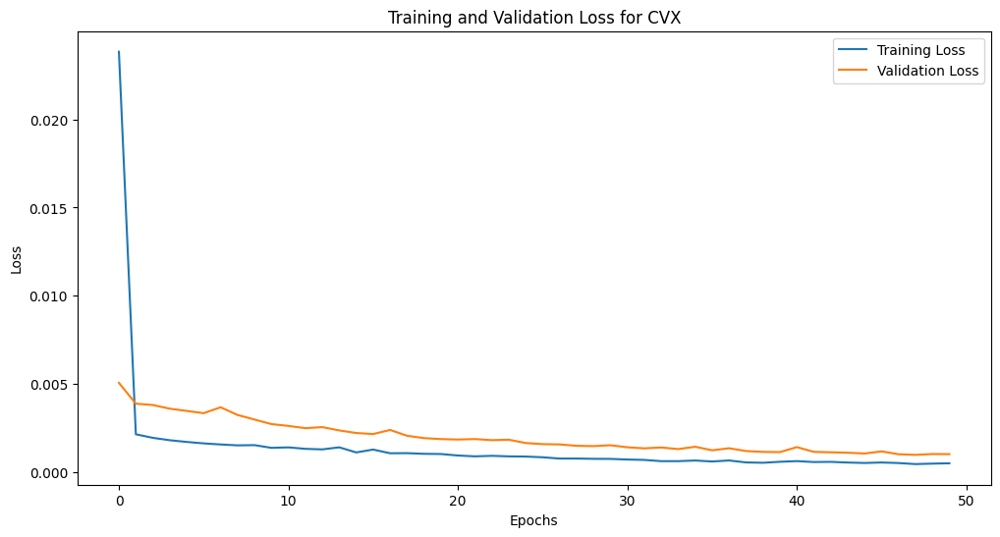

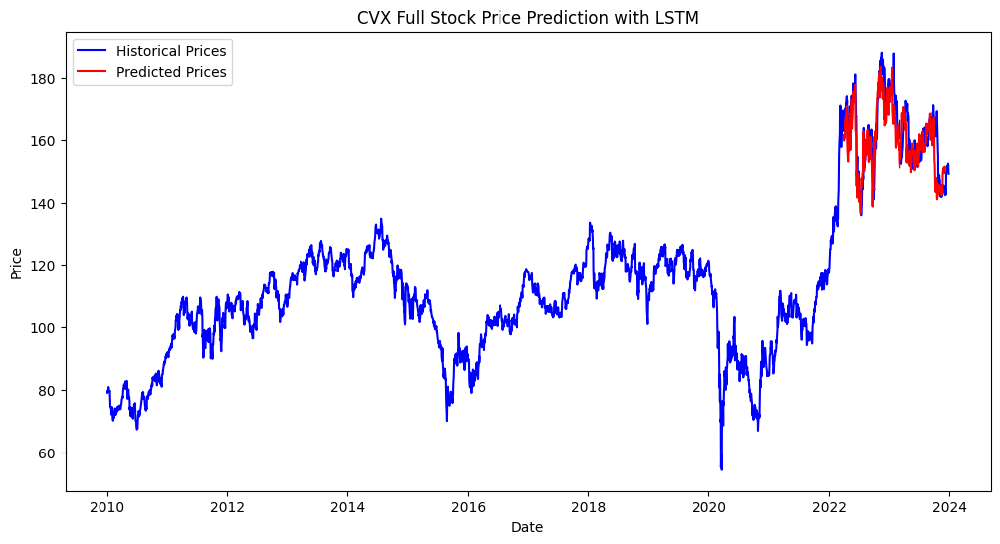

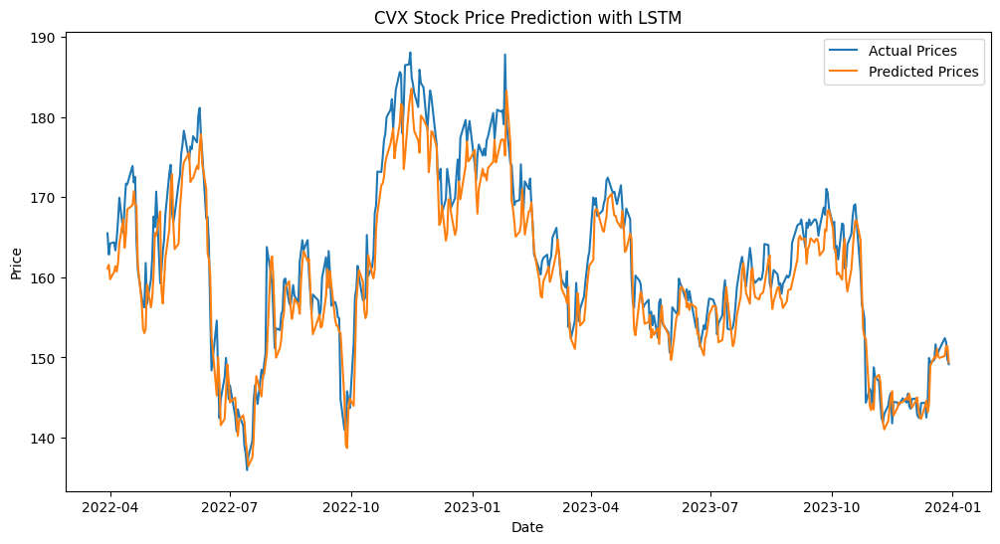

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating COP


Epoch 1/50
74/74 [==============================] - 11s 69ms/step - loss: 0.0212 - val_loss: 0.0043
Epoch 2/50
74/74 [==============================] - 4s 58ms/step - loss: 0.0016 - val_loss: 0.0036
Epoch 3/50
74/74 [==============================] - 4s 53ms/step - loss: 0.0015 - val_loss: 0.0034
Epoch 4/50
74/74 [==============================] - 4s 48ms/step - loss: 0.0014 - val_loss: 0.0032
Epoch 5/50
74/74 [==============================] - 6s 80ms/step - loss: 0.0013 - val_loss: 0.0031
Epoch 6/50
74/74 [==============================] - 4s 48ms/step - loss: 0.0012 - val_loss: 0.0028
Epoch 7/50
74/74 [==============================] - 4s 51ms/step - loss: 0.0012 - val_loss: 0.0028
Epoch 8/50
74/74 [==============================] - 5s 69ms/step - loss: 0.0011 - val_loss: 0.0025
Epoch 9/50
74/74 [==============================] - 4s 54ms/step - loss: 0.0011 - val_loss: 0.0024
Epoch 10/50
74/74 [==============================] - 4s 48ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 11

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 17ms/step
COP - Mean Absolute Error (MAE): 107.22543669544426
COP - Mean Squared Error (MSE): 11598.637758629828
COP - Root Mean Squared Error (RMSE): 107.69697191021588


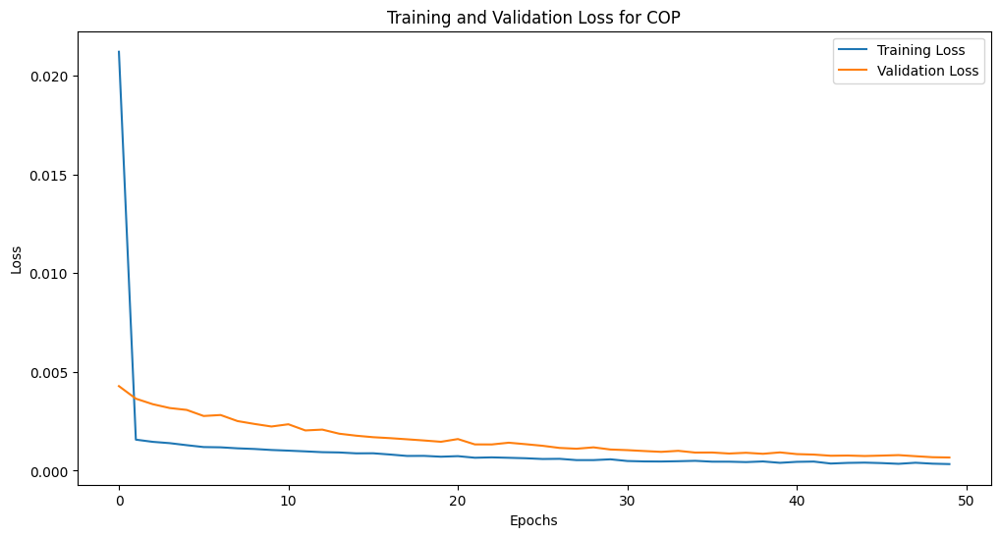

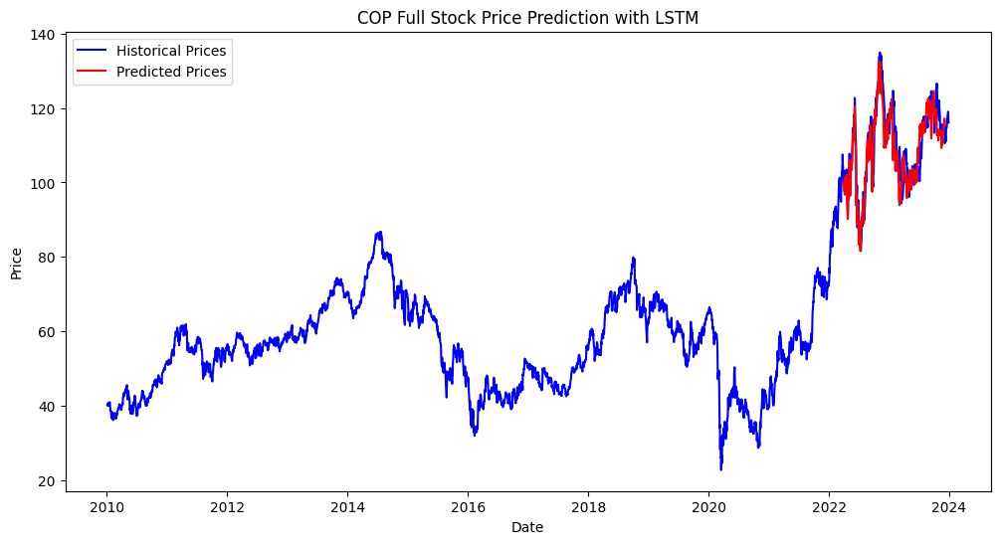

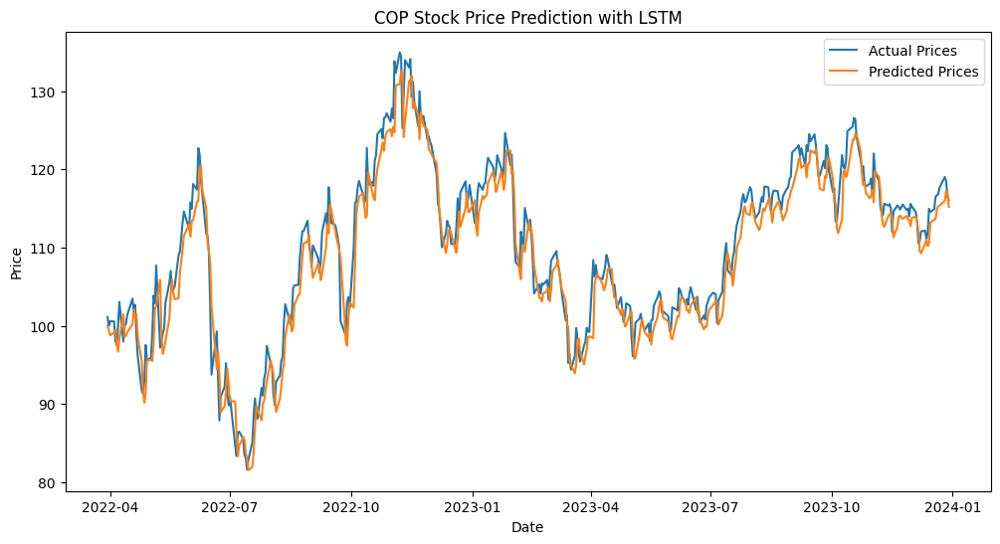

CPU times: user 14min 52s, sys: 17.9 s, total: 15min 10s
Wall time: 12min 43s


In [ ]:
%%time
 # Import Libraries
import yfinance as yf
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import math

# Function to create LSTM model and evaluate it
def evaluate_lstm(stock_ticker):
    print(f"Evaluating {stock_ticker}")

    # Fetch Data
    historical_data = yf.download(stock_ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(stock_ticker, start="2010-01-01", end="2022-01-01")
    closing_prices = data['Close']
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(closing_prices.values.reshape(-1, 1))

    # Prepare Data
    SEQ_LENGTH = 60
    x, y = create_sequences(scaled_data, SEQ_LENGTH)
    split = int(0.8 * len(x))
    x_train, x_val = x[:split], x[split:]
    y_train, y_val = y[:split], y[split:]

    # Build Model
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(SEQ_LENGTH, 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train Model
    history = model.fit(x_train, y_train, validation_data=(x_val, y_val), batch_size=32, epochs=50)

    # Evaluate Model
    test_data = yf.download(stock_ticker, start="2022-01-01", end="2024-01-01")
    scaled_test_data = scaler.transform(test_data['Close'].values.reshape(-1, 1))
    x_test, y_test = create_sequences(scaled_test_data, SEQ_LENGTH)

    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Calculate error metrics
    mae = mean_absolute_error(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    rmse = math.sqrt(mse)

    print(f"{stock_ticker} - Mean Absolute Error (MAE): {mae}")
    print(f"{stock_ticker} - Mean Squared Error (MSE): {mse}")
    print(f"{stock_ticker} - Root Mean Squared Error (RMSE): {rmse}")

    # Plot training and validation loss
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title(f"Training and Validation Loss for {stock_ticker}")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(historical_data['Close'], label='Historical Prices', color='blue')
    forecast_dates = pd.date_range(start=test_data.index[SEQ_LENGTH], periods=len(predictions), freq='B')
    plt.plot(forecast_dates, predictions.flatten(), label='Predicted Prices', color='red')
    plt.legend()
    plt.title(f"{stock_ticker} Full Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Plot actual vs predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(test_data.index[SEQ_LENGTH:], test_data['Close'][SEQ_LENGTH:], label='Actual Prices')
    plt.plot(test_data.index[SEQ_LENGTH:], predictions, label='Predicted Prices')
    plt.legend()
    plt.title(f"{stock_ticker} Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()


# Helper function to create sequences
def create_sequences(data, seq_length):
    x = []
    y = []
    for i in range(seq_length, len(data)):
        x.append(data[i - seq_length:i])
        y.append(data[i])
    return np.array(x), np.array(y)


# Evaluate for multiple stocks
for sector in [""]
  for ticker in ["XOM", "CVX", "COP"]:
      evaluate_lstm(ticker)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating XOM


Epoch 1/50
74/74 [==============================] - 8s 65ms/step - loss: 0.0226 - val_loss: 0.0127
Epoch 2/50
74/74 [==============================] - 5s 65ms/step - loss: 0.0021 - val_loss: 0.0046
Epoch 3/50
74/74 [==============================] - 4s 49ms/step - loss: 0.0015 - val_loss: 0.0025
Epoch 4/50
74/74 [==============================] - 4s 50ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 5/50
74/74 [==============================] - 5s 74ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 6/50
74/74 [==============================] - 4s 51ms/step - loss: 0.0012 - val_loss: 0.0017
Epoch 7/50
74/74 [==============================] - 4s 51ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 8/50
74/74 [==============================] - 5s 70ms/step - loss: 0.0011 - val_loss: 0.0015
Epoch 9/50
74/74 [==============================] - 4s 52ms/step - loss: 0.0010 - val_loss: 0.0017
Epoch 10/50
74/74 [==============================] - 4s 49ms/step - loss: 0.0010 - val_loss: 0.0013
Epoch 11/

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 2s 25ms/step
XOM - Mean Absolute Error (MAE): 102.55467152645
XOM - Mean Squared Error (MSE): 10606.154549191724
XOM - Root Mean Squared Error (RMSE): 102.98618620568355


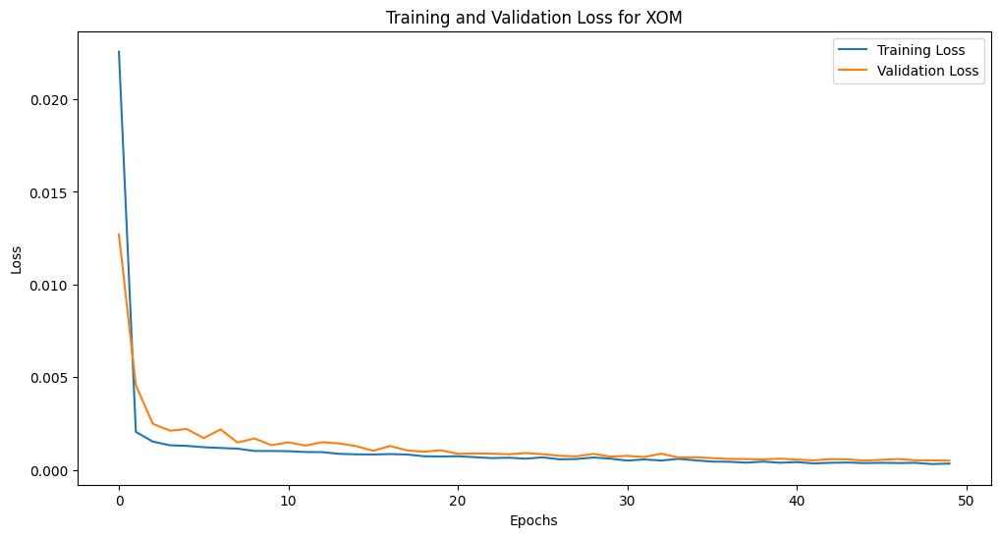

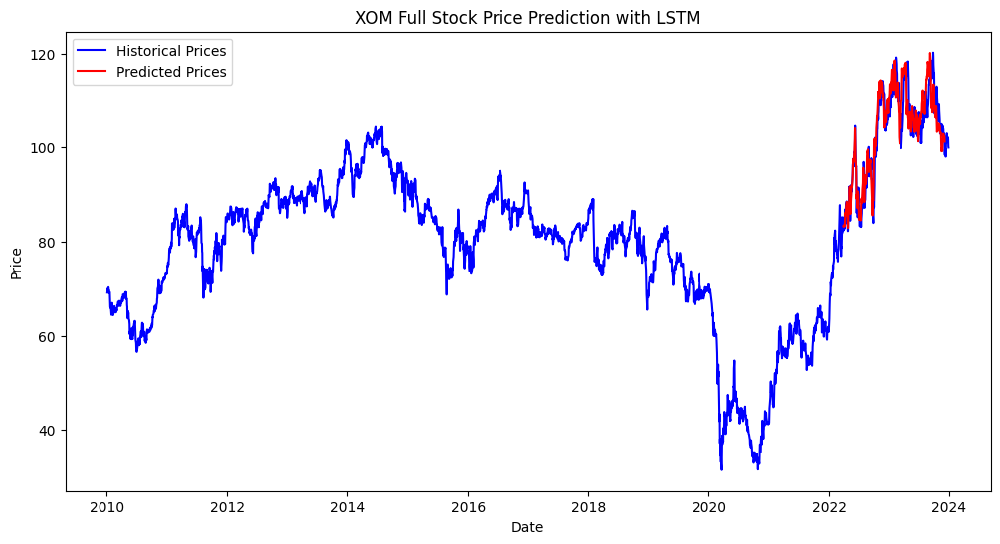

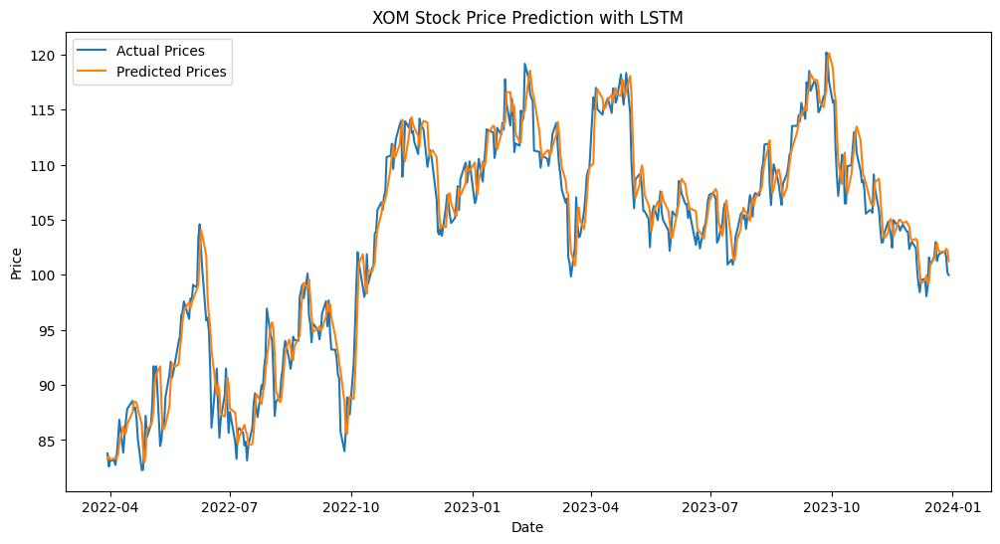

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Average margin of difference for XOM: 1.61
Average margin of difference for XOM (percentage): 1.59%
Directional accuracy for XOM: 50.57%
Evaluating CVX


Epoch 1/50
74/74 [==============================] - 8s 64ms/step - loss: 0.0284 - val_loss: 0.0056
Epoch 2/50
74/74 [==============================] - 5s 74ms/step - loss: 0.0024 - val_loss: 0.0039
Epoch 3/50
74/74 [==============================] - 4s 52ms/step - loss: 0.0020 - val_loss: 0.0038
Epoch 4/50
74/74 [==============================] - 4s 51ms/step - loss: 0.0020 - val_loss: 0.0037
Epoch 5/50
74/74 [==============================] - 5s 73ms/step - loss: 0.0018 - val_loss: 0.0036
Epoch 6/50
74/74 [==============================] - 4s 52ms/step - loss: 0.0017 - val_loss: 0.0033
Epoch 7/50
74/74 [==============================] - 4s 52ms/step - loss: 0.0017 - val_loss: 0.0032
Epoch 8/50
74/74 [==============================] - 5s 66ms/step - loss: 0.0016 - val_loss: 0.0031
Epoch 9/50
74/74 [==============================] - 4s 57ms/step - loss: 0.0015 - val_loss: 0.0030
Epoch 10/50
74/74 [==============================] - 4s 52ms/step - loss: 0.0014 - val_loss: 0.0028
Epoch 11/

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 18ms/step
CVX - Mean Absolute Error (MAE): 158.53511673056553
CVX - Mean Squared Error (MSE): 25242.780263494824
CVX - Root Mean Squared Error (RMSE): 158.8797666900818


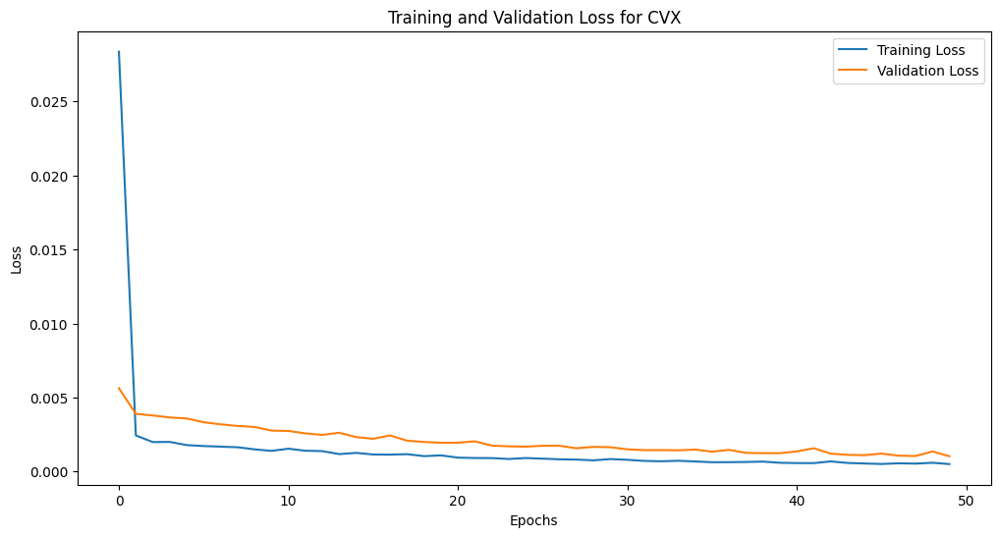

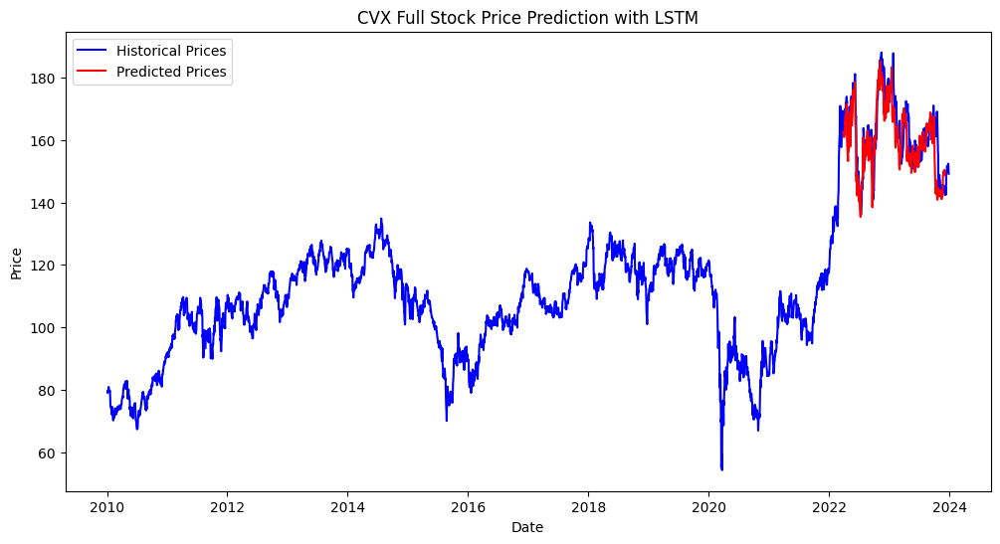

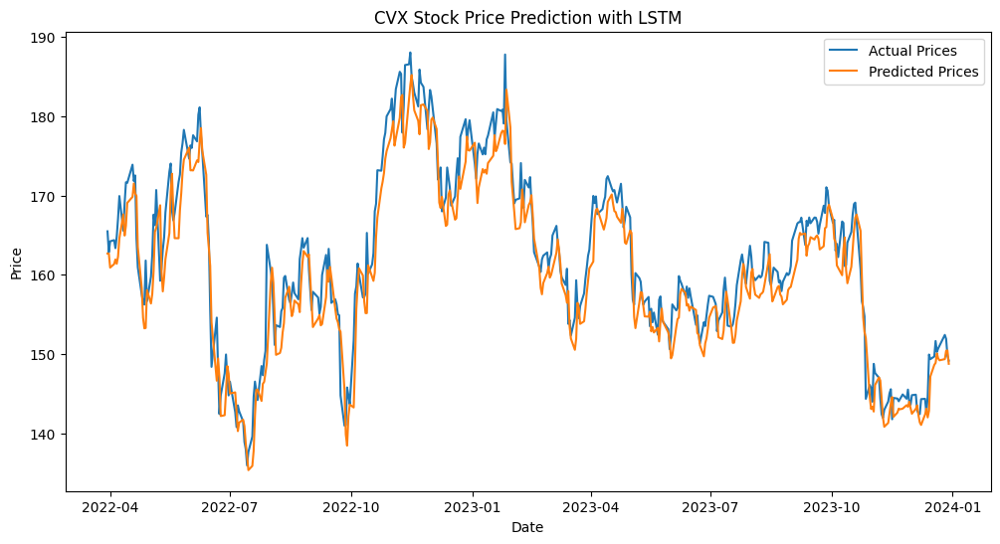

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Average margin of difference for CVX: 2.89
Average margin of difference for CVX (percentage): 1.77%
Directional accuracy for CVX: 50.11%
Evaluating COP


Epoch 1/50
74/74 [==============================] - 11s 73ms/step - loss: 0.0176 - val_loss: 0.0038
Epoch 2/50
74/74 [==============================] - 4s 59ms/step - loss: 0.0015 - val_loss: 0.0033
Epoch 3/50
74/74 [==============================] - 5s 73ms/step - loss: 0.0014 - val_loss: 0.0032
Epoch 4/50
74/74 [==============================] - 4s 55ms/step - loss: 0.0013 - val_loss: 0.0029
Epoch 5/50
74/74 [==============================] - 4s 57ms/step - loss: 0.0013 - val_loss: 0.0028
Epoch 6/50
74/74 [==============================] - 6s 75ms/step - loss: 0.0013 - val_loss: 0.0027
Epoch 7/50
74/74 [==============================] - 4s 55ms/step - loss: 0.0012 - val_loss: 0.0025
Epoch 8/50
74/74 [==============================] - 4s 55ms/step - loss: 0.0012 - val_loss: 0.0026
Epoch 9/50
74/74 [==============================] - 6s 81ms/step - loss: 0.0011 - val_loss: 0.0023
Epoch 10/50
74/74 [==============================] - 4s 58ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 11

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 2s 30ms/step
COP - Mean Absolute Error (MAE): 106.47378611659293
COP - Mean Squared Error (MSE): 11433.850830886291
COP - Root Mean Squared Error (RMSE): 106.92918605734494


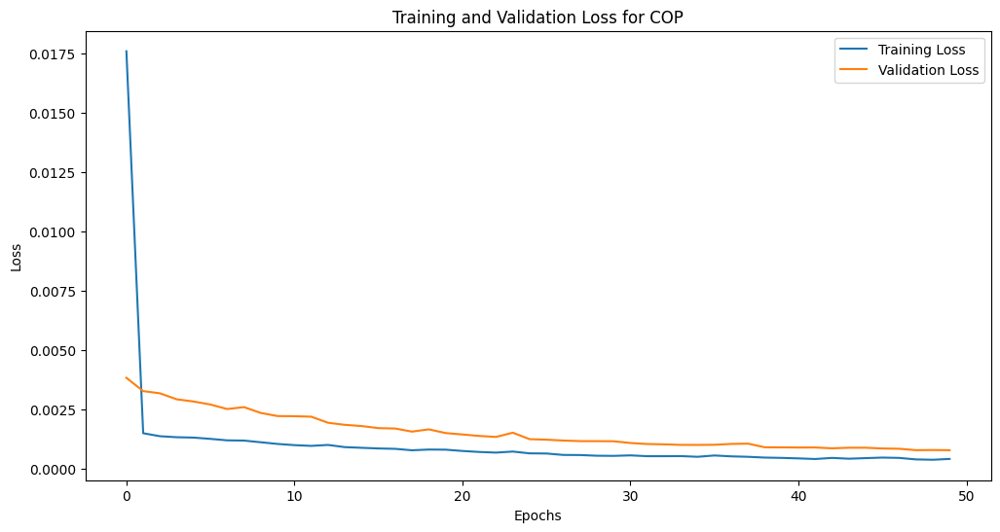

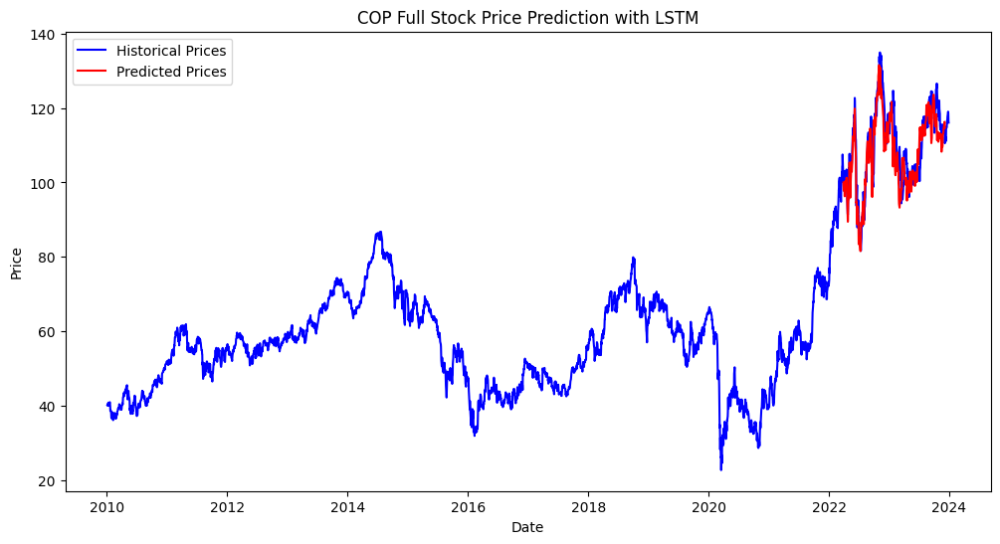

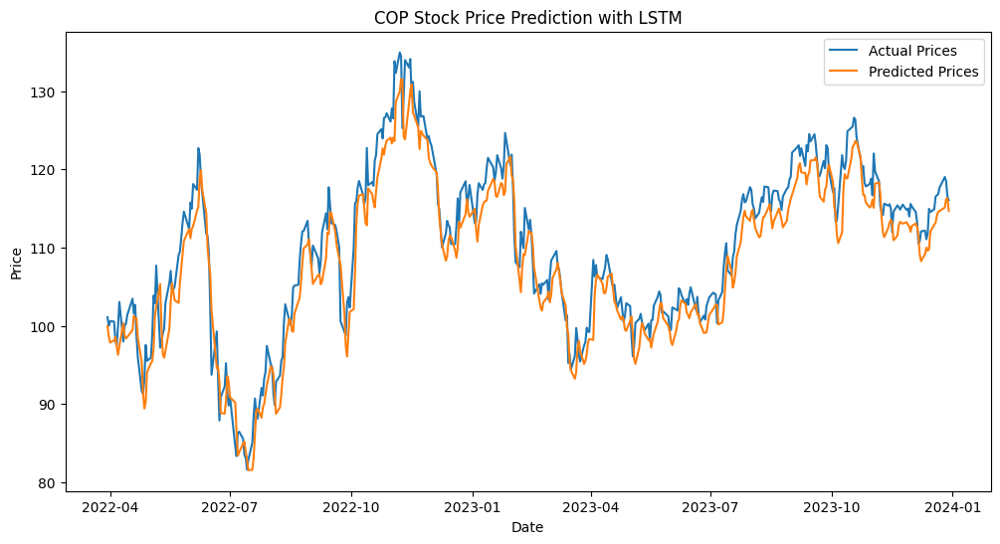

Average margin of difference for COP: 2.71
Average margin of difference for COP (percentage): 2.46%
Directional accuracy for COP: 50.57%


In [ ]:
# Import Libraries
import yfinance as yf
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import math

# Function to create LSTM model and evaluate it
def evaluate_lstm(stock_ticker):
    print(f"Evaluating {stock_ticker}")

    # Fetch Data
    historical_data = yf.download(stock_ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(stock_ticker, start="2010-01-01", end="2022-01-01")
    closing_prices = data['Close']
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(closing_prices.values.reshape(-1, 1))

    # Prepare Data
    SEQ_LENGTH = 60
    x, y = create_sequences(scaled_data, SEQ_LENGTH)
    split = int(0.8 * len(x))
    x_train, x_val = x[:split], x[split:]
    y_train, y_val = y[:split], y[split:]

    # Build Model
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(SEQ_LENGTH, 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train Model
    history = model.fit(x_train, y_train, validation_data=(x_val, y_val), batch_size=32, epochs=50)

    # Evaluate Model
    test_data = yf.download(stock_ticker, start="2022-01-01", end="2024-01-01")
    scaled_test_data = scaler.transform(test_data['Close'].values.reshape(-1, 1))
    x_test, y_test = create_sequences(scaled_test_data, SEQ_LENGTH)

    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Calculate error metrics
    mae = mean_absolute_error(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    rmse = math.sqrt(mse)

    print(f"{stock_ticker} - Mean Absolute Error (MAE): {mae}")
    print(f"{stock_ticker} - Mean Squared Error (MSE): {mse}")
    print(f"{stock_ticker} - Root Mean Squared Error (RMSE): {rmse}")

    # Plot training and validation loss
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title(f"Training and Validation Loss for {stock_ticker}")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(historical_data['Close'], label='Historical Prices', color='blue')
    forecast_dates = pd.date_range(start=test_data.index[SEQ_LENGTH], periods=len(predictions), freq='B')
    plt.plot(forecast_dates, predictions.flatten(), label='Predicted Prices', color='red')
    plt.legend()
    plt.title(f"{stock_ticker} Full Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Plot actual vs predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(test_data.index[SEQ_LENGTH:], test_data['Close'][SEQ_LENGTH:], label='Actual Prices')
    plt.plot(test_data.index[SEQ_LENGTH:], predictions, label='Predicted Prices')
    plt.legend()
    plt.title(f"{stock_ticker} Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Calculate and print the average margin of difference
    avg_margin = average_margin_of_difference(test_data['Close'][SEQ_LENGTH:], predictions.flatten())
    avg_margin_percentage = average_margin_of_difference_percentage(test_data['Close'][SEQ_LENGTH:], predictions.flatten())
    direction_accuracy = directional_accuracy(test_data['Close'][SEQ_LENGTH:], predictions.flatten())

    print(f"Average margin of difference for {stock_ticker}: {avg_margin:.2f}")
    print(f"Average margin of difference for {stock_ticker} (percentage): {avg_margin_percentage:.2f}%")
    print(f"Directional accuracy for {stock_ticker}: {direction_accuracy:.2f}%")

# Helper function to create sequences
def create_sequences(data, seq_length):
    x = []
    y = []
    for i in range(seq_length, len(data)):
        x.append(data[i - seq_length:i])
        y.append(data[i])
    return np.array(x), np.array(y)

# Function to calculate the average margin of difference between actual and predicted prices
def average_margin_of_difference(actual, predicted):
    margins = actual.values - predicted
    avg_margin = np.mean(np.abs(margins))
    return avg_margin

# Function to calculate the average margin of difference as a percentage
def average_margin_of_difference_percentage(actual, predicted):
    margins = actual.values - predicted
    avg_margin_percentage = np.mean(np.abs(margins) / actual.values) * 100
    return avg_margin_percentage

# Function to calculate directional accuracy
def directional_accuracy(actual, predicted):
    actual_diff = np.sign(np.diff(actual.values, prepend=actual.values[0]))
    predicted_diff = np.sign(np.diff(predicted, prepend=predicted[0]))
    accuracy = np.mean(actual_diff == predicted_diff) * 100
    return accuracy

# Evaluate for multiple stocks
for ticker in ["XOM", "CVX", "COP"]:
    evaluate_lstm(ticker)


#### FB Prophet

##### Forecast start - 2022

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/ar0hhm49.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/crhzv8ao.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51266', 'data', 'file=/tmp/tmp3z430iy9/ar0hhm49.json', 'init=/tmp/tmp3z430iy9/crhzv8ao.json', 'output', 'file=/tmp/tmp3z430iy9/prophet_modelsv1va7sd/prophet_model-20240513162003.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:20:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:20:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


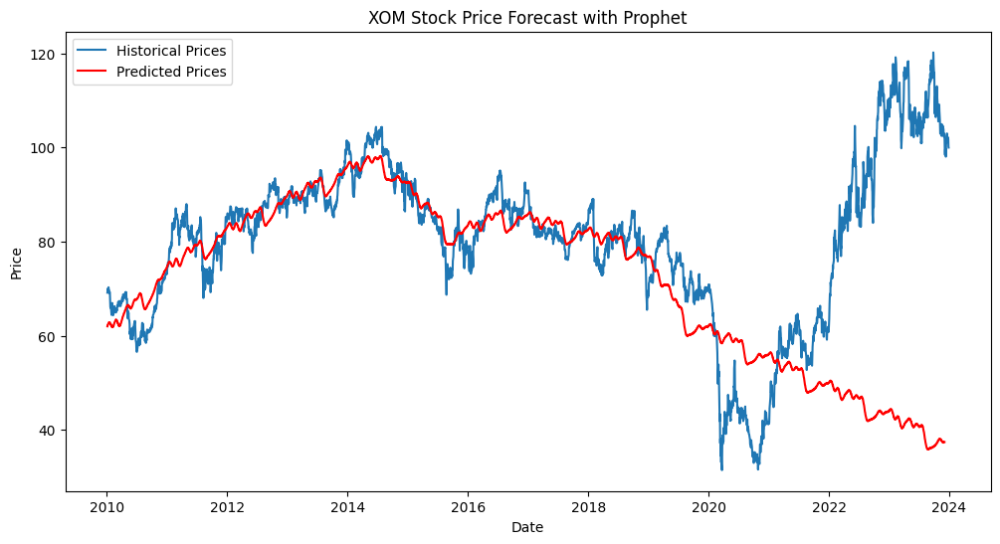

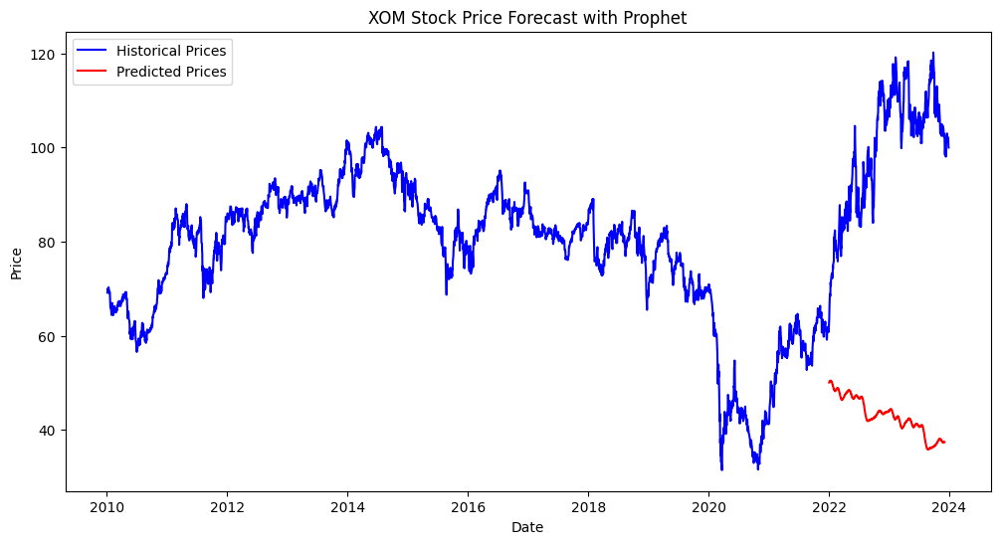

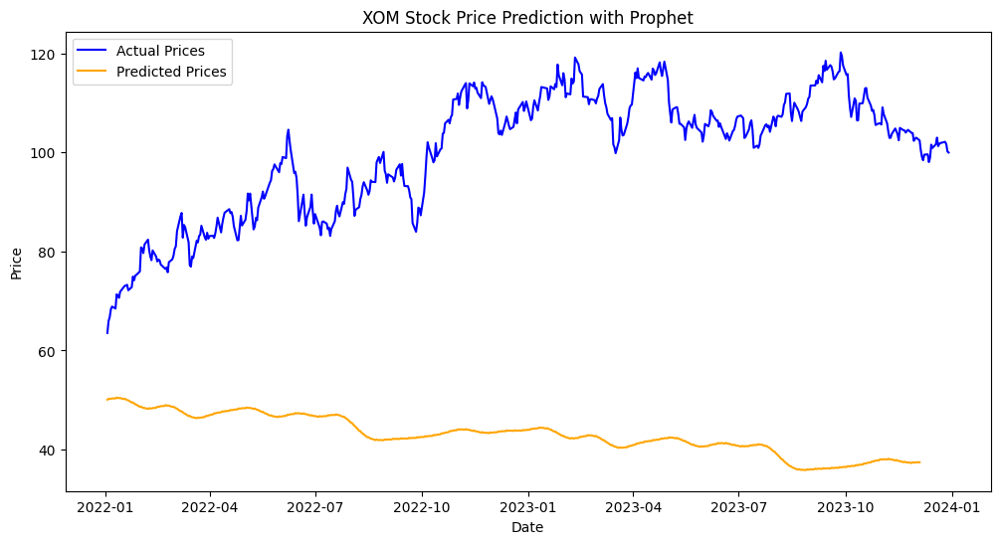

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/9a9dtfkm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/tge0fhcz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32046', 'data', 'file=/tmp/tmp3z430iy9/9a9dtfkm.json', 'init=/tmp/tmp3z430iy9/tge0fhcz.json', 'output', 'file=/tmp/tmp3z430iy9/prophet_model76pmu1sv/prophet_model-20240513162006.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:20:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:20:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


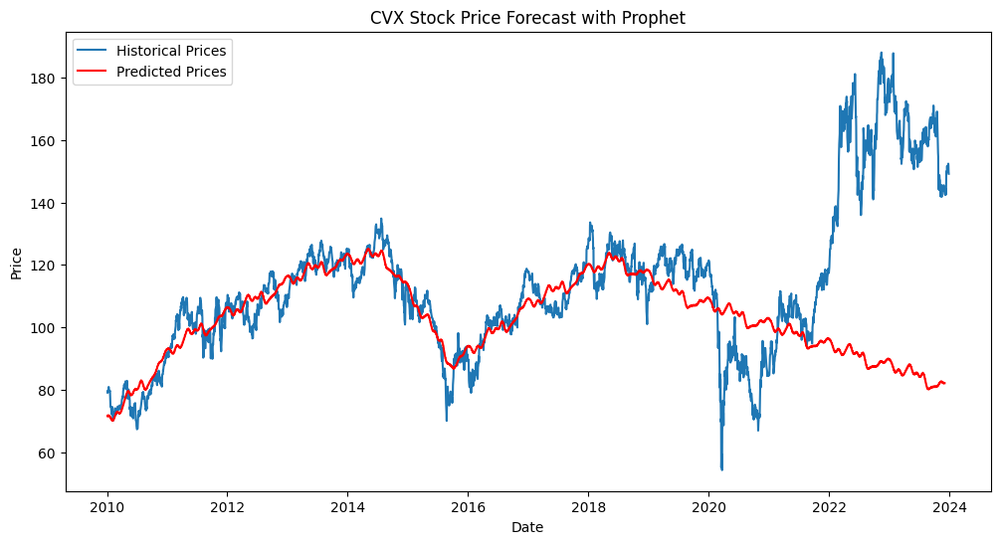

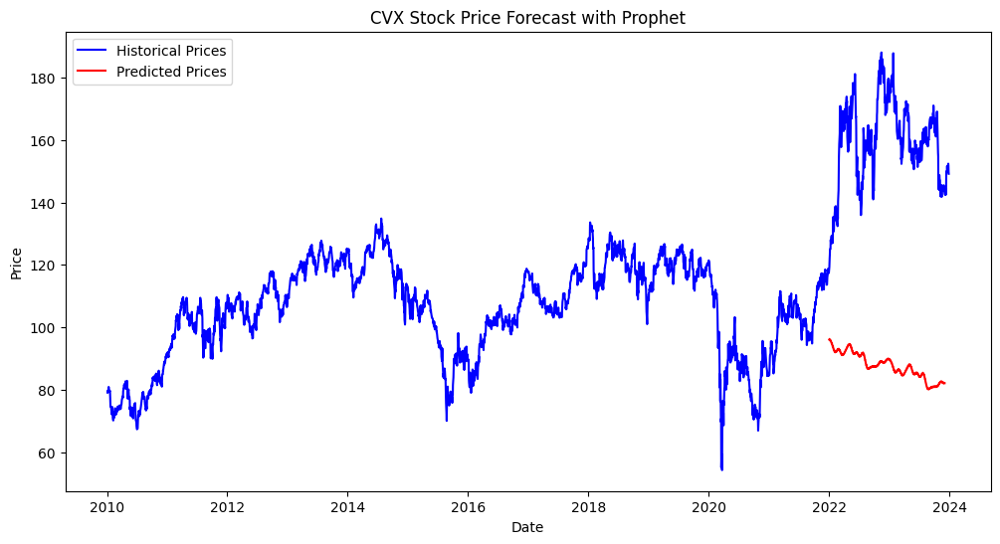

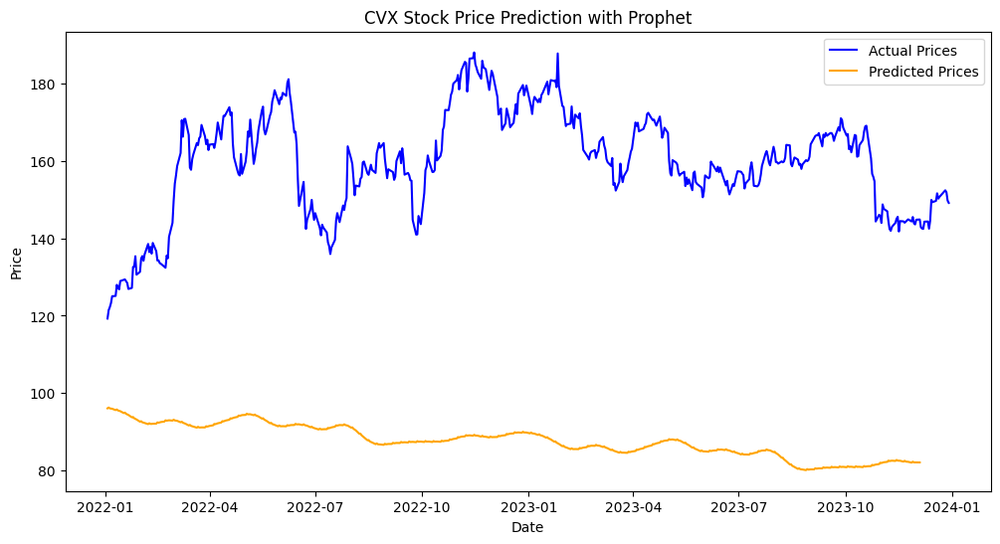

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/_0tfwl36.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/rjj5qamc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97371', 'data', 'file=/tmp/tmp3z430iy9/_0tfwl36.json', 'init=/tmp/tmp3z430iy9/rjj5qamc.json', 'output', 'file=/tmp/tmp3z430iy9/prophet_modelus7h416r/prophet_model-20240513162011.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:20:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:20:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


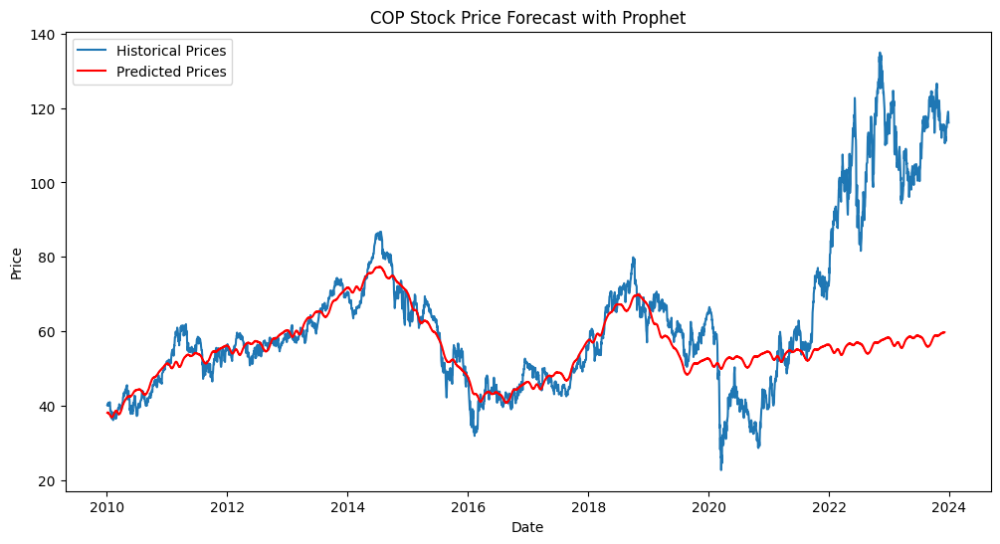

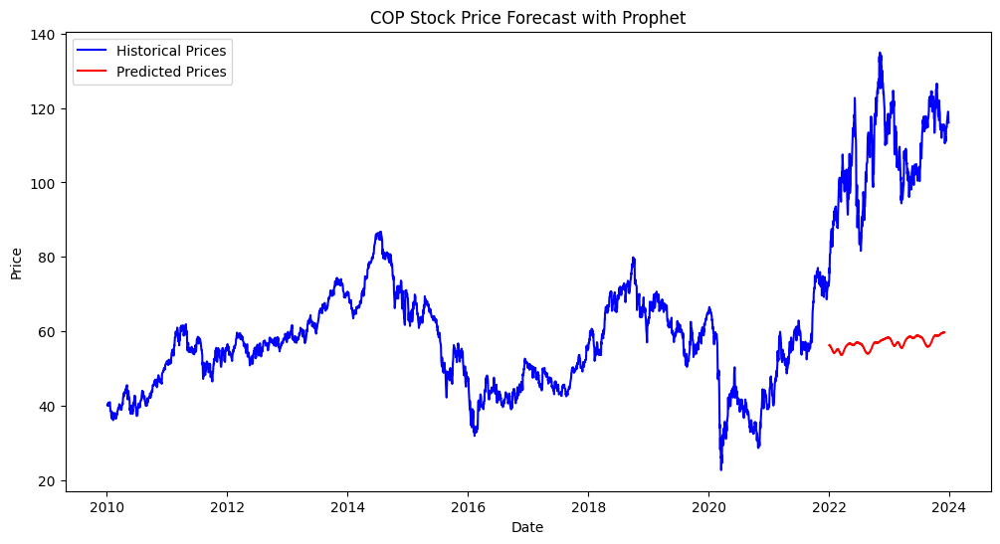

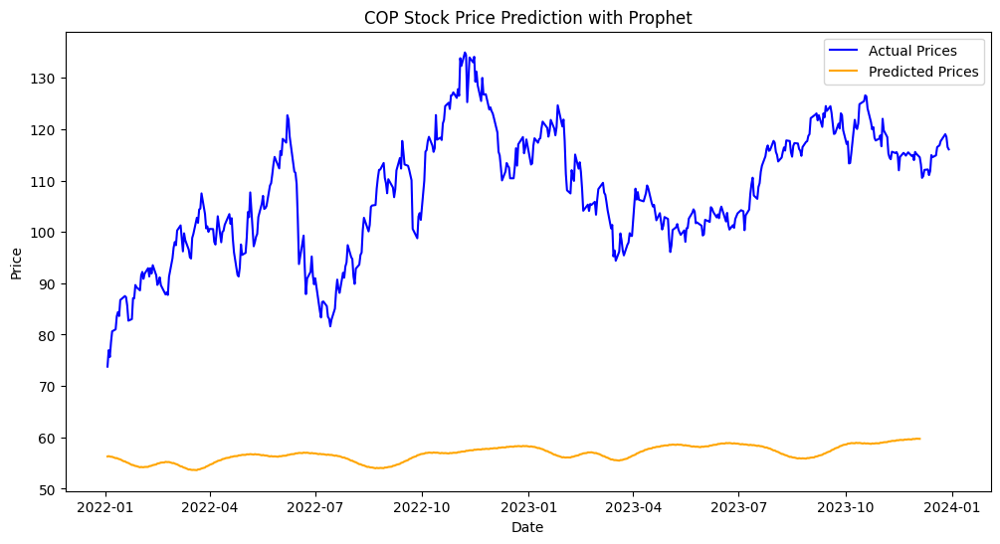

In [ ]:
# beginning of forecast is 2022
from prophet import Prophet
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

def run_prophet(ticker):
    # Download data
    data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    df = pd.DataFrame(data['Close'])
    df.reset_index(inplace=True)
    df.rename(columns={'Date': 'ds', 'Close': 'y'}, inplace=True)

    # Fit the Prophet model on data up to the beginning of 2023
    m = Prophet(daily_seasonality=False)
    m.fit(df[df['ds'] < '2022-01-01'])  # Train only on data before 2023

    # Create future dataframe for forecasting
    future = m.make_future_dataframe(periods=len(data['2022-01-01':]), freq='B')
    forecast = m.predict(future)

    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices')
    plt.plot(forecast['ds'], forecast['yhat'], color='red', label='Predicted Prices')
    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()
    # Plot historical and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices', color='blue')  # Historical prices

    # Only plot predicted prices starting from 2023
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], color='red', label='Predicted Prices')  # Predicted prices

    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    # Filter actual data for plotting
    actual_data = df[df['ds'] >= '2022-01-01']
    plt.plot(actual_data['ds'], actual_data['y'], label='Actual Prices', color='blue')

    # Filter forecast data for plotting
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], label='Predicted Prices', color='orange')

    plt.title(f"{ticker} Stock Price Prediction with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

run_prophet("XOM")
run_prophet("CVX")
run_prophet("COP")

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/d46cx9vy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/ia2oa7rm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88944', 'data', 'file=/tmp/tmpsxv04hob/d46cx9vy.json', 'init=/tmp/tmpsxv04hob/ia2oa7rm.json', 'output', 'file=/tmp/tmpsxv04hob/prophet_modelyyrwx311/prophet_model-20240518173058.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:30:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


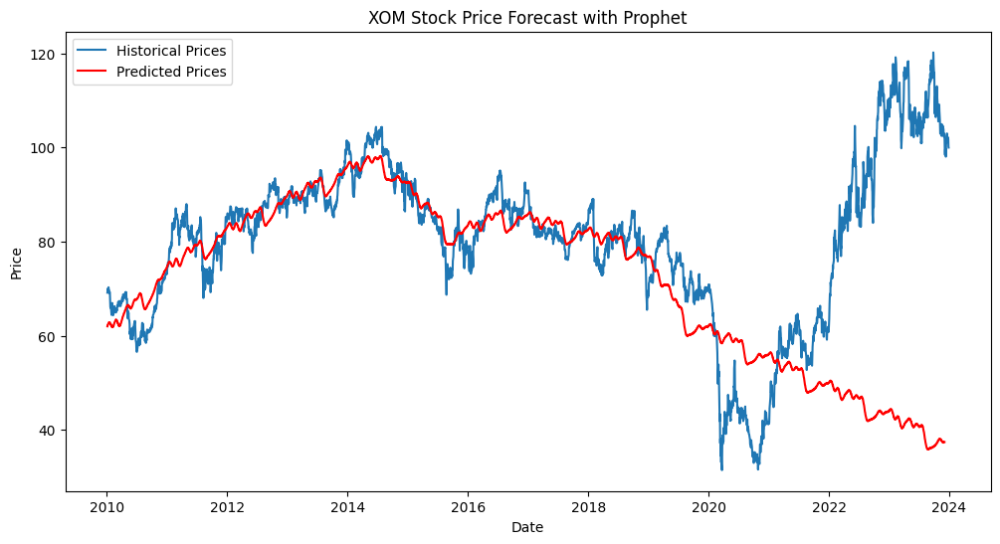

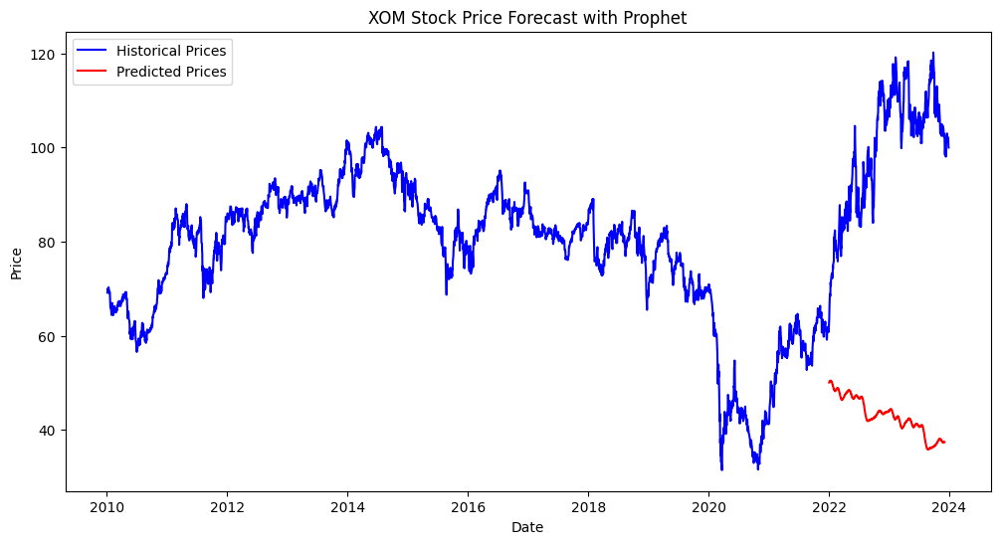

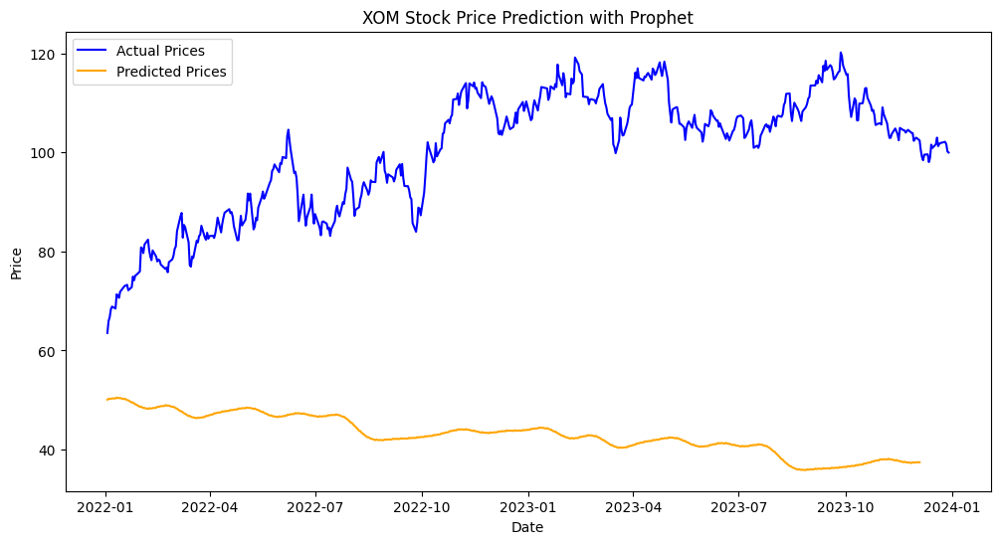

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/s9tk9tuo.json


Average margin of difference for XOM: 57.07
Average margin of difference for XOM (percentage): 55.86%
Directional accuracy for XOM: 47.31%


DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/no6f530r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83742', 'data', 'file=/tmp/tmpsxv04hob/s9tk9tuo.json', 'init=/tmp/tmpsxv04hob/no6f530r.json', 'output', 'file=/tmp/tmpsxv04hob/prophet_modelmj05l1ji/prophet_model-20240518173102.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:31:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:31:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


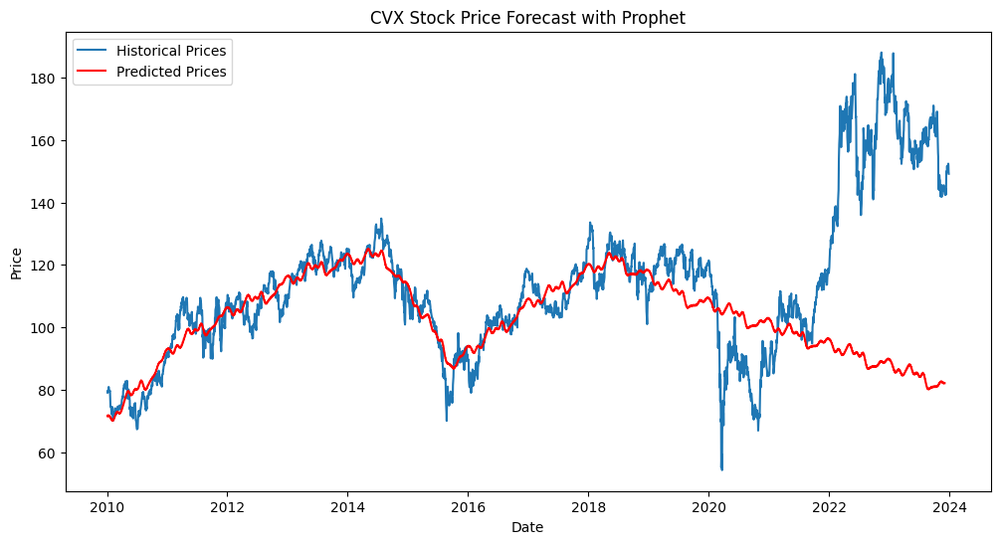

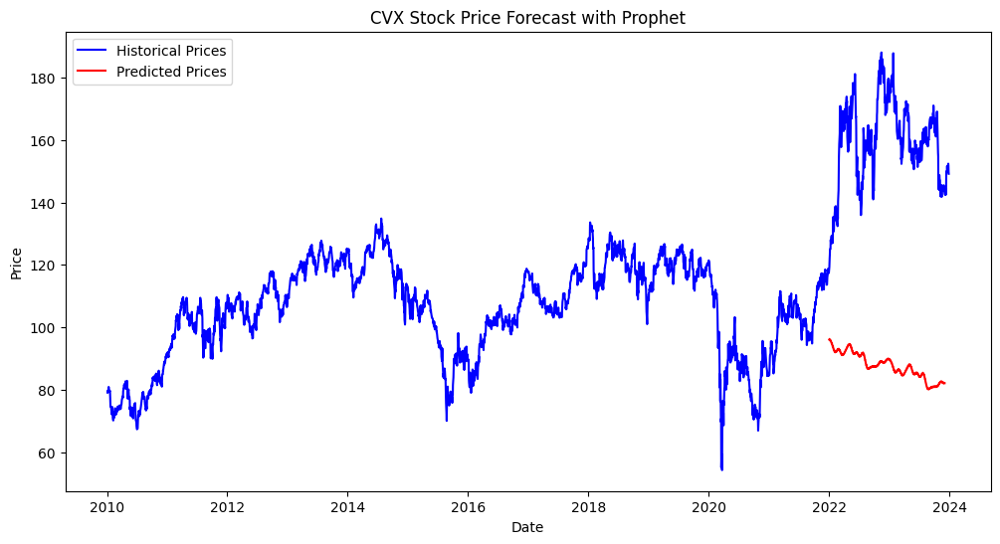

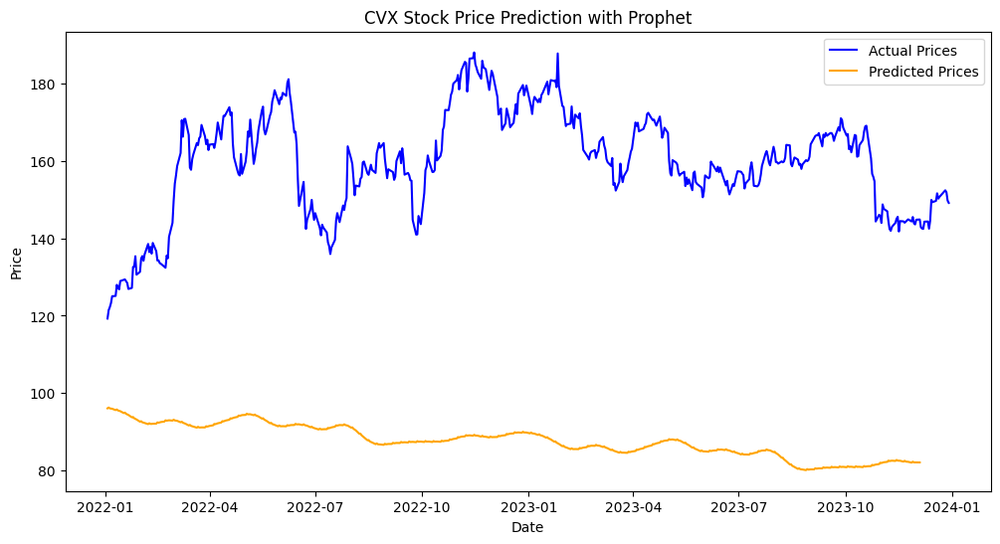

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/mrt_t62f.json


Average margin of difference for CVX: 71.85
Average margin of difference for CVX (percentage): 44.59%
Directional accuracy for CVX: 48.70%


DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/9hxaryp2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75749', 'data', 'file=/tmp/tmpsxv04hob/mrt_t62f.json', 'init=/tmp/tmpsxv04hob/9hxaryp2.json', 'output', 'file=/tmp/tmpsxv04hob/prophet_modelzyifs6am/prophet_model-20240518173105.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:31:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:31:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


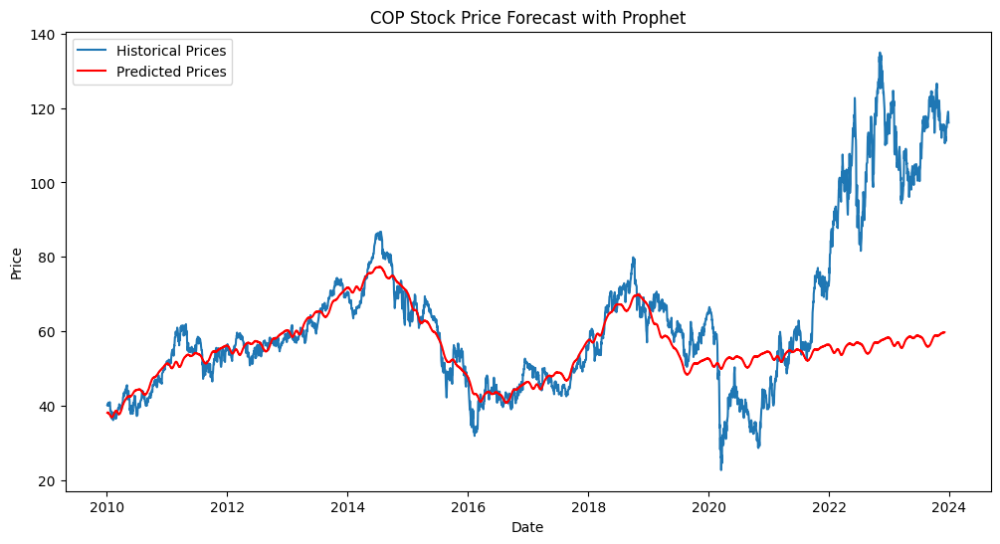

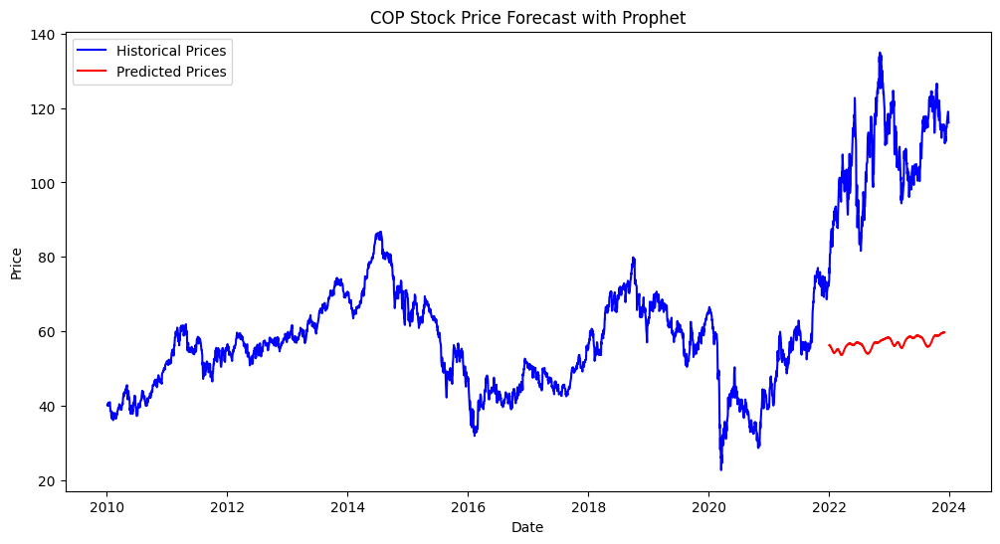

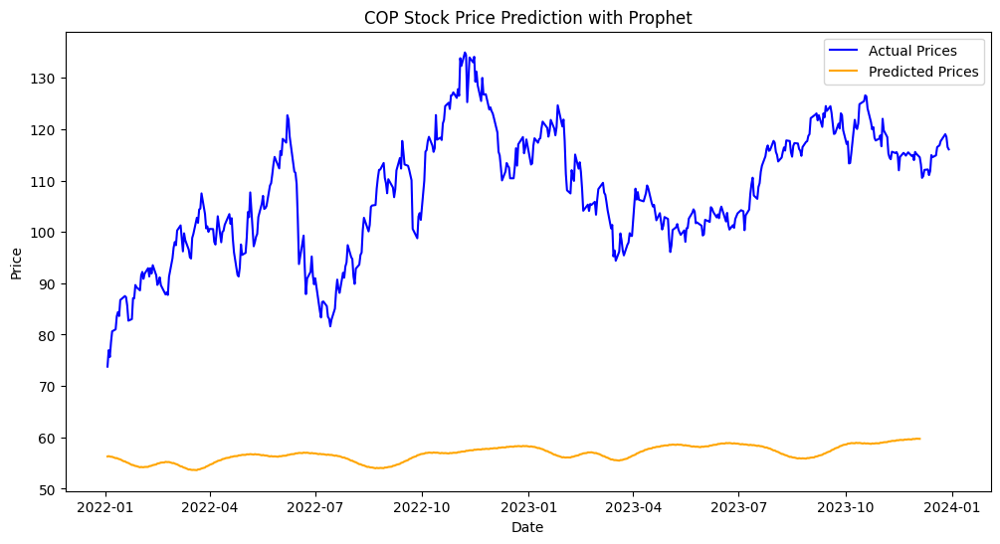

Average margin of difference for COP: 50.88
Average margin of difference for COP (percentage): 46.62%
Directional accuracy for COP: 49.90%


In [ ]:
# beginning of forecast is 2022
from prophet import Prophet
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def run_prophet(ticker):
    # Download data
    data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    df = pd.DataFrame(data['Close'])
    df.reset_index(inplace=True)
    df.rename(columns={'Date': 'ds', 'Close': 'y'}, inplace=True)

    # Fit the Prophet model on data up to the beginning of 2022
    m = Prophet(daily_seasonality=False)
    m.fit(df[df['ds'] < '2022-01-01'])  # Train only on data before 2022

    # Create future dataframe for forecasting
    future = m.make_future_dataframe(periods=len(data['2022-01-01':]), freq='B')
    forecast = m.predict(future)

    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices')
    plt.plot(forecast['ds'], forecast['yhat'], color='red', label='Predicted Prices')
    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    # Plot historical and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices', color='blue')  # Historical prices

    # Only plot predicted prices starting from 2022
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], color='red', label='Predicted Prices')  # Predicted prices

    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    # Filter actual data for plotting
    actual_data = df[df['ds'] >= '2022-01-01']
    plt.plot(actual_data['ds'], actual_data['y'], label='Actual Prices', color='blue')

    # Filter forecast data for plotting
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], label='Predicted Prices', color='orange')

    plt.title(f"{ticker} Stock Price Prediction with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    # Calculate and print the average margin of difference
    avg_margin = average_margin_of_difference(actual_data['y'], forecasted_data['yhat'])
    avg_margin_percentage = average_margin_of_difference_percentage(actual_data['y'], forecasted_data['yhat'])
    direction_accuracy = directional_accuracy(actual_data['y'], forecasted_data['yhat'])

    print(f"Average margin of difference for {ticker}: {avg_margin:.2f}")
    print(f"Average margin of difference for {ticker} (percentage): {avg_margin_percentage:.2f}%")
    print(f"Directional accuracy for {ticker}: {direction_accuracy:.2f}%")

# Function to calculate the average margin of difference between actual and predicted prices
def average_margin_of_difference(actual, predicted):
    margins = actual.values - predicted.values
    avg_margin = np.mean(np.abs(margins))
    return avg_margin

# Function to calculate the average margin of difference as a percentage
def average_margin_of_difference_percentage(actual, predicted):
    margins = actual.values - predicted.values
    avg_margin_percentage = np.mean(np.abs(margins) / actual.values) * 100
    return avg_margin_percentage

# Function to calculate directional accuracy
def directional_accuracy(actual, predicted):
    actual_diff = np.sign(np.diff(actual.values, prepend=actual.values[0]))
    predicted_diff = np.sign(np.diff(predicted.values, prepend=predicted.values[0]))
    accuracy = np.mean(actual_diff == predicted_diff) * 100
    return accuracy

# Run the Prophet model for multiple stocks
run_prophet("XOM")
run_prophet("CVX")
run_prophet("COP")




##### Forecast start - 2023

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/hyjsn3nv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/z2sbgltn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67854', 'data', 'file=/tmp/tmp3z430iy9/hyjsn3nv.json', 'init=/tmp/tmp3z430iy9/z2sbgltn.json', 'output', 'file=/tmp/tmp3z430iy9/prophet_modelu_i6tvix/prophet_model-20240513162051.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:20:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:20:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


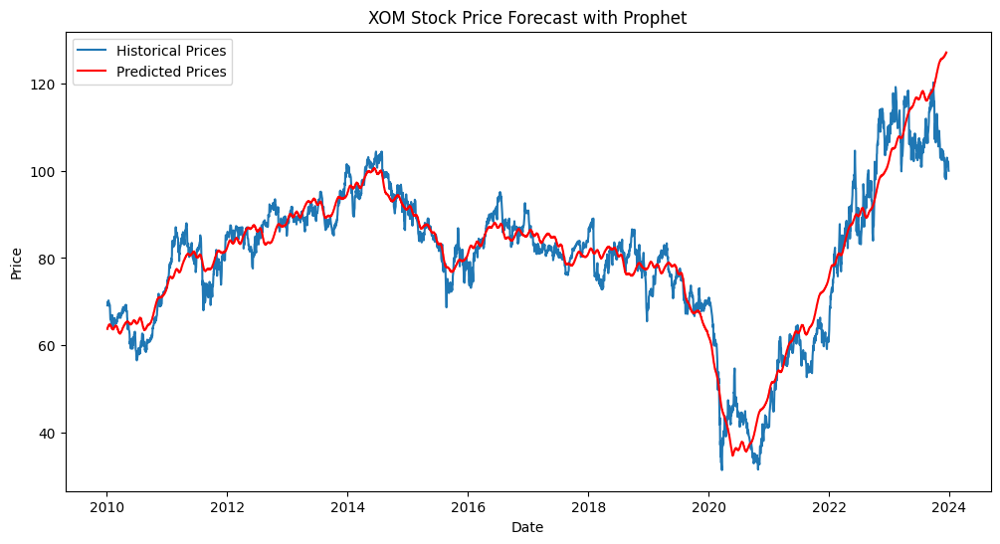

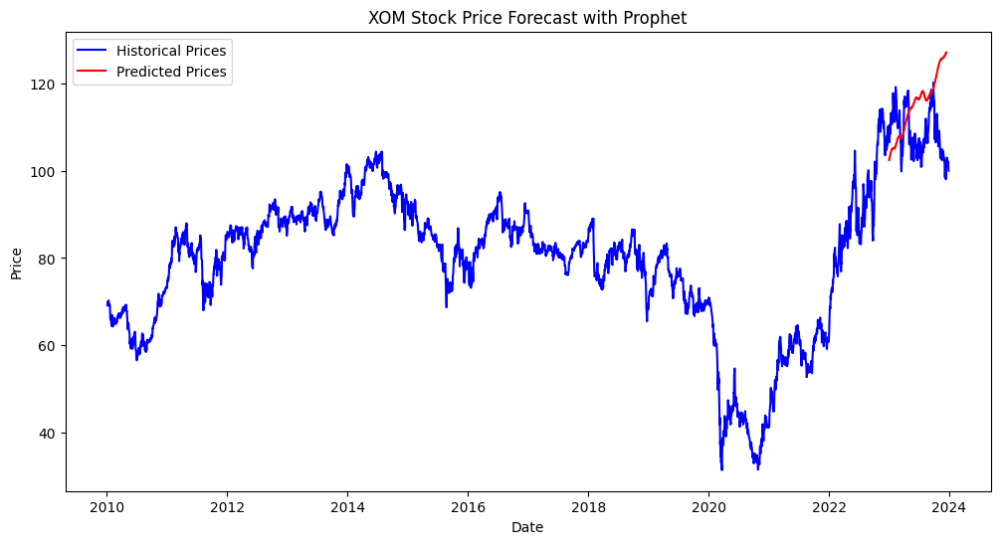

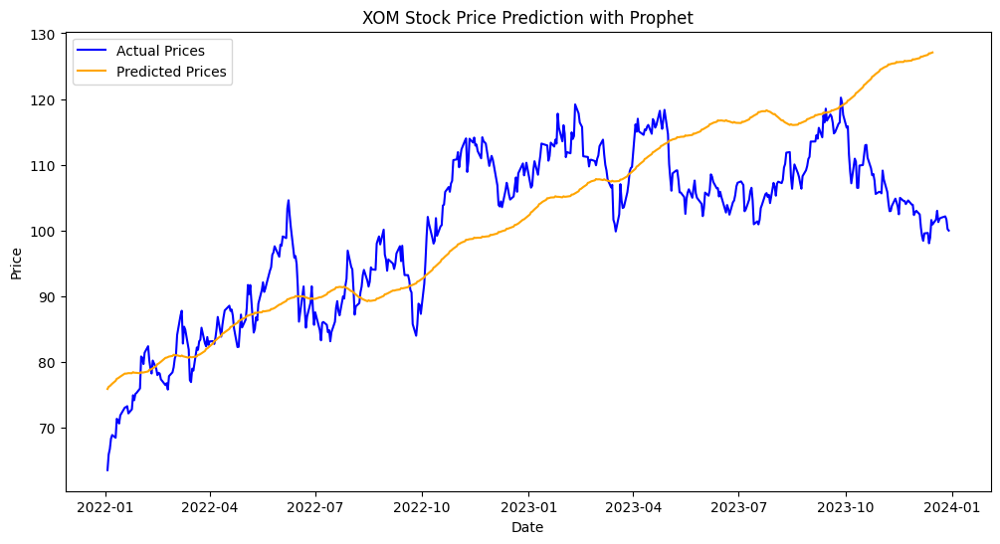

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/wvxh8qvy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/9y1acwrm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70376', 'data', 'file=/tmp/tmp3z430iy9/wvxh8qvy.json', 'init=/tmp/tmp3z430iy9/9y1acwrm.json', 'output', 'file=/tmp/tmp3z430iy9/prophet_model1imfm0qq/prophet_model-20240513162057.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:20:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:21:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


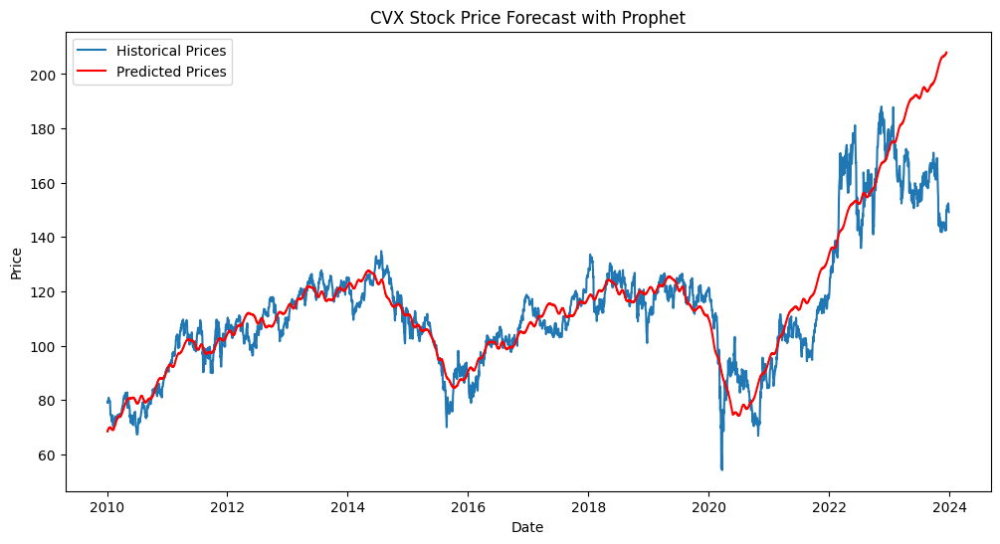

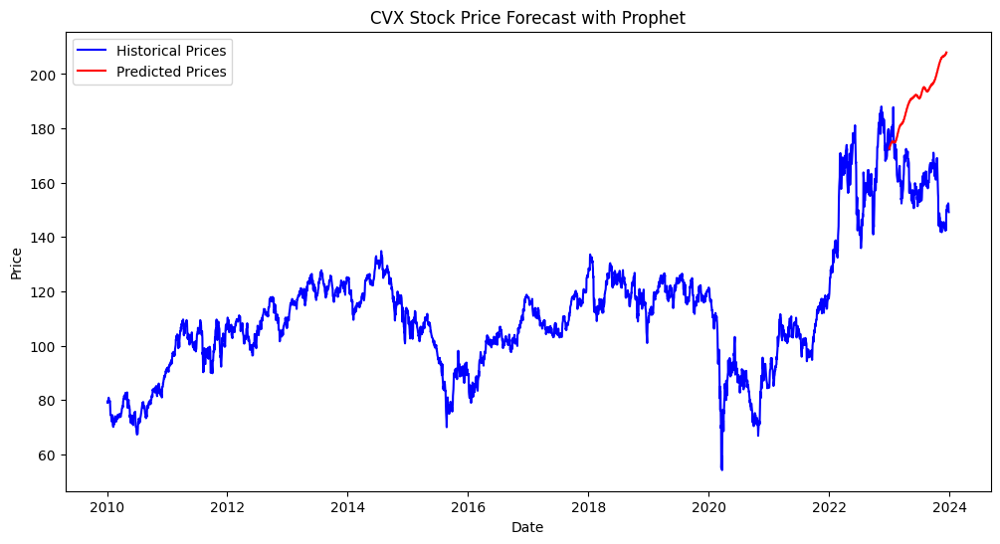

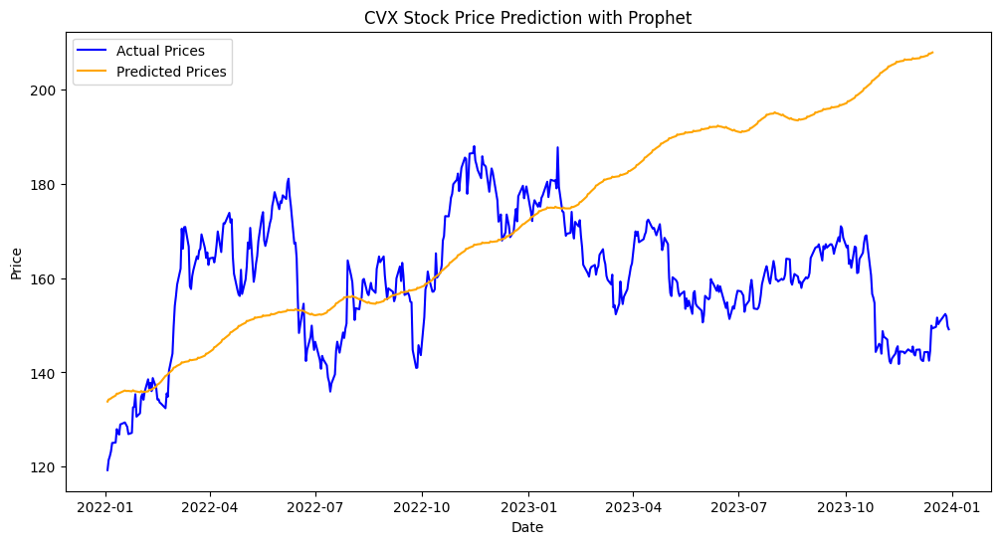

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/ei3blacr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/os7avxc4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76163', 'data', 'file=/tmp/tmp3z430iy9/ei3blacr.json', 'init=/tmp/tmp3z430iy9/os7avxc4.json', 'output', 'file=/tmp/tmp3z430iy9/prophet_modelxse1l8pa/prophet_model-20240513162102.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:21:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:21:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


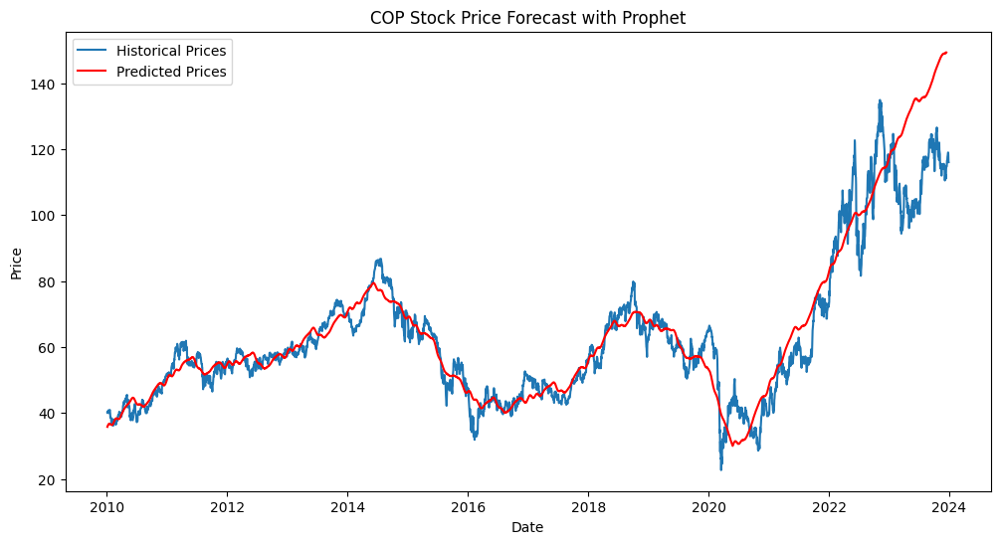

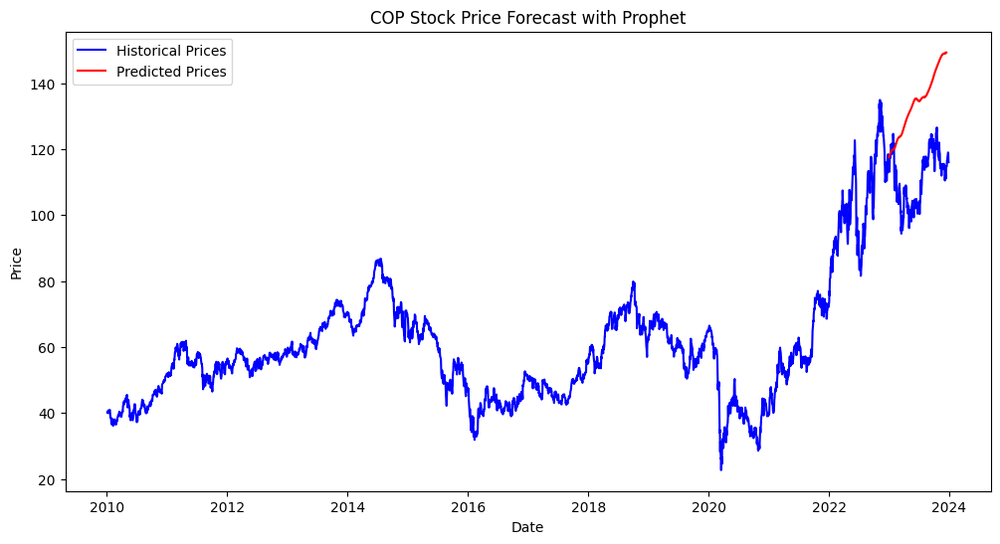

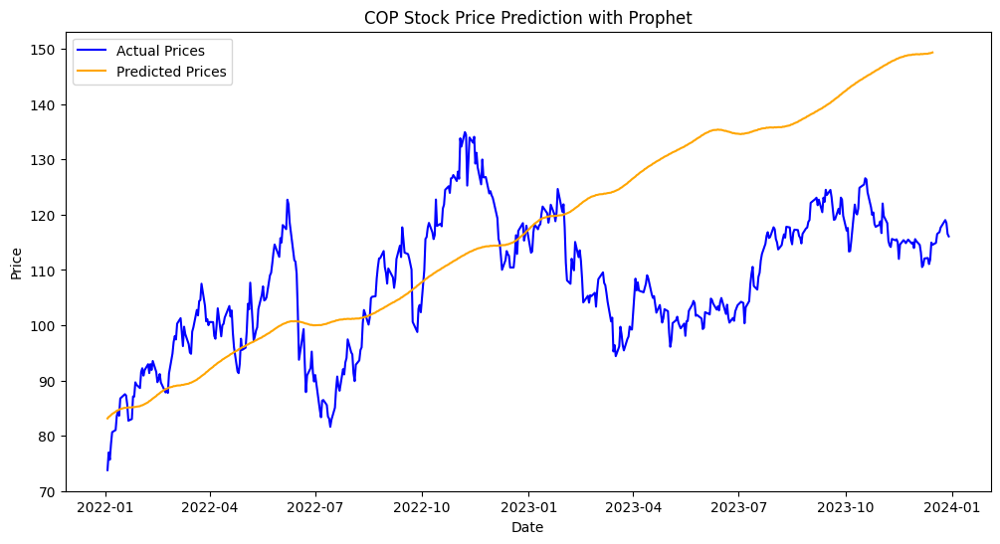

In [ ]:
# beginning of forecast is 2023
from prophet import Prophet
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

def run_prophet(ticker):
    # Download data
    data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    df = pd.DataFrame(data['Close'])
    df.reset_index(inplace=True)
    df.rename(columns={'Date': 'ds', 'Close': 'y'}, inplace=True)

    # Fit the Prophet model on data up to the beginning of 2023
    m = Prophet(daily_seasonality=False)
    m.fit(df[df['ds'] < '2023-01-01'])  # Train only on data before 2023

    # Create future dataframe for forecasting
    future = m.make_future_dataframe(periods=len(data['2023-01-01':]), freq='B')
    forecast = m.predict(future)

    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices')
    plt.plot(forecast['ds'], forecast['yhat'], color='red', label='Predicted Prices')
    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()
    # Plot historical and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices', color='blue')  # Historical prices

    # Only plot predicted prices starting from 2023
    forecasted_data = forecast[forecast['ds'] >= '2023-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], color='red', label='Predicted Prices')  # Predicted prices

    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    # Filter actual data for plotting
    actual_data = df[df['ds'] >= '2022-01-01']
    plt.plot(actual_data['ds'], actual_data['y'], label='Actual Prices', color='blue')

    # Filter forecast data for plotting
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], label='Predicted Prices', color='orange')

    plt.title(f"{ticker} Stock Price Prediction with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

run_prophet("XOM")
run_prophet("CVX")
run_prophet("COP")

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/chq9uso5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/m0qaa9ah.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53028', 'data', 'file=/tmp/tmpsxv04hob/chq9uso5.json', 'init=/tmp/tmpsxv04hob/m0qaa9ah.json', 'output', 'file=/tmp/tmpsxv04hob/prophet_modelnu95x2ky/prophet_model-20240518173159.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:31:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:32:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


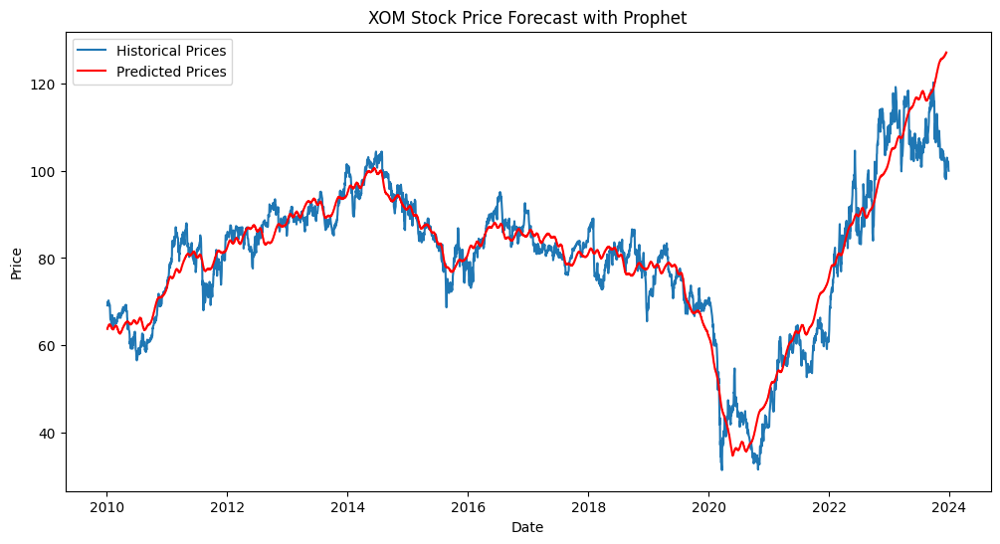

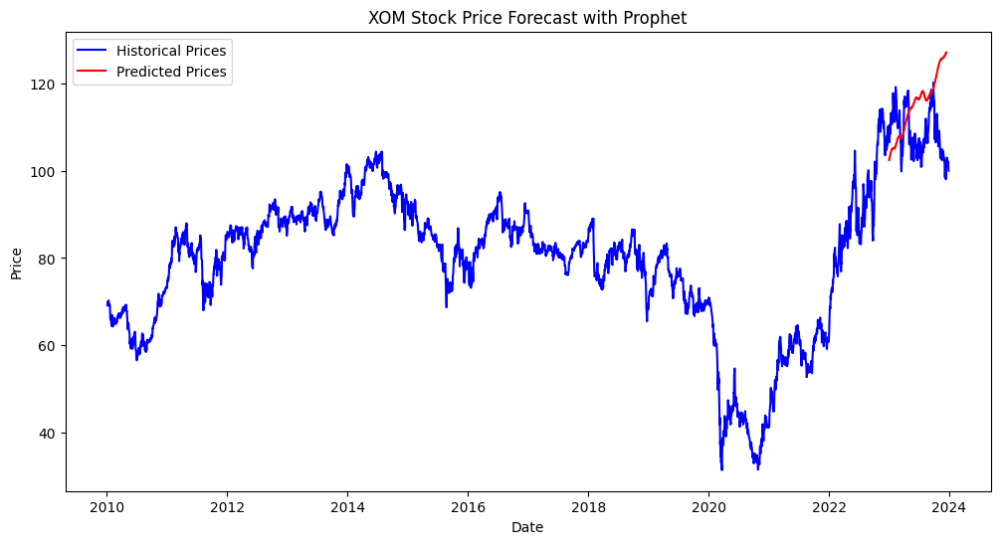

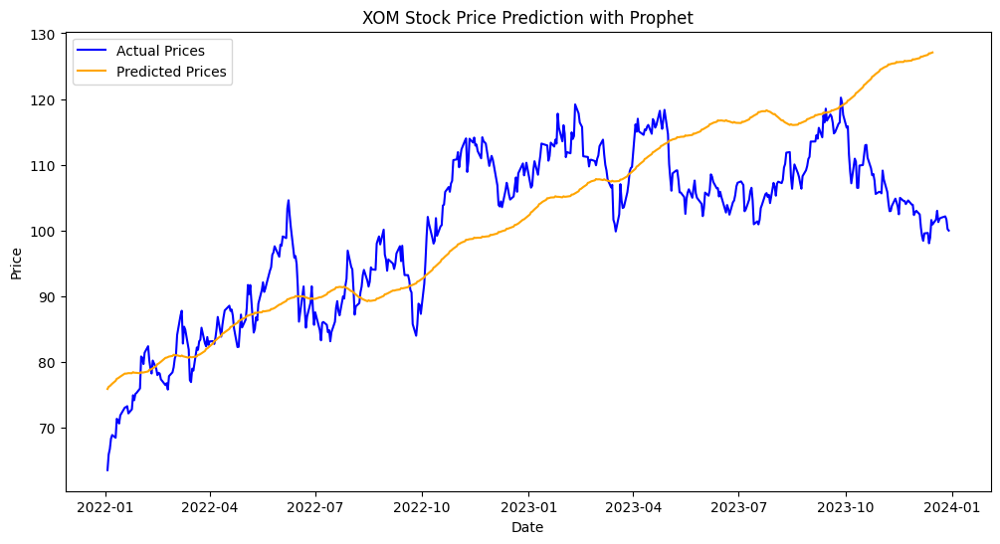

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/u_abog59.json


Average margin of difference for XOM: 7.61
Average margin of difference for XOM (percentage): 7.47%
Directional accuracy for XOM: 51.50%


DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/nz5kai6t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2205', 'data', 'file=/tmp/tmpsxv04hob/u_abog59.json', 'init=/tmp/tmpsxv04hob/nz5kai6t.json', 'output', 'file=/tmp/tmpsxv04hob/prophet_modelv4pi2h3p/prophet_model-20240518173204.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:32:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:32:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


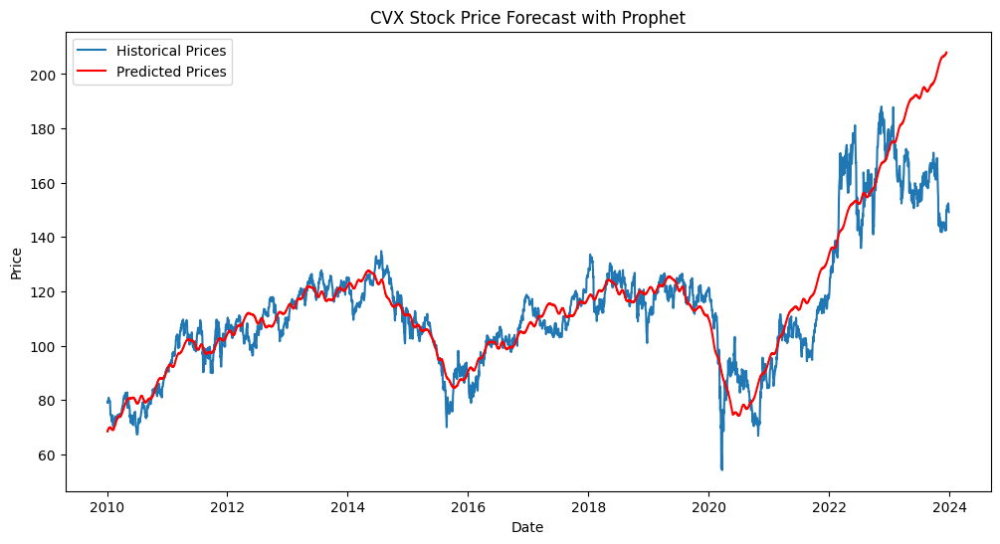

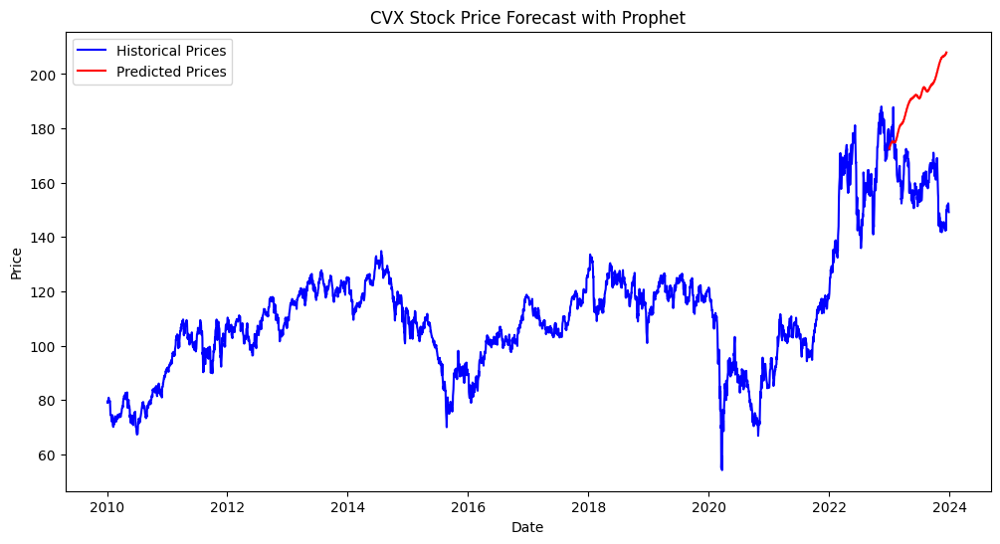

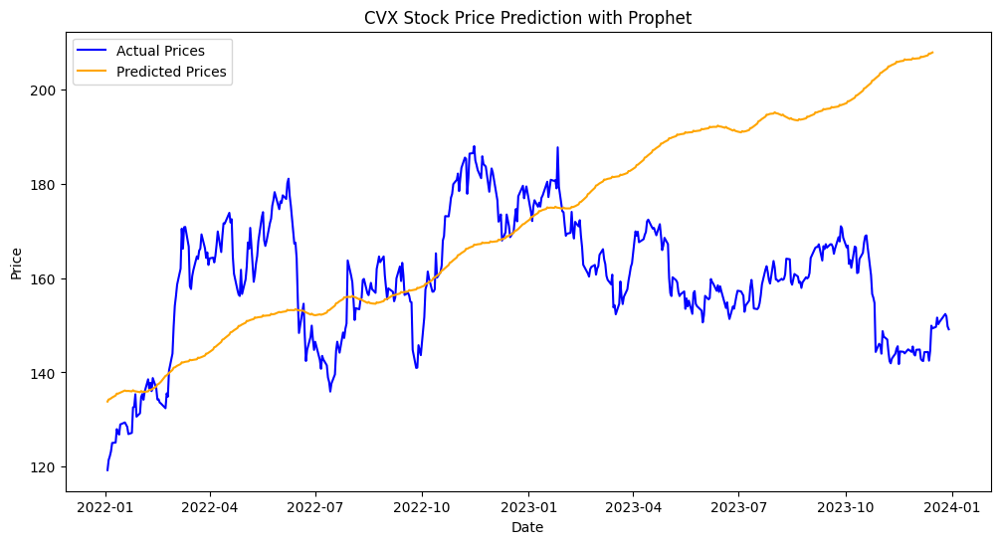

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/e366k9kr.json


Average margin of difference for CVX: 20.94
Average margin of difference for CVX (percentage): 13.34%
Directional accuracy for CVX: 52.89%


DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/d52x8s7x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96581', 'data', 'file=/tmp/tmpsxv04hob/e366k9kr.json', 'init=/tmp/tmpsxv04hob/d52x8s7x.json', 'output', 'file=/tmp/tmpsxv04hob/prophet_modela1c0om22/prophet_model-20240518173208.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:32:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:32:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


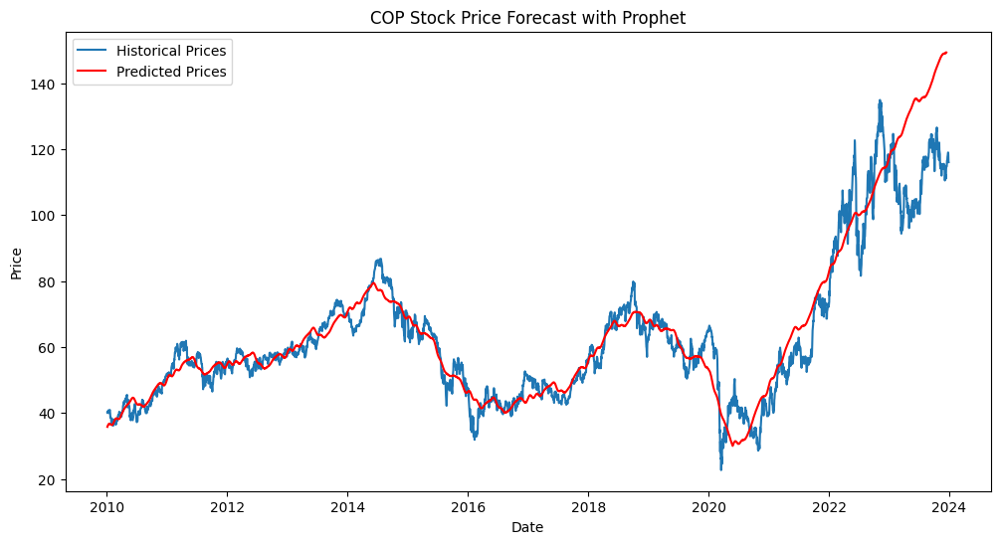

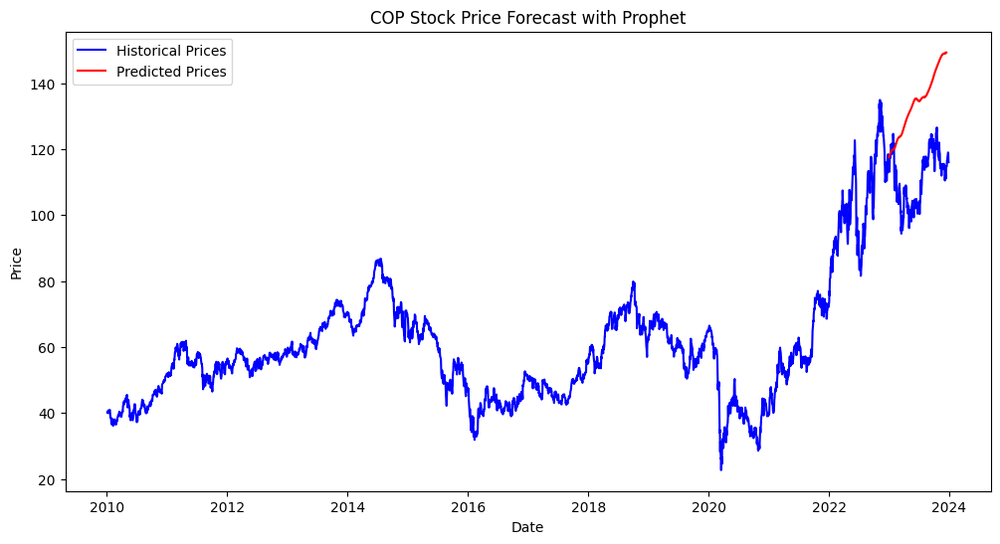

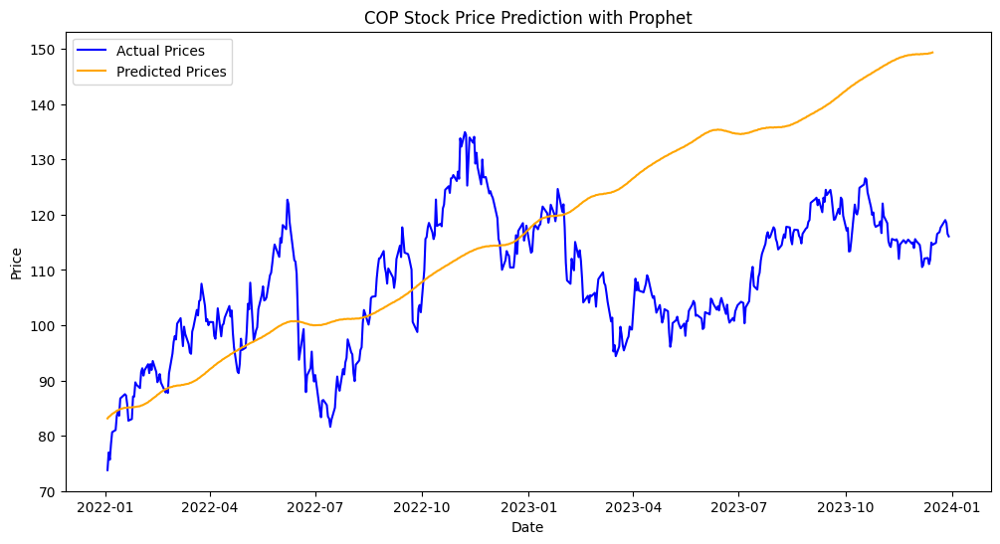

Average margin of difference for COP: 15.42
Average margin of difference for COP (percentage): 14.25%
Directional accuracy for COP: 53.89%


In [ ]:
# beginning of forecast is 2022
from prophet import Prophet
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def run_prophet(ticker):
    # Download data
    data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    df = pd.DataFrame(data['Close'])
    df.reset_index(inplace=True)
    df.rename(columns={'Date': 'ds', 'Close': 'y'}, inplace=True)

    # Fit the Prophet model on data up to the beginning of 2022
    m = Prophet(daily_seasonality=False)
    m.fit(df[df['ds'] < '2023-01-01'])  # Train only on data before 2022

    # Create future dataframe for forecasting
    future = m.make_future_dataframe(periods=len(data['2023-01-01':]), freq='B')
    forecast = m.predict(future)

    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices')
    plt.plot(forecast['ds'], forecast['yhat'], color='red', label='Predicted Prices')
    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    # Plot historical and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices', color='blue')  # Historical prices

    # Only plot predicted prices starting from 2022
    forecasted_data = forecast[forecast['ds'] >= '2023-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], color='red', label='Predicted Prices')  # Predicted prices

    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    # Filter actual data for plotting
    actual_data = df[df['ds'] >= '2022-01-01']
    plt.plot(actual_data['ds'], actual_data['y'], label='Actual Prices', color='blue')

    # Filter forecast data for plotting
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], label='Predicted Prices', color='orange')

    plt.title(f"{ticker} Stock Price Prediction with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    # Calculate and print the average margin of difference
    avg_margin = average_margin_of_difference(actual_data['y'], forecasted_data['yhat'])
    avg_margin_percentage = average_margin_of_difference_percentage(actual_data['y'], forecasted_data['yhat'])
    direction_accuracy = directional_accuracy(actual_data['y'], forecasted_data['yhat'])

    print(f"Average margin of difference for {ticker}: {avg_margin:.2f}")
    print(f"Average margin of difference for {ticker} (percentage): {avg_margin_percentage:.2f}%")
    print(f"Directional accuracy for {ticker}: {direction_accuracy:.2f}%")

# Function to calculate the average margin of difference between actual and predicted prices
def average_margin_of_difference(actual, predicted):
    margins = actual.values - predicted.values
    avg_margin = np.mean(np.abs(margins))
    return avg_margin

# Function to calculate the average margin of difference as a percentage
def average_margin_of_difference_percentage(actual, predicted):
    margins = actual.values - predicted.values
    avg_margin_percentage = np.mean(np.abs(margins) / actual.values) * 100
    return avg_margin_percentage

# Function to calculate directional accuracy
def directional_accuracy(actual, predicted):
    actual_diff = np.sign(np.diff(actual.values, prepend=actual.values[0]))
    predicted_diff = np.sign(np.diff(predicted.values, prepend=predicted.values[0]))
    accuracy = np.mean(actual_diff == predicted_diff) * 100
    return accuracy

# Run the Prophet model for multiple stocks
run_prophet("XOM")
run_prophet("CVX")
run_prophet("COP")


### Materials Sector Models

#### ARIMA

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


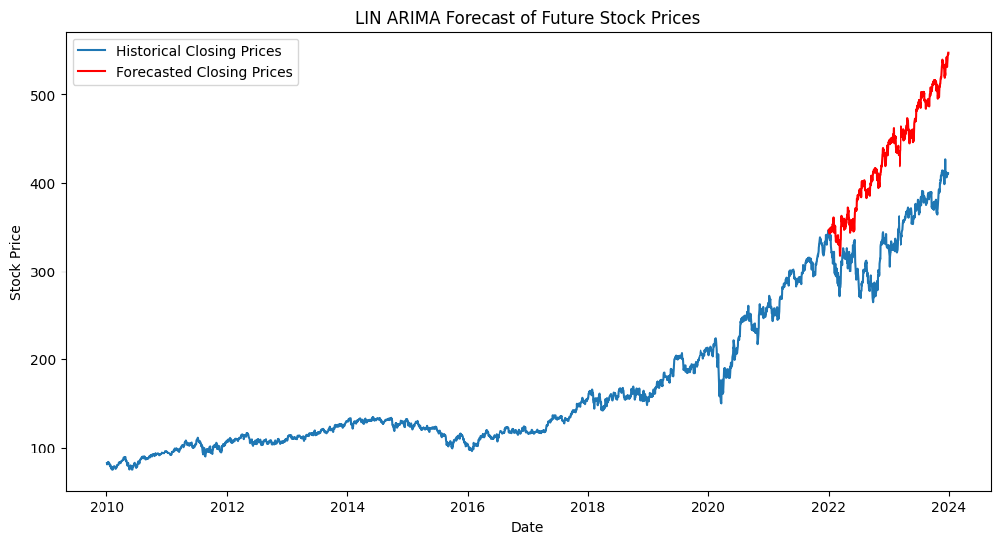

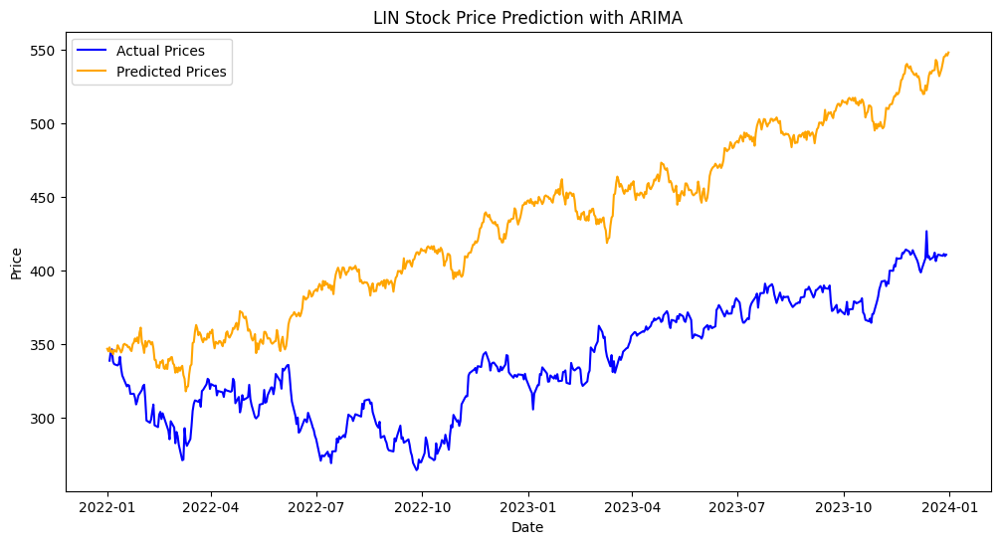

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


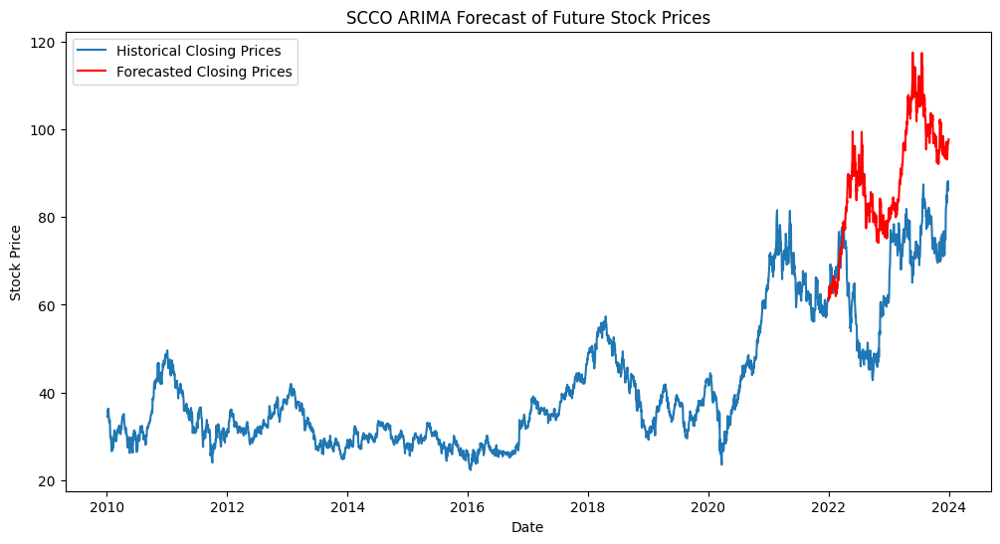

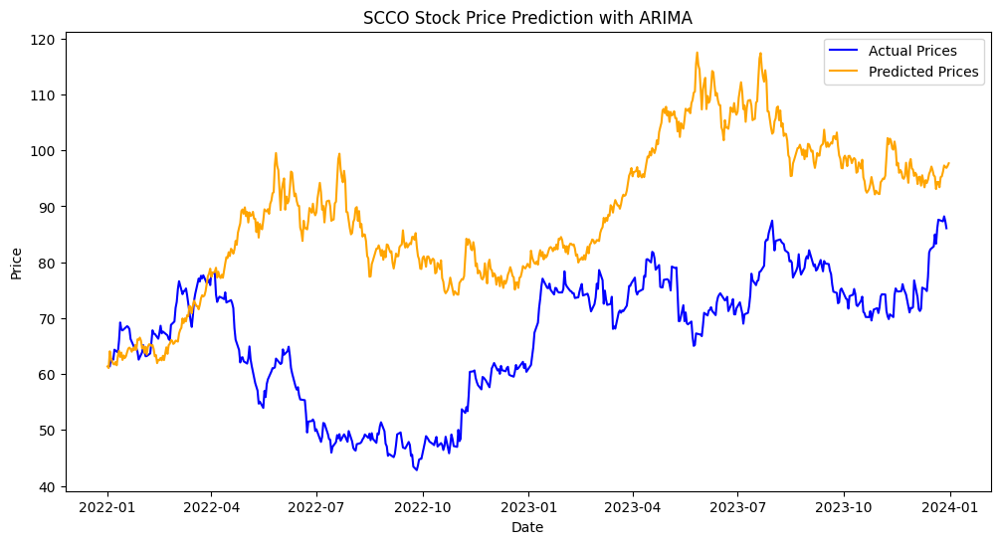

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


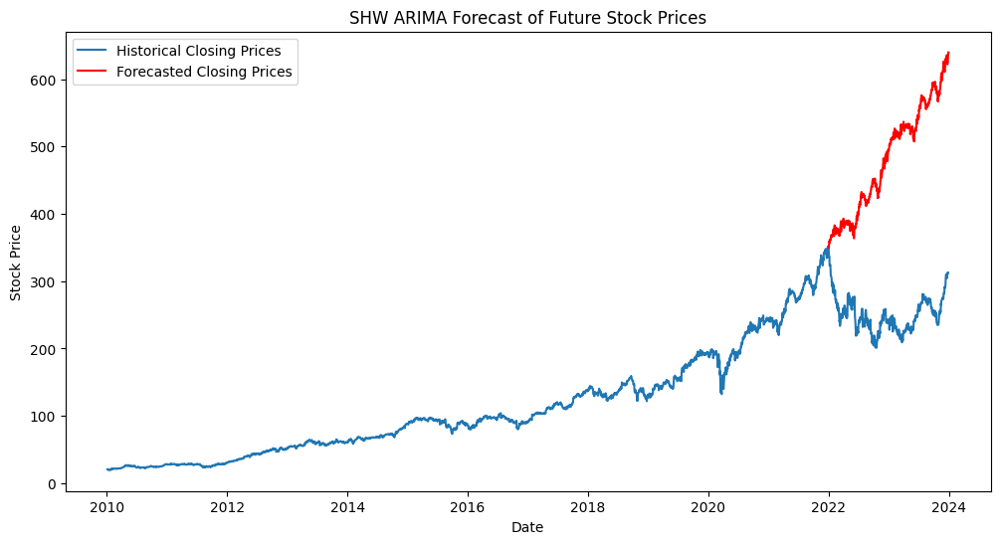

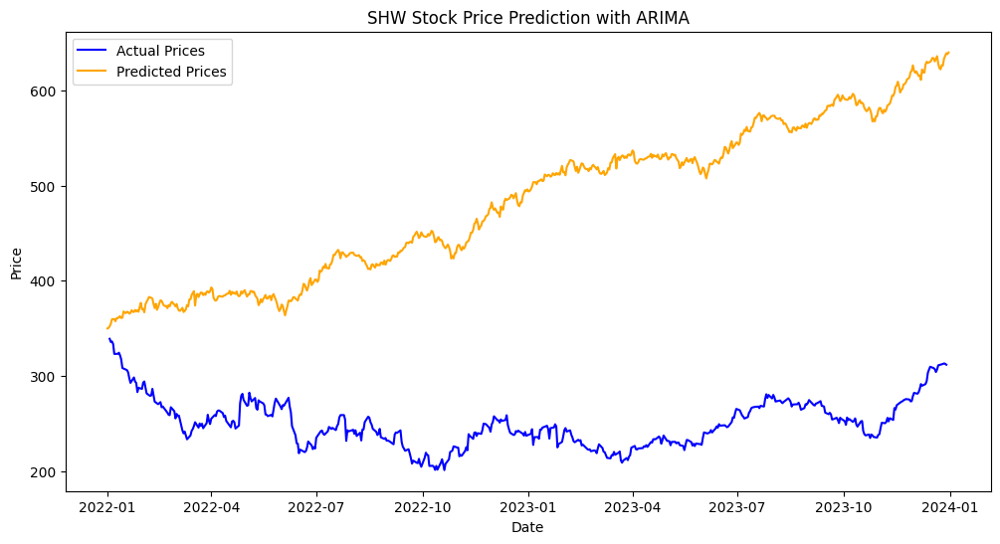

In [ ]:
import yfinance as yf
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import numpy as np

# Function to create a differenced series to make the data stationary
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return np.array(diff)

# Function to invert differenced value
def inverse_difference(history, yhat, interval=1):
    return yhat + history[-interval]

# List of tickers
tickers = ["LIN", "SCCO", "SHW"]

# Loop through each ticker
for ticker in tickers:
    # Download historical data for each ticker
    historical_data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(ticker, start="2010-01-01", end="2022-01-01")
    close_prices = data['Close'].values

    # Assuming yearly differencing might be needed
    days_in_year = 365
    differenced = difference(close_prices, days_in_year)

    # Fit ARIMA model on the differenced data
    model = ARIMA(differenced, order=(1,1,1))
    model_fit = model.fit()

    # Forecast for the next two years (2022 to 2024)
    forecast = model_fit.forecast(steps=2*365)  # daily data

    # Invert the differenced forecast to something usable
    history = list(close_prices)
    predictions = []
    day = 1
    for yhat in forecast:
        inverted = inverse_difference(history, yhat, days_in_year)
        predictions.append(inverted)
        history.append(inverted)
        day += 1

    # Plotting the results for historical closing prices and forecasts
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.index, historical_data['Close'], label='Historical Closing Prices')
    forecast_index = pd.date_range(start='2022-01-01', periods=730, freq='D')
    plt.plot(forecast_index, predictions, color='red', label='Forecasted Closing Prices')
    plt.title(f'{ticker} ARIMA Forecast of Future Stock Prices')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

    # Plotting actual prices and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.loc['2022-01-01':].index, historical_data.loc['2022-01-01':]['Close'], label='Actual Prices', color='blue')
    plt.plot(forecast_index, predictions, label='Predicted Prices', color='orange')
    plt.legend()
    plt.title(f"{ticker} Stock Price Prediction with ARIMA")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


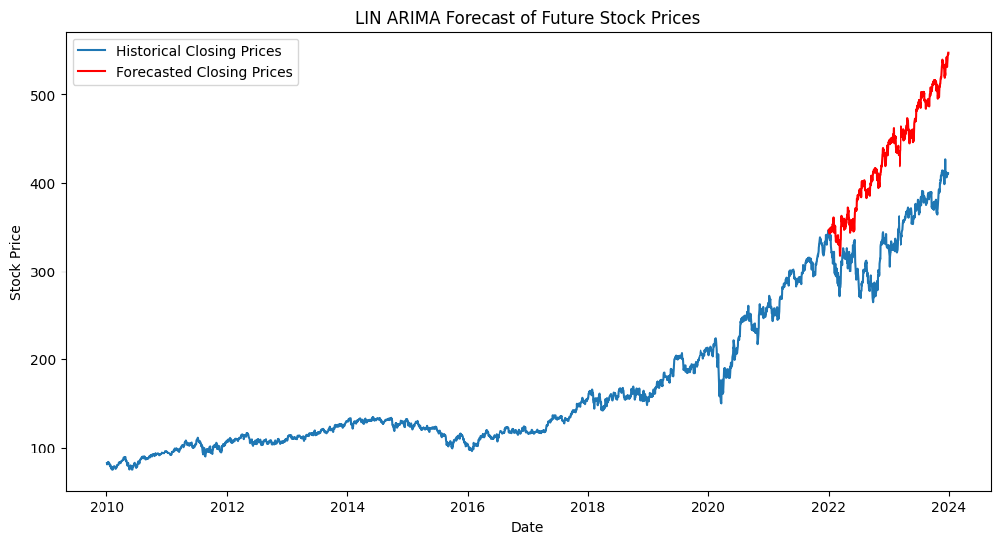

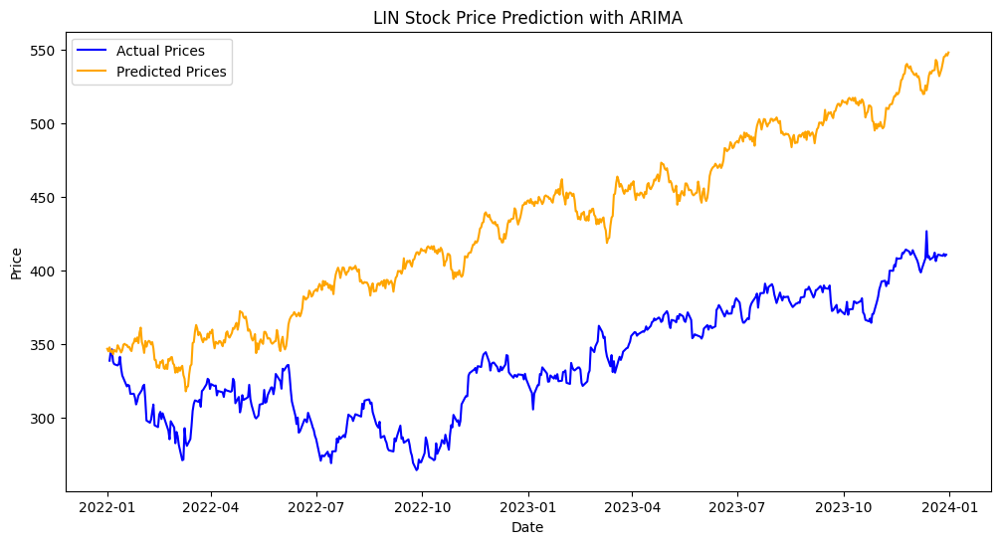

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Average margin of difference for LIN: 62.29
Average margin of difference for LIN (percentage): 18.94%
Directional accuracy for LIN: 49.30%


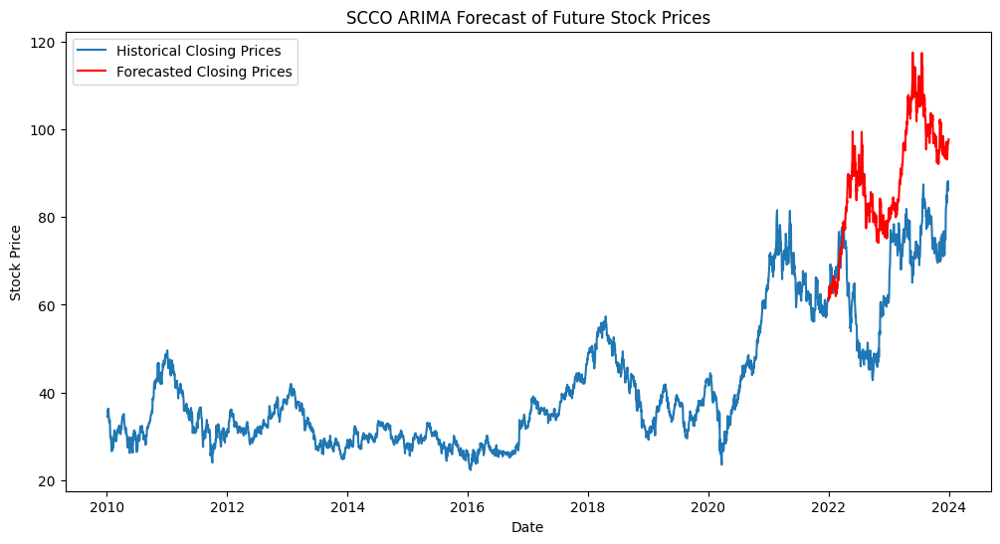

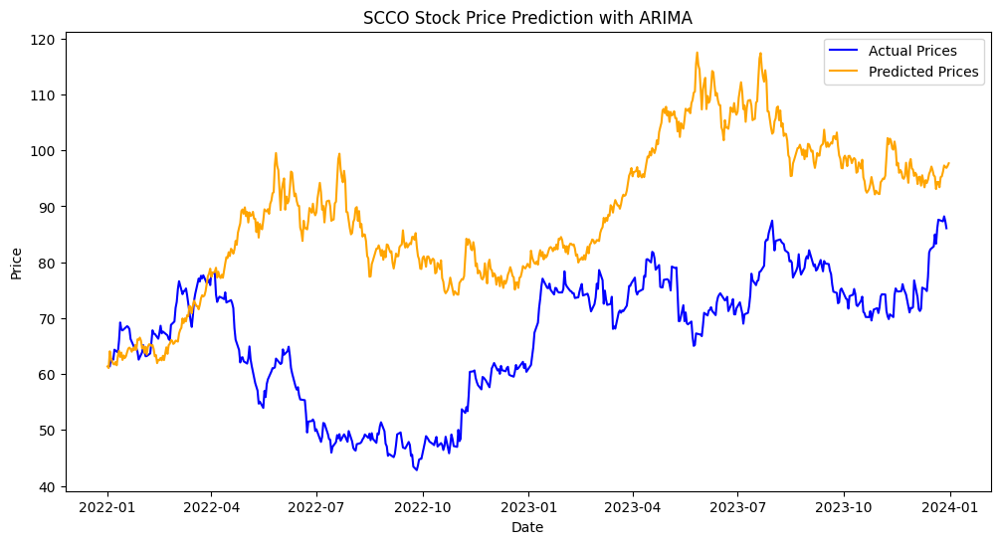

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Average margin of difference for SCCO: 17.30
Average margin of difference for SCCO (percentage): 30.50%
Directional accuracy for SCCO: 50.50%


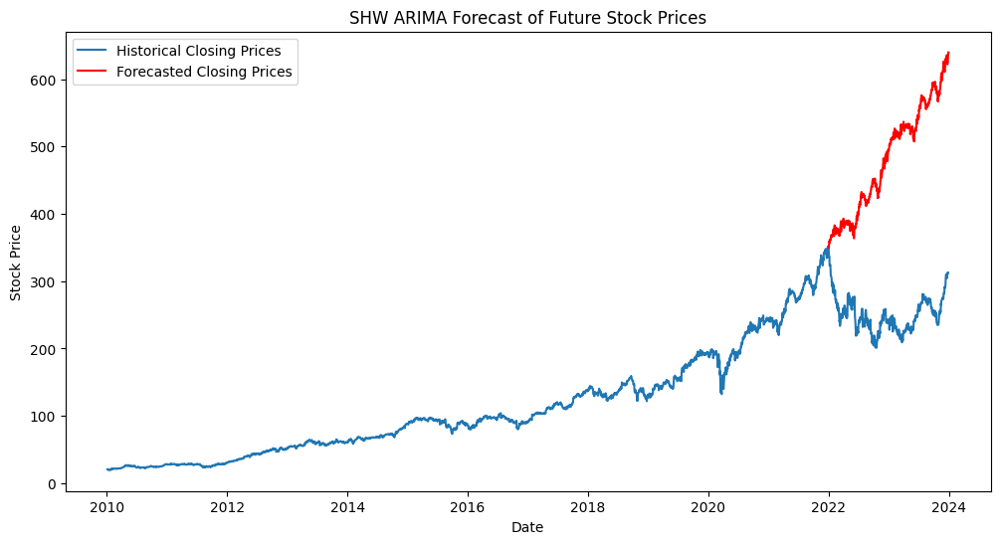

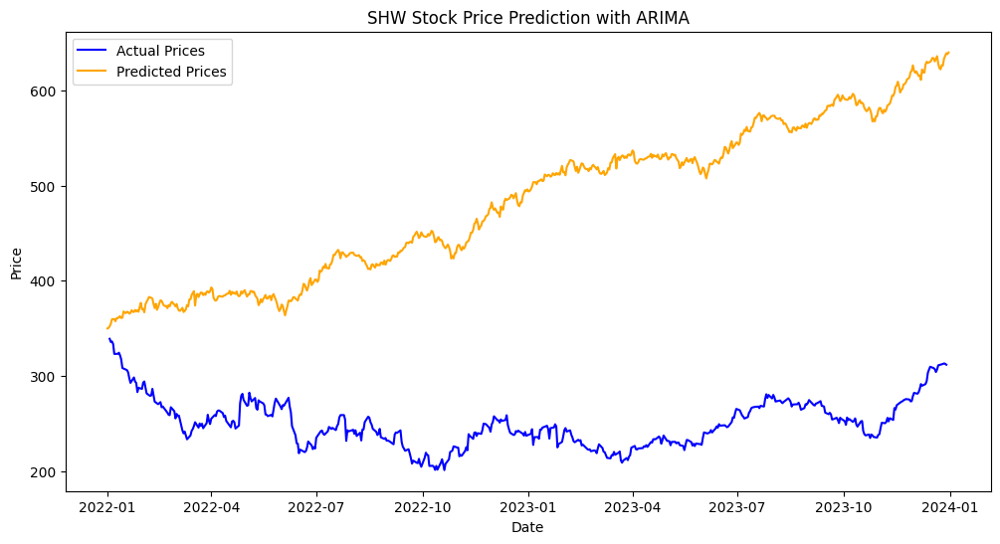


Average margin of difference for SHW: 190.38
Average margin of difference for SHW (percentage): 77.55%
Directional accuracy for SHW: 52.50%


In [ ]:
import yfinance as yf
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import numpy as np

# Function to create a differenced series to make the data stationary
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return np.array(diff)

# Function to invert differenced value
def inverse_difference(history, yhat, interval=1):
    return yhat + history[-interval]

# Function to calculate the average margin of difference between actual and predicted prices
def average_margin_of_difference(actual, predicted):
    margins = actual.values - predicted
    avg_margin = np.mean(np.abs(margins))
    return avg_margin

# Function to calculate the average margin of difference as a percentage
def average_margin_of_difference_percentage(actual, predicted):
    margins = actual.values - predicted
    avg_margin_percentage = np.mean(np.abs(margins) / actual.values) * 100
    return avg_margin_percentage

# Function to calculate directional accuracy
def directional_accuracy(actual, predicted):
    actual_diff = np.sign(np.diff(actual.values, prepend=actual.values[0]))
    predicted_diff = np.sign(np.diff(predicted, prepend=predicted[0]))
    accuracy = np.mean(actual_diff == predicted_diff) * 100
    return accuracy

# List of tickers
tickers = ["LIN", "SCCO", "SHW"]

# Loop through each ticker
for ticker in tickers:
    # Download historical data for each ticker
    historical_data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(ticker, start="2010-01-01", end="2022-01-01")
    close_prices = data['Close'].values

    # Assuming yearly differencing might be needed
    days_in_year = 365
    differenced = difference(close_prices, days_in_year)

    # Fit ARIMA model on the differenced data
    model = ARIMA(differenced, order=(1,1,1))
    model_fit = model.fit()

    # Forecast for the next two years (2022 to 2024)
    forecast = model_fit.forecast(steps=2*365)  # daily data

    # Invert the differenced forecast to something usable
    history = list(close_prices)
    predictions = []
    day = 1
    for yhat in forecast:
        inverted = inverse_difference(history, yhat, days_in_year)
        predictions.append(inverted)
        history.append(inverted)
        day += 1

    # Plotting the results for historical closing prices and forecasts
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.index, historical_data['Close'], label='Historical Closing Prices')
    forecast_index = pd.date_range(start='2022-01-01', periods=730, freq='D')
    plt.plot(forecast_index, predictions, color='red', label='Forecasted Closing Prices')
    plt.title(f'{ticker} ARIMA Forecast of Future Stock Prices')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

    # Plotting actual prices and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.loc['2022-01-01':].index, historical_data.loc['2022-01-01':]['Close'], label='Actual Prices', color='blue')
    plt.plot(forecast_index, predictions, label='Predicted Prices', color='orange')
    plt.legend()
    plt.title(f"{ticker} Stock Price Prediction with ARIMA")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Calculate and print the average margin of difference
    actual_prices = historical_data.loc['2022-01-01':]['Close']
    predicted_prices = pd.Series(predictions, index=forecast_index)
    avg_margin = average_margin_of_difference(actual_prices, predicted_prices[:len(actual_prices)])
    avg_margin_percentage = average_margin_of_difference_percentage(actual_prices, predicted_prices[:len(actual_prices)])
    direction_accuracy = directional_accuracy(actual_prices, predicted_prices[:len(actual_prices)])

    print(f"\nAverage margin of difference for {ticker}: {avg_margin:.2f}")
    print(f"Average margin of difference for {ticker} (percentage): {avg_margin_percentage:.2f}%")
    print(f"Directional accuracy for {ticker}: {direction_accuracy:.2f}%")


#### LSTM

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating LIN


Epoch 1/50
74/74 [==============================] - 9s 67ms/step - loss: 0.0038 - val_loss: 0.0019
Epoch 2/50
74/74 [==============================] - 4s 47ms/step - loss: 1.9387e-04 - val_loss: 0.0014
Epoch 3/50
74/74 [==============================] - 3s 44ms/step - loss: 1.8154e-04 - val_loss: 0.0013
Epoch 4/50
74/74 [==============================] - 3s 43ms/step - loss: 1.7508e-04 - val_loss: 0.0014
Epoch 5/50
74/74 [==============================] - 7s 99ms/step - loss: 1.6626e-04 - val_loss: 0.0011
Epoch 6/50
74/74 [==============================] - 7s 88ms/step - loss: 1.7486e-04 - val_loss: 0.0011
Epoch 7/50
74/74 [==============================] - 7s 101ms/step - loss: 1.5268e-04 - val_loss: 0.0013
Epoch 8/50
74/74 [==============================] - 8s 105ms/step - loss: 1.5180e-04 - val_loss: 0.0012
Epoch 9/50
74/74 [==============================] - 7s 102ms/step - loss: 1.4201e-04 - val_loss: 0.0015
Epoch 10/50
74/74 [==============================] - 6s 78ms/step - loss: 

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 22ms/step
LIN - Mean Absolute Error (MAE): 337.2943369429941
LIN - Mean Squared Error (MSE): 115107.42409292607
LIN - Root Mean Squared Error (RMSE): 339.2748503690276


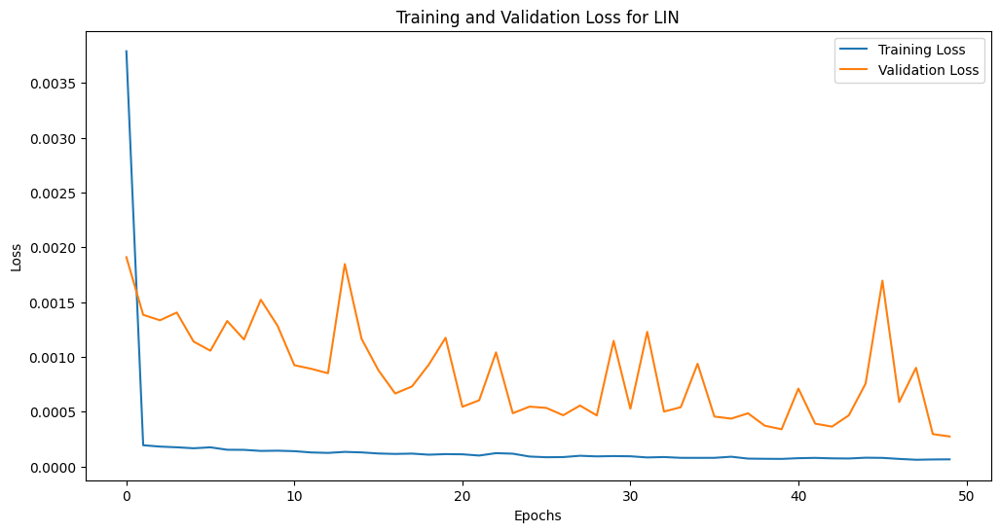

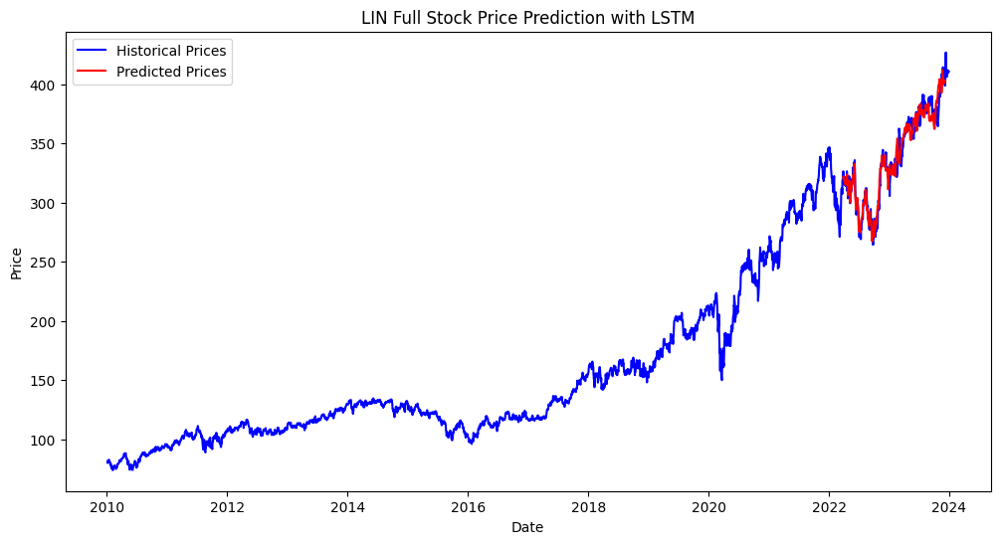

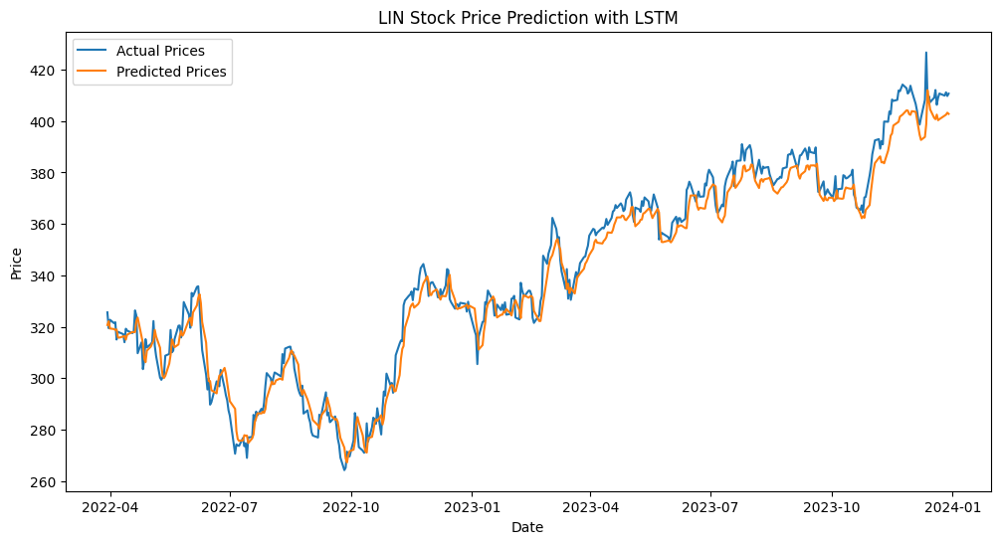

CPU times: user 4min 43s, sys: 4.97 s, total: 4min 48s
Wall time: 5min 29s


In [ ]:
%%time
def evaluate_lstm(stock_ticker):
    print(f"Evaluating {stock_ticker}")

    # Fetch Data
    historical_data = yf.download(stock_ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(stock_ticker, start="2010-01-01", end="2022-01-01")
    closing_prices = data['Close']
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(closing_prices.values.reshape(-1, 1))

    # Prepare Data
    SEQ_LENGTH = 60
    x, y = create_sequences(scaled_data, SEQ_LENGTH)
    split = int(0.8 * len(x))
    x_train, x_val = x[:split], x[split:]
    y_train, y_val = y[:split], y[split:]

    # Build Model
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(SEQ_LENGTH, 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train Model
    history = model.fit(x_train, y_train, validation_data=(x_val, y_val), batch_size=32, epochs=50)

    # Evaluate Model
    test_data = yf.download(stock_ticker, start="2022-01-01", end="2024-01-01")
    scaled_test_data = scaler.transform(test_data['Close'].values.reshape(-1, 1))
    x_test, y_test = create_sequences(scaled_test_data, SEQ_LENGTH)

    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Calculate error metrics
    mae = mean_absolute_error(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    rmse = math.sqrt(mse)

    print(f"{stock_ticker} - Mean Absolute Error (MAE): {mae}")
    print(f"{stock_ticker} - Mean Squared Error (MSE): {mse}")
    print(f"{stock_ticker} - Root Mean Squared Error (RMSE): {rmse}")

    # Plot training and validation loss
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title(f"Training and Validation Loss for {stock_ticker}")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(historical_data['Close'], label='Historical Prices', color='blue')
    forecast_dates = pd.date_range(start=test_data.index[SEQ_LENGTH], periods=len(predictions), freq='B')
    plt.plot(forecast_dates, predictions.flatten(), label='Predicted Prices', color='red')
    plt.legend()
    plt.title(f"{stock_ticker} Full Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Plot actual vs predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(test_data.index[SEQ_LENGTH:], test_data['Close'][SEQ_LENGTH:], label='Actual Prices')
    plt.plot(test_data.index[SEQ_LENGTH:], predictions, label='Predicted Prices')
    plt.legend()
    plt.title(f"{stock_ticker} Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()


# Helper function to create sequences
def create_sequences(data, seq_length):
    x = []
    y = []
    for i in range(seq_length, len(data)):
        x.append(data[i - seq_length:i])
        y.append(data[i])
    return np.array(x), np.array(y)


# Evaluate for multiple stocks
for ticker in ["LIN", "SCCO", "SHW"]:
    evaluate_lstm(ticker)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating LIN


Epoch 1/50
74/74 [==============================] - 9s 69ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 2/50
74/74 [==============================] - 5s 63ms/step - loss: 1.9044e-04 - val_loss: 0.0018
Epoch 3/50
74/74 [==============================] - 4s 50ms/step - loss: 1.9235e-04 - val_loss: 0.0012
Epoch 4/50
74/74 [==============================] - 4s 49ms/step - loss: 1.6566e-04 - val_loss: 0.0010
Epoch 5/50
74/74 [==============================] - 5s 74ms/step - loss: 1.6370e-04 - val_loss: 0.0014
Epoch 6/50
74/74 [==============================] - 4s 49ms/step - loss: 1.6126e-04 - val_loss: 0.0013
Epoch 7/50
74/74 [==============================] - 4s 51ms/step - loss: 1.4439e-04 - val_loss: 0.0013
Epoch 8/50
74/74 [==============================] - 5s 71ms/step - loss: 1.4217e-04 - val_loss: 9.3381e-04
Epoch 9/50
74/74 [==============================] - 4s 51ms/step - loss: 1.3783e-04 - val_loss: 0.0013
Epoch 10/50
74/74 [==============================] - 4s 50ms/step - loss:

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 2s 27ms/step
LIN - Mean Absolute Error (MAE): 335.2843896657434
LIN - Mean Squared Error (MSE): 113718.98389334818
LIN - Root Mean Squared Error (RMSE): 337.2224546102293


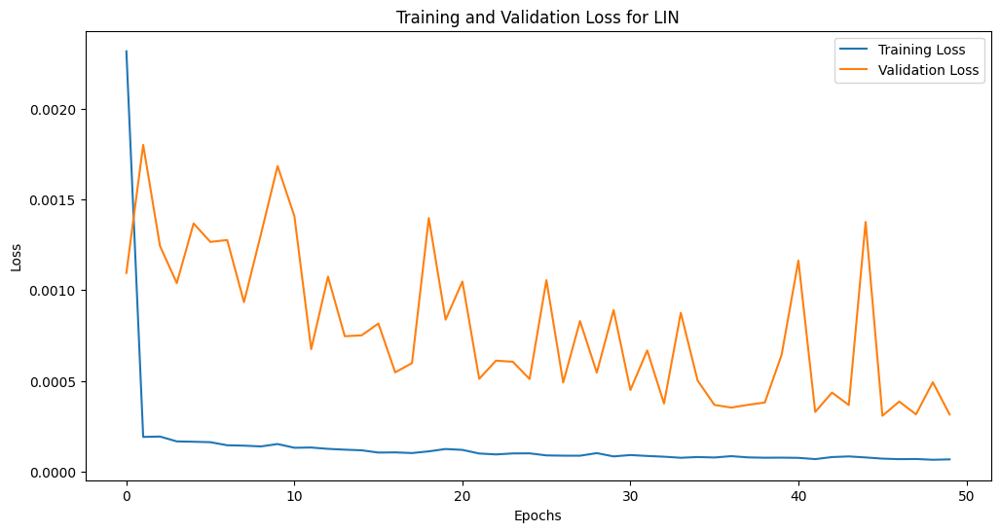

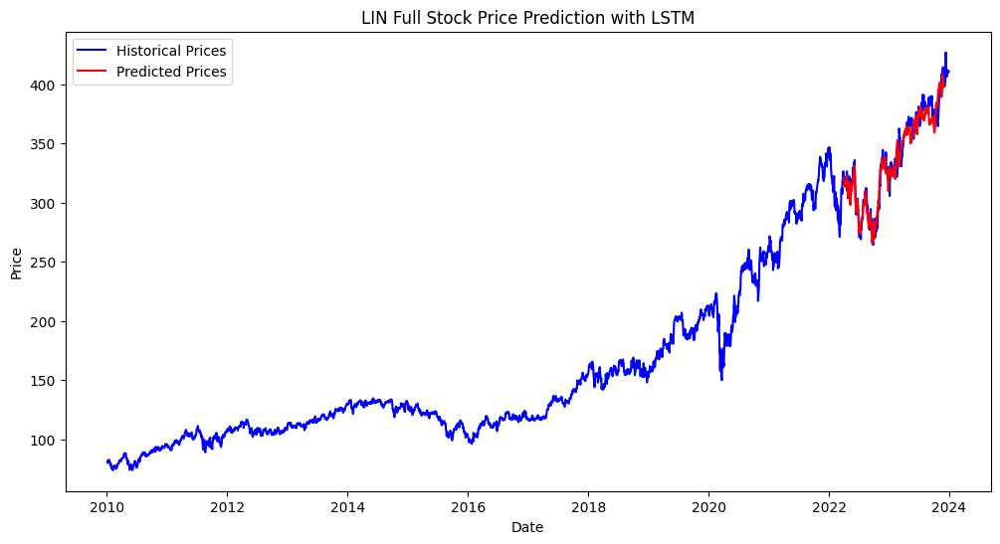

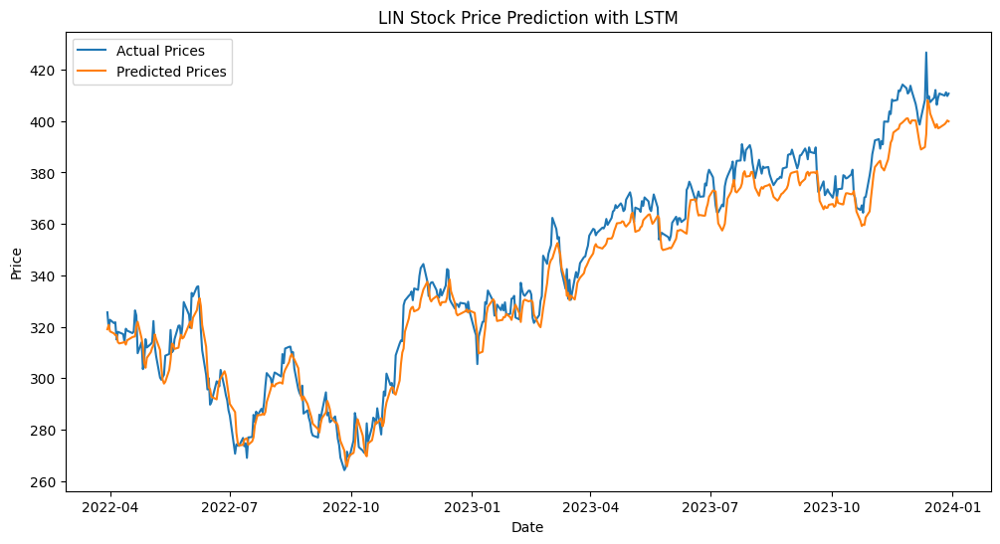

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Average margin of difference for LIN: 6.52
Average margin of difference for LIN (percentage): 1.88%
Directional accuracy for LIN: 46.49%
Evaluating SCCO


Epoch 1/50
74/74 [==============================] - 8s 64ms/step - loss: 0.0036 - val_loss: 0.0020
Epoch 2/50
74/74 [==============================] - 6s 75ms/step - loss: 7.2846e-04 - val_loss: 0.0018
Epoch 3/50
74/74 [==============================] - 4s 51ms/step - loss: 6.3382e-04 - val_loss: 0.0016
Epoch 4/50
74/74 [==============================] - 4s 51ms/step - loss: 5.5927e-04 - val_loss: 0.0015
Epoch 5/50
74/74 [==============================] - 5s 66ms/step - loss: 5.2334e-04 - val_loss: 0.0014
Epoch 6/50
74/74 [==============================] - 4s 58ms/step - loss: 5.1551e-04 - val_loss: 0.0016
Epoch 7/50
74/74 [==============================] - 4s 52ms/step - loss: 4.5210e-04 - val_loss: 0.0012
Epoch 8/50
74/74 [==============================] - 5s 66ms/step - loss: 4.1586e-04 - val_loss: 0.0011
Epoch 9/50
74/74 [==============================] - 4s 59ms/step - loss: 4.0638e-04 - val_loss: 0.0010
Epoch 10/50
74/74 [==============================] - 4s 53ms/step - loss: 3.9

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 20ms/step
SCCO - Mean Absolute Error (MAE): 66.05166490613516
SCCO - Mean Squared Error (MSE): 4499.282253969942
SCCO - Root Mean Squared Error (RMSE): 67.07668934861009


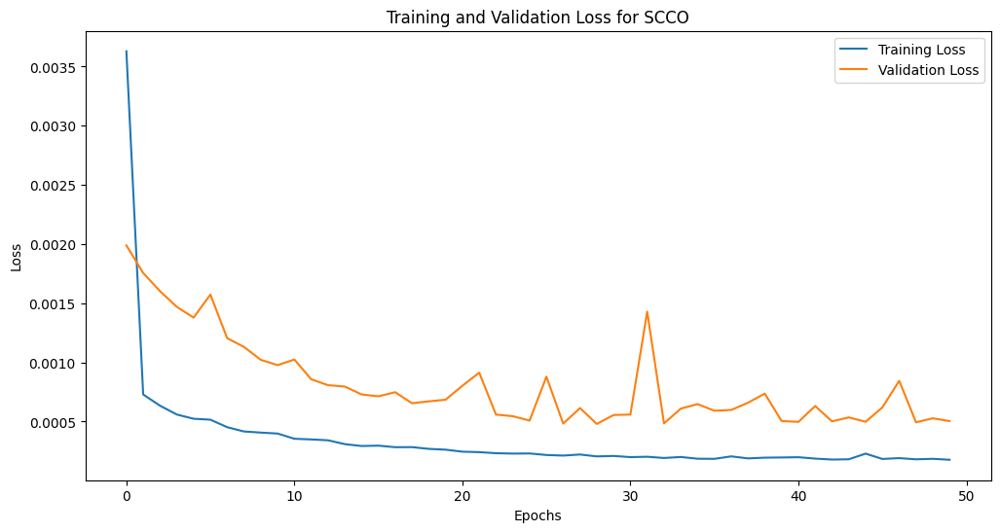

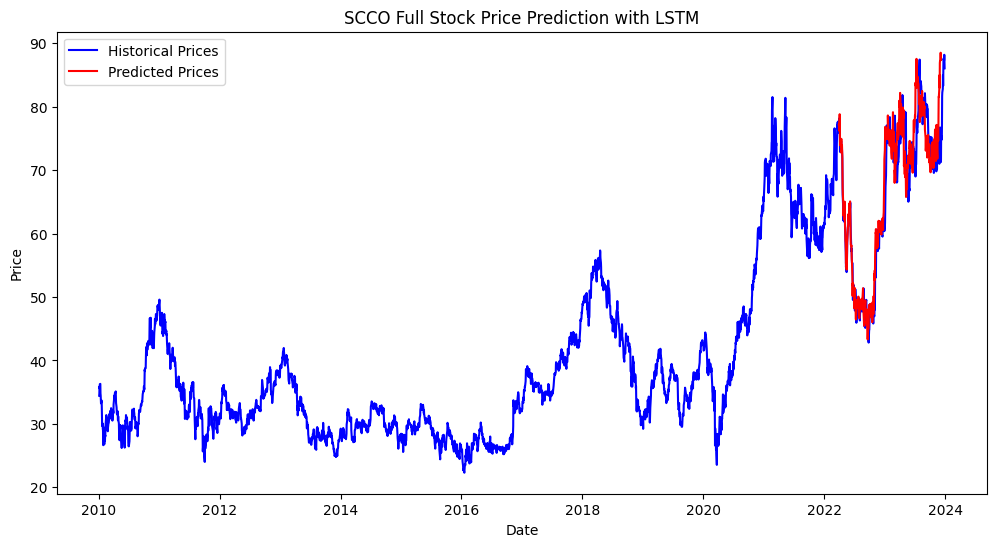

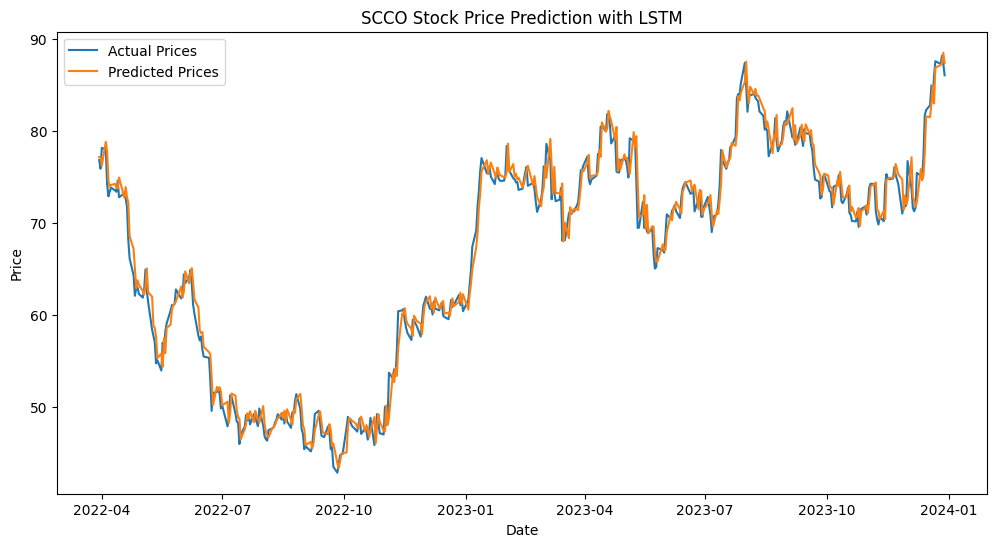

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Average margin of difference for SCCO: 1.22
Average margin of difference for SCCO (percentage): 1.88%
Directional accuracy for SCCO: 53.29%
Evaluating SHW


Epoch 1/50
74/74 [==============================] - 11s 76ms/step - loss: 0.0017 - val_loss: 5.1528e-04
Epoch 2/50
74/74 [==============================] - 5s 74ms/step - loss: 1.1188e-04 - val_loss: 5.7727e-04
Epoch 3/50
74/74 [==============================] - 5s 70ms/step - loss: 1.1744e-04 - val_loss: 7.6747e-04
Epoch 4/50
74/74 [==============================] - 5s 61ms/step - loss: 1.1870e-04 - val_loss: 5.5420e-04
Epoch 5/50
74/74 [==============================] - 6s 80ms/step - loss: 1.0269e-04 - val_loss: 6.0796e-04
Epoch 6/50
74/74 [==============================] - 4s 60ms/step - loss: 1.2086e-04 - val_loss: 7.2755e-04
Epoch 7/50
74/74 [==============================] - 5s 61ms/step - loss: 1.0475e-04 - val_loss: 9.5777e-04
Epoch 8/50
74/74 [==============================] - 6s 80ms/step - loss: 9.3398e-05 - val_loss: 0.0014
Epoch 9/50
74/74 [==============================] - 5s 62ms/step - loss: 8.8909e-05 - val_loss: 6.4534e-04
Epoch 10/50
74/74 [=========================

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 20ms/step
SHW - Mean Absolute Error (MAE): 241.73858120166625
SHW - Mean Squared Error (MSE): 58845.755223189444
SHW - Root Mean Squared Error (RMSE): 242.58144039309653


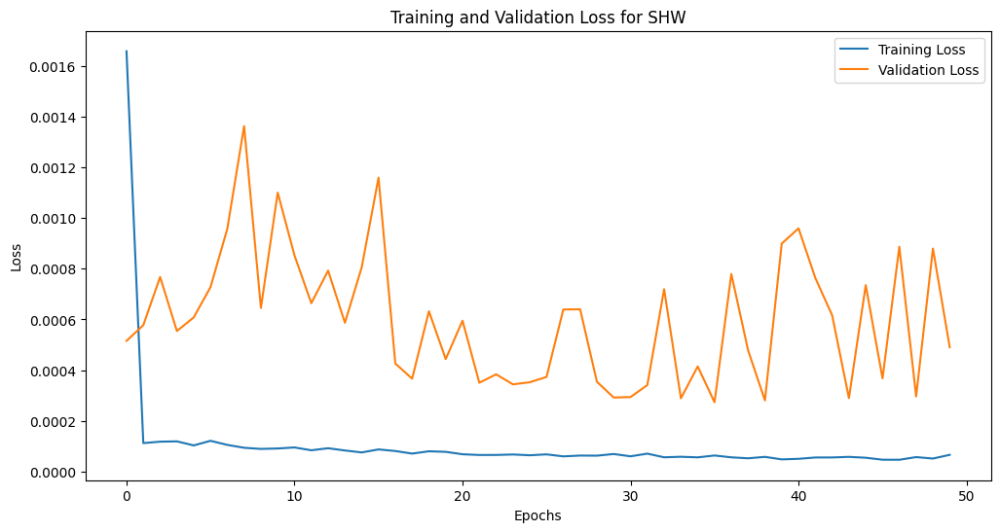

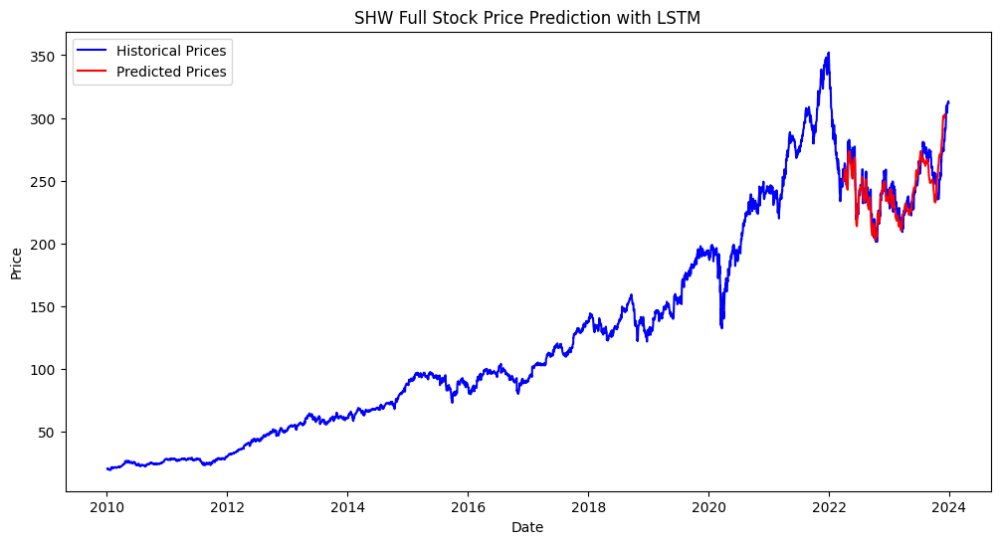

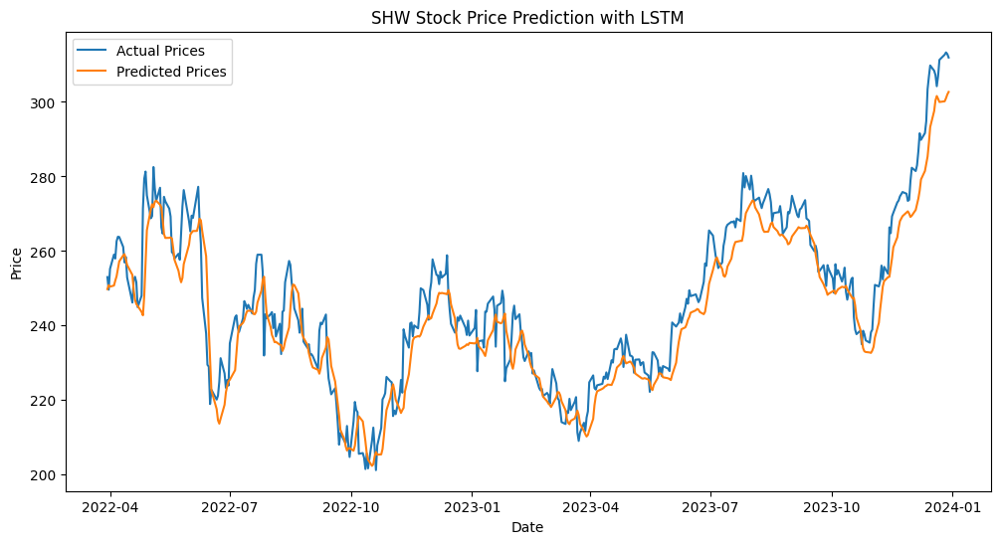

Average margin of difference for SHW: 6.16
Average margin of difference for SHW (percentage): 2.47%
Directional accuracy for SHW: 45.58%


In [ ]:
# Import Libraries
import yfinance as yf
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import math

# Function to create LSTM model and evaluate it
def evaluate_lstm(stock_ticker):
    print(f"Evaluating {stock_ticker}")

    # Fetch Data
    historical_data = yf.download(stock_ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(stock_ticker, start="2010-01-01", end="2022-01-01")
    closing_prices = data['Close']
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(closing_prices.values.reshape(-1, 1))

    # Prepare Data
    SEQ_LENGTH = 60
    x, y = create_sequences(scaled_data, SEQ_LENGTH)
    split = int(0.8 * len(x))
    x_train, x_val = x[:split], x[split:]
    y_train, y_val = y[:split], y[split:]

    # Build Model
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(SEQ_LENGTH, 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train Model
    history = model.fit(x_train, y_train, validation_data=(x_val, y_val), batch_size=32, epochs=50)

    # Evaluate Model
    test_data = yf.download(stock_ticker, start="2022-01-01", end="2024-01-01")
    scaled_test_data = scaler.transform(test_data['Close'].values.reshape(-1, 1))
    x_test, y_test = create_sequences(scaled_test_data, SEQ_LENGTH)

    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Calculate error metrics
    mae = mean_absolute_error(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    rmse = math.sqrt(mse)

    print(f"{stock_ticker} - Mean Absolute Error (MAE): {mae}")
    print(f"{stock_ticker} - Mean Squared Error (MSE): {mse}")
    print(f"{stock_ticker} - Root Mean Squared Error (RMSE): {rmse}")

    # Plot training and validation loss
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title(f"Training and Validation Loss for {stock_ticker}")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(historical_data['Close'], label='Historical Prices', color='blue')
    forecast_dates = pd.date_range(start=test_data.index[SEQ_LENGTH], periods=len(predictions), freq='B')
    plt.plot(forecast_dates, predictions.flatten(), label='Predicted Prices', color='red')
    plt.legend()
    plt.title(f"{stock_ticker} Full Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Plot actual vs predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(test_data.index[SEQ_LENGTH:], test_data['Close'][SEQ_LENGTH:], label='Actual Prices')
    plt.plot(test_data.index[SEQ_LENGTH:], predictions, label='Predicted Prices')
    plt.legend()
    plt.title(f"{stock_ticker} Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Calculate and print the average margin of difference
    avg_margin = average_margin_of_difference(test_data['Close'][SEQ_LENGTH:], predictions.flatten())
    avg_margin_percentage = average_margin_of_difference_percentage(test_data['Close'][SEQ_LENGTH:], predictions.flatten())
    direction_accuracy = directional_accuracy(test_data['Close'][SEQ_LENGTH:], predictions.flatten())

    print(f"Average margin of difference for {stock_ticker}: {avg_margin:.2f}")
    print(f"Average margin of difference for {stock_ticker} (percentage): {avg_margin_percentage:.2f}%")
    print(f"Directional accuracy for {stock_ticker}: {direction_accuracy:.2f}%")

# Helper function to create sequences
def create_sequences(data, seq_length):
    x = []
    y = []
    for i in range(seq_length, len(data)):
        x.append(data[i - seq_length:i])
        y.append(data[i])
    return np.array(x), np.array(y)

# Function to calculate the average margin of difference between actual and predicted prices
def average_margin_of_difference(actual, predicted):
    margins = actual.values - predicted
    avg_margin = np.mean(np.abs(margins))
    return avg_margin

# Function to calculate the average margin of difference as a percentage
def average_margin_of_difference_percentage(actual, predicted):
    margins = actual.values - predicted
    avg_margin_percentage = np.mean(np.abs(margins) / actual.values) * 100
    return avg_margin_percentage

# Function to calculate directional accuracy
def directional_accuracy(actual, predicted):
    actual_diff = np.sign(np.diff(actual.values, prepend=actual.values[0]))
    predicted_diff = np.sign(np.diff(predicted, prepend=predicted[0]))
    accuracy = np.mean(actual_diff == predicted_diff) * 100
    return accuracy

# Evaluate for multiple stocks
for ticker in ["LIN", "SCCO", "SHW"]:
    evaluate_lstm(ticker)


#### FB Prophet

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/0v6219mq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/puebz0om.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12', 'data', 'file=/tmp/tmp3z430iy9/0v6219mq.json', 'init=/tmp/tmp3z430iy9/puebz0om.json', 'output', 'file=/tmp/tmp3z430iy9/prophet_model4awwvex5/prophet_model-20240513161953.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:19:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:19:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


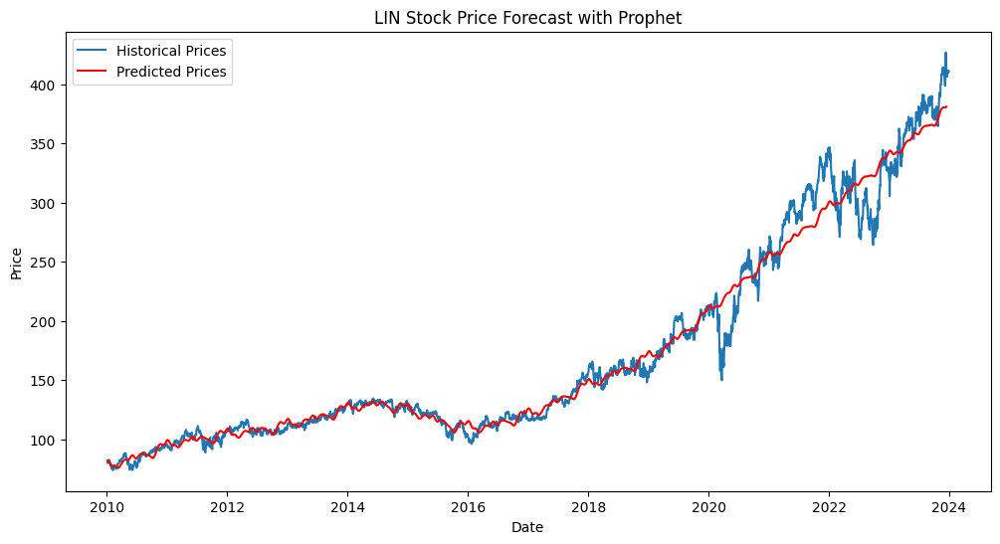

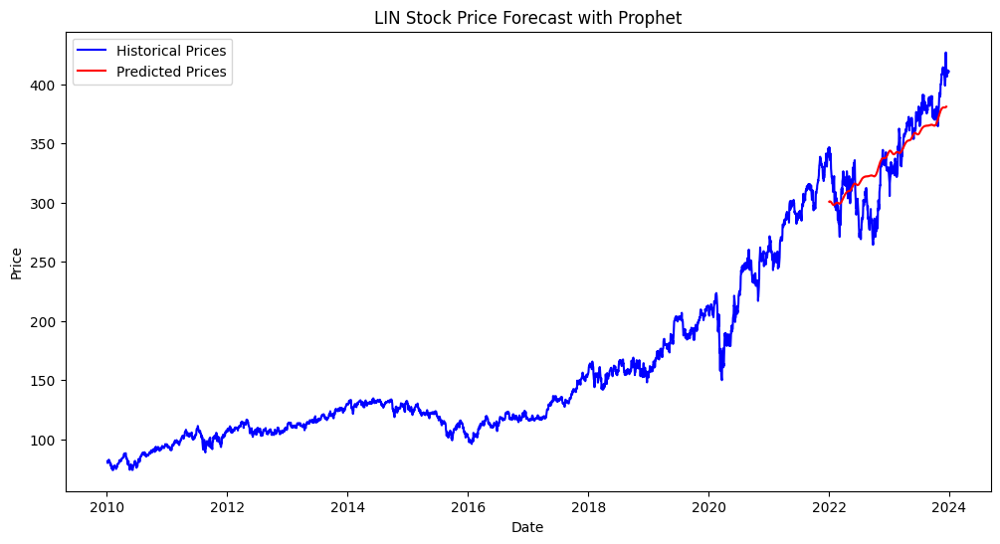

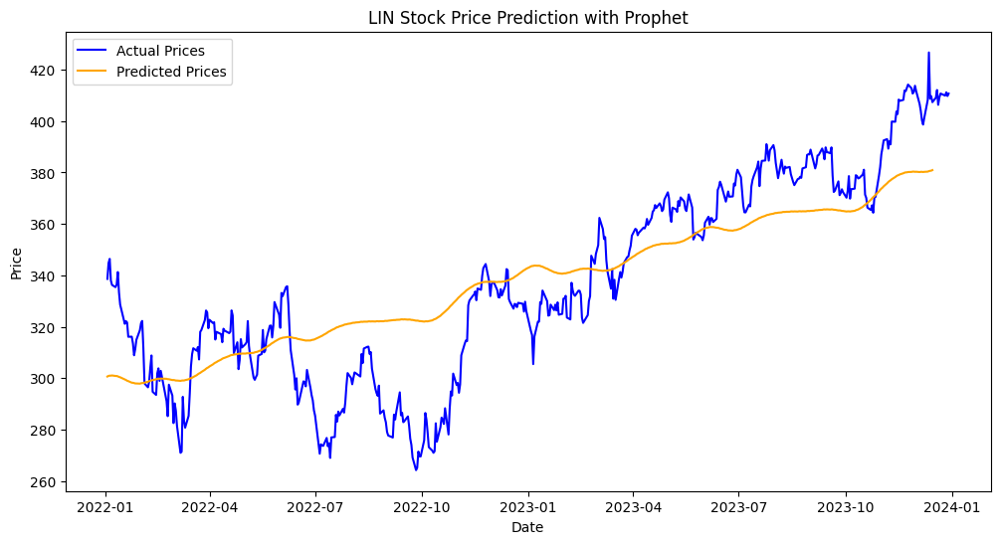

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/l4ylslg2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/6n85arw8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42525', 'data', 'file=/tmp/tmp3z430iy9/l4ylslg2.json', 'init=/tmp/tmp3z430iy9/6n85arw8.json', 'output', 'file=/tmp/tmp3z430iy9/prophet_model7fr27hi9/prophet_model-20240513161957.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:19:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:19:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


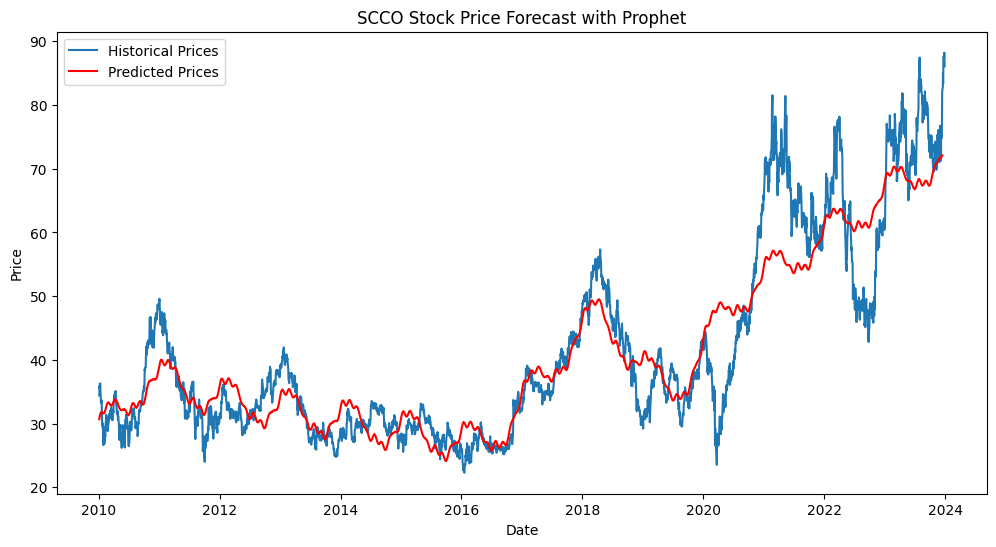

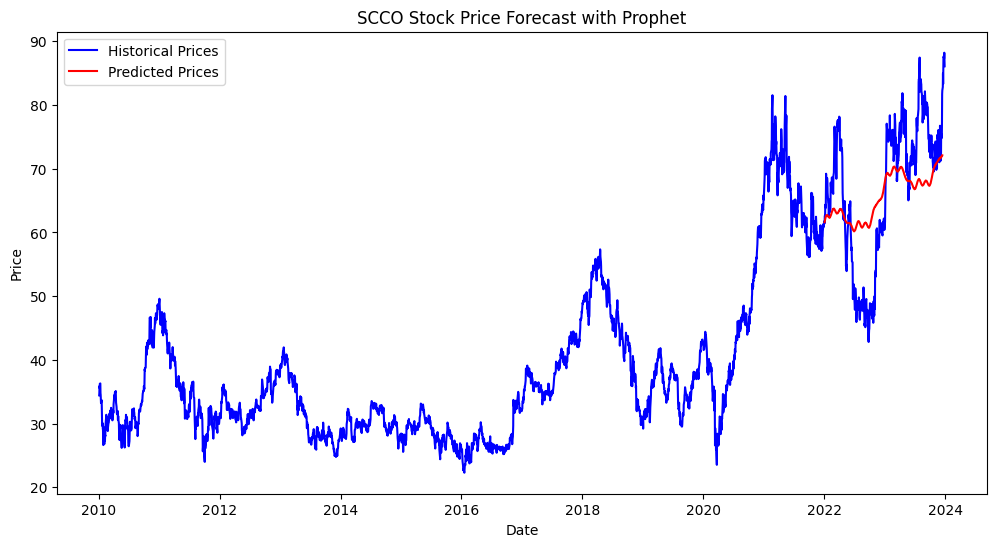

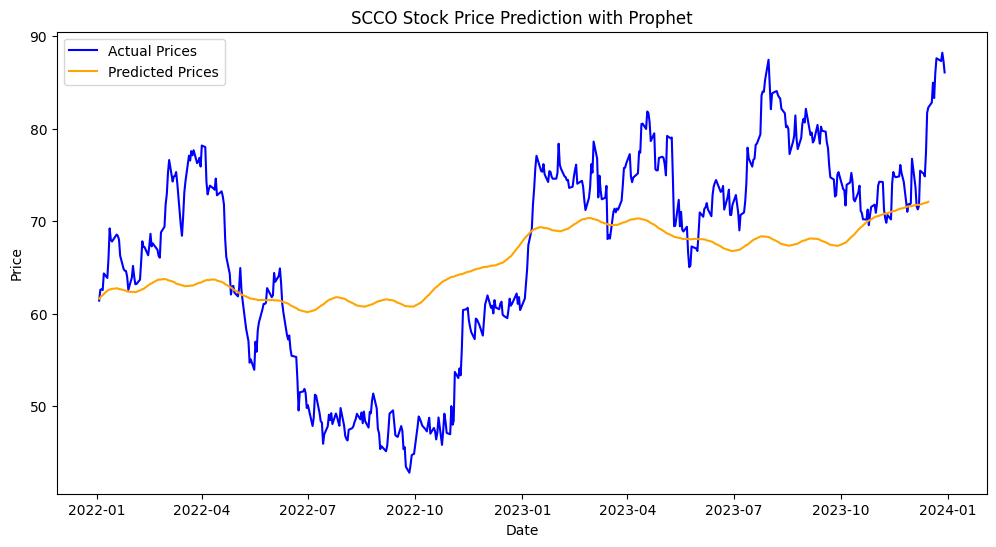

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/0z2igb1n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/99zjsl4u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6077', 'data', 'file=/tmp/tmp3z430iy9/0z2igb1n.json', 'init=/tmp/tmp3z430iy9/99zjsl4u.json', 'output', 'file=/tmp/tmp3z430iy9/prophet_modelh1yv4z42/prophet_model-20240513162000.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:20:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:20:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


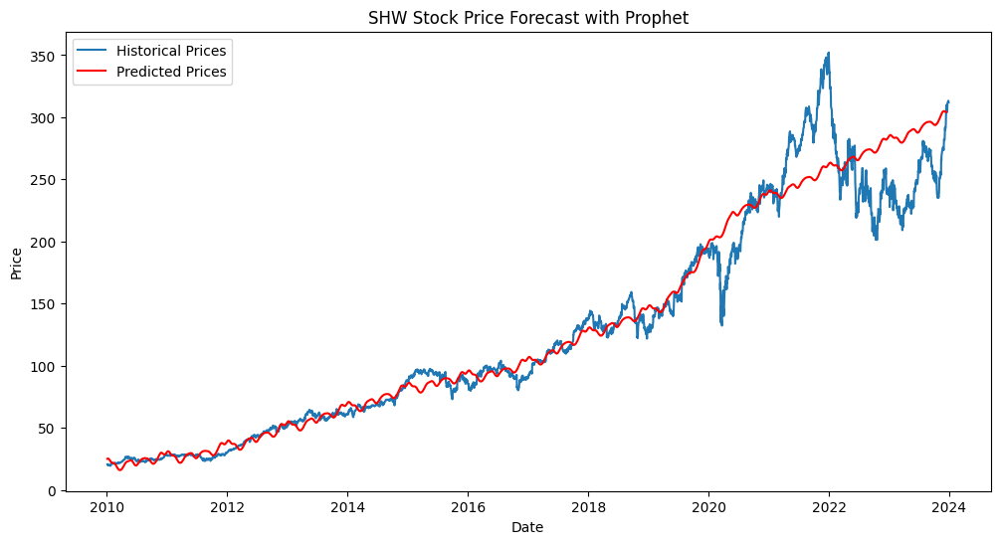

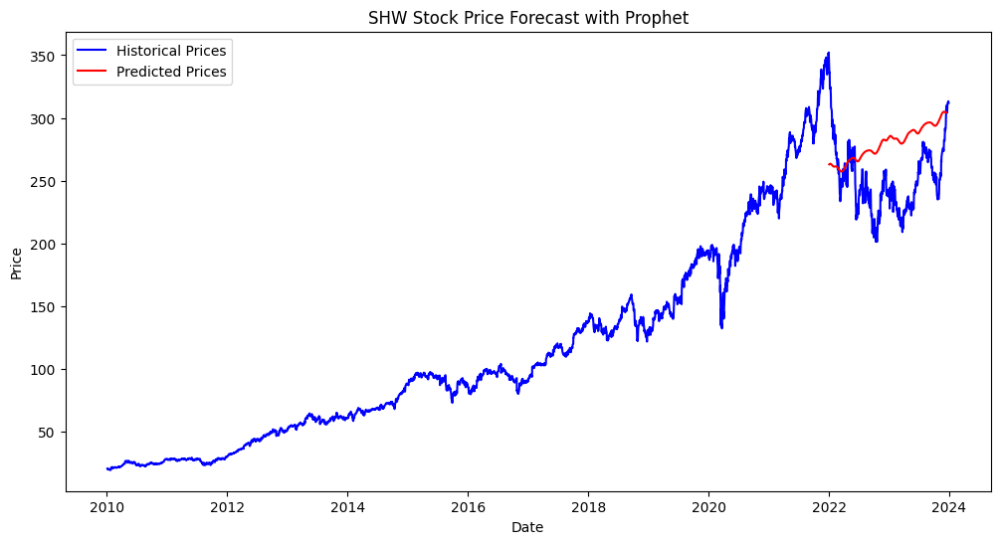

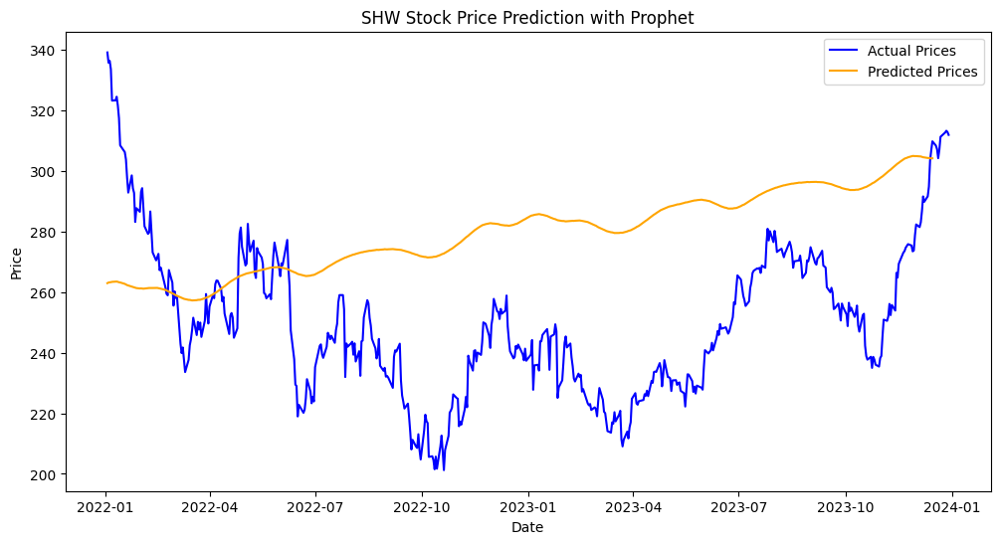

CPU times: user 6.82 s, sys: 1.57 s, total: 8.39 s
Wall time: 10.1 s


In [ ]:
%%time
# beginning of forecast is 2023
from prophet import Prophet
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

def run_prophet(ticker):
    # Download data
    data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    df = pd.DataFrame(data['Close'])
    df.reset_index(inplace=True)
    df.rename(columns={'Date': 'ds', 'Close': 'y'}, inplace=True)

    # Fit the Prophet model on data up to the beginning of 2023
    m = Prophet(daily_seasonality=False)
    m.fit(df[df['ds'] < '2023-01-01'])  # Train only on data before 2023

    # Create future dataframe for forecasting
    future = m.make_future_dataframe(periods=len(data['2023-01-01':]), freq='B')
    forecast = m.predict(future)

    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices')
    plt.plot(forecast['ds'], forecast['yhat'], color='red', label='Predicted Prices')
    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()
    # Plot historical and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices', color='blue')  # Historical prices

    # Only plot predicted prices starting from 2023
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], color='red', label='Predicted Prices')  # Predicted prices

    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    # Filter actual data for plotting
    actual_data = df[df['ds'] >= '2022-01-01']
    plt.plot(actual_data['ds'], actual_data['y'], label='Actual Prices', color='blue')

    # Filter forecast data for plotting
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], label='Predicted Prices', color='orange')

    plt.title(f"{ticker} Stock Price Prediction with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

run_prophet("LIN")
run_prophet("SCCO")
run_prophet("SHW")


[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/u42czfw6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/tbvyvwjc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79120', 'data', 'file=/tmp/tmpsxv04hob/u42czfw6.json', 'init=/tmp/tmpsxv04hob/tbvyvwjc.json', 'output', 'file=/tmp/tmpsxv04hob/prophet_model69v0kmm3/prophet_model-20240518173308.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:33:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


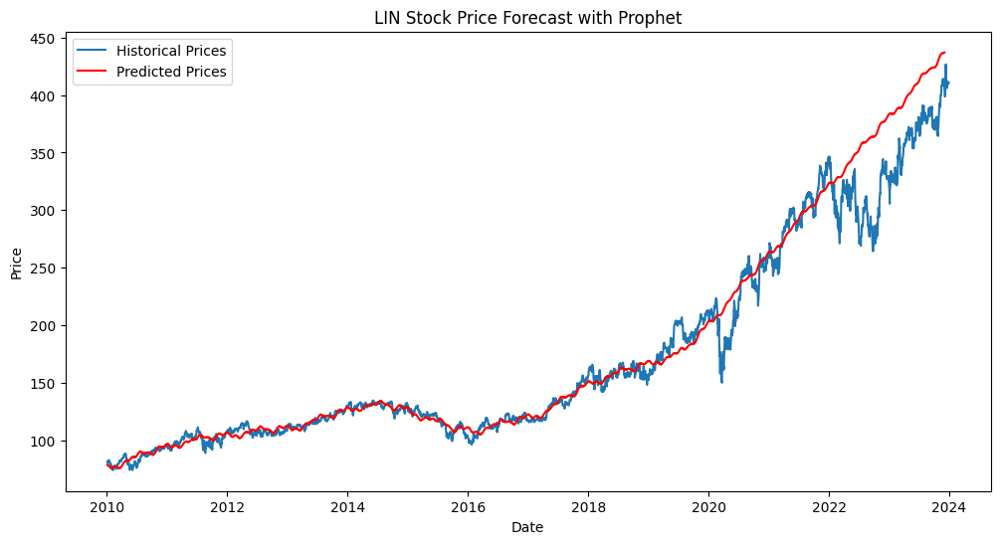

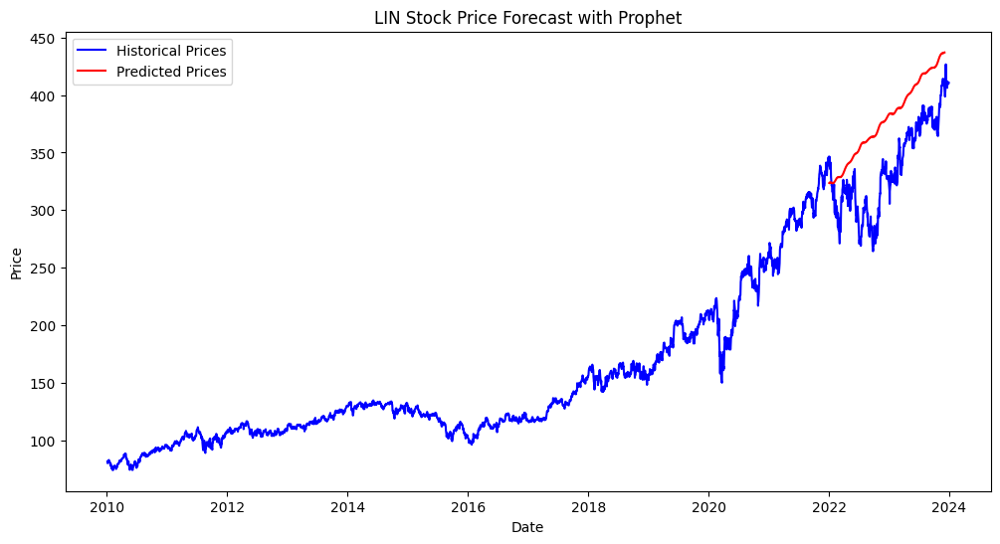

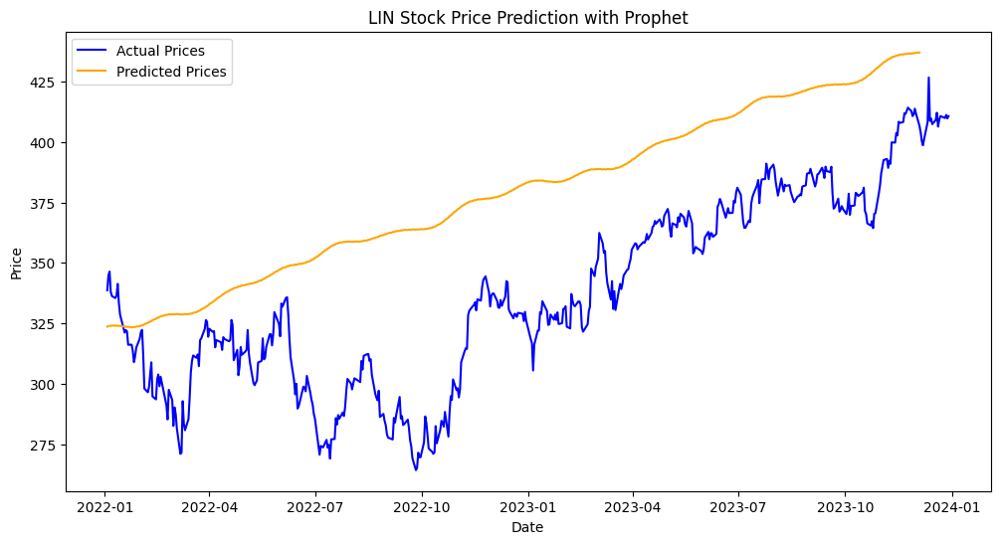

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/s4mpf2fm.json


Average margin of difference for LIN: 42.31
Average margin of difference for LIN (percentage): 13.12%
Directional accuracy for LIN: 52.30%


DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/ui4q3_a3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30147', 'data', 'file=/tmp/tmpsxv04hob/s4mpf2fm.json', 'init=/tmp/tmpsxv04hob/ui4q3_a3.json', 'output', 'file=/tmp/tmpsxv04hob/prophet_modelh6tzopjs/prophet_model-20240518173311.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:33:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


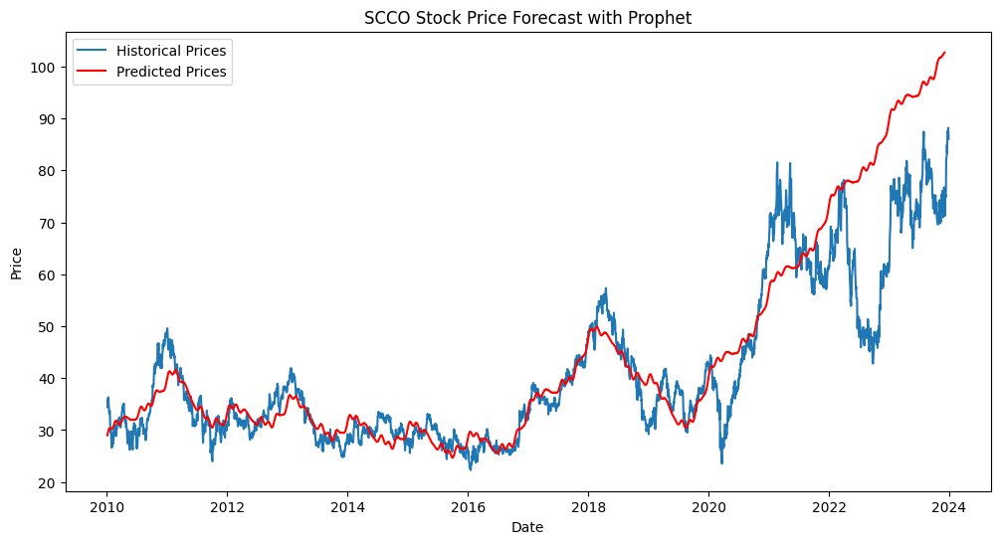

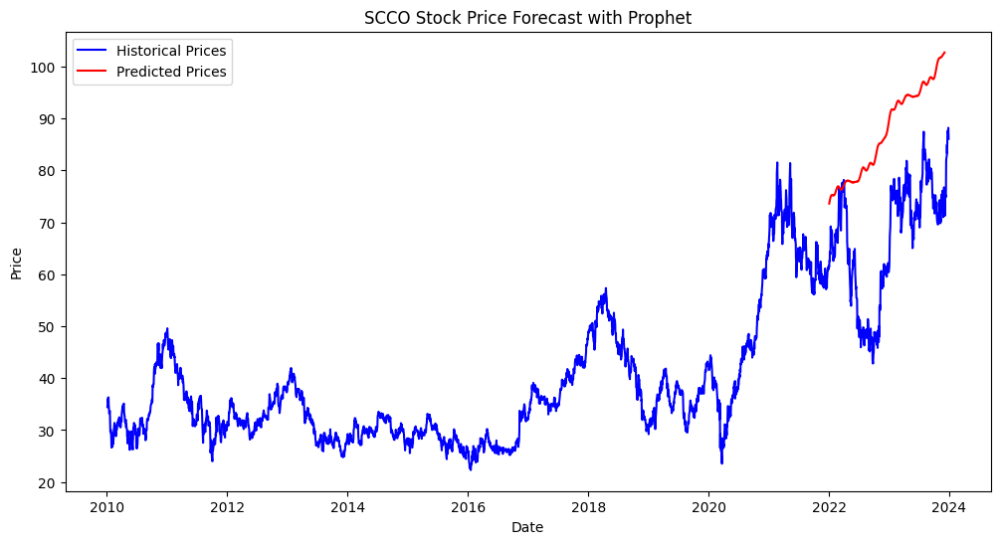

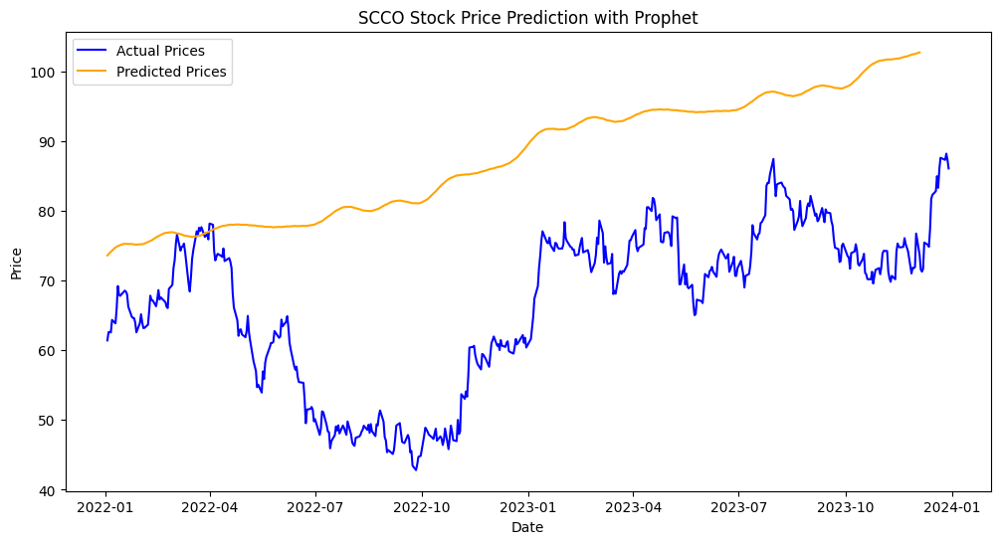

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/_hgrr4ez.json


Average margin of difference for SCCO: 20.71
Average margin of difference for SCCO (percentage): 33.85%
Directional accuracy for SCCO: 46.71%


DEBUG:cmdstanpy:input tempfile: /tmp/tmpsxv04hob/lzvbk_zr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97341', 'data', 'file=/tmp/tmpsxv04hob/_hgrr4ez.json', 'init=/tmp/tmpsxv04hob/lzvbk_zr.json', 'output', 'file=/tmp/tmpsxv04hob/prophet_modelph_uaza7/prophet_model-20240518173314.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:33:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


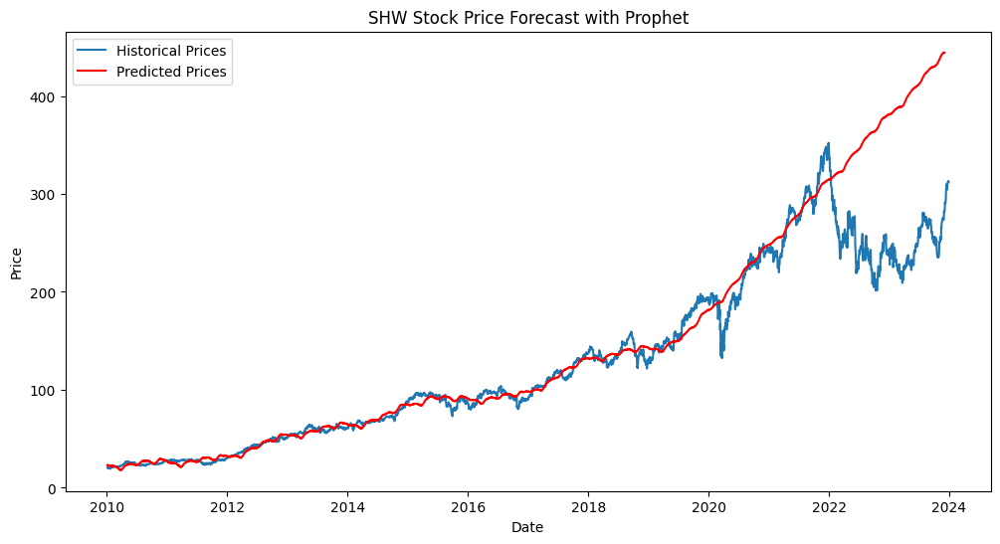

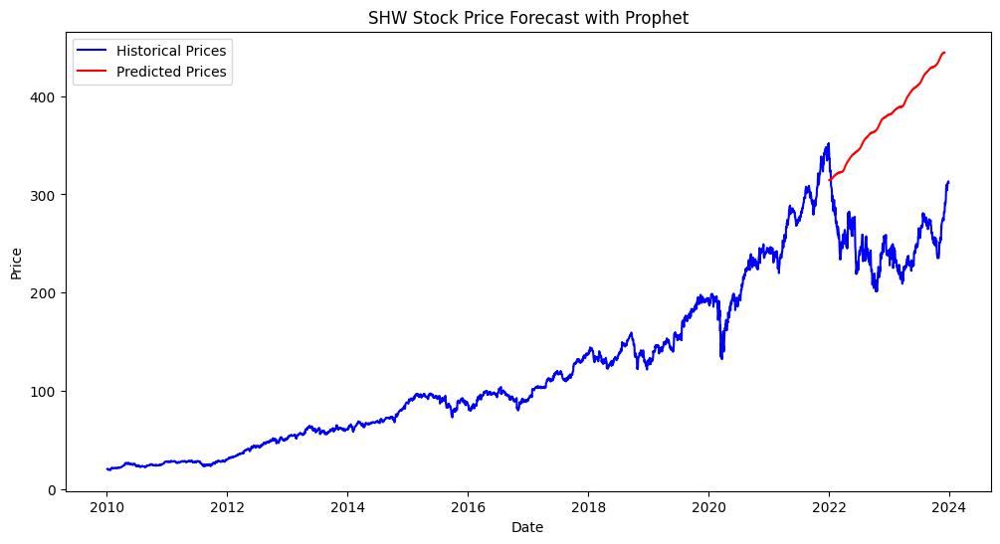

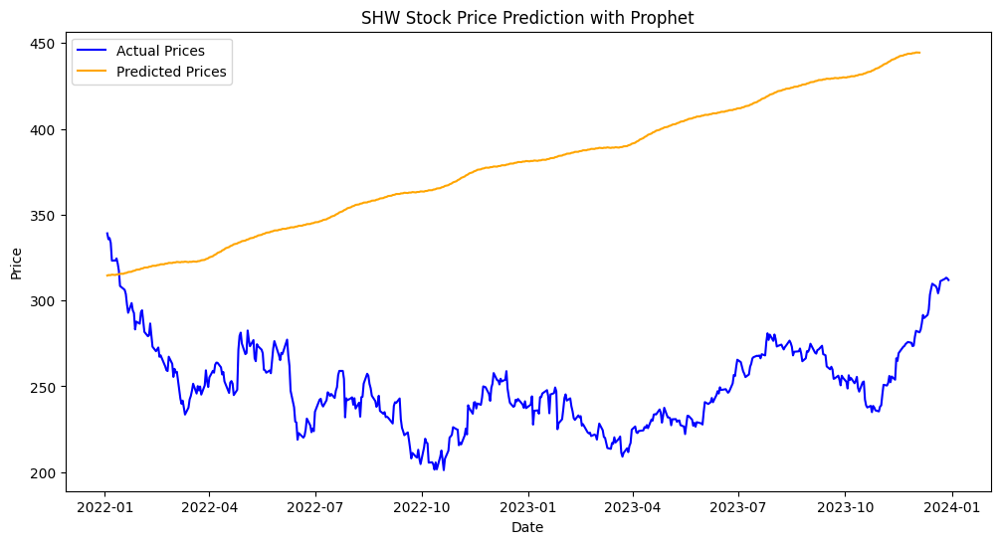

Average margin of difference for SHW: 127.82
Average margin of difference for SHW (percentage): 52.48%
Directional accuracy for SHW: 48.90%


In [ ]:
# beginning of forecast is 2022
from prophet import Prophet
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def run_prophet(ticker):
    # Download data
    data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    df = pd.DataFrame(data['Close'])
    df.reset_index(inplace=True)
    df.rename(columns={'Date': 'ds', 'Close': 'y'}, inplace=True)

    # Fit the Prophet model on data up to the beginning of 2022
    m = Prophet(daily_seasonality=False)
    m.fit(df[df['ds'] < '2022-01-01'])  # Train only on data before 2022

    # Create future dataframe for forecasting
    future = m.make_future_dataframe(periods=len(data['2022-01-01':]), freq='B')
    forecast = m.predict(future)

    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices')
    plt.plot(forecast['ds'], forecast['yhat'], color='red', label='Predicted Prices')
    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    # Plot historical and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices', color='blue')  # Historical prices

    # Only plot predicted prices starting from 2022
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], color='red', label='Predicted Prices')  # Predicted prices

    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    # Filter actual data for plotting
    actual_data = df[df['ds'] >= '2022-01-01']
    plt.plot(actual_data['ds'], actual_data['y'], label='Actual Prices', color='blue')

    # Filter forecast data for plotting
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], label='Predicted Prices', color='orange')

    plt.title(f"{ticker} Stock Price Prediction with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    # Calculate and print the average margin of difference
    avg_margin = average_margin_of_difference(actual_data['y'], forecasted_data['yhat'])
    avg_margin_percentage = average_margin_of_difference_percentage(actual_data['y'], forecasted_data['yhat'])
    direction_accuracy = directional_accuracy(actual_data['y'], forecasted_data['yhat'])

    print(f"Average margin of difference for {ticker}: {avg_margin:.2f}")
    print(f"Average margin of difference for {ticker} (percentage): {avg_margin_percentage:.2f}%")
    print(f"Directional accuracy for {ticker}: {direction_accuracy:.2f}%")

# Function to calculate the average margin of difference between actual and predicted prices
def average_margin_of_difference(actual, predicted):
    margins = actual.values - predicted.values
    avg_margin = np.mean(np.abs(margins))
    return avg_margin

# Function to calculate the average margin of difference as a percentage
def average_margin_of_difference_percentage(actual, predicted):
    margins = actual.values - predicted.values
    avg_margin_percentage = np.mean(np.abs(margins) / actual.values) * 100
    return avg_margin_percentage

# Function to calculate directional accuracy
def directional_accuracy(actual, predicted):
    actual_diff = np.sign(np.diff(actual.values, prepend=actual.values[0]))
    predicted_diff = np.sign(np.diff(predicted.values, prepend=predicted.values[0]))
    accuracy = np.mean(actual_diff == predicted_diff) * 100
    return accuracy

# Run the Prophet model for multiple stocks
run_prophet("LIN")
run_prophet("SCCO")
run_prophet("SHW")


### Industrial Sector Models

#### ARIMA

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


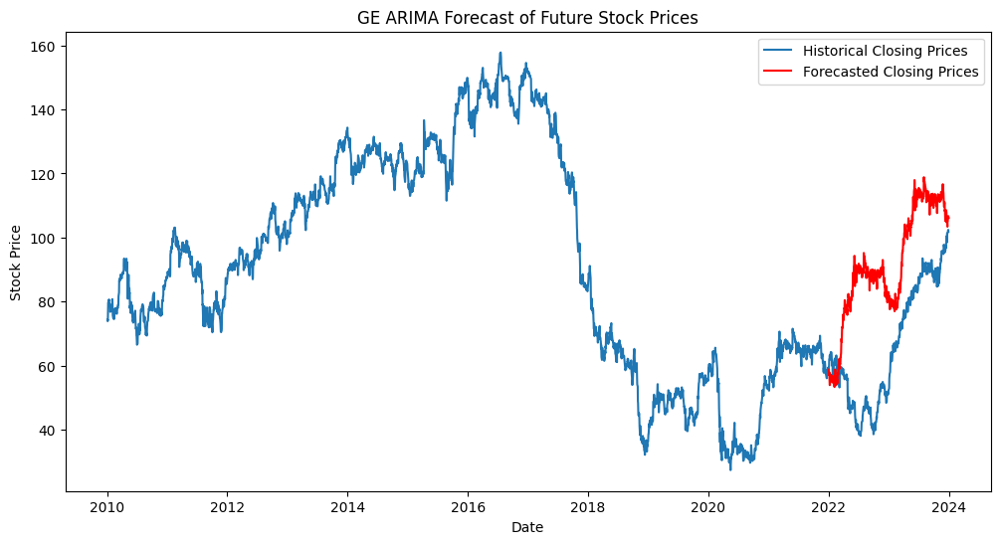

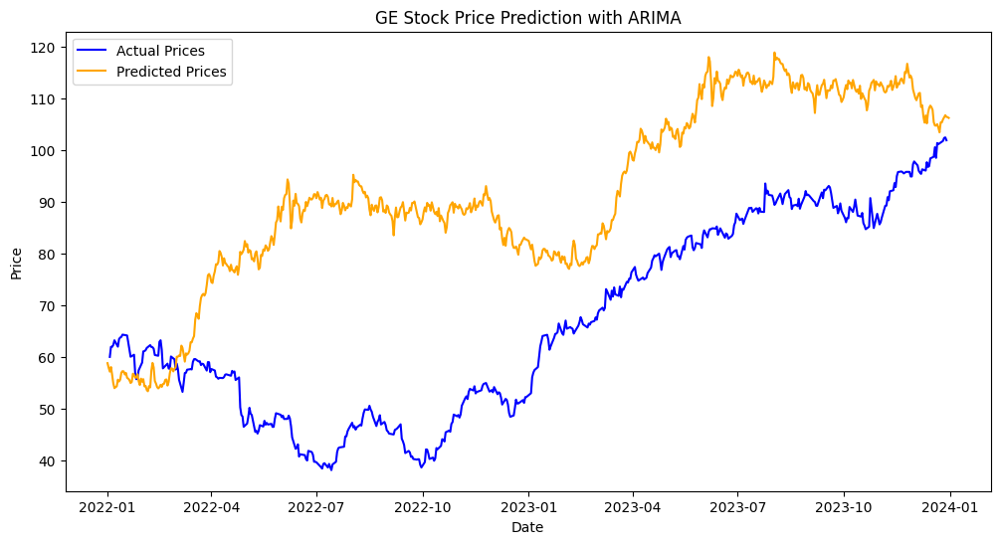

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


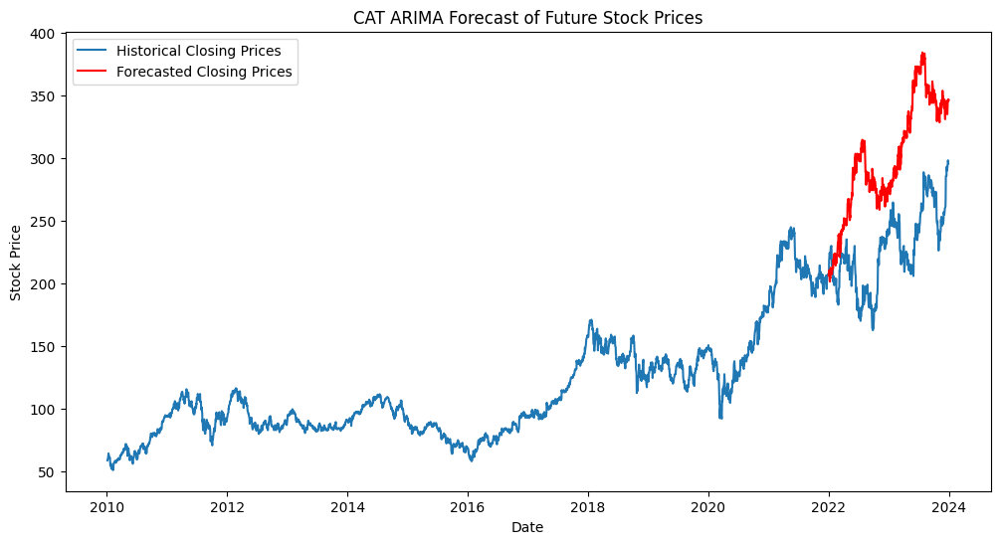

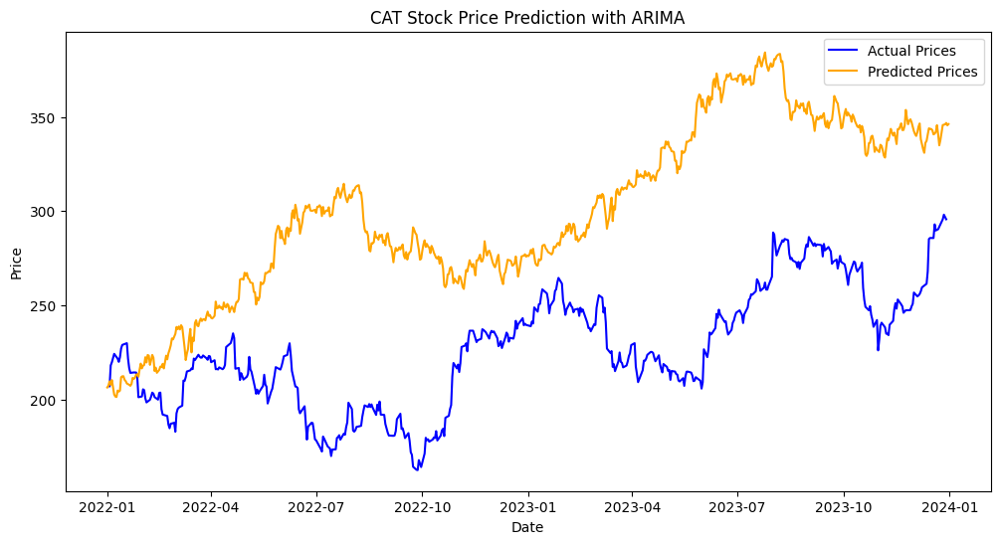

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


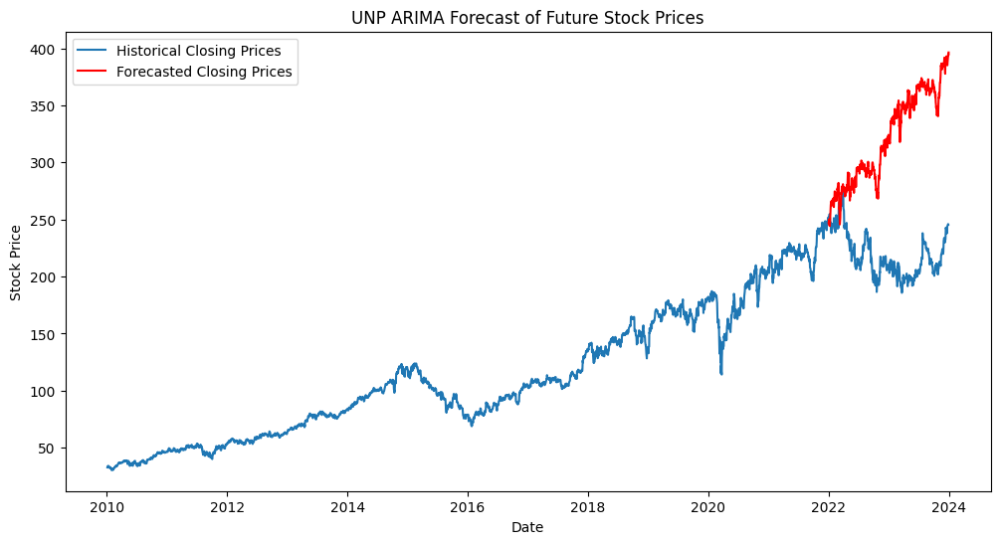

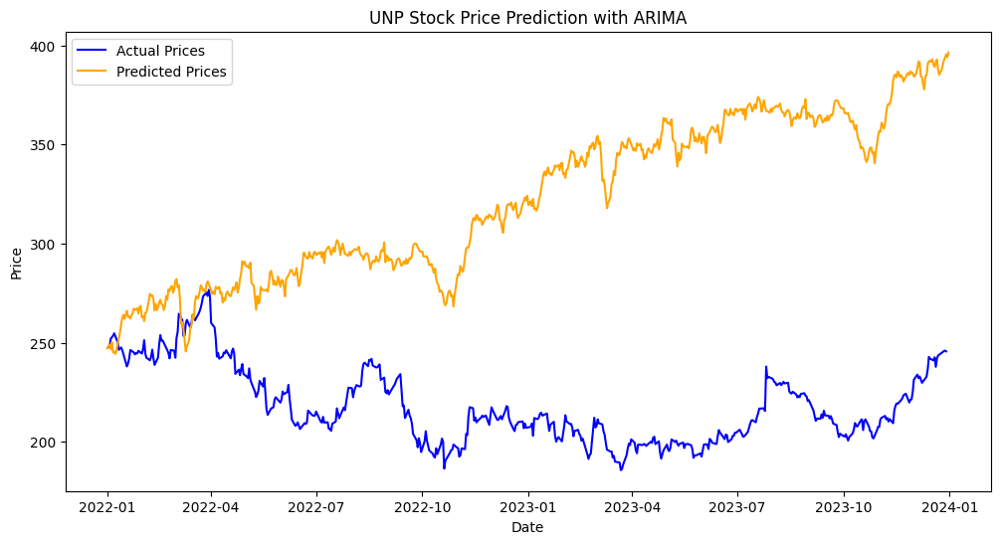

In [ ]:
import yfinance as yf
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import numpy as np

# Function to create a differenced series to make the data stationary
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return np.array(diff)

# Function to invert differenced value
def inverse_difference(history, yhat, interval=1):
    return yhat + history[-interval]

# List of tickers
tickers = ["GE", "CAT", "UNP"]

# Loop through each ticker
for ticker in tickers:
    # Download historical data for each ticker
    historical_data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(ticker, start="2010-01-01", end="2022-01-01")
    close_prices = data['Close'].values

    # Assuming yearly differencing might be needed
    days_in_year = 365
    differenced = difference(close_prices, days_in_year)

    # Fit ARIMA model on the differenced data
    model = ARIMA(differenced, order=(1,1,1))
    model_fit = model.fit()

    # Forecast for the next two years (2022 to 2024)
    forecast = model_fit.forecast(steps=2*365)  # daily data

    # Invert the differenced forecast to something usable
    history = list(close_prices)
    predictions = []
    day = 1
    for yhat in forecast:
        inverted = inverse_difference(history, yhat, days_in_year)
        predictions.append(inverted)
        # print(f'Day {day}: {inverted:.2f}')
        history.append(inverted)
        day += 1

    # Plotting the results for historical closing prices and forecasts
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.index, historical_data['Close'], label='Historical Closing Prices')
    forecast_index = pd.date_range(start='2022-01-01', periods=730, freq='D')
    plt.plot(forecast_index, predictions, color='red', label='Forecasted Closing Prices')
    plt.title(f'{ticker} ARIMA Forecast of Future Stock Prices')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

    # Plotting actual prices and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.loc['2022-01-01':].index, historical_data.loc['2022-01-01':]['Close'], label='Actual Prices', color='blue')
    plt.plot(forecast_index, predictions, label='Predicted Prices', color='orange')
    plt.legend()
    plt.title(f"{ticker} Stock Price Prediction with ARIMA")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


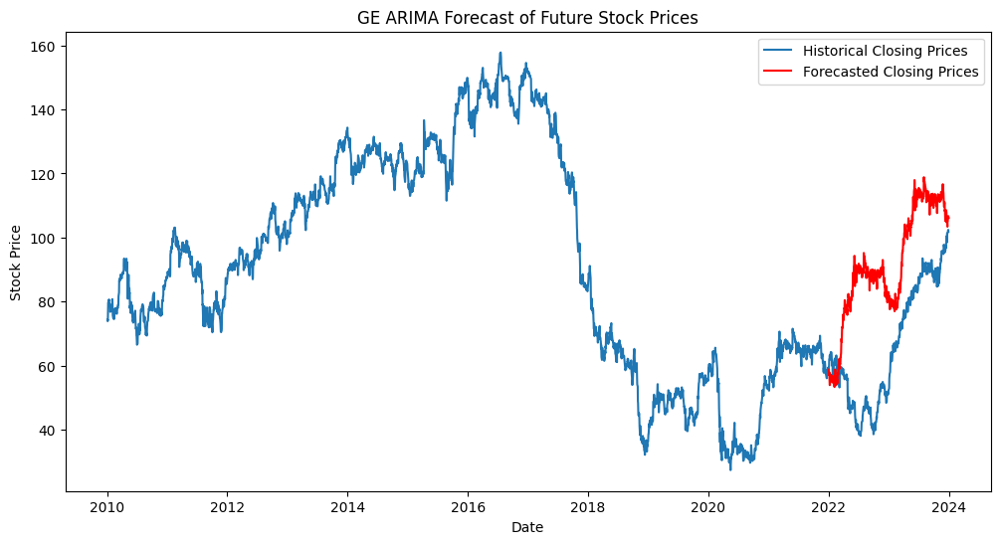

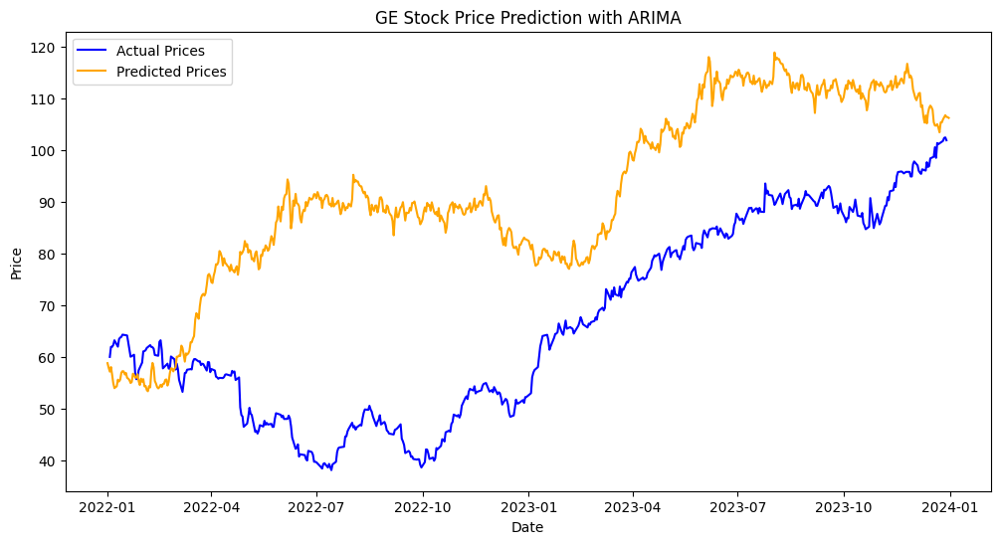

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Average margin of difference for GE: 19.58
Average margin of difference for GE (percentage): 37.88%
Directional accuracy for GE: 49.50%


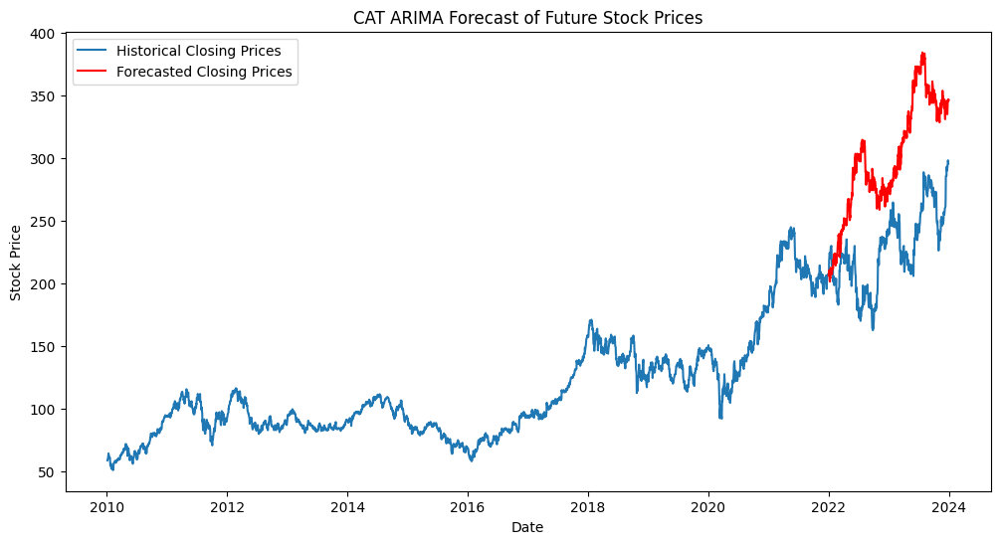

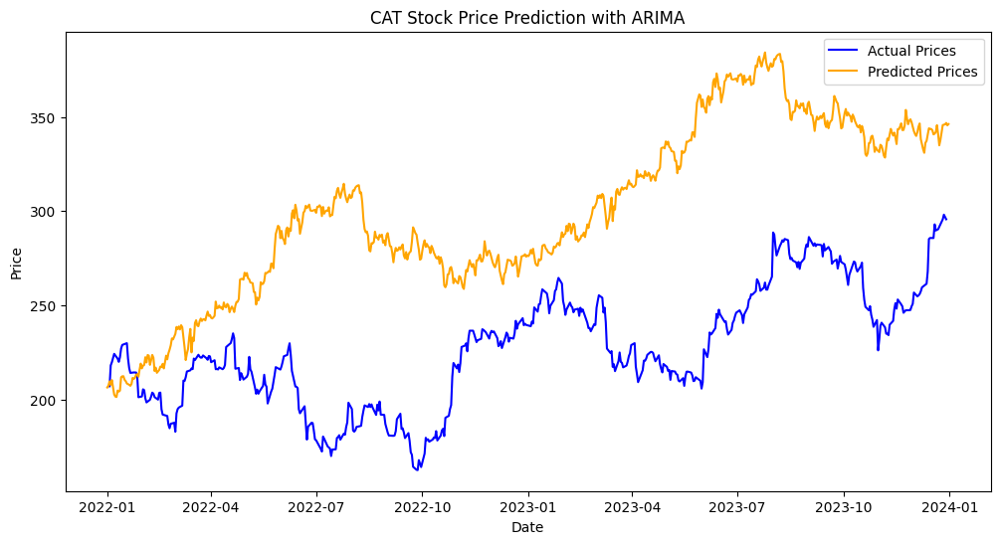

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Average margin of difference for CAT: 49.24
Average margin of difference for CAT (percentage): 23.39%
Directional accuracy for CAT: 50.90%


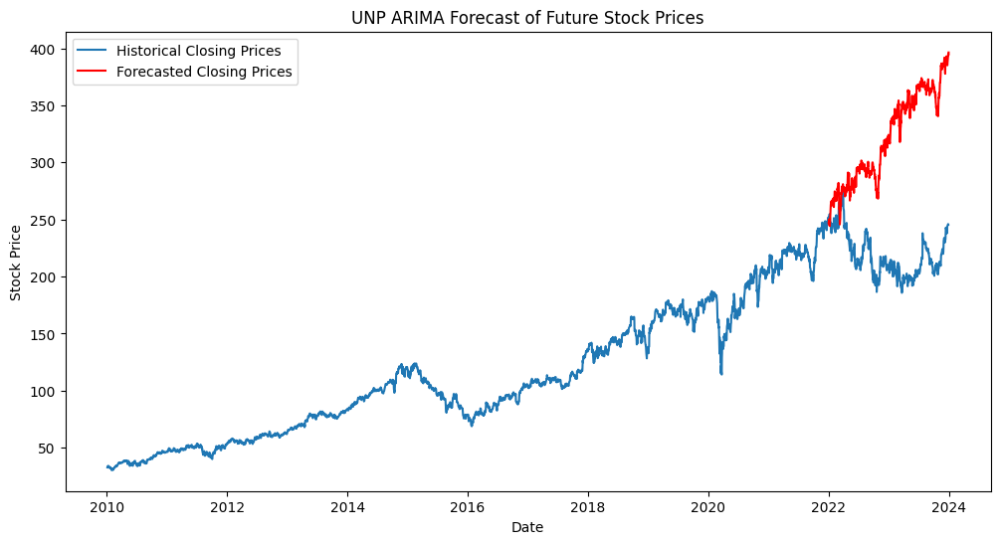

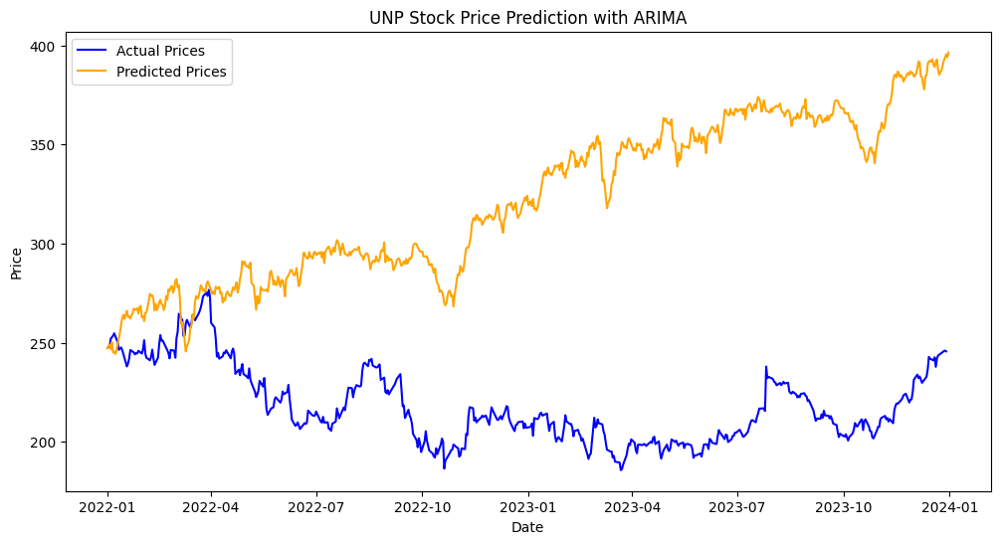


Average margin of difference for UNP: 82.99
Average margin of difference for UNP (percentage): 39.37%
Directional accuracy for UNP: 50.10%


In [ ]:
import yfinance as yf
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import numpy as np

# Function to create a differenced series to make the data stationary
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return np.array(diff)

# Function to invert differenced value
def inverse_difference(history, yhat, interval=1):
    return yhat + history[-interval]

# Function to calculate the average margin of difference between actual and predicted prices
def average_margin_of_difference(actual, predicted):
    margins = actual.values - predicted
    avg_margin = np.mean(np.abs(margins))
    return avg_margin

# Function to calculate the average margin of difference as a percentage
def average_margin_of_difference_percentage(actual, predicted):
    margins = actual.values - predicted
    avg_margin_percentage = np.mean(np.abs(margins) / actual.values) * 100
    return avg_margin_percentage

# Function to calculate directional accuracy
def directional_accuracy(actual, predicted):
    actual_diff = np.sign(np.diff(actual.values, prepend=actual.values[0]))
    predicted_diff = np.sign(np.diff(predicted, prepend=predicted[0]))
    accuracy = np.mean(actual_diff == predicted_diff) * 100
    return accuracy

# List of tickers
tickers = ["GE", "CAT", "UNP"]

# Loop through each ticker
for ticker in tickers:
    # Download historical data for each ticker
    historical_data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(ticker, start="2010-01-01", end="2022-01-01")
    close_prices = data['Close'].values

    # Assuming yearly differencing might be needed
    days_in_year = 365
    differenced = difference(close_prices, days_in_year)

    # Fit ARIMA model on the differenced data
    model = ARIMA(differenced, order=(1,1,1))
    model_fit = model.fit()

    # Forecast for the next two years (2022 to 2024)
    forecast = model_fit.forecast(steps=2*365)  # daily data

    # Invert the differenced forecast to something usable
    history = list(close_prices)
    predictions = []
    day = 1
    for yhat in forecast:
        inverted = inverse_difference(history, yhat, days_in_year)
        predictions.append(inverted)
        history.append(inverted)
        day += 1

    # Plotting the results for historical closing prices and forecasts
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.index, historical_data['Close'], label='Historical Closing Prices')
    forecast_index = pd.date_range(start='2022-01-01', periods=730, freq='D')
    plt.plot(forecast_index, predictions, color='red', label='Forecasted Closing Prices')
    plt.title(f'{ticker} ARIMA Forecast of Future Stock Prices')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

    # Plotting actual prices and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.loc['2022-01-01':].index, historical_data.loc['2022-01-01':]['Close'], label='Actual Prices', color='blue')
    plt.plot(forecast_index, predictions, label='Predicted Prices', color='orange')
    plt.legend()
    plt.title(f"{ticker} Stock Price Prediction with ARIMA")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Calculate and print the average margin of difference
    actual_prices = historical_data.loc['2022-01-01':]['Close']
    predicted_prices = pd.Series(predictions, index=forecast_index)
    avg_margin = average_margin_of_difference(actual_prices, predicted_prices[:len(actual_prices)])
    avg_margin_percentage = average_margin_of_difference_percentage(actual_prices, predicted_prices[:len(actual_prices)])
    direction_accuracy = directional_accuracy(actual_prices, predicted_prices[:len(actual_prices)])

    print(f"\nAverage margin of difference for {ticker}: {avg_margin:.2f}")
    print(f"Average margin of difference for {ticker} (percentage): {avg_margin_percentage:.2f}%")
    print(f"Directional accuracy for {ticker}: {direction_accuracy:.2f}%")


#### LSTM

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating GE


Epoch 1/50
74/74 [==============================] - 10s 72ms/step - loss: 0.0221 - val_loss: 7.8837e-04
Epoch 2/50
74/74 [==============================] - 3s 46ms/step - loss: 0.0013 - val_loss: 7.5728e-04
Epoch 3/50
74/74 [==============================] - 4s 53ms/step - loss: 0.0011 - val_loss: 7.9263e-04
Epoch 4/50
74/74 [==============================] - 5s 64ms/step - loss: 0.0011 - val_loss: 8.1596e-04
Epoch 5/50
74/74 [==============================] - 3s 45ms/step - loss: 0.0011 - val_loss: 6.9981e-04
Epoch 6/50
74/74 [==============================] - 3s 45ms/step - loss: 0.0011 - val_loss: 6.8843e-04
Epoch 7/50
74/74 [==============================] - 5s 71ms/step - loss: 0.0010 - val_loss: 7.7976e-04
Epoch 8/50
74/74 [==============================] - 4s 48ms/step - loss: 0.0011 - val_loss: 6.3001e-04
Epoch 9/50
74/74 [==============================] - 4s 51ms/step - loss: 9.2829e-04 - val_loss: 6.1879e-04
Epoch 10/50
74/74 [==============================] - 3s 44ms/step - 

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 18ms/step
GE - Mean Absolute Error (MAE): 65.81169760524561
GE - Mean Squared Error (MSE): 4711.556597947673
GE - Root Mean Squared Error (RMSE): 68.64077940952939


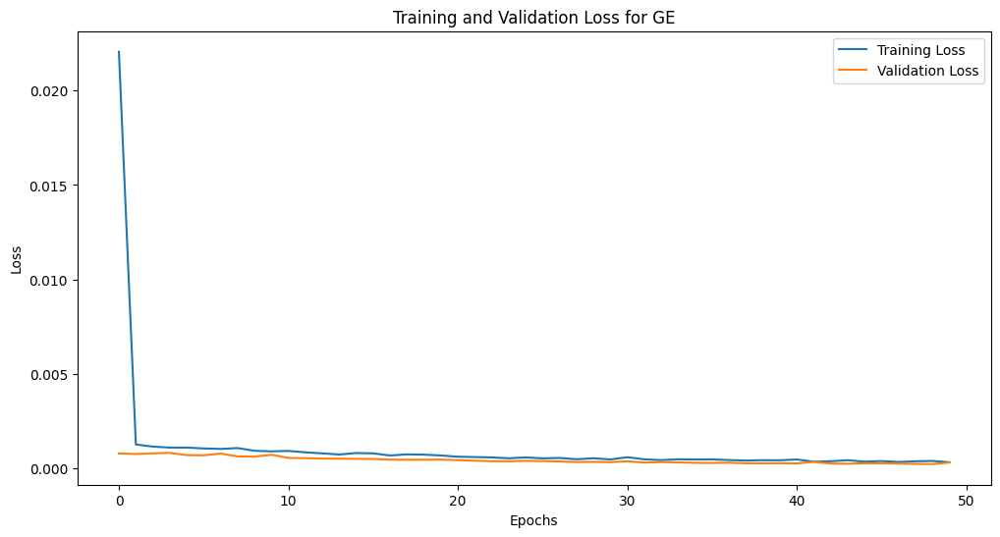

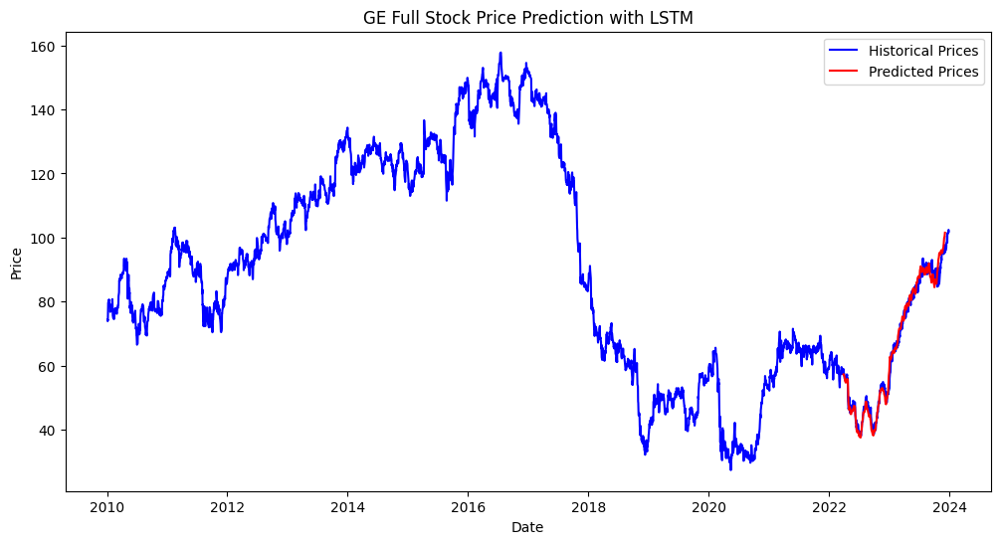

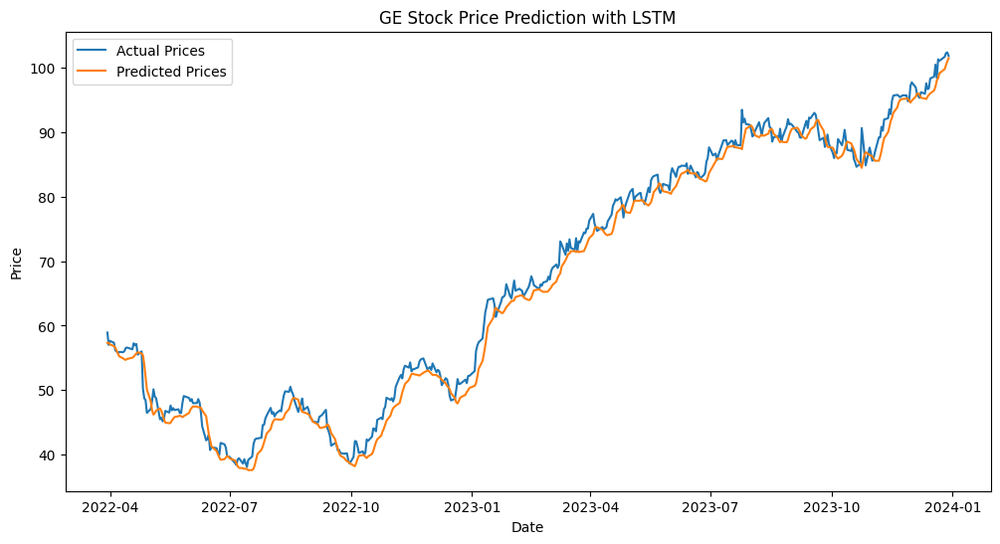

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating CAT


Epoch 1/50
74/74 [==============================] - 9s 60ms/step - loss: 0.0050 - val_loss: 0.0015
Epoch 2/50
74/74 [==============================] - 4s 50ms/step - loss: 5.4114e-04 - val_loss: 0.0014
Epoch 3/50
74/74 [==============================] - 5s 65ms/step - loss: 5.0926e-04 - val_loss: 0.0020
Epoch 4/50
74/74 [==============================] - 3s 45ms/step - loss: 4.5485e-04 - val_loss: 0.0019
Epoch 5/50
74/74 [==============================] - 3s 45ms/step - loss: 4.4182e-04 - val_loss: 0.0013
Epoch 6/50
74/74 [==============================] - 5s 66ms/step - loss: 3.7591e-04 - val_loss: 0.0023
Epoch 7/50
74/74 [==============================] - 3s 46ms/step - loss: 3.7244e-04 - val_loss: 0.0023
Epoch 8/50
74/74 [==============================] - 3s 46ms/step - loss: 3.4976e-04 - val_loss: 8.5457e-04
Epoch 9/50
74/74 [==============================] - 3s 45ms/step - loss: 3.1553e-04 - val_loss: 9.8020e-04
Epoch 10/50
74/74 [==============================] - 5s 64ms/step - l

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 19ms/step
CAT - Mean Absolute Error (MAE): 225.3617773705527
CAT - Mean Squared Error (MSE): 51623.22071371667
CAT - Root Mean Squared Error (RMSE): 227.20743982914968


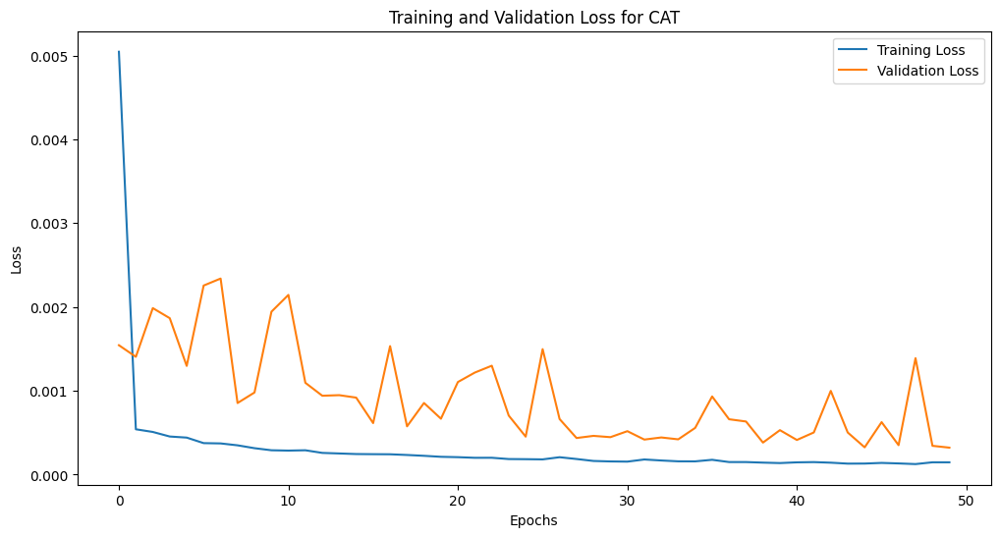

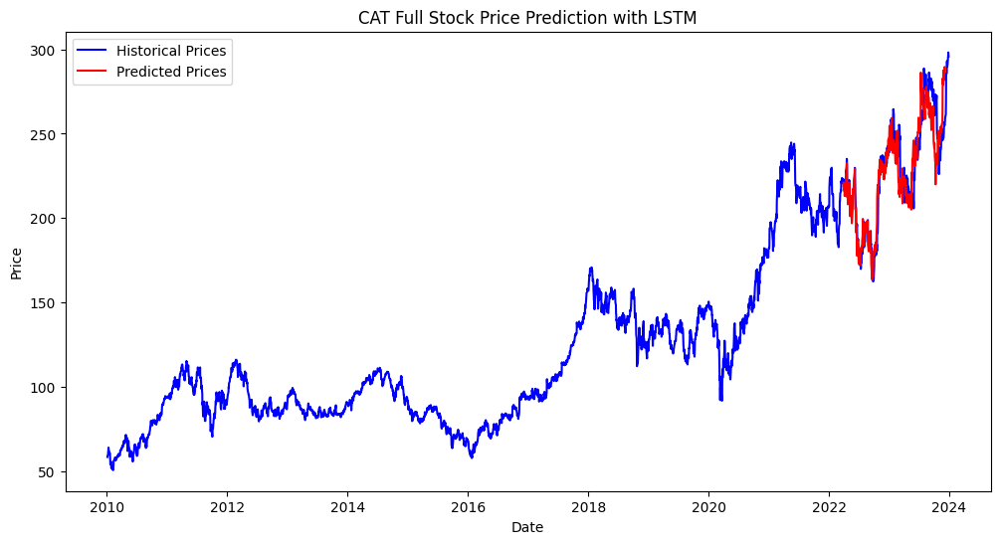

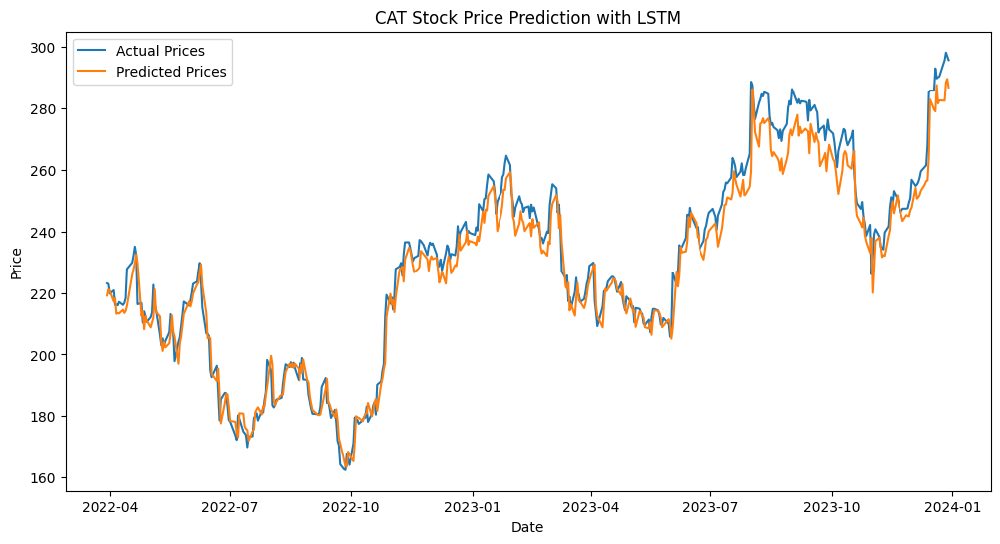

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating UNP


Epoch 1/50
74/74 [==============================] - 10s 79ms/step - loss: 0.0064 - val_loss: 0.0022
Epoch 2/50
74/74 [==============================] - 3s 46ms/step - loss: 3.3837e-04 - val_loss: 0.0018
Epoch 3/50
74/74 [==============================] - 4s 52ms/step - loss: 3.1061e-04 - val_loss: 0.0013
Epoch 4/50
74/74 [==============================] - 5s 62ms/step - loss: 3.0145e-04 - val_loss: 0.0018
Epoch 5/50
74/74 [==============================] - 4s 53ms/step - loss: 2.9625e-04 - val_loss: 0.0023
Epoch 6/50
74/74 [==============================] - 4s 49ms/step - loss: 2.6920e-04 - val_loss: 0.0013
Epoch 7/50
74/74 [==============================] - 4s 48ms/step - loss: 2.6730e-04 - val_loss: 0.0022
Epoch 8/50
74/74 [==============================] - 6s 78ms/step - loss: 2.7082e-04 - val_loss: 0.0013
Epoch 9/50
74/74 [==============================] - 4s 53ms/step - loss: 2.4339e-04 - val_loss: 0.0016
Epoch 10/50
74/74 [==============================] - 4s 50ms/step - loss: 2.

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 20ms/step
UNP - Mean Absolute Error (MAE): 210.26422376484132
UNP - Mean Squared Error (MSE): 44396.86705699639
UNP - Root Mean Squared Error (RMSE): 210.70564078115325


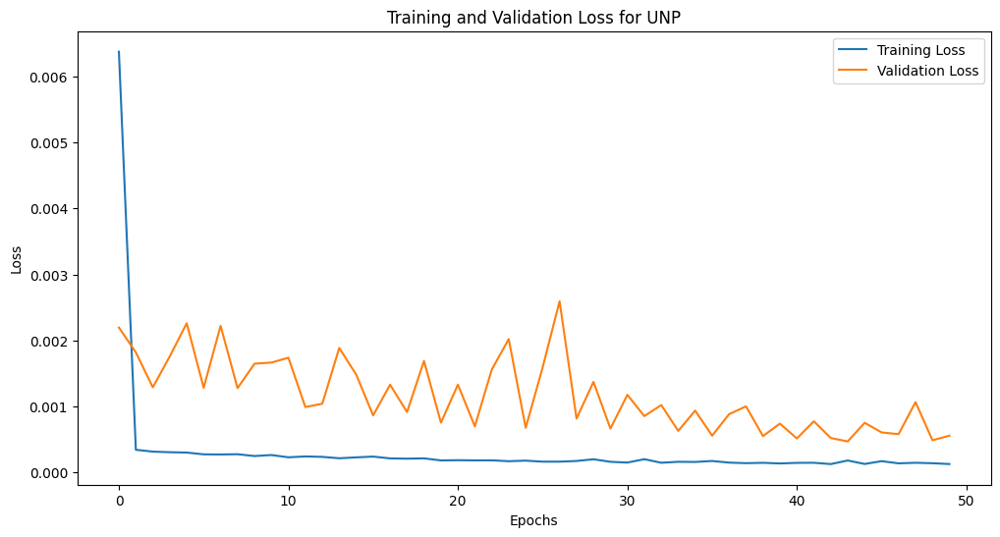

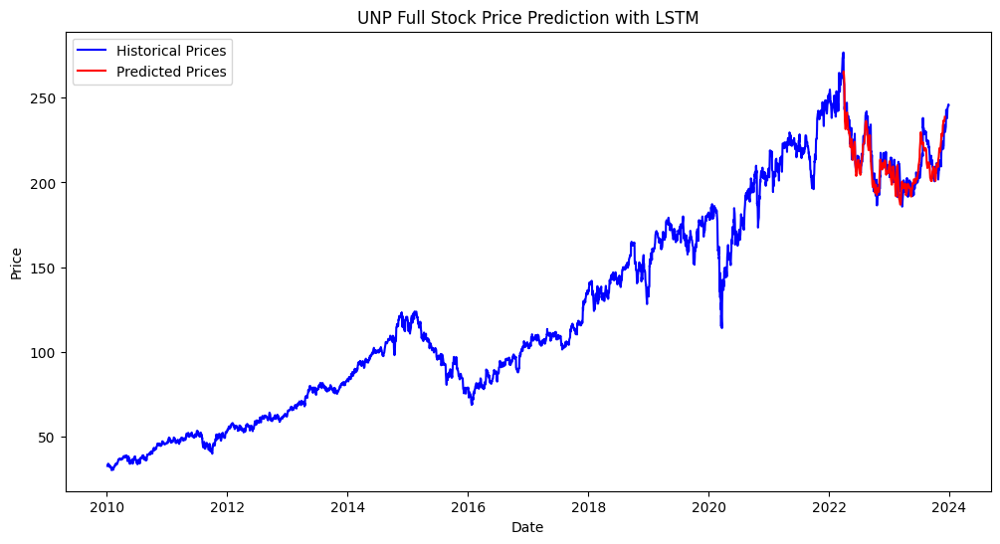

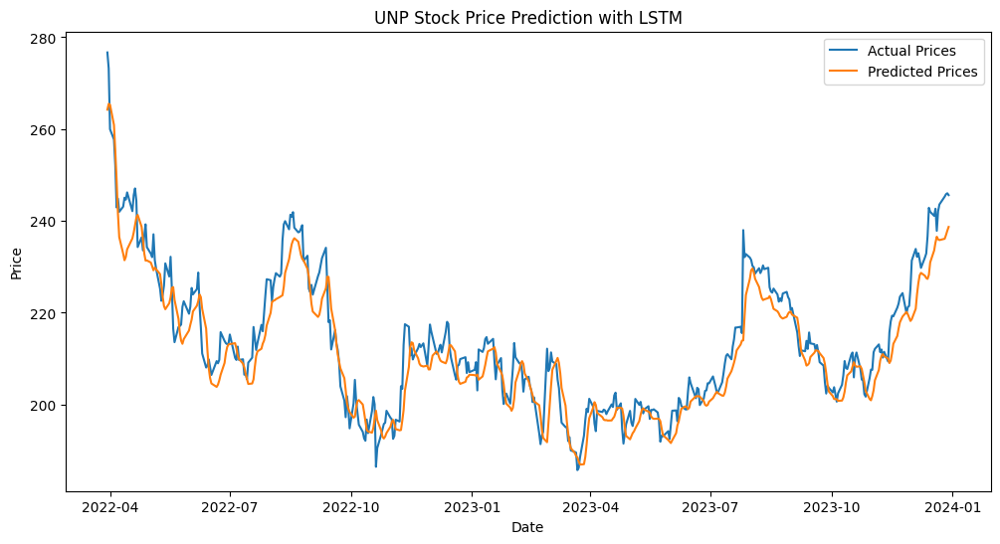

CPU times: user 14min 47s, sys: 17.6 s, total: 15min 4s
Wall time: 12min 34s


In [ ]:
%%time
def evaluate_lstm(stock_ticker):
    print(f"Evaluating {stock_ticker}")

    # Fetch Data
    historical_data = yf.download(stock_ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(stock_ticker, start="2010-01-01", end="2022-01-01")
    closing_prices = data['Close']
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(closing_prices.values.reshape(-1, 1))

    # Prepare Data
    SEQ_LENGTH = 60
    x, y = create_sequences(scaled_data, SEQ_LENGTH)
    split = int(0.8 * len(x))
    x_train, x_val = x[:split], x[split:]
    y_train, y_val = y[:split], y[split:]

    # Build Model
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(SEQ_LENGTH, 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train Model
    history = model.fit(x_train, y_train, validation_data=(x_val, y_val), batch_size=32, epochs=50)

    # Evaluate Model
    test_data = yf.download(stock_ticker, start="2022-01-01", end="2024-01-01")
    scaled_test_data = scaler.transform(test_data['Close'].values.reshape(-1, 1))
    x_test, y_test = create_sequences(scaled_test_data, SEQ_LENGTH)

    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Calculate error metrics
    mae = mean_absolute_error(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    rmse = math.sqrt(mse)

    print(f"{stock_ticker} - Mean Absolute Error (MAE): {mae}")
    print(f"{stock_ticker} - Mean Squared Error (MSE): {mse}")
    print(f"{stock_ticker} - Root Mean Squared Error (RMSE): {rmse}")

    # Plot training and validation loss
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title(f"Training and Validation Loss for {stock_ticker}")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(historical_data['Close'], label='Historical Prices', color='blue')
    forecast_dates = pd.date_range(start=test_data.index[SEQ_LENGTH], periods=len(predictions), freq='B')
    plt.plot(forecast_dates, predictions.flatten(), label='Predicted Prices', color='red')
    plt.legend()
    plt.title(f"{stock_ticker} Full Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Plot actual vs predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(test_data.index[SEQ_LENGTH:], test_data['Close'][SEQ_LENGTH:], label='Actual Prices')
    plt.plot(test_data.index[SEQ_LENGTH:], predictions, label='Predicted Prices')
    plt.legend()
    plt.title(f"{stock_ticker} Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

# Helper function to create sequences
def create_sequences(data, seq_length):
    x = []
    y = []
    for i in range(seq_length, len(data)):
        x.append(data[i - seq_length:i])
        y.append(data[i])
    return np.array(x), np.array(y)


# Evaluate for multiple stocks
for ticker in ["GE", "CAT", "UNP"]:
    evaluate_lstm(ticker)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating GE


Epoch 1/50
74/74 [==============================] - 8s 67ms/step - loss: 0.0264 - val_loss: 0.0018
Epoch 2/50
74/74 [==============================] - 4s 60ms/step - loss: 0.0013 - val_loss: 6.8912e-04
Epoch 3/50
74/74 [==============================] - 3s 47ms/step - loss: 0.0013 - val_loss: 6.7351e-04
Epoch 4/50
74/74 [==============================] - 4s 47ms/step - loss: 0.0012 - val_loss: 6.9053e-04
Epoch 5/50
74/74 [==============================] - 5s 68ms/step - loss: 0.0010 - val_loss: 6.4308e-04
Epoch 6/50
74/74 [==============================] - 4s 48ms/step - loss: 0.0010 - val_loss: 6.3289e-04
Epoch 7/50
74/74 [==============================] - 4s 48ms/step - loss: 9.4983e-04 - val_loss: 6.0961e-04
Epoch 8/50
74/74 [==============================] - 5s 65ms/step - loss: 0.0010 - val_loss: 6.4275e-04
Epoch 9/50
74/74 [==============================] - 4s 50ms/step - loss: 9.2206e-04 - val_loss: 5.7288e-04
Epoch 10/50
74/74 [==============================] - 4s 48ms/step - l

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 18ms/step
GE - Mean Absolute Error (MAE): 66.50441643980905
GE - Mean Squared Error (MSE): 4795.116542581959
GE - Root Mean Squared Error (RMSE): 69.24678001598312


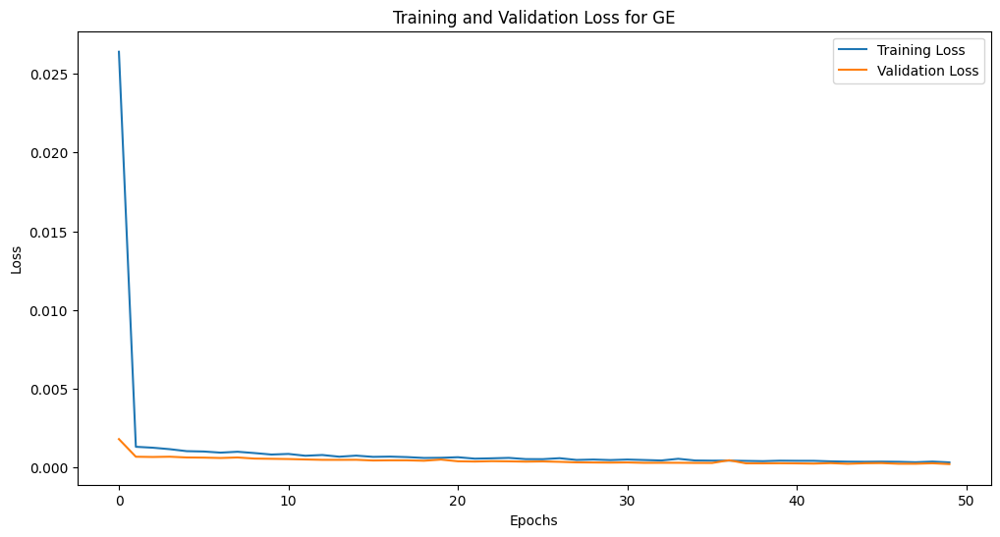

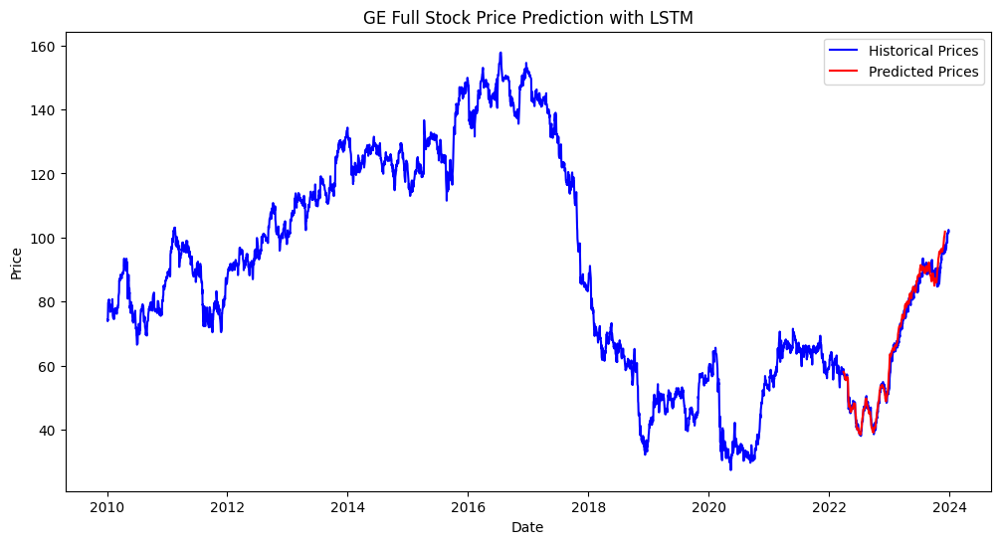

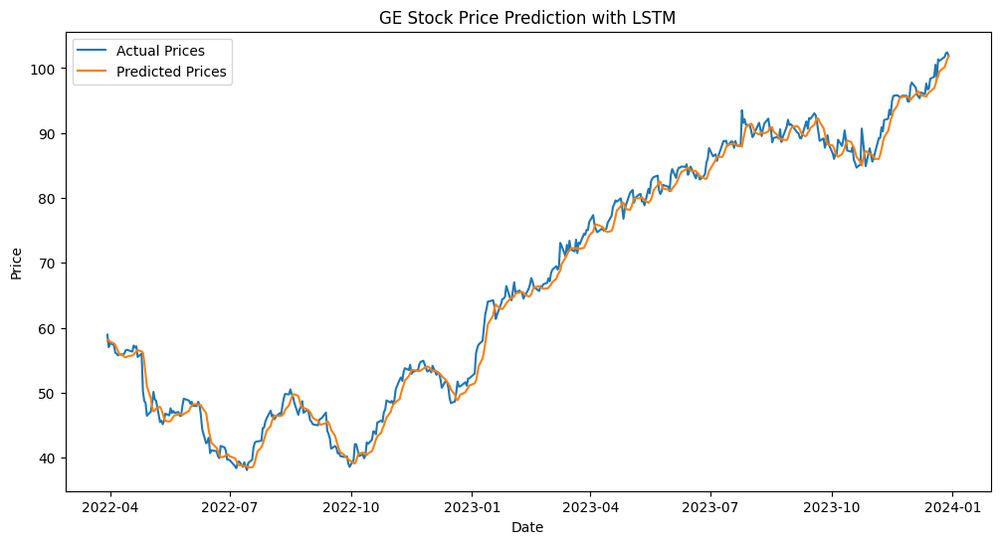

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Average margin of difference for GE: 1.30
Average margin of difference for GE (percentage): 2.11%
Directional accuracy for GE: 50.79%
Evaluating CAT


Epoch 1/50
74/74 [==============================] - 9s 60ms/step - loss: 0.0051 - val_loss: 0.0020
Epoch 2/50
74/74 [==============================] - 4s 48ms/step - loss: 5.7981e-04 - val_loss: 0.0014
Epoch 3/50
74/74 [==============================] - 5s 69ms/step - loss: 5.3419e-04 - val_loss: 0.0014
Epoch 4/50
74/74 [==============================] - 4s 49ms/step - loss: 4.9630e-04 - val_loss: 0.0019
Epoch 5/50
74/74 [==============================] - 4s 49ms/step - loss: 4.3386e-04 - val_loss: 0.0014
Epoch 6/50
74/74 [==============================] - 4s 58ms/step - loss: 3.9220e-04 - val_loss: 0.0016
Epoch 7/50
74/74 [==============================] - 5s 61ms/step - loss: 3.9458e-04 - val_loss: 0.0011
Epoch 8/50
74/74 [==============================] - 4s 49ms/step - loss: 3.6719e-04 - val_loss: 0.0015
Epoch 9/50
74/74 [==============================] - 4s 49ms/step - loss: 3.2033e-04 - val_loss: 0.0011
Epoch 10/50
74/74 [==============================] - 5s 70ms/step - loss: 3.6

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 17ms/step
CAT - Mean Absolute Error (MAE): 226.78985896085481
CAT - Mean Squared Error (MSE): 52323.339274937935
CAT - Root Mean Squared Error (RMSE): 228.74295459081998


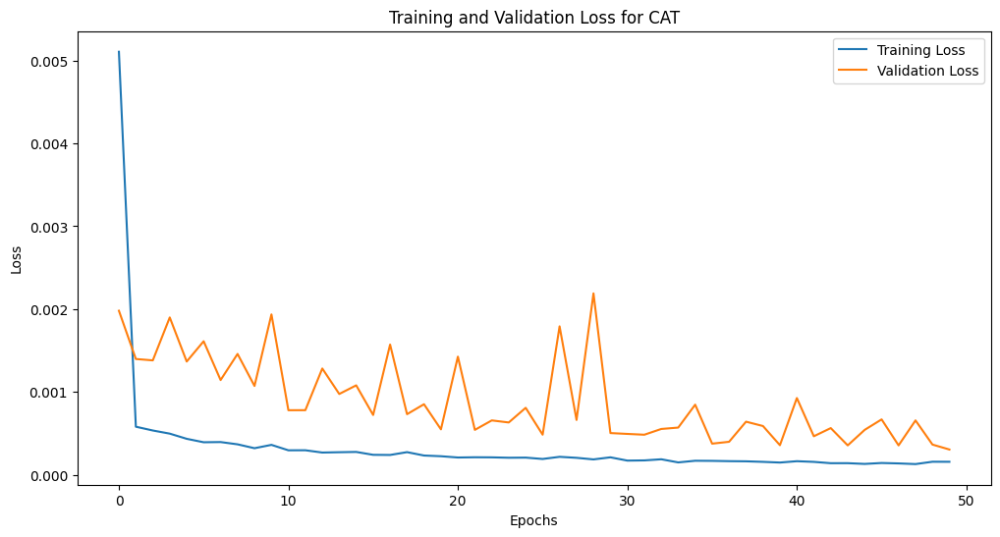

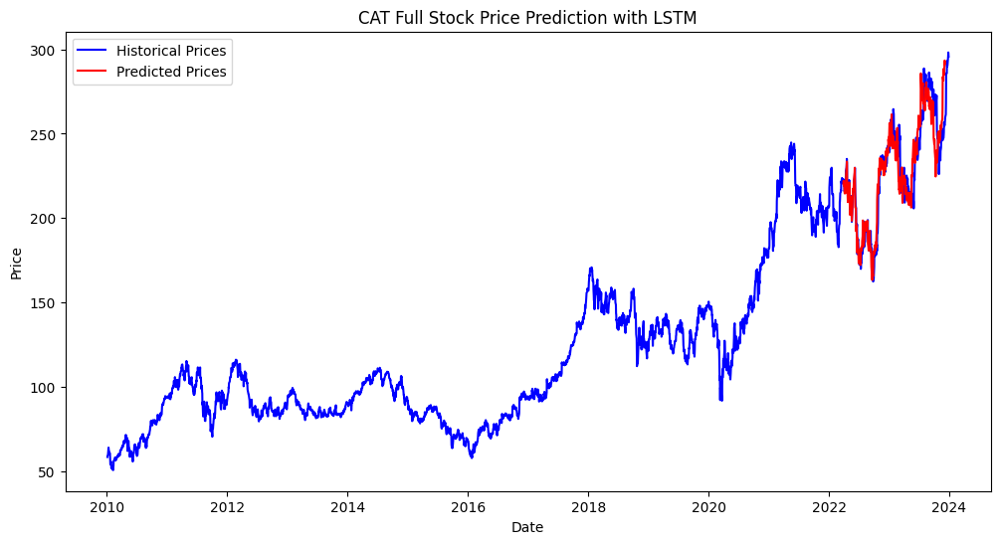

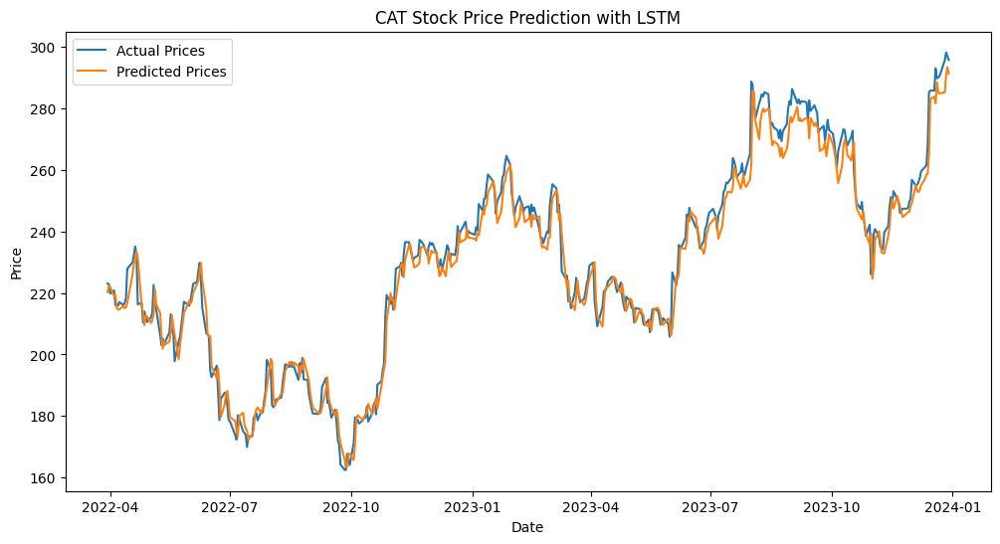

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Average margin of difference for CAT: 3.86
Average margin of difference for CAT (percentage): 1.68%
Directional accuracy for CAT: 54.20%
Evaluating UNP


Epoch 1/50
74/74 [==============================] - 11s 87ms/step - loss: 0.0056 - val_loss: 0.0012
Epoch 2/50
74/74 [==============================] - 5s 61ms/step - loss: 3.3165e-04 - val_loss: 0.0012
Epoch 3/50
74/74 [==============================] - 6s 79ms/step - loss: 3.0636e-04 - val_loss: 0.0012
Epoch 4/50
74/74 [==============================] - 4s 60ms/step - loss: 2.8096e-04 - val_loss: 0.0013
Epoch 5/50
74/74 [==============================] - 5s 61ms/step - loss: 2.7872e-04 - val_loss: 0.0018
Epoch 6/50
74/74 [==============================] - 6s 77ms/step - loss: 2.6878e-04 - val_loss: 0.0022
Epoch 7/50
74/74 [==============================] - 5s 61ms/step - loss: 2.6611e-04 - val_loss: 0.0011
Epoch 8/50
74/74 [==============================] - 5s 67ms/step - loss: 2.4780e-04 - val_loss: 0.0014
Epoch 9/50
74/74 [==============================] - 5s 74ms/step - loss: 2.4573e-04 - val_loss: 0.0010
Epoch 10/50
74/74 [==============================] - 4s 61ms/step - loss: 2.

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 21ms/step
UNP - Mean Absolute Error (MAE): 209.9608747824261
UNP - Mean Squared Error (MSE): 44288.20225461799
UNP - Root Mean Squared Error (RMSE): 210.44762354233887


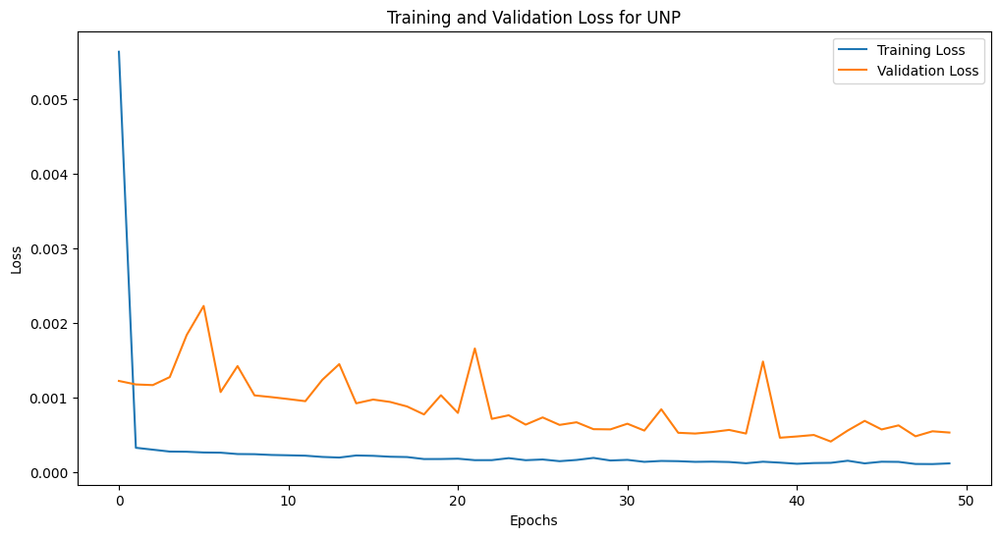

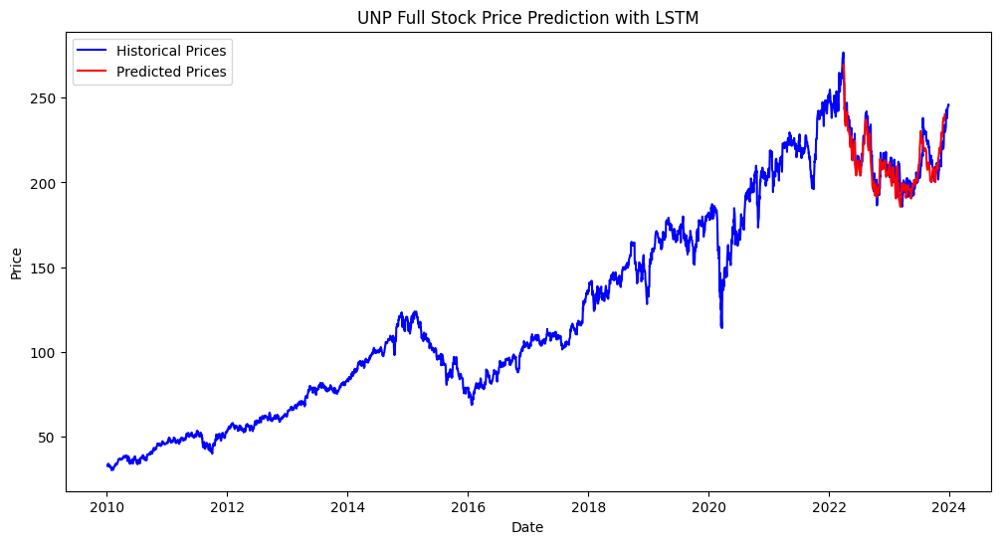

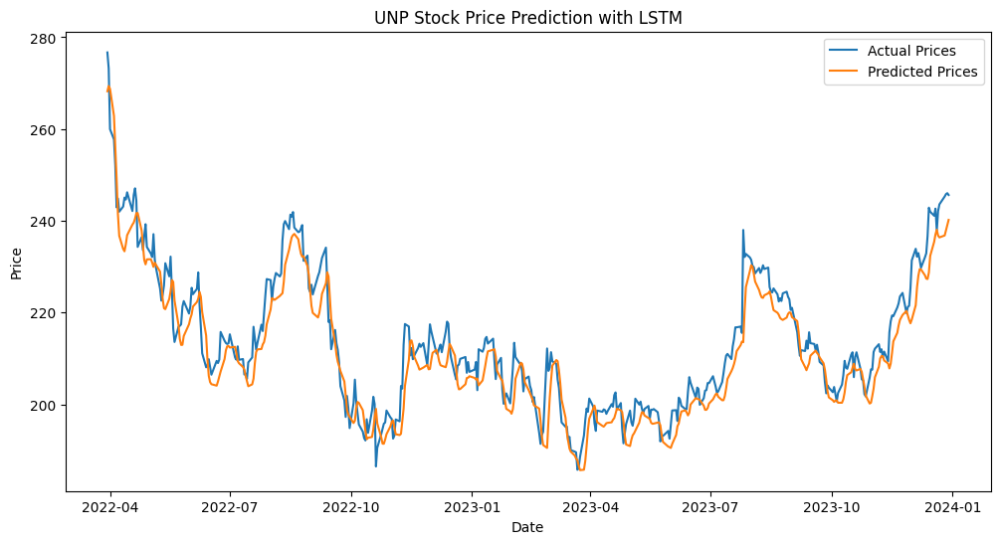

Average margin of difference for UNP: 4.18
Average margin of difference for UNP (percentage): 1.93%
Directional accuracy for UNP: 48.98%


In [ ]:
# Import Libraries
import yfinance as yf
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import math

# Function to create LSTM model and evaluate it
def evaluate_lstm(stock_ticker):
    print(f"Evaluating {stock_ticker}")

    # Fetch Data
    historical_data = yf.download(stock_ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(stock_ticker, start="2010-01-01", end="2022-01-01")
    closing_prices = data['Close']
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(closing_prices.values.reshape(-1, 1))

    # Prepare Data
    SEQ_LENGTH = 60
    x, y = create_sequences(scaled_data, SEQ_LENGTH)
    split = int(0.8 * len(x))
    x_train, x_val = x[:split], x[split:]
    y_train, y_val = y[:split], y[split:]

    # Build Model
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(SEQ_LENGTH, 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train Model
    history = model.fit(x_train, y_train, validation_data=(x_val, y_val), batch_size=32, epochs=50)

    # Evaluate Model
    test_data = yf.download(stock_ticker, start="2022-01-01", end="2024-01-01")
    scaled_test_data = scaler.transform(test_data['Close'].values.reshape(-1, 1))
    x_test, y_test = create_sequences(scaled_test_data, SEQ_LENGTH)

    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Calculate error metrics
    mae = mean_absolute_error(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    rmse = math.sqrt(mse)

    print(f"{stock_ticker} - Mean Absolute Error (MAE): {mae}")
    print(f"{stock_ticker} - Mean Squared Error (MSE): {mse}")
    print(f"{stock_ticker} - Root Mean Squared Error (RMSE): {rmse}")

    # Plot training and validation loss
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title(f"Training and Validation Loss for {stock_ticker}")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(historical_data['Close'], label='Historical Prices', color='blue')
    forecast_dates = pd.date_range(start=test_data.index[SEQ_LENGTH], periods=len(predictions), freq='B')
    plt.plot(forecast_dates, predictions.flatten(), label='Predicted Prices', color='red')
    plt.legend()
    plt.title(f"{stock_ticker} Full Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Plot actual vs predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(test_data.index[SEQ_LENGTH:], test_data['Close'][SEQ_LENGTH:], label='Actual Prices')
    plt.plot(test_data.index[SEQ_LENGTH:], predictions, label='Predicted Prices')
    plt.legend()
    plt.title(f"{stock_ticker} Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Calculate and print the average margin of difference
    avg_margin = average_margin_of_difference(test_data['Close'][SEQ_LENGTH:], predictions.flatten())
    avg_margin_percentage = average_margin_of_difference_percentage(test_data['Close'][SEQ_LENGTH:], predictions.flatten())
    direction_accuracy = directional_accuracy(test_data['Close'][SEQ_LENGTH:], predictions.flatten())

    print(f"Average margin of difference for {stock_ticker}: {avg_margin:.2f}")
    print(f"Average margin of difference for {stock_ticker} (percentage): {avg_margin_percentage:.2f}%")
    print(f"Directional accuracy for {stock_ticker}: {direction_accuracy:.2f}%")

# Helper function to create sequences
def create_sequences(data, seq_length):
    x = []
    y = []
    for i in range(seq_length, len(data)):
        x.append(data[i - seq_length:i])
        y.append(data[i])
    return np.array(x), np.array(y)

# Function to calculate the average margin of difference between actual and predicted prices
def average_margin_of_difference(actual, predicted):
    margins = actual.values - predicted
    avg_margin = np.mean(np.abs(margins))
    return avg_margin

# Function to calculate the average margin of difference as a percentage
def average_margin_of_difference_percentage(actual, predicted):
    margins = actual.values - predicted
    avg_margin_percentage = np.mean(np.abs(margins) / actual.values) * 100
    return avg_margin_percentage

# Function to calculate directional accuracy
def directional_accuracy(actual, predicted):
    actual_diff = np.sign(np.diff(actual.values, prepend=actual.values[0]))
    predicted_diff = np.sign(np.diff(predicted, prepend=predicted[0]))
    accuracy = np.mean(actual_diff == predicted_diff) * 100
    return accuracy

# Evaluate for multiple stocks
for ticker in ["GE", "CAT", "UNP"]:
    evaluate_lstm(ticker)


#### FB Prophet

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/rb3d9evx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/3drnibjt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81535', 'data', 'file=/tmp/tmp3z430iy9/rb3d9evx.json', 'init=/tmp/tmp3z430iy9/3drnibjt.json', 'output', 'file=/tmp/tmp3z430iy9/prophet_modeliaqbbo2a/prophet_model-20240513161922.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:19:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:19:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


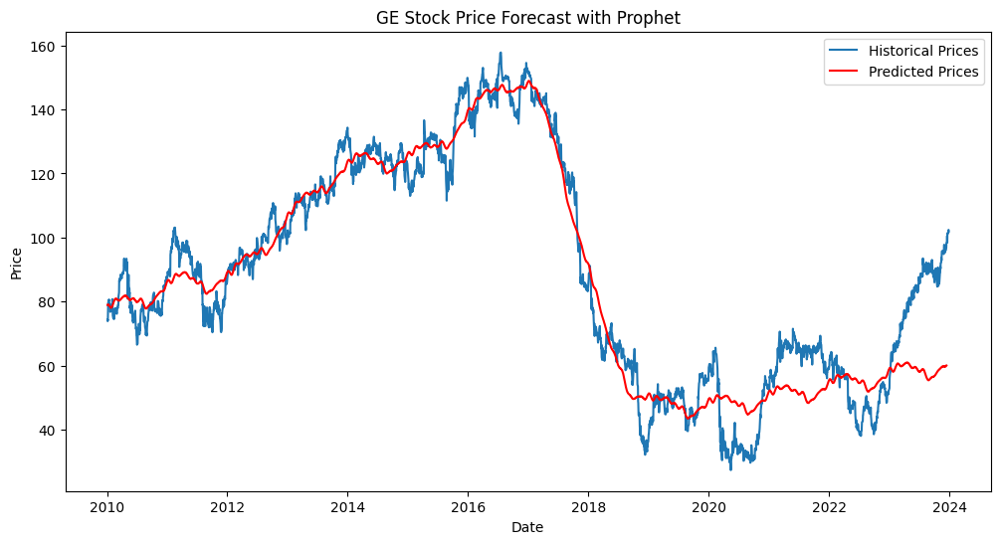

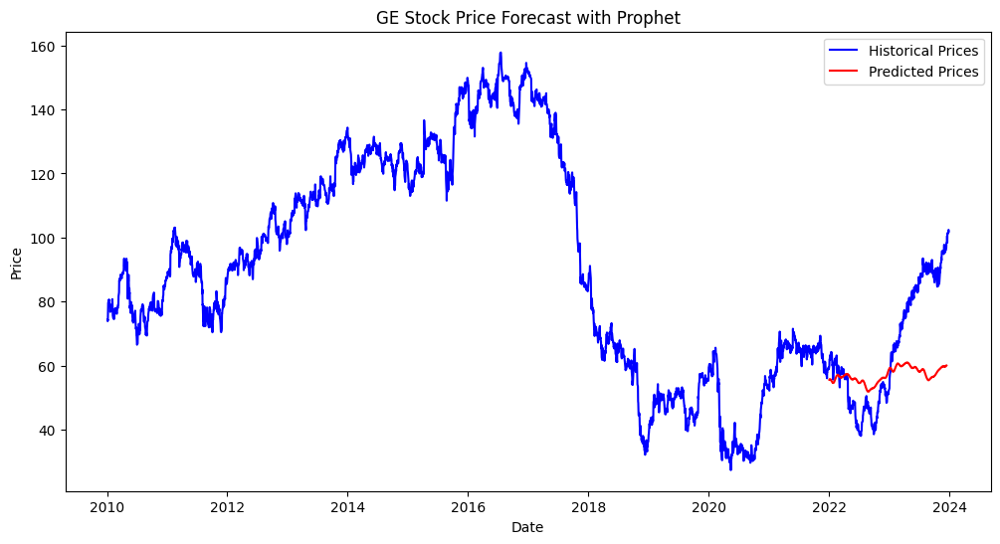

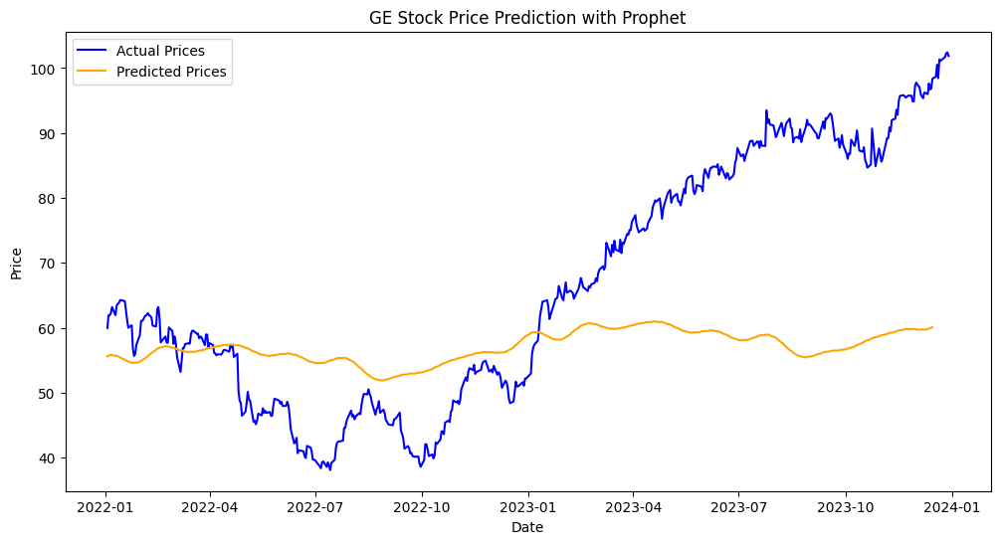

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/bzbvb6rm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/qu30lxyb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26055', 'data', 'file=/tmp/tmp3z430iy9/bzbvb6rm.json', 'init=/tmp/tmp3z430iy9/qu30lxyb.json', 'output', 'file=/tmp/tmp3z430iy9/prophet_model9wqyhcp5/prophet_model-20240513161926.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:19:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:19:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


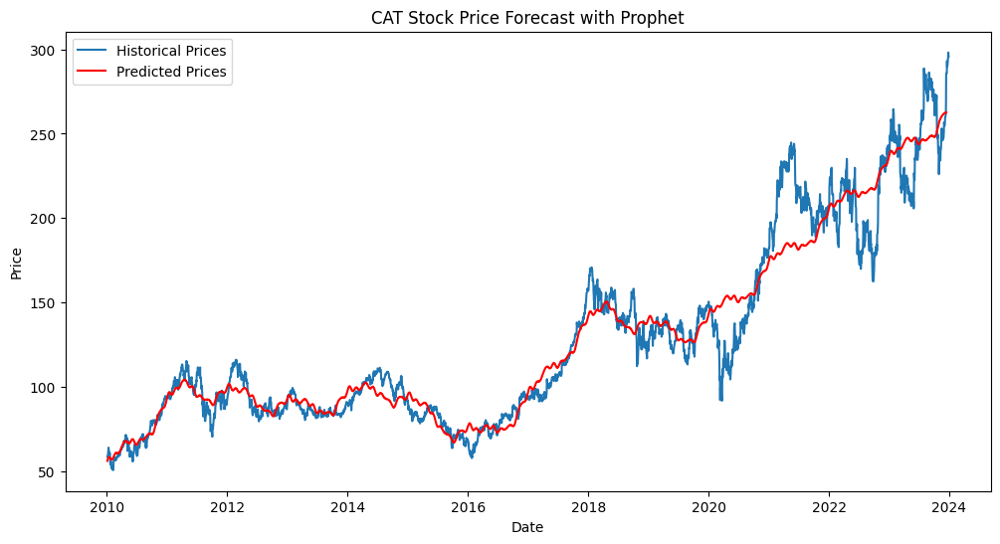

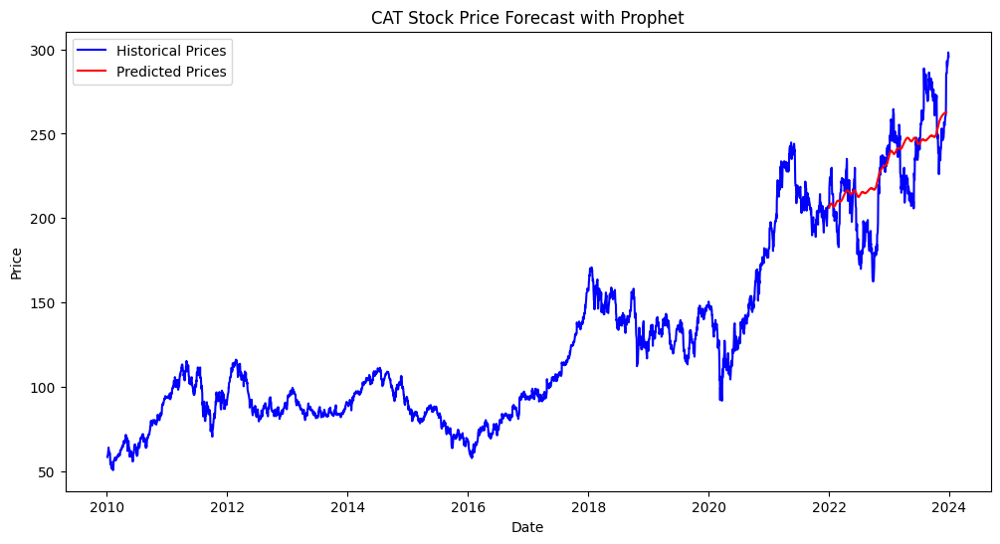

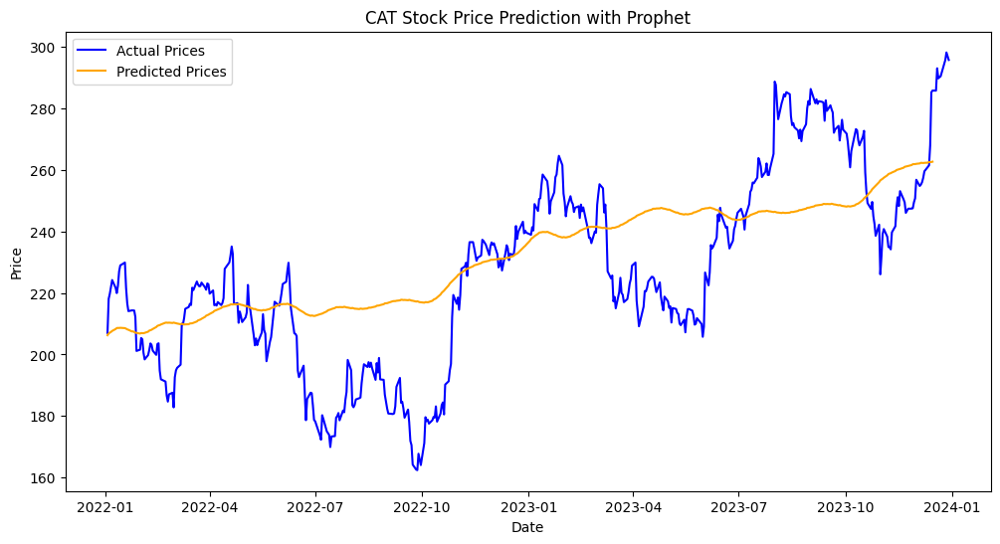

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/1b_n9prv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3z430iy9/vnly4_ni.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40481', 'data', 'file=/tmp/tmp3z430iy9/1b_n9prv.json', 'init=/tmp/tmp3z430iy9/vnly4_ni.json', 'output', 'file=/tmp/tmp3z430iy9/prophet_modelvuwxp0kk/prophet_model-20240513161930.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:19:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:19:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


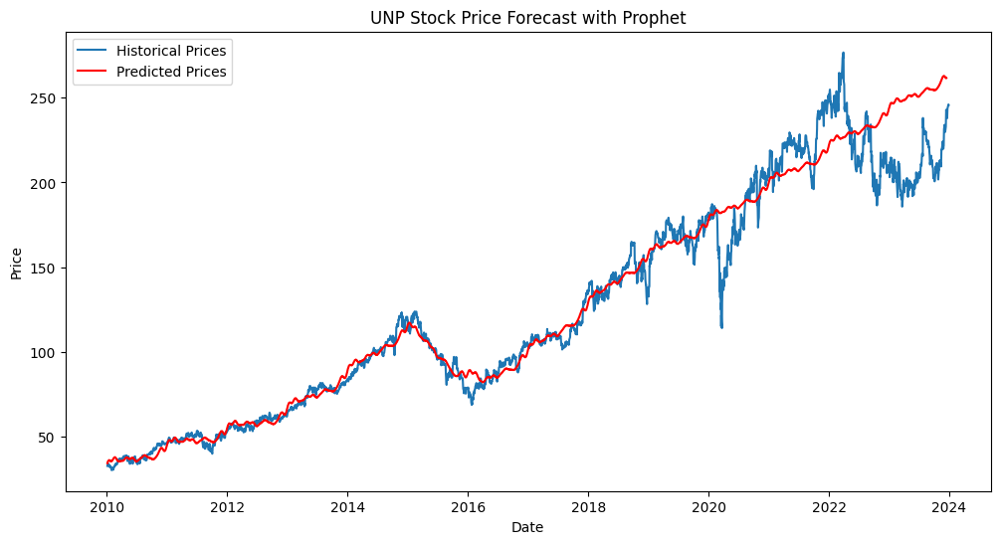

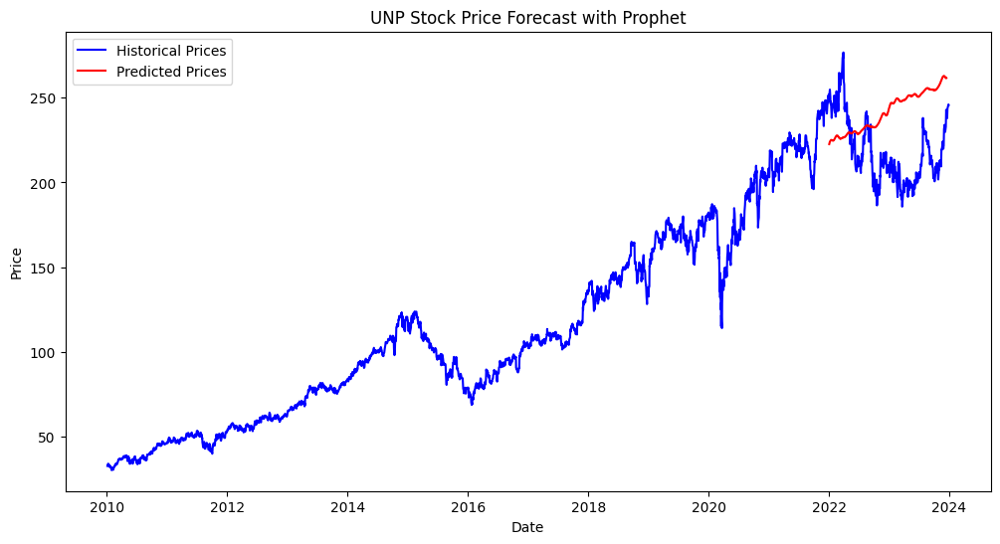

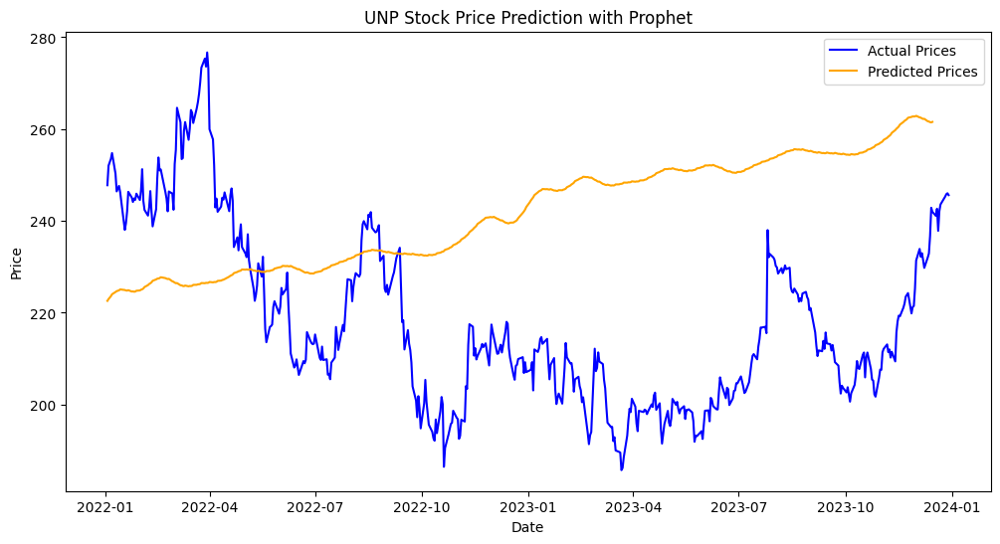

CPU times: user 7.71 s, sys: 1.29 s, total: 9.01 s
Wall time: 11.6 s


In [ ]:
%%time
from prophet import Prophet
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

def run_prophet(ticker):
    # Download data
    data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    df = pd.DataFrame(data['Close'])
    df.reset_index(inplace=True)
    df.rename(columns={'Date': 'ds', 'Close': 'y'}, inplace=True)

    # Fit the Prophet model on data up to the beginning of 2023
    m = Prophet(daily_seasonality=False)
    m.fit(df[df['ds'] < '2023-01-01'])  # Train only on data before 2023

    # Create future dataframe for forecasting
    future = m.make_future_dataframe(periods=len(data['2023-01-01':]), freq='B')
    forecast = m.predict(future)

    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices')
    plt.plot(forecast['ds'], forecast['yhat'], color='red', label='Predicted Prices')
    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()
    # Plot historical and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices', color='blue')  # Historical prices

    # Only plot predicted prices starting from 2023
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], color='red', label='Predicted Prices')  # Predicted prices

    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    # Filter actual data for plotting
    actual_data = df[df['ds'] >= '2022-01-01']
    plt.plot(actual_data['ds'], actual_data['y'], label='Actual Prices', color='blue')

    # Filter forecast data for plotting
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], label='Predicted Prices', color='orange')

    plt.title(f"{ticker} Stock Price Prediction with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

run_prophet("GE")
run_prophet("CAT")
run_prophet("UNP")

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpiyt82fn3/ebz9jowb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpiyt82fn3/w96kvy6e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76827', 'data', 'file=/tmp/tmpiyt82fn3/ebz9jowb.json', 'init=/tmp/tmpiyt82fn3/w96kvy6e.json', 'output', 'file=/tmp/tmpiyt82fn3/prophet_modelkg58y2lg/prophet_model-20240518235908.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
23:59:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
23:59:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


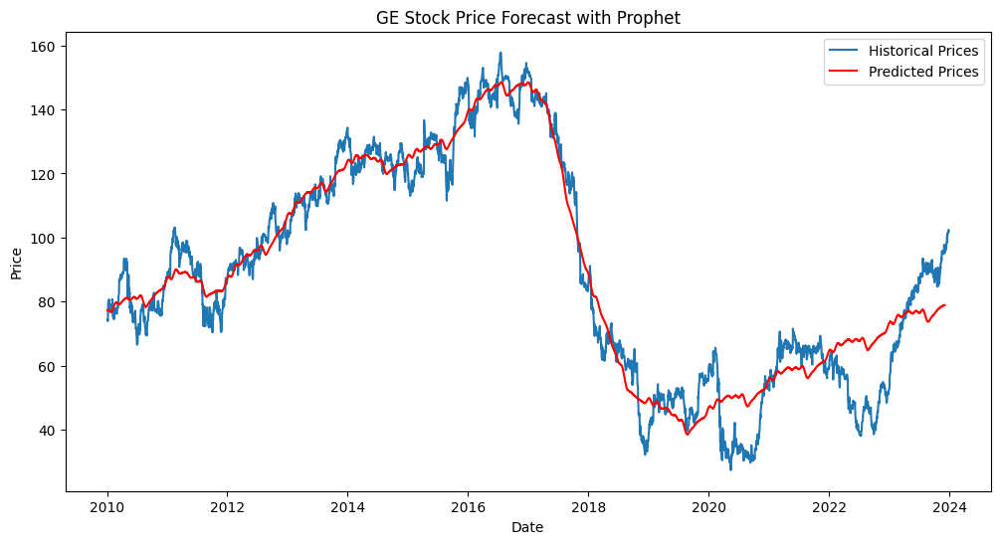

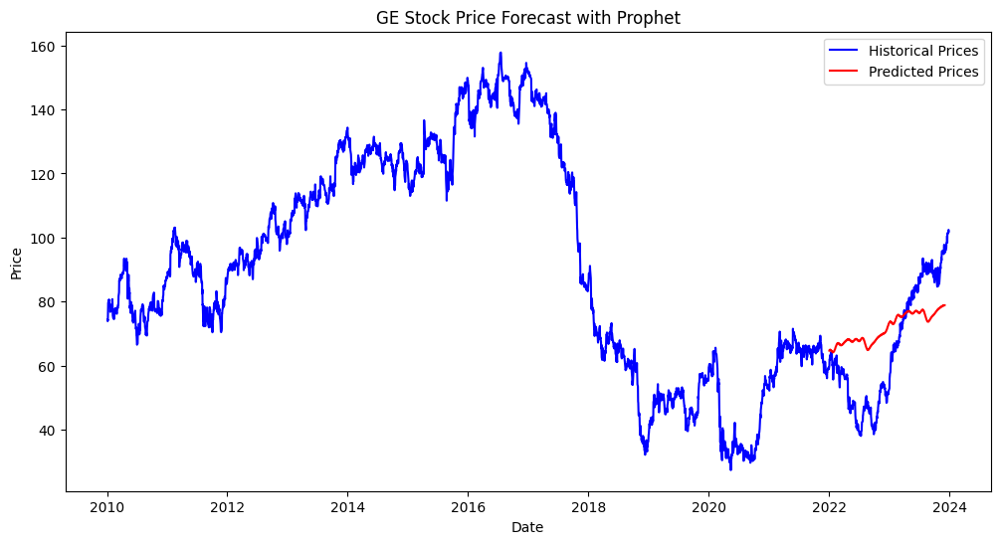

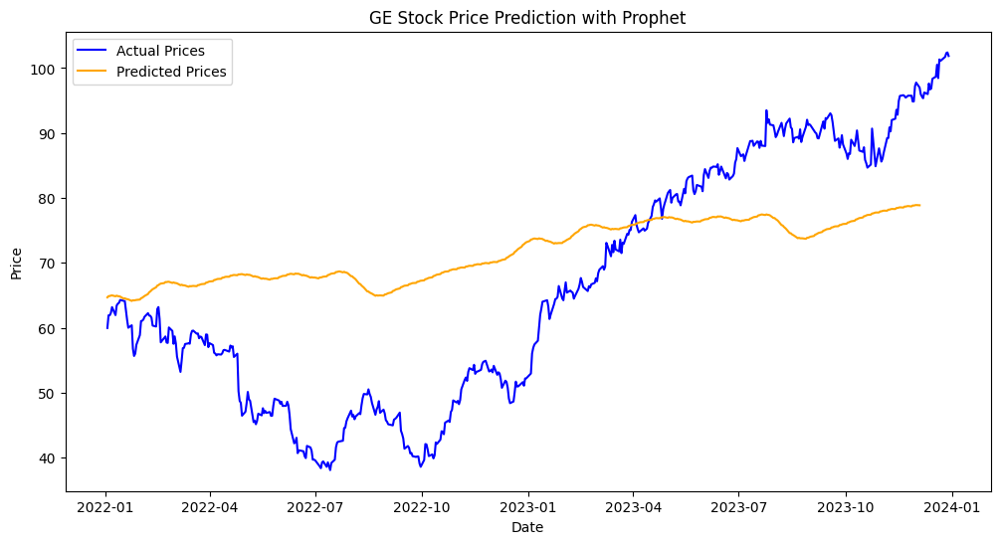

Average margin of difference for GE: 13.75
Average margin of difference for GE (percentage): 24.62%
Directional accuracy for GE: 54.29%


[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpiyt82fn3/a8jcy6ac.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpiyt82fn3/z00z7tag.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62174', 'data', 'file=/tmp/tmpiyt82fn3/a8jcy6ac.json', 'init=/tmp/tmpiyt82fn3/z00z7tag.json', 'output', 'file=/tmp/tmpiyt82fn3/prophet_modelwmorp_tm/prophet_model-20240518235918.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
23:59:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
23:59:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


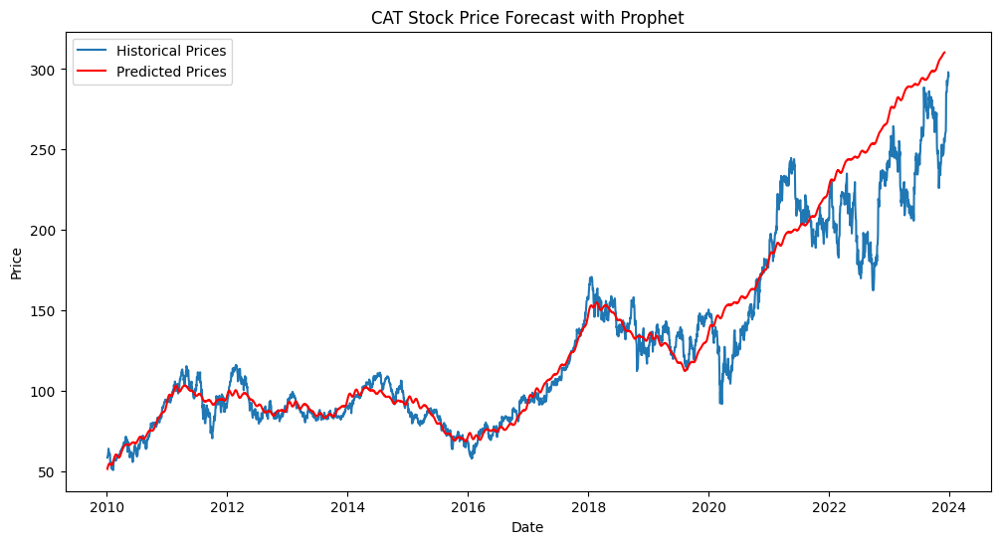

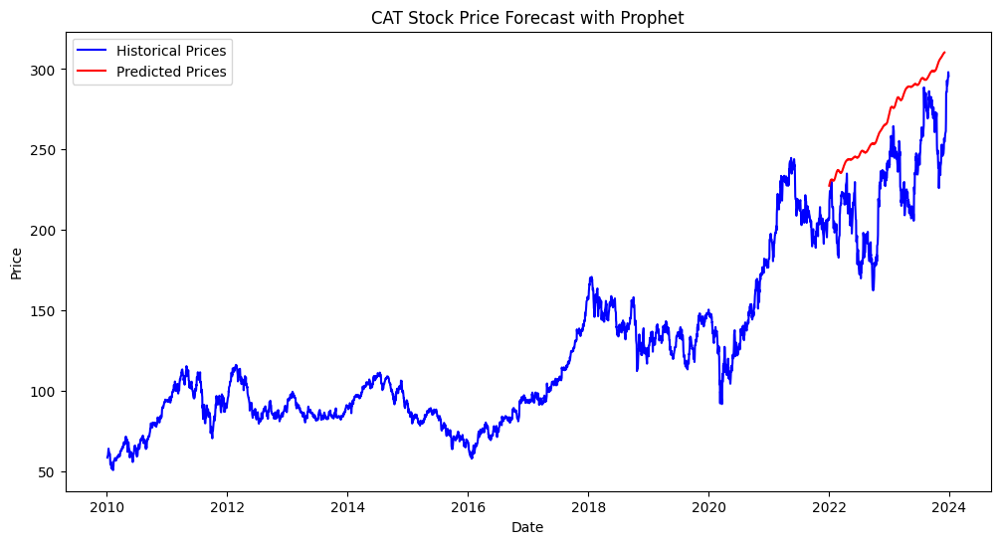

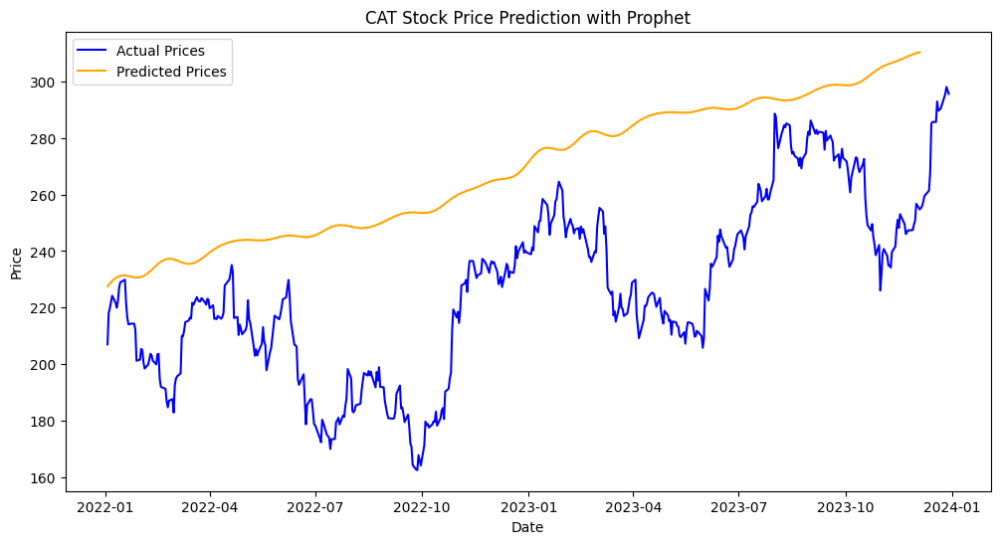

Average margin of difference for CAT: 41.42
Average margin of difference for CAT (percentage): 19.47%
Directional accuracy for CAT: 52.10%


[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpiyt82fn3/q4xt4h1_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpiyt82fn3/ado5nxwx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73149', 'data', 'file=/tmp/tmpiyt82fn3/q4xt4h1_.json', 'init=/tmp/tmpiyt82fn3/ado5nxwx.json', 'output', 'file=/tmp/tmpiyt82fn3/prophet_modeldyk_7dve/prophet_model-20240518235930.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
23:59:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
23:59:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


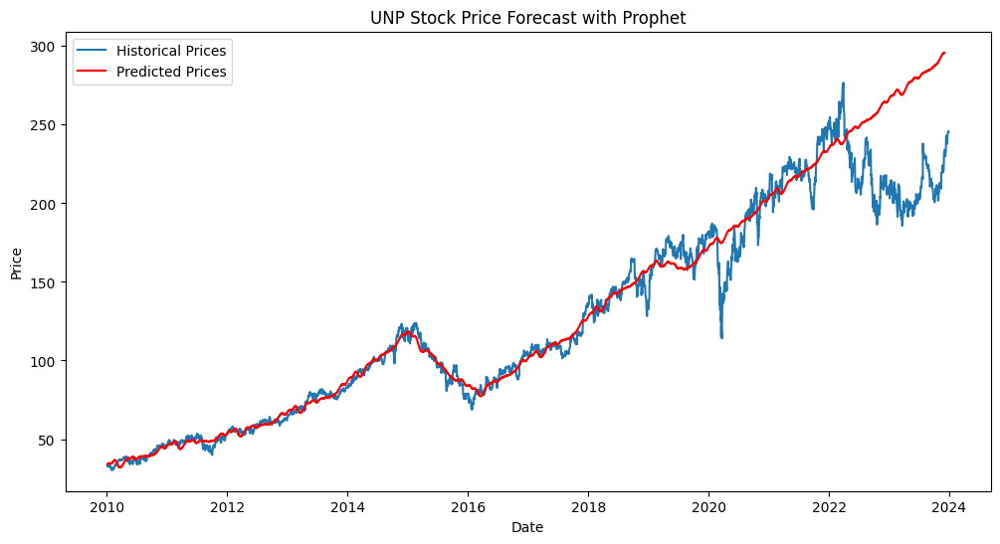

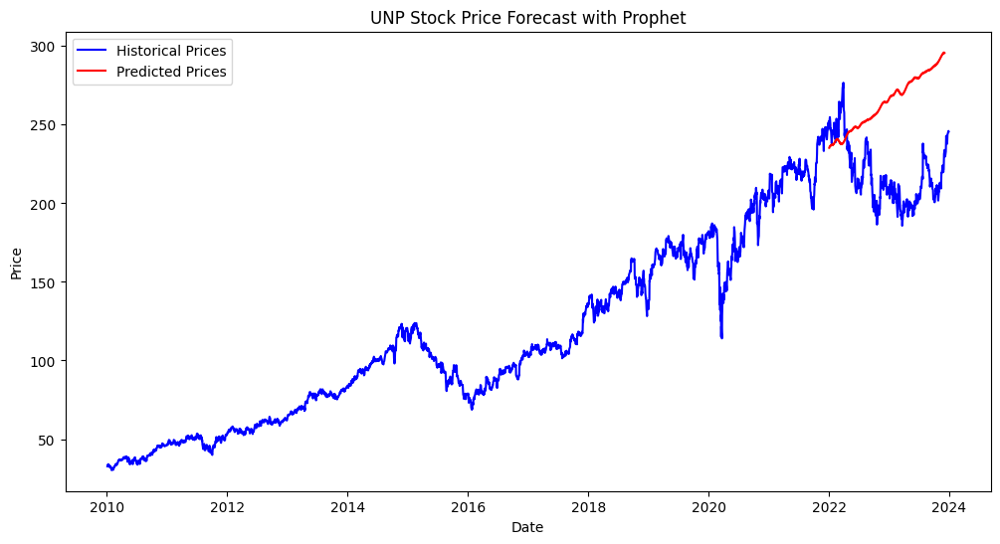

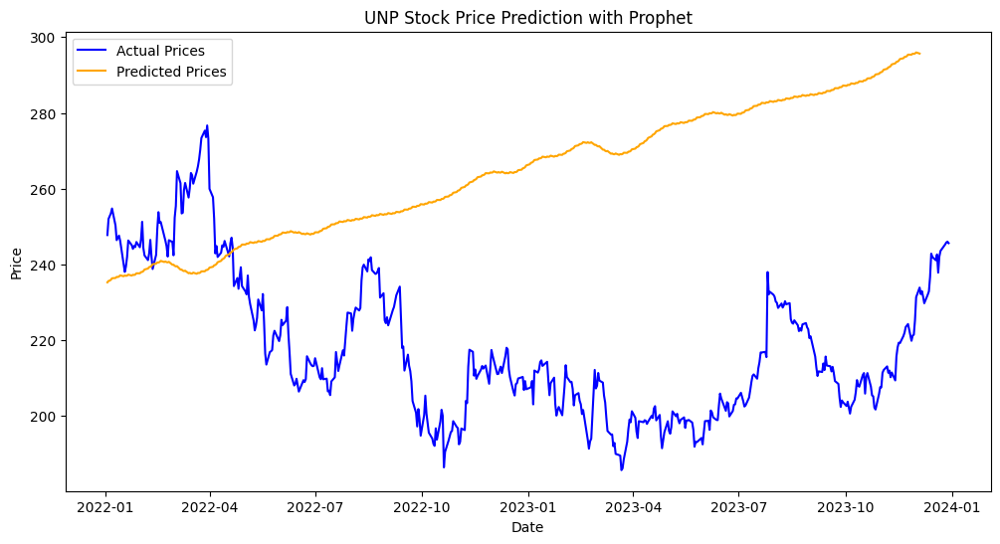

Average margin of difference for UNP: 49.70
Average margin of difference for UNP (percentage): 23.69%
Directional accuracy for UNP: 52.50%


In [ ]:
# beginning of forecast is 2022
from prophet import Prophet
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def run_prophet(ticker):
    # Download data
    data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    df = pd.DataFrame(data['Close'])
    df.reset_index(inplace=True)
    df.rename(columns={'Date': 'ds', 'Close': 'y'}, inplace=True)

    # Fit the Prophet model on data up to the beginning of 2022
    m = Prophet(daily_seasonality=False)
    m.fit(df[df['ds'] < '2022-01-01'])  # Train only on data before 2022

    # Create future dataframe for forecasting
    future = m.make_future_dataframe(periods=len(data['2022-01-01':]), freq='B')
    forecast = m.predict(future)

    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices')
    plt.plot(forecast['ds'], forecast['yhat'], color='red', label='Predicted Prices')
    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    # Plot historical and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices', color='blue')  # Historical prices

    # Only plot predicted prices starting from 2022
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], color='red', label='Predicted Prices')  # Predicted prices

    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    # Filter actual data for plotting
    actual_data = df[df['ds'] >= '2022-01-01']
    plt.plot(actual_data['ds'], actual_data['y'], label='Actual Prices', color='blue')

    # Filter forecast data for plotting
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], label='Predicted Prices', color='orange')

    plt.title(f"{ticker} Stock Price Prediction with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    # Calculate and print the average margin of difference
    avg_margin = average_margin_of_difference(actual_data['y'], forecasted_data['yhat'])
    avg_margin_percentage = average_margin_of_difference_percentage(actual_data['y'], forecasted_data['yhat'])
    direction_accuracy = directional_accuracy(actual_data['y'], forecasted_data['yhat'])

    print(f"Average margin of difference for {ticker}: {avg_margin:.2f}")
    print(f"Average margin of difference for {ticker} (percentage): {avg_margin_percentage:.2f}%")
    print(f"Directional accuracy for {ticker}: {direction_accuracy:.2f}%")

# Function to calculate the average margin of difference between actual and predicted prices
def average_margin_of_difference(actual, predicted):
    margins = actual.values - predicted.values
    avg_margin = np.mean(np.abs(margins))
    return avg_margin

# Function to calculate the average margin of difference as a percentage
def average_margin_of_difference_percentage(actual, predicted):
    margins = actual.values - predicted.values
    avg_margin_percentage = np.mean(np.abs(margins) / actual.values) * 100
    return avg_margin_percentage

# Function to calculate directional accuracy
def directional_accuracy(actual, predicted):
    actual_diff = np.sign(np.diff(actual.values, prepend=actual.values[0]))
    predicted_diff = np.sign(np.diff(predicted.values, prepend=predicted.values[0]))
    accuracy = np.mean(actual_diff == predicted_diff) * 100
    return accuracy

# Run the Prophet model for multiple stocks
run_prophet("GE")
run_prophet("CAT")
run_prophet("UNP")

### Baseline Sector - Indices Models

#### ARIMA

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


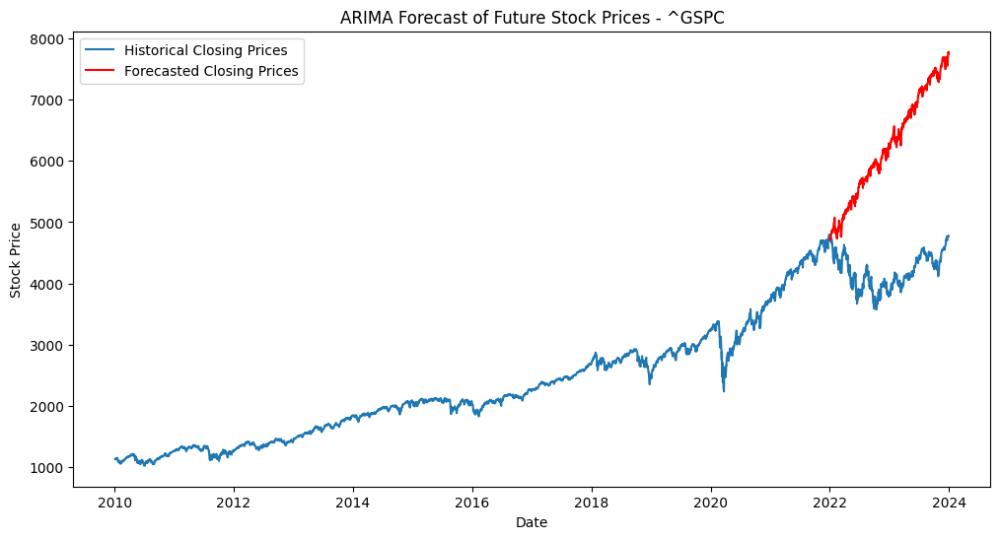

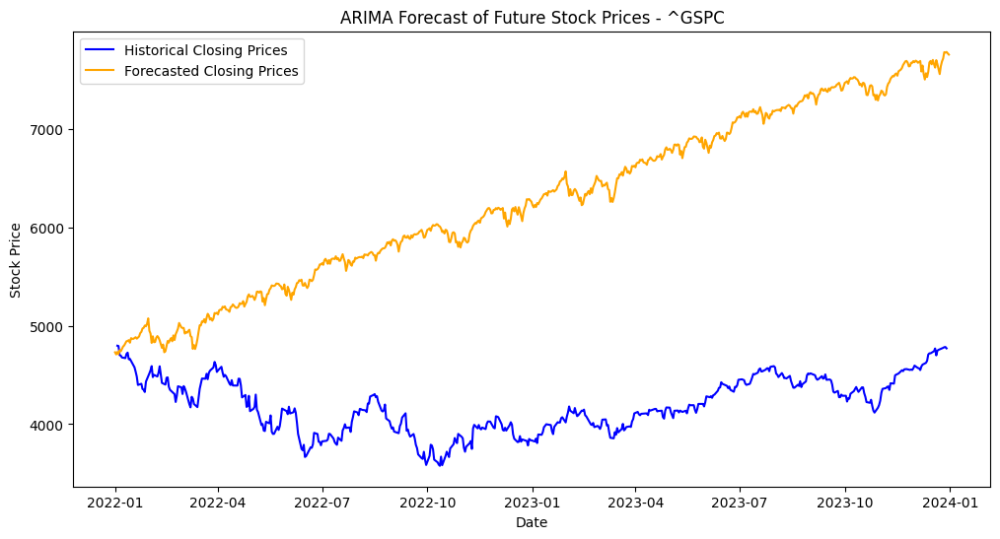

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


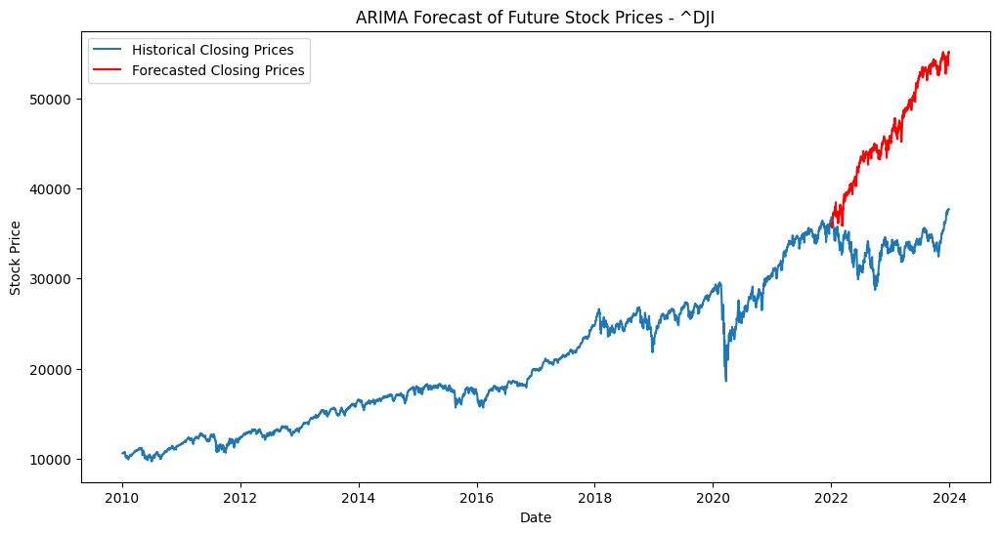

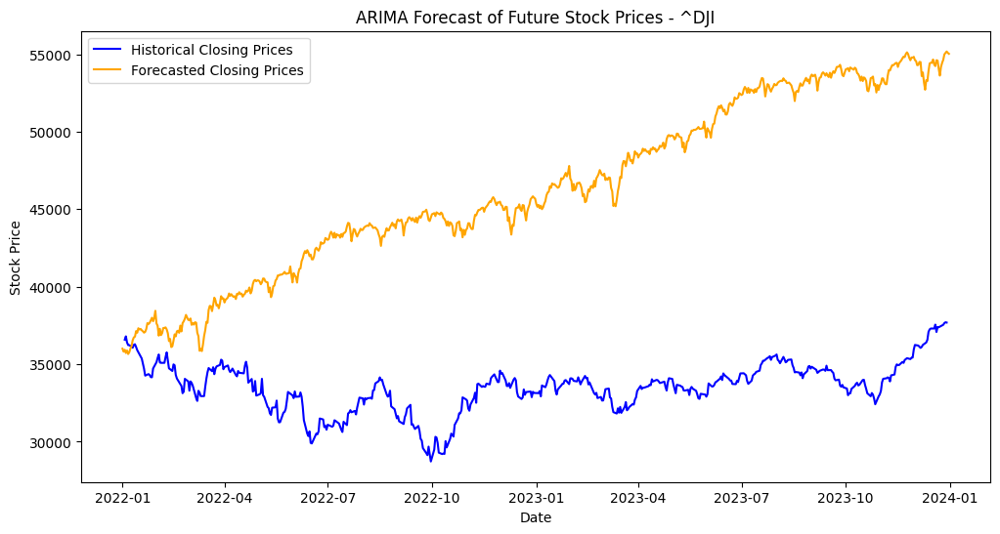

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


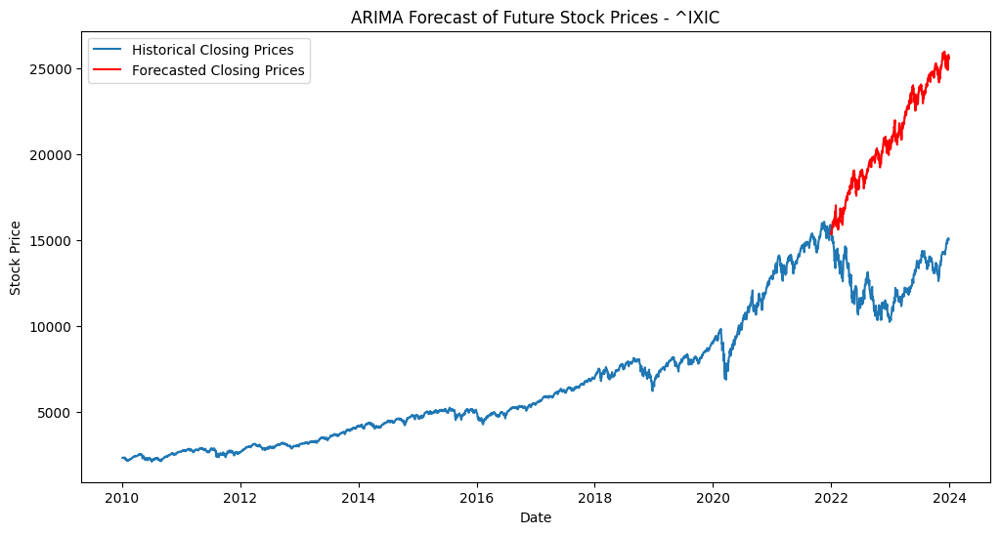

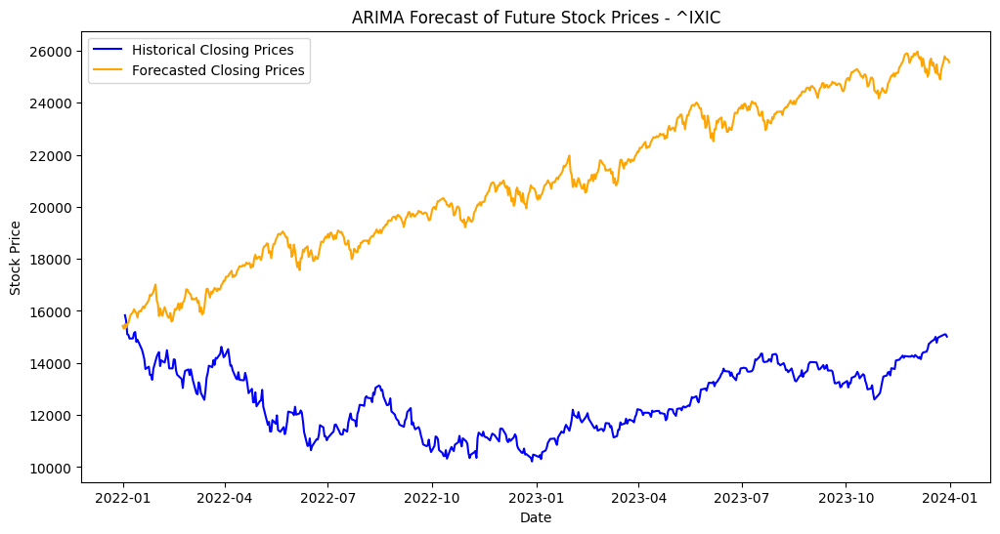

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


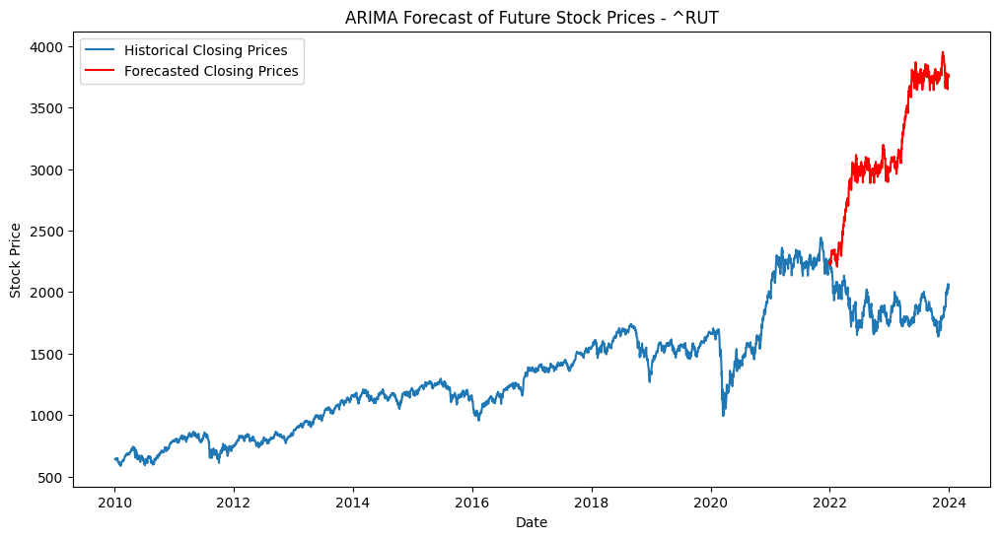

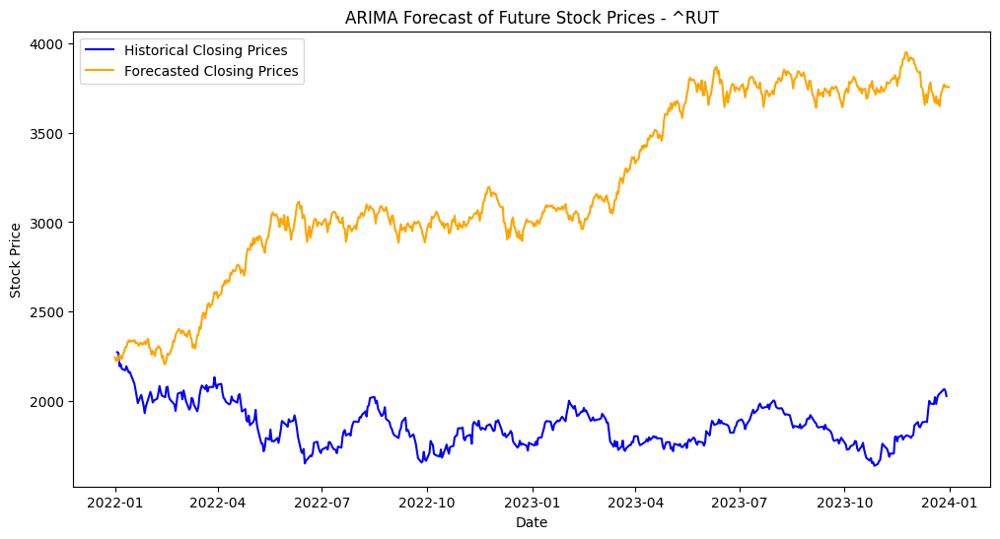

In [ ]:
import yfinance as yf
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import numpy as np

# Function to create a differenced series to make the data stationary
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return np.array(diff)

# Function to invert differenced value
def inverse_difference(history, yhat, interval=1):
    return yhat + history[-interval]

# List of stock symbols to process
symbols = ["^GSPC", "^DJI", "^IXIC", "^RUT"]

for symbol in symbols:
    # Download historical data for each stock
    historical_data = yf.download(symbol, start="2010-01-01", end="2024-01-01")
    historical_data1 = yf.download(symbol, start="2022-01-01", end="2024-01-01")
    data = yf.download(symbol, start="2010-01-01", end="2022-01-01")
    close_prices = data['Close'].values

    # Assuming yearly differencing might be needed
    days_in_year = 365
    differenced = difference(close_prices, days_in_year)

    # Fit ARIMA model on the differenced data
    model = ARIMA(differenced, order=(1,1,1))
    model_fit = model.fit()

    # Forecast for the next two years (2022 to 2024)
    forecast = model_fit.forecast(steps=2*365)  # daily data

    # Invert the differenced forecast to something usable
    history = list(close_prices)
    predictions = []
    day = 1
    for yhat in forecast:
        inverted = inverse_difference(history, yhat, days_in_year)
        predictions.append(inverted)
        history.append(inverted)
        day += 1

    # Plotting the results
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.index, historical_data['Close'], label='Historical Closing Prices')
    forecast_index = pd.date_range(start='2022-01-01', periods=2*365, freq='D')
    plt.plot(forecast_index, predictions, color='red', label='Forecasted Closing Prices')
    plt.title(f'ARIMA Forecast of Future Stock Prices - {symbol}')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(historical_data1.index, historical_data1['Close'], label='Historical Closing Prices', color = 'blue')
    forecast_index = pd.date_range(start='2022-01-01', periods=2*365, freq='D')
    plt.plot(forecast_index, predictions, color='orange', label='Forecasted Closing Prices')
    plt.title(f'ARIMA Forecast of Future Stock Prices - {symbol}')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


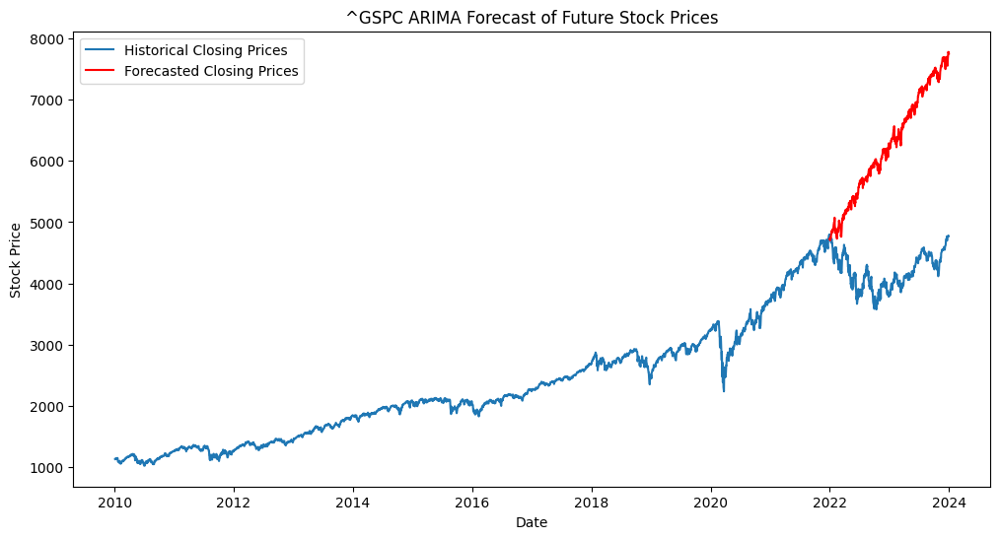

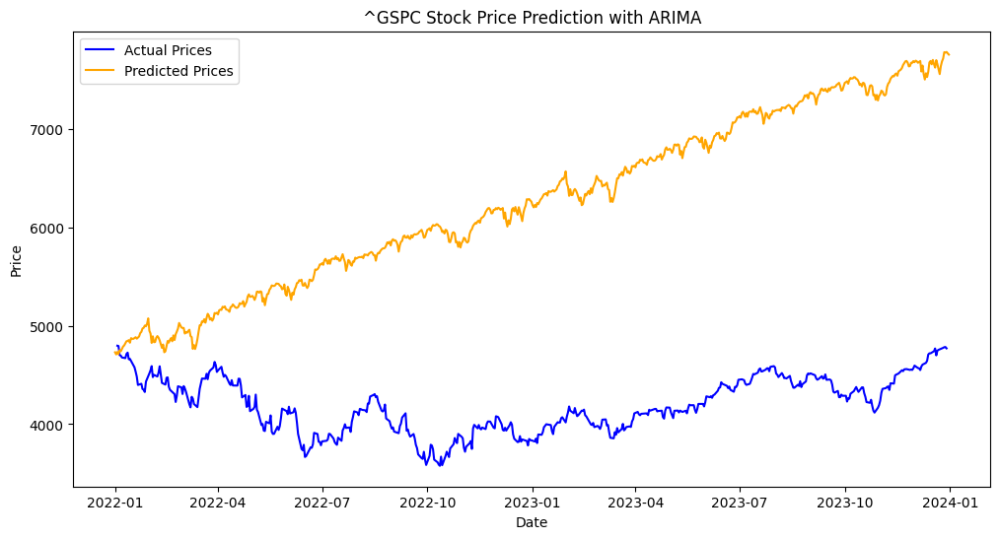

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Average margin of difference for ^GSPC: 1597.24
Average margin of difference for ^GSPC (percentage): 38.52%
Directional accuracy for ^GSPC: 49.70%


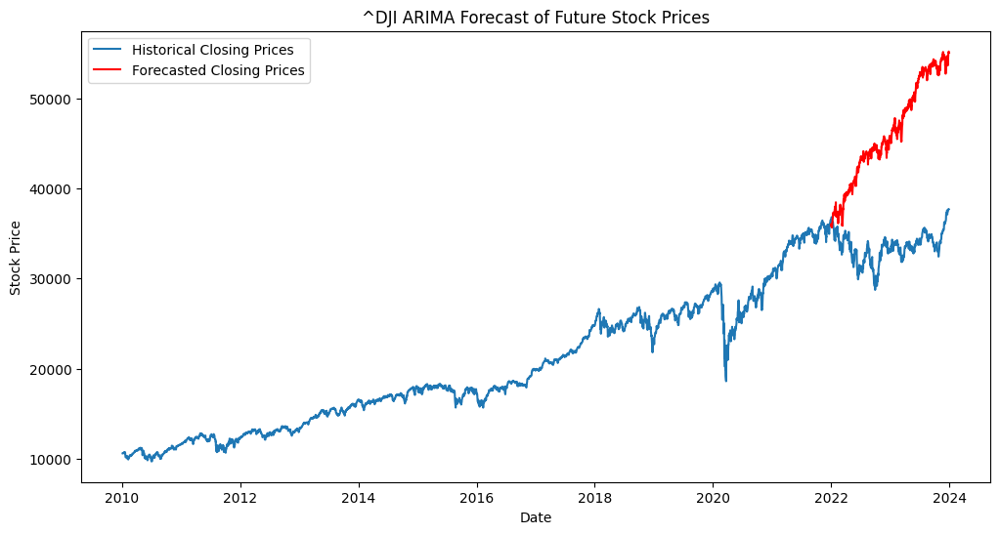

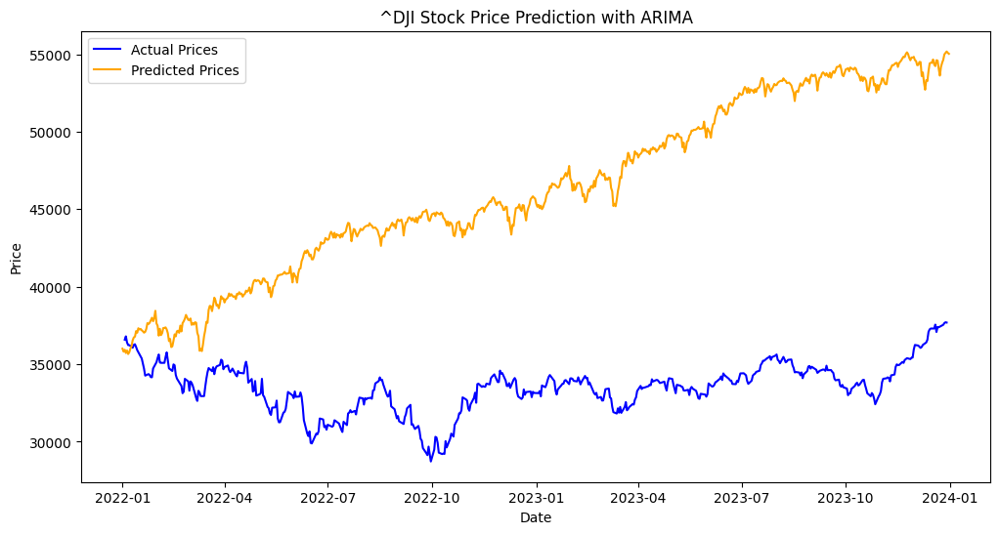

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Average margin of difference for ^DJI: 9764.41
Average margin of difference for ^DJI (percentage): 29.32%
Directional accuracy for ^DJI: 49.90%


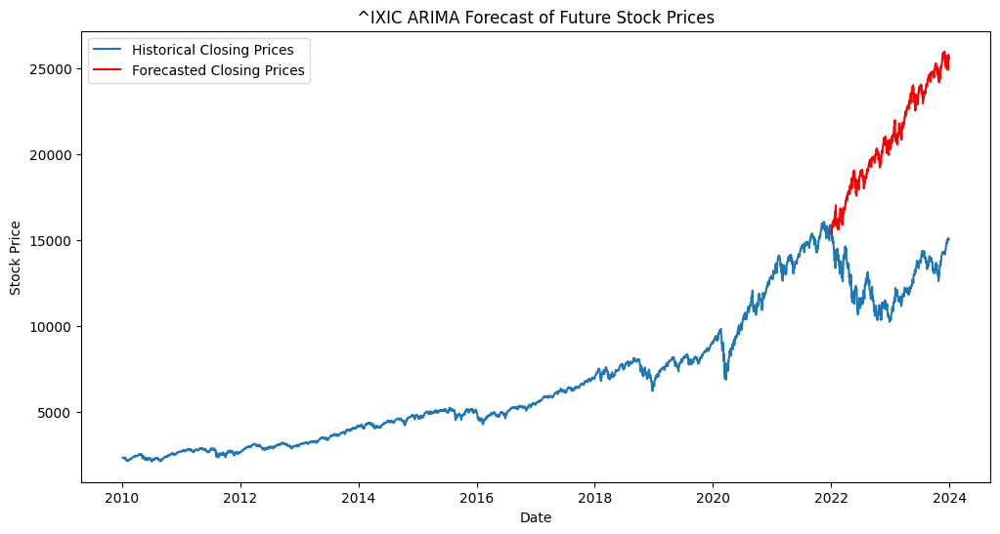

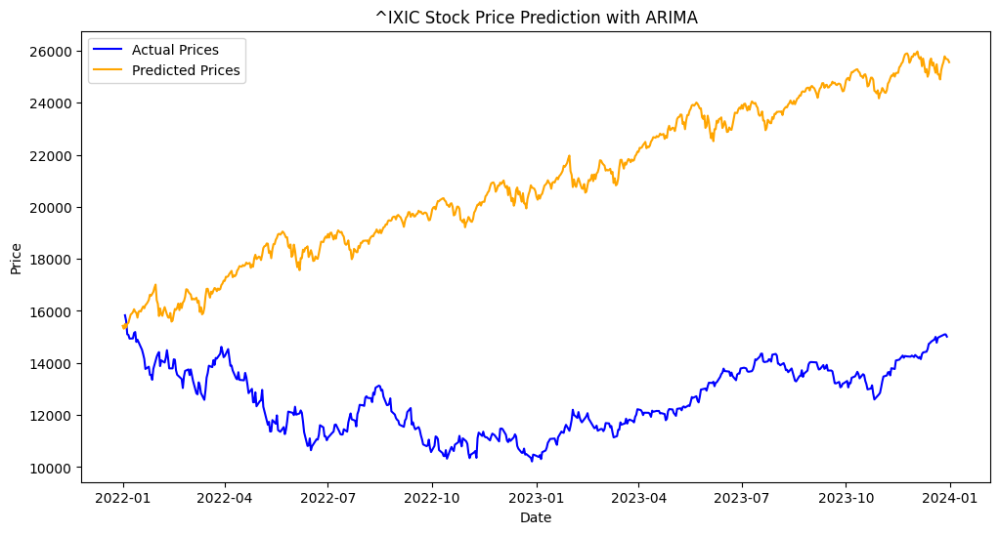

[*********************100%%**********************]  1 of 1 completed


Average margin of difference for ^IXIC: 6759.17
Average margin of difference for ^IXIC (percentage): 54.98%
Directional accuracy for ^IXIC: 50.50%



[*********************100%%**********************]  1 of 1 completed


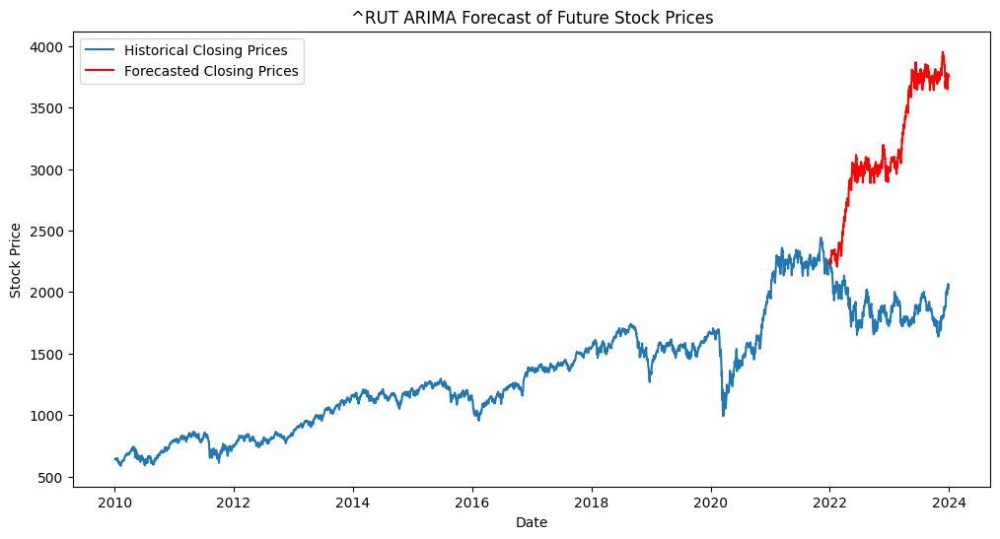

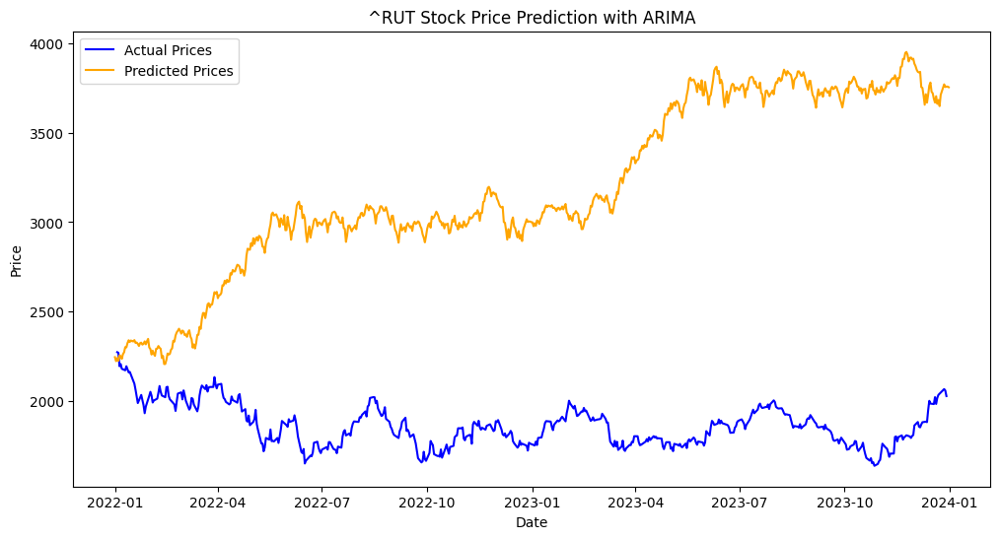


Average margin of difference for ^RUT: 1073.48
Average margin of difference for ^RUT (percentage): 58.81%
Directional accuracy for ^RUT: 50.70%


In [ ]:
import yfinance as yf
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import numpy as np

# Function to create a differenced series to make the data stationary
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return np.array(diff)

# Function to invert differenced value
def inverse_difference(history, yhat, interval=1):
    return yhat + history[-interval]

# Function to calculate the average margin of difference between actual and predicted prices
def average_margin_of_difference(actual, predicted):
    margins = actual.values - predicted
    avg_margin = np.mean(np.abs(margins))
    return avg_margin

# Function to calculate the average margin of difference as a percentage
def average_margin_of_difference_percentage(actual, predicted):
    margins = actual.values - predicted
    avg_margin_percentage = np.mean(np.abs(margins) / actual.values) * 100
    return avg_margin_percentage

# Function to calculate directional accuracy
def directional_accuracy(actual, predicted):
    actual_diff = np.sign(np.diff(actual.values, prepend=actual.values[0]))
    predicted_diff = np.sign(np.diff(predicted, prepend=predicted[0]))
    accuracy = np.mean(actual_diff == predicted_diff) * 100
    return accuracy

# List of tickers
tickers = ["^GSPC", "^DJI", "^IXIC", "^RUT"]

# Loop through each ticker
for ticker in tickers:
    # Download historical data for each ticker
    historical_data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(ticker, start="2010-01-01", end="2022-01-01")
    close_prices = data['Close'].values

    # Assuming yearly differencing might be needed
    days_in_year = 365
    differenced = difference(close_prices, days_in_year)

    # Fit ARIMA model on the differenced data
    model = ARIMA(differenced, order=(1,1,1))
    model_fit = model.fit()

    # Forecast for the next two years (2022 to 2024)
    forecast = model_fit.forecast(steps=2*365)  # daily data

    # Invert the differenced forecast to something usable
    history = list(close_prices)
    predictions = []
    day = 1
    for yhat in forecast:
        inverted = inverse_difference(history, yhat, days_in_year)
        predictions.append(inverted)
        history.append(inverted)
        day += 1

    # Plotting the results for historical closing prices and forecasts
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.index, historical_data['Close'], label='Historical Closing Prices')
    forecast_index = pd.date_range(start='2022-01-01', periods=730, freq='D')
    plt.plot(forecast_index, predictions, color='red', label='Forecasted Closing Prices')
    plt.title(f'{ticker} ARIMA Forecast of Future Stock Prices')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

    # Plotting actual prices and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data.loc['2022-01-01':].index, historical_data.loc['2022-01-01':]['Close'], label='Actual Prices', color='blue')
    plt.plot(forecast_index, predictions, label='Predicted Prices', color='orange')
    plt.legend()
    plt.title(f"{ticker} Stock Price Prediction with ARIMA")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Calculate and print the average margin of difference
    actual_prices = historical_data.loc['2022-01-01':]['Close']
    predicted_prices = pd.Series(predictions, index=forecast_index)
    avg_margin = average_margin_of_difference(actual_prices, predicted_prices[:len(actual_prices)])
    avg_margin_percentage = average_margin_of_difference_percentage(actual_prices, predicted_prices[:len(actual_prices)])
    direction_accuracy = directional_accuracy(actual_prices, predicted_prices[:len(actual_prices)])

    print(f"\nAverage margin of difference for {ticker}: {avg_margin:.2f}")
    print(f"Average margin of difference for {ticker} (percentage): {avg_margin_percentage:.2f}%")
    print(f"Directional accuracy for {ticker}: {direction_accuracy:.2f}%")


#### LSTM

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating ^GSPC


Epoch 1/50
74/74 [==============================] - 10s 56ms/step - loss: 0.0037 - val_loss: 9.9528e-04
Epoch 2/50
74/74 [==============================] - 4s 52ms/step - loss: 2.1701e-04 - val_loss: 9.5441e-04
Epoch 3/50
74/74 [==============================] - 5s 74ms/step - loss: 1.8408e-04 - val_loss: 0.0015
Epoch 4/50
74/74 [==============================] - 3s 45ms/step - loss: 1.8649e-04 - val_loss: 8.0414e-04
Epoch 5/50
74/74 [==============================] - 3s 44ms/step - loss: 1.6499e-04 - val_loss: 9.2866e-04
Epoch 6/50
74/74 [==============================] - 3s 44ms/step - loss: 1.6344e-04 - val_loss: 0.0017
Epoch 7/50
74/74 [==============================] - 5s 67ms/step - loss: 1.5399e-04 - val_loss: 0.0015
Epoch 8/50
74/74 [==============================] - 3s 44ms/step - loss: 1.5406e-04 - val_loss: 6.8888e-04
Epoch 9/50
74/74 [==============================] - 3s 47ms/step - loss: 1.3716e-04 - val_loss: 0.0016
Epoch 10/50
74/74 [==============================] - 3s 

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 22ms/step
^GSPC - Mean Absolute Error (MAE): 3984.797341617806
^GSPC - Mean Squared Error (MSE): 15931559.569249876
^GSPC - Root Mean Squared Error (RMSE): 3991.435777918752


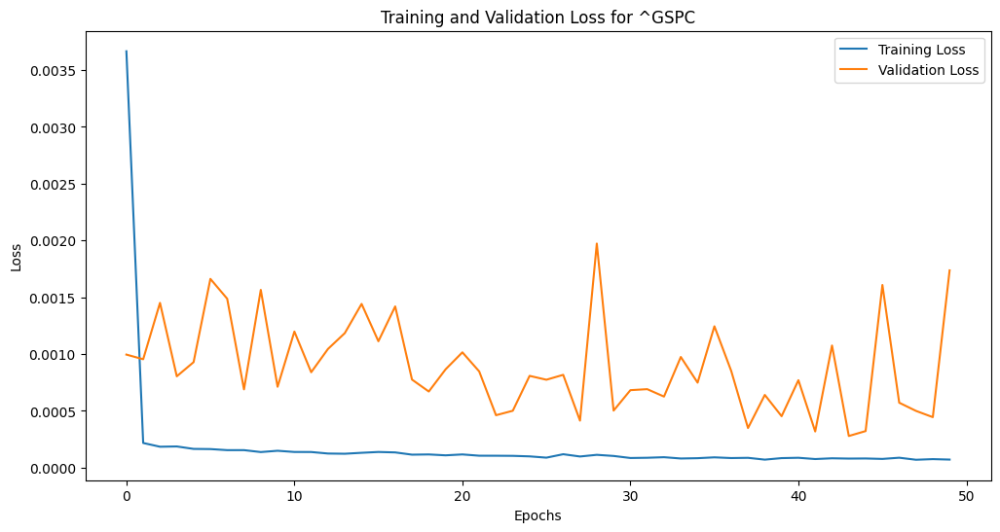

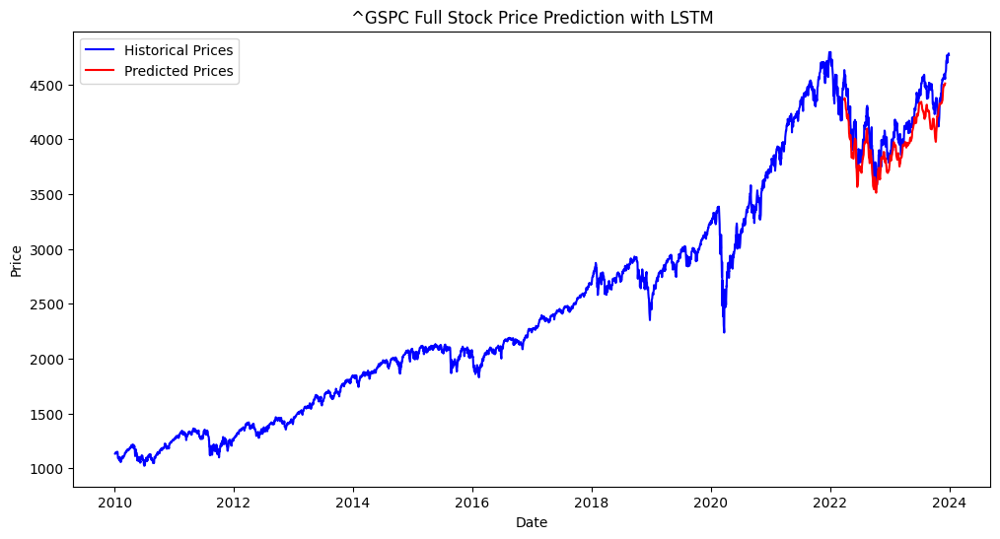

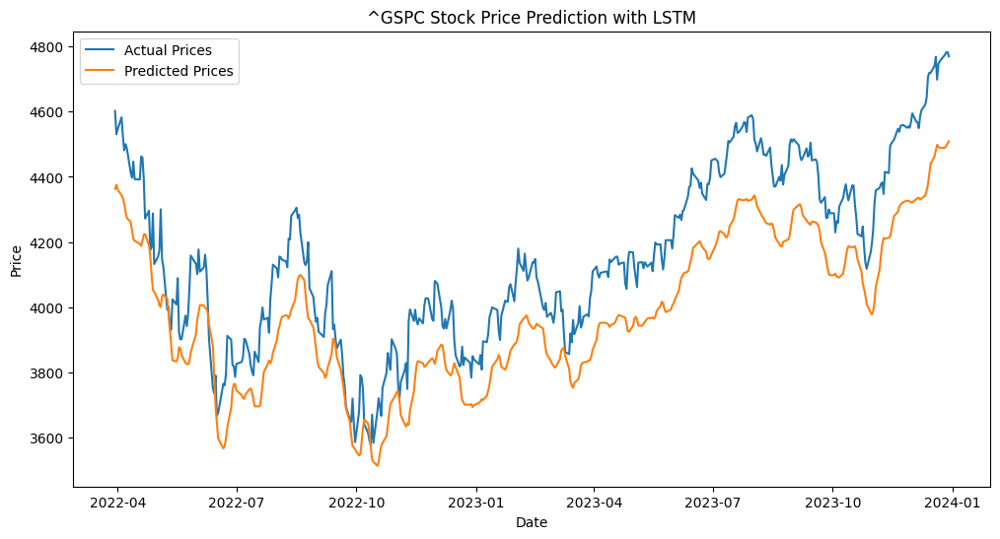

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating ^DJI


Epoch 1/50
74/74 [==============================] - 8s 57ms/step - loss: 0.0065 - val_loss: 0.0011
Epoch 2/50
74/74 [==============================] - 5s 69ms/step - loss: 2.7733e-04 - val_loss: 0.0012
Epoch 3/50
74/74 [==============================] - 3s 45ms/step - loss: 2.4668e-04 - val_loss: 0.0013
Epoch 4/50
74/74 [==============================] - 4s 48ms/step - loss: 2.7182e-04 - val_loss: 0.0023
Epoch 5/50
74/74 [==============================] - 5s 63ms/step - loss: 2.6998e-04 - val_loss: 0.0011
Epoch 6/50
74/74 [==============================] - 4s 57ms/step - loss: 2.3490e-04 - val_loss: 0.0015
Epoch 7/50
74/74 [==============================] - 3s 47ms/step - loss: 2.3888e-04 - val_loss: 0.0011
Epoch 8/50
74/74 [==============================] - 4s 49ms/step - loss: 2.5928e-04 - val_loss: 0.0016
Epoch 9/50
74/74 [==============================] - 5s 66ms/step - loss: 2.2180e-04 - val_loss: 0.0011
Epoch 10/50
74/74 [==============================] - 3s 44ms/step - loss: 2.2

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 23ms/step
^DJI - Mean Absolute Error (MAE): 32623.01140946488
^DJI - Mean Squared Error (MSE): 1066103947.3629581
^DJI - Root Mean Squared Error (RMSE): 32651.247255854683


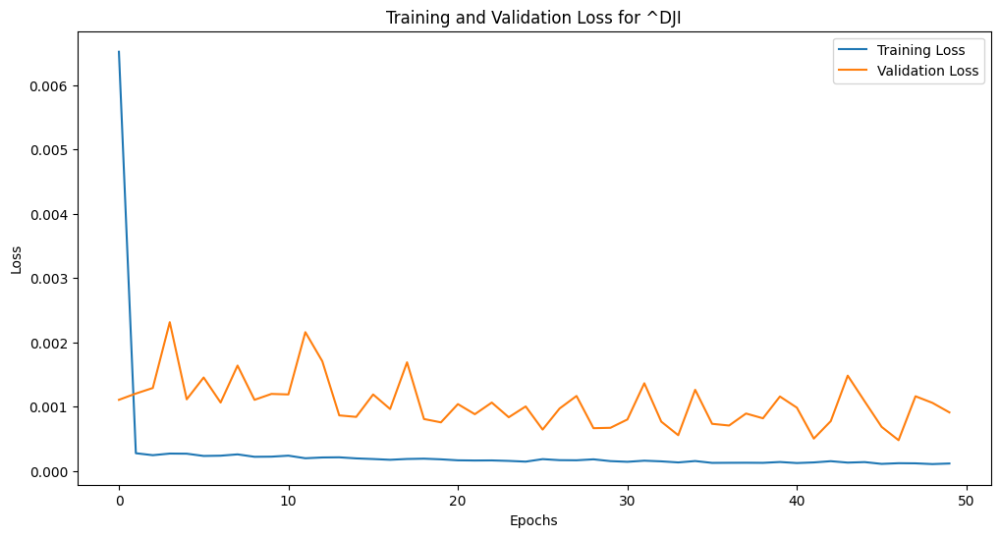

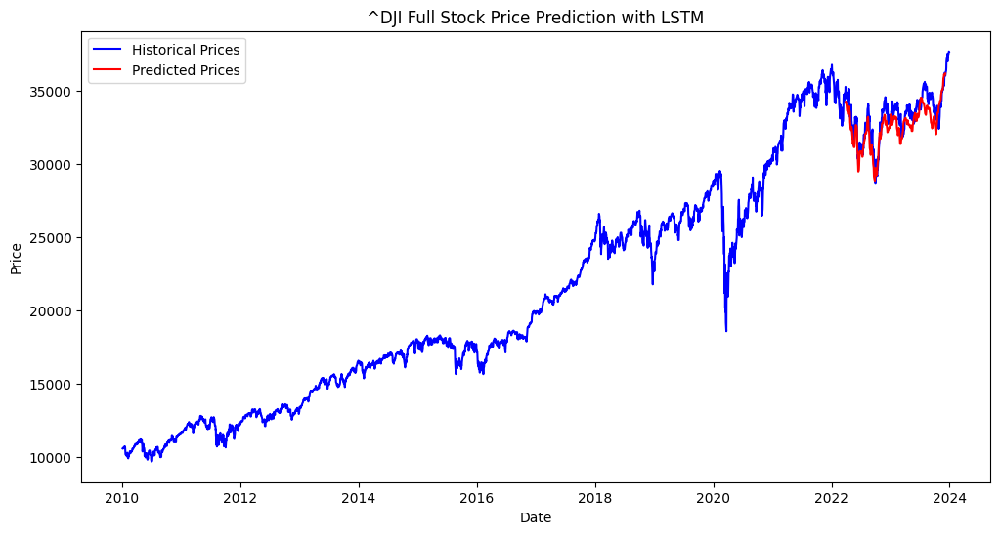

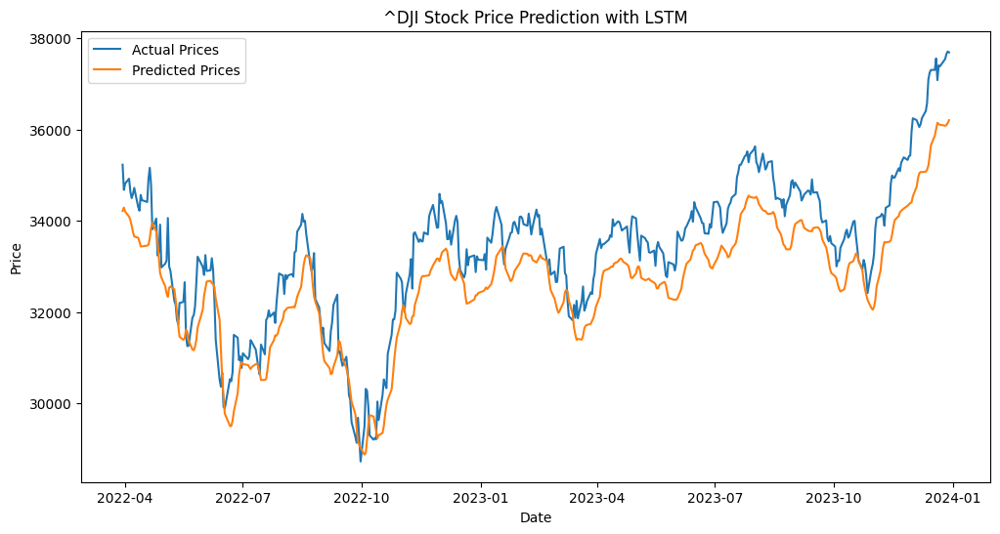

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating ^IXIC


Epoch 1/50
74/74 [==============================] - 8s 62ms/step - loss: 0.0025 - val_loss: 7.0935e-04
Epoch 2/50
74/74 [==============================] - 5s 69ms/step - loss: 1.2909e-04 - val_loss: 0.0012
Epoch 3/50
74/74 [==============================] - 3s 46ms/step - loss: 1.2044e-04 - val_loss: 0.0023
Epoch 4/50
74/74 [==============================] - 4s 48ms/step - loss: 1.0911e-04 - val_loss: 0.0046
Epoch 5/50
74/74 [==============================] - 5s 65ms/step - loss: 1.1697e-04 - val_loss: 0.0019
Epoch 6/50
74/74 [==============================] - 4s 51ms/step - loss: 1.0323e-04 - val_loss: 0.0025
Epoch 7/50
74/74 [==============================] - 4s 48ms/step - loss: 1.0612e-04 - val_loss: 0.0022
Epoch 8/50
74/74 [==============================] - 3s 46ms/step - loss: 9.4966e-05 - val_loss: 0.0022
Epoch 9/50
74/74 [==============================] - 5s 67ms/step - loss: 8.9403e-05 - val_loss: 0.0026
Epoch 10/50
74/74 [==============================] - 3s 46ms/step - loss:

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 27ms/step
^IXIC - Mean Absolute Error (MAE): 11938.411557656826
^IXIC - Mean Squared Error (MSE): 143639408.64149252
^IXIC - Root Mean Squared Error (RMSE): 11984.965942441911


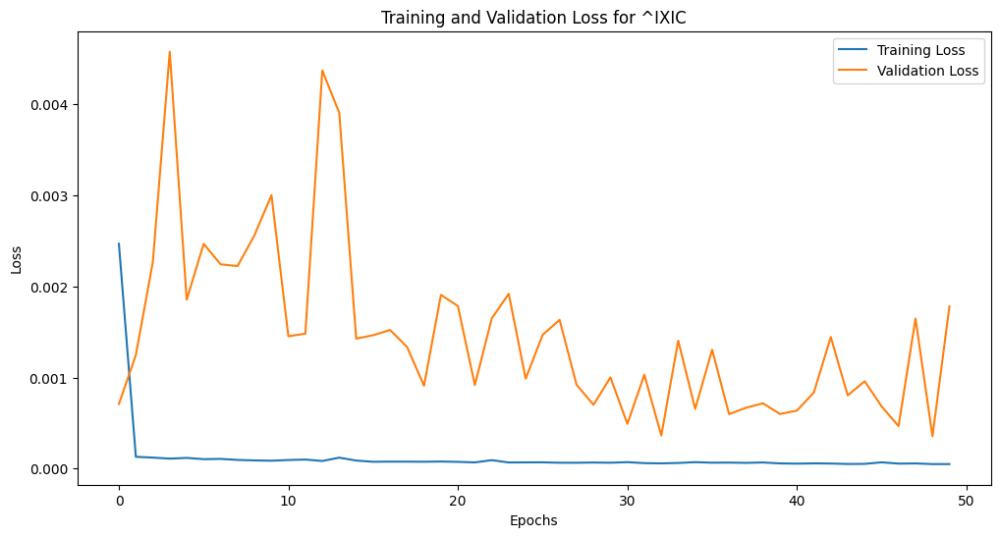

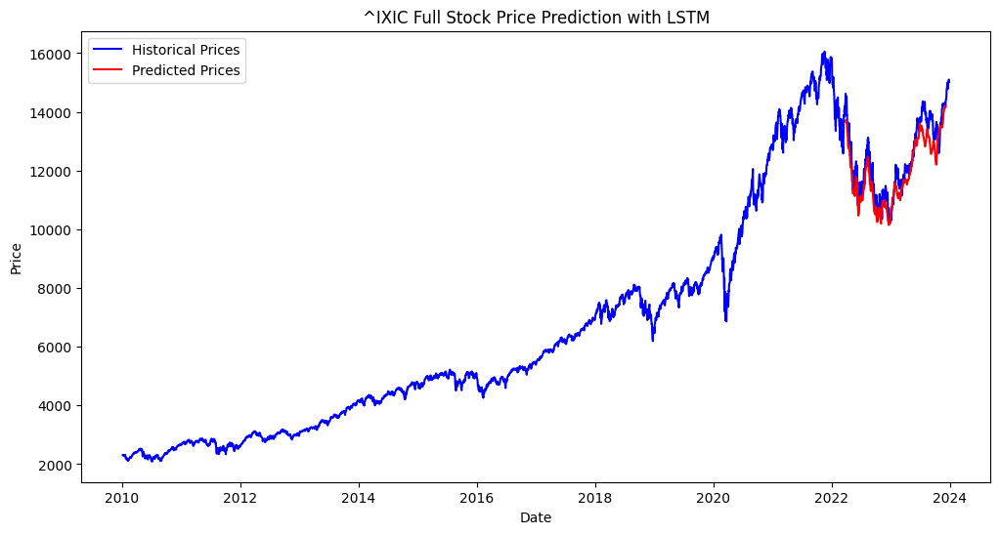

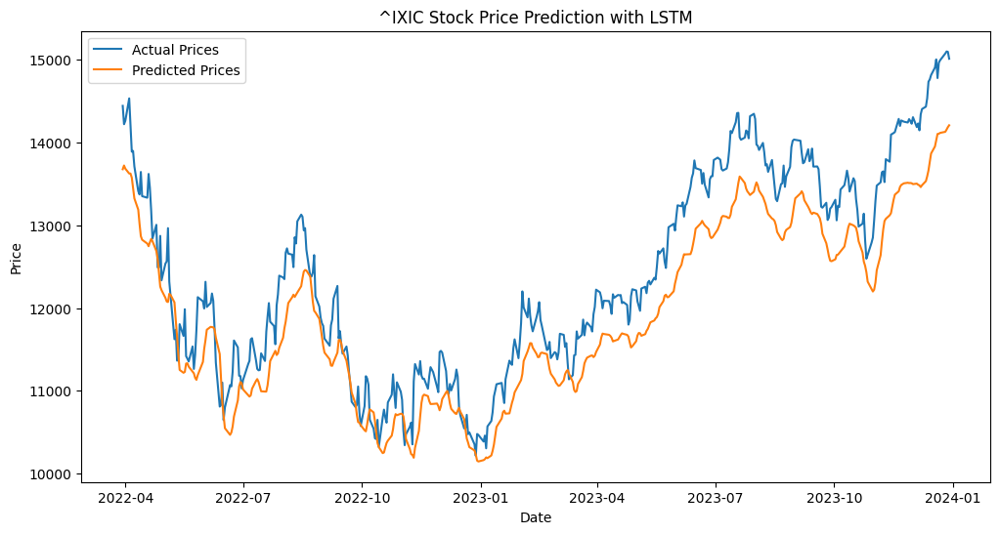

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating ^RUT


Epoch 1/50
74/74 [==============================] - 8s 67ms/step - loss: 0.0051 - val_loss: 0.0020
Epoch 2/50
74/74 [==============================] - 5s 74ms/step - loss: 3.4533e-04 - val_loss: 0.0019
Epoch 3/50
74/74 [==============================] - 3s 47ms/step - loss: 3.4667e-04 - val_loss: 0.0028
Epoch 4/50
74/74 [==============================] - 4s 50ms/step - loss: 3.4906e-04 - val_loss: 0.0022
Epoch 5/50
74/74 [==============================] - 4s 58ms/step - loss: 3.2088e-04 - val_loss: 0.0031
Epoch 6/50
74/74 [==============================] - 5s 63ms/step - loss: 3.3204e-04 - val_loss: 0.0046
Epoch 7/50
74/74 [==============================] - 4s 49ms/step - loss: 3.1361e-04 - val_loss: 0.0016
Epoch 8/50
74/74 [==============================] - 4s 49ms/step - loss: 2.8609e-04 - val_loss: 0.0019
Epoch 9/50
74/74 [==============================] - 5s 67ms/step - loss: 2.9299e-04 - val_loss: 0.0016
Epoch 10/50
74/74 [==============================] - 3s 47ms/step - loss: 2.6

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 21ms/step
^RUT - Mean Absolute Error (MAE): 1826.1576172613145
^RUT - Mean Squared Error (MSE): 3342810.586240669
^RUT - Root Mean Squared Error (RMSE): 1828.3354687367055


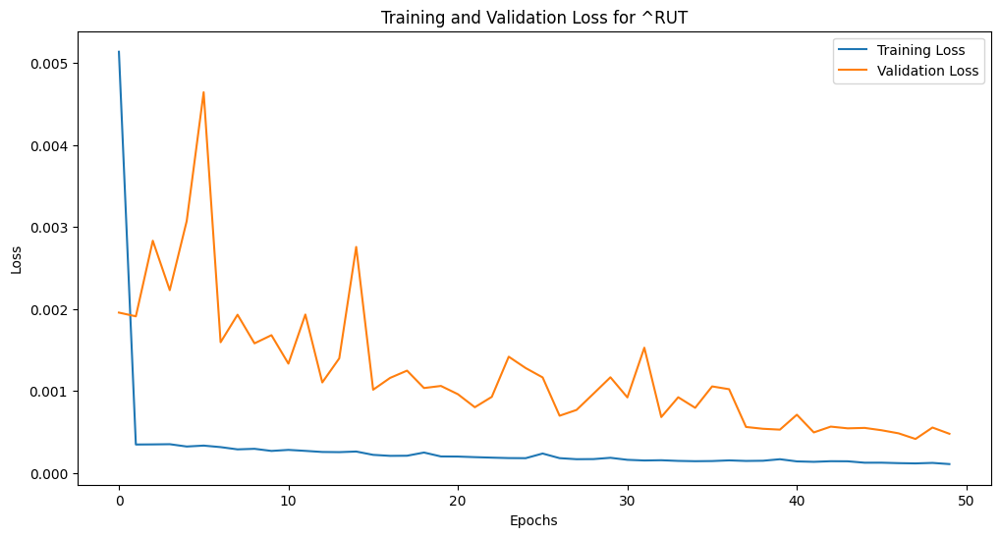

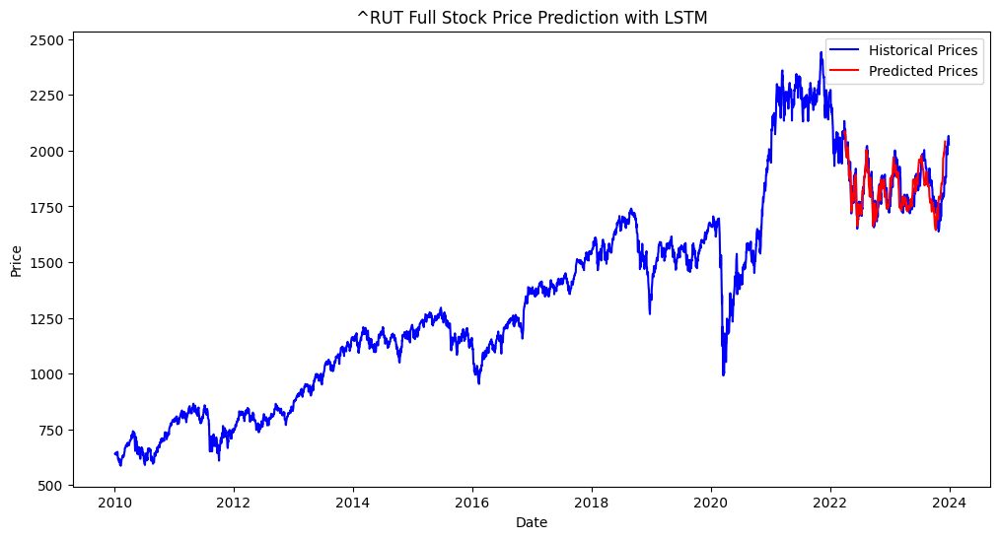

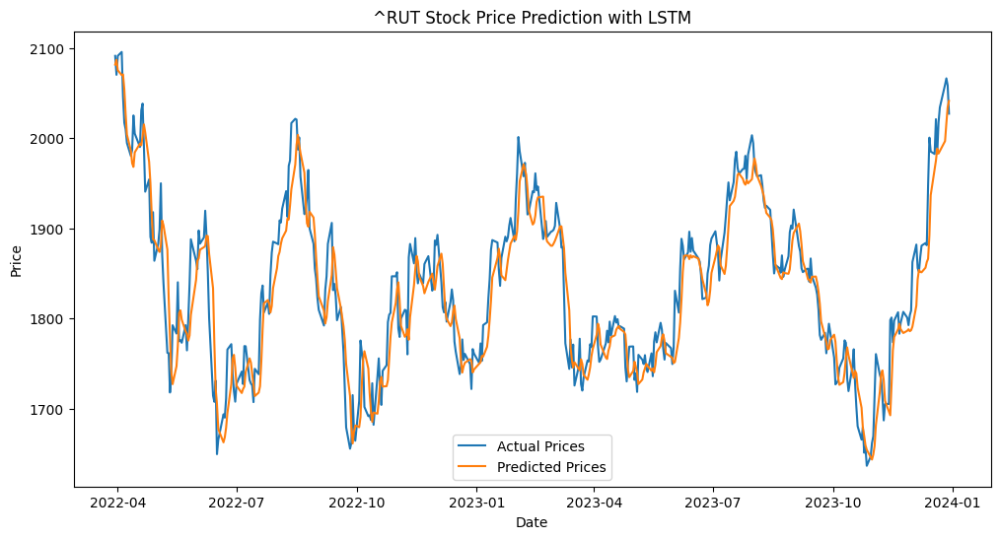

CPU times: user 18min 49s, sys: 21.5 s, total: 19min 11s
Wall time: 15min 56s


In [ ]:
%%time
def evaluate_lstm(stock_ticker):
    print(f"Evaluating {stock_ticker}")

    # Fetch Data
    historical_data = yf.download(stock_ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(stock_ticker, start="2010-01-01", end="2022-01-01")
    closing_prices = data['Close']
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(closing_prices.values.reshape(-1, 1))

    # Prepare Data
    SEQ_LENGTH = 60
    x, y = create_sequences(scaled_data, SEQ_LENGTH)
    split = int(0.8 * len(x))
    x_train, x_val = x[:split], x[split:]
    y_train, y_val = y[:split], y[split:]

    # Build Model
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(SEQ_LENGTH, 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train Model
    history = model.fit(x_train, y_train, validation_data=(x_val, y_val), batch_size=32, epochs=50)

    # Evaluate Model
    test_data = yf.download(stock_ticker, start="2022-01-01", end="2024-01-01")
    scaled_test_data = scaler.transform(test_data['Close'].values.reshape(-1, 1))
    x_test, y_test = create_sequences(scaled_test_data, SEQ_LENGTH)

    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Calculate error metrics
    mae = mean_absolute_error(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    rmse = math.sqrt(mse)

    print(f"{stock_ticker} - Mean Absolute Error (MAE): {mae}")
    print(f"{stock_ticker} - Mean Squared Error (MSE): {mse}")
    print(f"{stock_ticker} - Root Mean Squared Error (RMSE): {rmse}")

    # Plot training and validation loss
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title(f"Training and Validation Loss for {stock_ticker}")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(historical_data['Close'], label='Historical Prices', color='blue')
    forecast_dates = pd.date_range(start=test_data.index[SEQ_LENGTH], periods=len(predictions), freq='B')
    plt.plot(forecast_dates, predictions.flatten(), label='Predicted Prices', color='red')
    plt.legend()
    plt.title(f"{stock_ticker} Full Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Plot actual vs predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(test_data.index[SEQ_LENGTH:], test_data['Close'][SEQ_LENGTH:], label='Actual Prices')
    plt.plot(test_data.index[SEQ_LENGTH:], predictions, label='Predicted Prices')
    plt.legend()
    plt.title(f"{stock_ticker} Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()


# Helper function to create sequences
def create_sequences(data, seq_length):
    x = []
    y = []
    for i in range(seq_length, len(data)):
        x.append(data[i - seq_length:i])
        y.append(data[i])
    return np.array(x), np.array(y)


# Evaluate for multiple stocks
for ticker in ["^GSPC", "^DJI", "^IXIC", "^RUT"]:
    evaluate_lstm(ticker)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Evaluating ^GSPC


Epoch 1/50
74/74 [==============================] - 8s 60ms/step - loss: 0.0046 - val_loss: 7.0720e-04
Epoch 2/50
74/74 [==============================] - 4s 56ms/step - loss: 1.7991e-04 - val_loss: 7.8532e-04
Epoch 3/50
74/74 [==============================] - 4s 60ms/step - loss: 1.7514e-04 - val_loss: 0.0016
Epoch 4/50
74/74 [==============================] - 4s 49ms/step - loss: 1.6782e-04 - val_loss: 0.0019
Epoch 5/50
74/74 [==============================] - 4s 48ms/step - loss: 1.6322e-04 - val_loss: 0.0015
Epoch 6/50
74/74 [==============================] - 5s 70ms/step - loss: 1.7019e-04 - val_loss: 0.0020
Epoch 7/50
74/74 [==============================] - 4s 49ms/step - loss: 1.6279e-04 - val_loss: 0.0016
Epoch 8/50
74/74 [==============================] - 4s 53ms/step - loss: 1.5438e-04 - val_loss: 0.0016
Epoch 9/50
74/74 [==============================] - 5s 71ms/step - loss: 1.5146e-04 - val_loss: 0.0050
Epoch 10/50
74/74 [==============================] - 4s 49ms/step - l

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 17ms/step
^GSPC - Mean Absolute Error (MAE): 4141.257847858063
^GSPC - Mean Squared Error (MSE): 17210001.720838353
^GSPC - Root Mean Squared Error (RMSE): 4148.493909943505


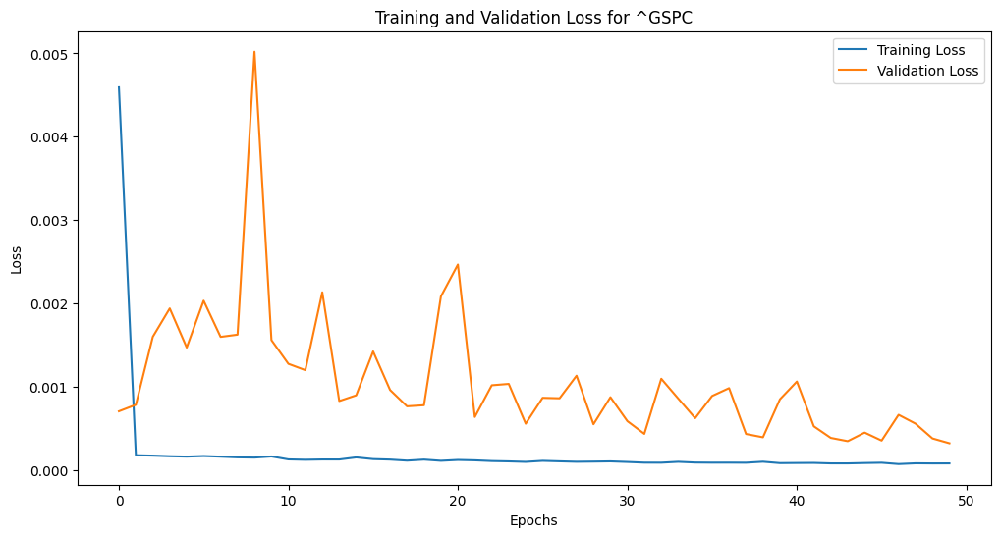

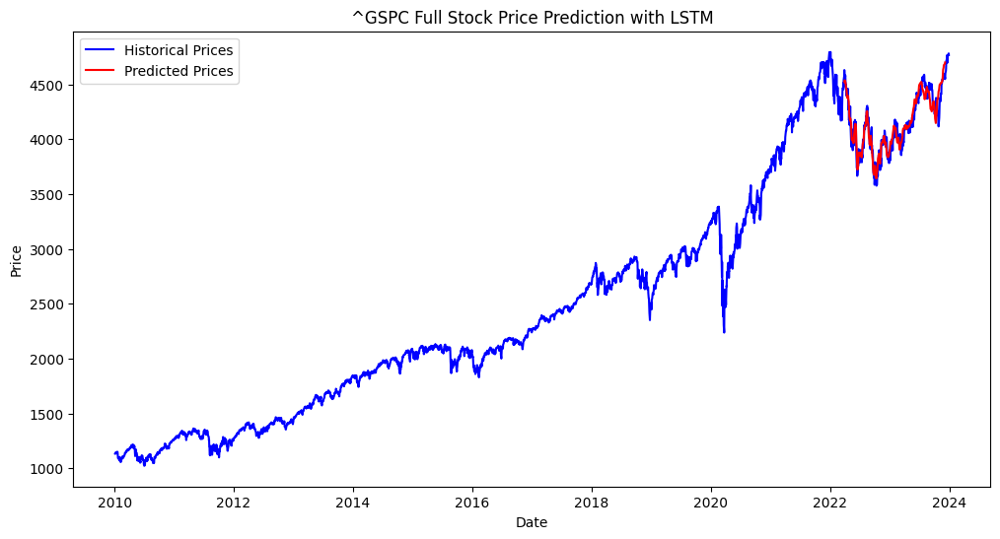

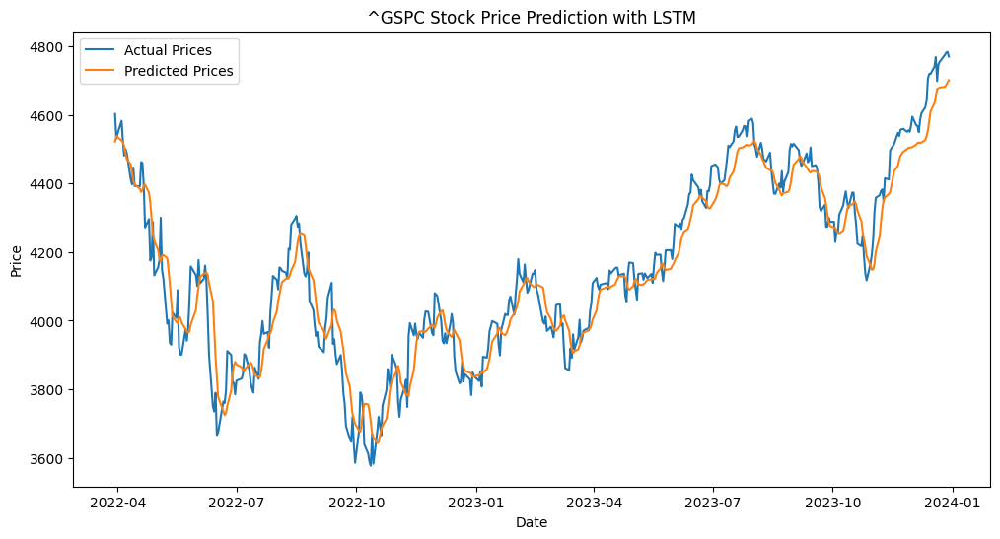

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Average margin of difference for ^GSPC: 58.81
Average margin of difference for ^GSPC (percentage): 1.43%
Directional accuracy for ^GSPC: 49.21%
Evaluating ^DJI


Epoch 1/50
74/74 [==============================] - 10s 75ms/step - loss: 0.0092 - val_loss: 0.0013
Epoch 2/50
74/74 [==============================] - 4s 50ms/step - loss: 3.4238e-04 - val_loss: 0.0019
Epoch 3/50
74/74 [==============================] - 4s 56ms/step - loss: 2.9121e-04 - val_loss: 0.0015
Epoch 4/50
74/74 [==============================] - 5s 64ms/step - loss: 2.8590e-04 - val_loss: 0.0014
Epoch 5/50
74/74 [==============================] - 4s 51ms/step - loss: 2.9138e-04 - val_loss: 0.0015
Epoch 6/50
74/74 [==============================] - 4s 52ms/step - loss: 2.7671e-04 - val_loss: 0.0022
Epoch 7/50
74/74 [==============================] - 5s 74ms/step - loss: 2.5921e-04 - val_loss: 0.0017
Epoch 8/50
74/74 [==============================] - 4s 53ms/step - loss: 2.3982e-04 - val_loss: 0.0014
Epoch 9/50
74/74 [==============================] - 4s 54ms/step - loss: 2.6700e-04 - val_loss: 0.0012
Epoch 10/50
74/74 [==============================] - 6s 77ms/step - loss: 2.

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 18ms/step
^DJI - Mean Absolute Error (MAE): 32345.3393263087
^DJI - Mean Squared Error (MSE): 1048003143.141447
^DJI - Root Mean Squared Error (RMSE): 32372.876658422665


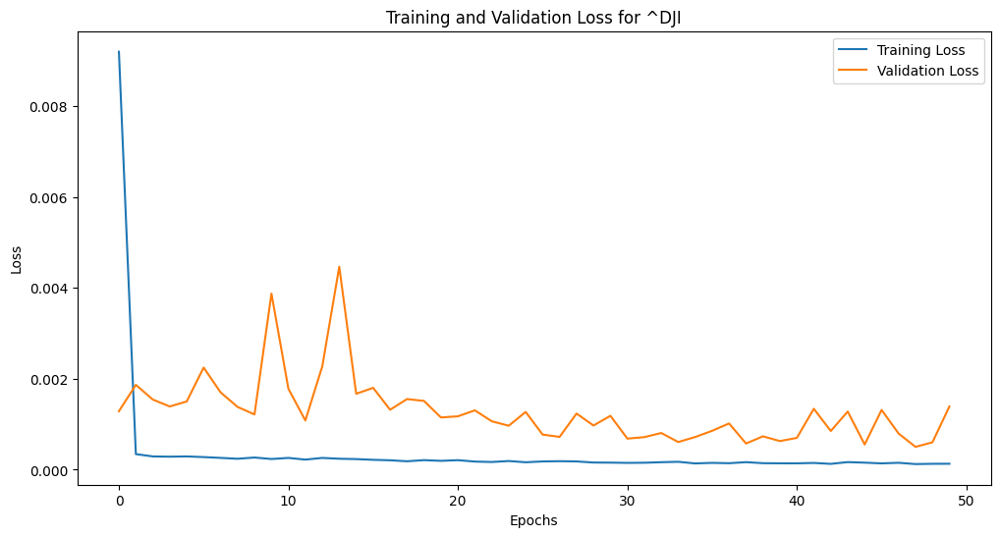

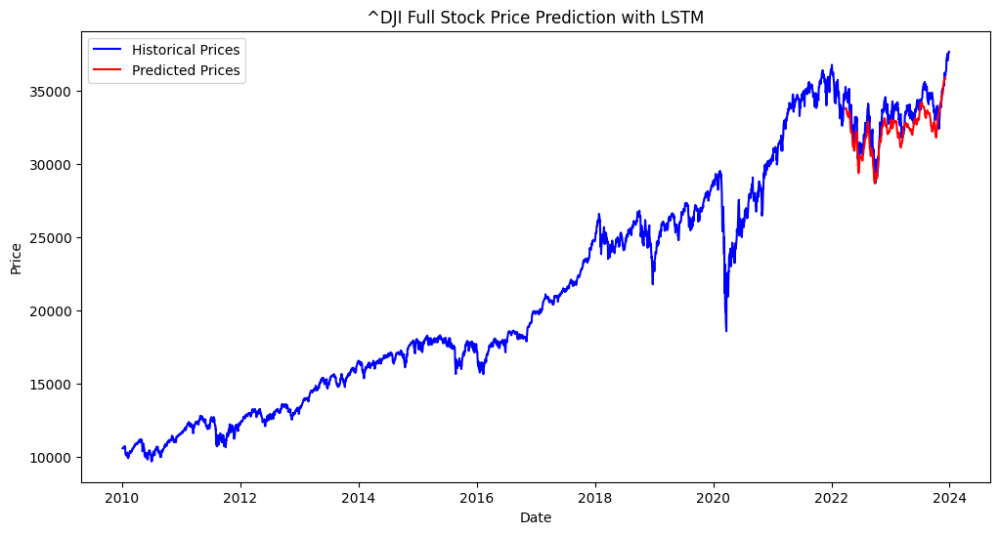

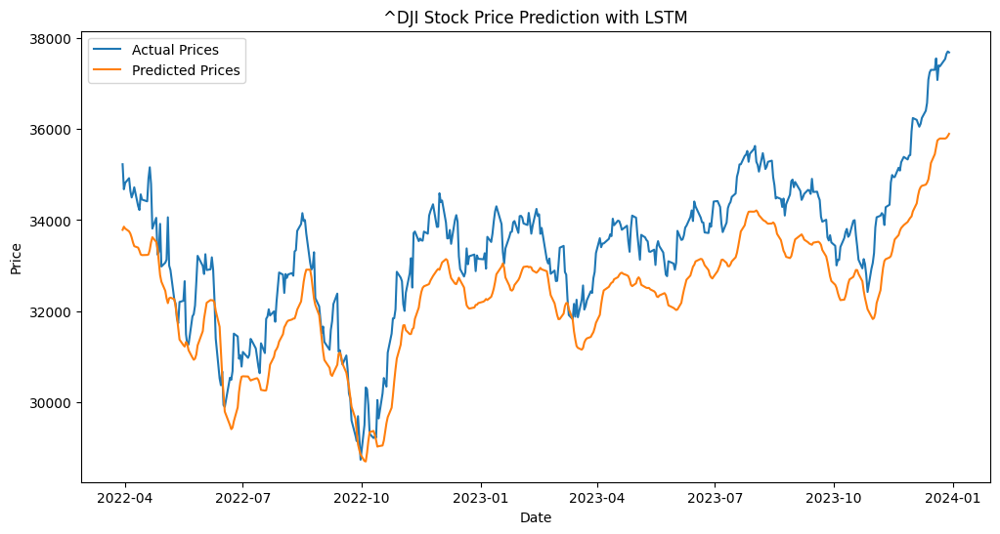

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Average margin of difference for ^DJI: 1024.52
Average margin of difference for ^DJI (percentage): 3.04%
Directional accuracy for ^DJI: 54.42%
Evaluating ^IXIC


Epoch 1/50
74/74 [==============================] - 9s 67ms/step - loss: 0.0044 - val_loss: 6.9890e-04
Epoch 2/50
74/74 [==============================] - 5s 66ms/step - loss: 1.2618e-04 - val_loss: 7.0445e-04
Epoch 3/50
74/74 [==============================] - 5s 67ms/step - loss: 1.0777e-04 - val_loss: 0.0024
Epoch 4/50
74/74 [==============================] - 4s 57ms/step - loss: 1.0504e-04 - val_loss: 0.0018
Epoch 5/50
74/74 [==============================] - 4s 59ms/step - loss: 1.0858e-04 - val_loss: 0.0014
Epoch 6/50
74/74 [==============================] - 5s 72ms/step - loss: 1.0384e-04 - val_loss: 0.0023
Epoch 7/50
74/74 [==============================] - 4s 52ms/step - loss: 9.2926e-05 - val_loss: 0.0029
Epoch 8/50
74/74 [==============================] - 4s 54ms/step - loss: 9.3260e-05 - val_loss: 0.0013
Epoch 9/50
74/74 [==============================] - 6s 80ms/step - loss: 1.0169e-04 - val_loss: 0.0012
Epoch 10/50
74/74 [==============================] - 4s 55ms/step - l

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 2s 29ms/step
^IXIC - Mean Absolute Error (MAE): 12044.0302443242
^IXIC - Mean Squared Error (MSE): 146143737.17227975
^IXIC - Root Mean Squared Error (RMSE): 12088.992396898913


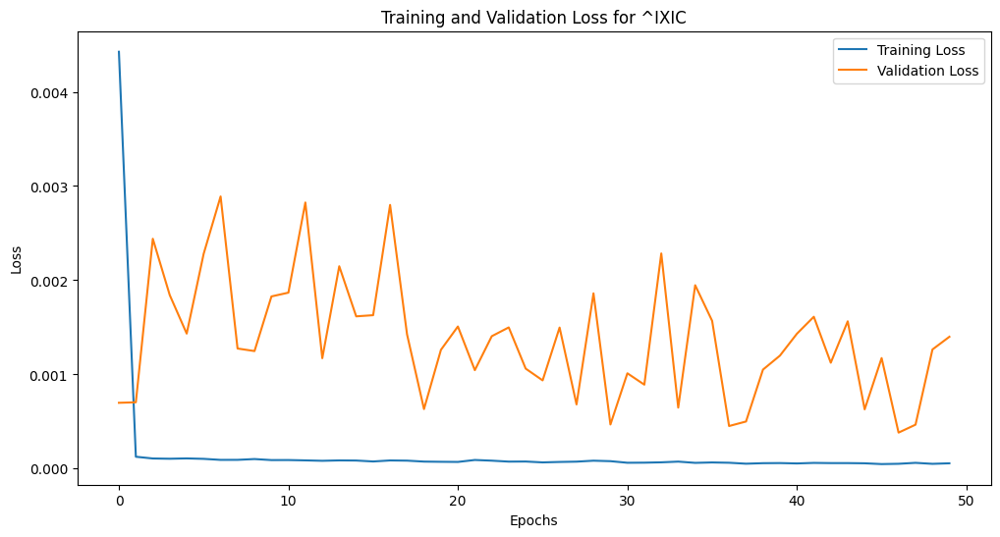

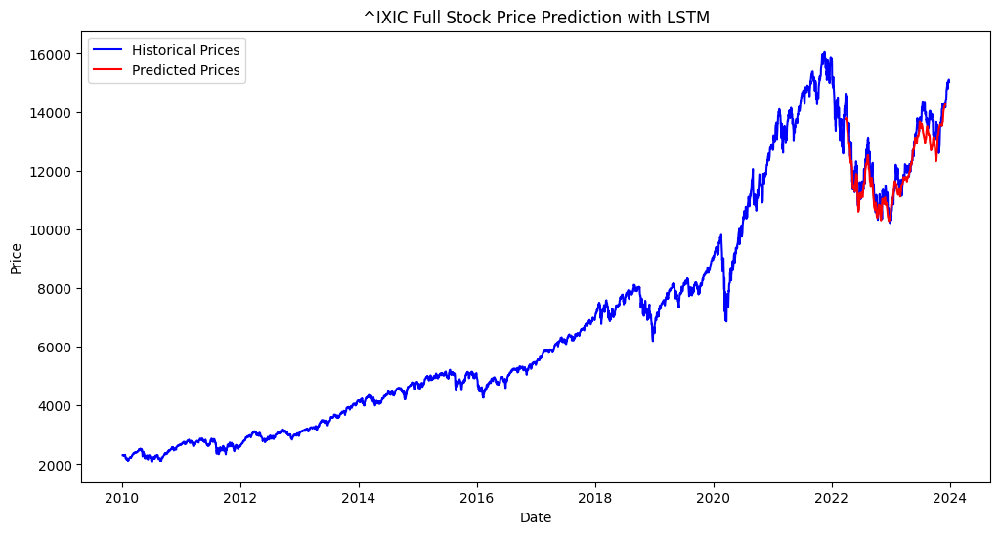

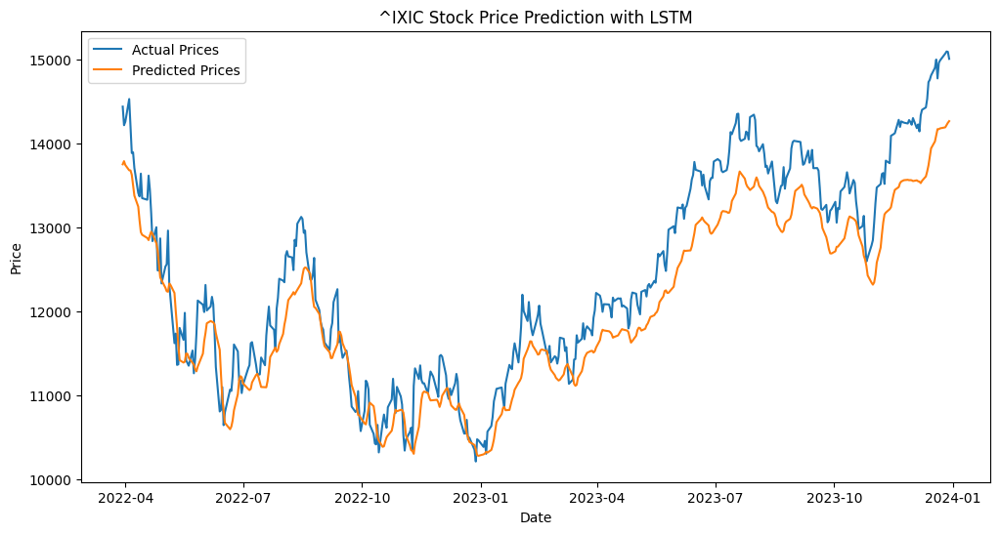

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Average margin of difference for ^IXIC: 409.21
Average margin of difference for ^IXIC (percentage): 3.20%
Directional accuracy for ^IXIC: 50.34%
Evaluating ^RUT


Epoch 1/50
74/74 [==============================] - 11s 86ms/step - loss: 0.0056 - val_loss: 0.0014
Epoch 2/50
74/74 [==============================] - 6s 75ms/step - loss: 3.5357e-04 - val_loss: 0.0014
Epoch 3/50
74/74 [==============================] - 5s 71ms/step - loss: 3.5739e-04 - val_loss: 0.0014
Epoch 4/50
74/74 [==============================] - 6s 87ms/step - loss: 3.2493e-04 - val_loss: 0.0013
Epoch 5/50
74/74 [==============================] - 5s 67ms/step - loss: 3.4136e-04 - val_loss: 0.0016
Epoch 6/50
74/74 [==============================] - 5s 70ms/step - loss: 3.1713e-04 - val_loss: 0.0019
Epoch 7/50
74/74 [==============================] - 6s 79ms/step - loss: 2.7860e-04 - val_loss: 0.0021
Epoch 8/50
74/74 [==============================] - 5s 65ms/step - loss: 3.2999e-04 - val_loss: 0.0012
Epoch 9/50
74/74 [==============================] - 6s 85ms/step - loss: 2.8696e-04 - val_loss: 0.0012
Epoch 10/50
74/74 [==============================] - 5s 67ms/step - loss: 2.

[*********************100%%**********************]  1 of 1 completed


14/14 [==============================] - 1s 22ms/step
^RUT - Mean Absolute Error (MAE): 1814.275591159858
^RUT - Mean Squared Error (MSE): 3298926.860662074
^RUT - Root Mean Squared Error (RMSE): 1816.294816559821


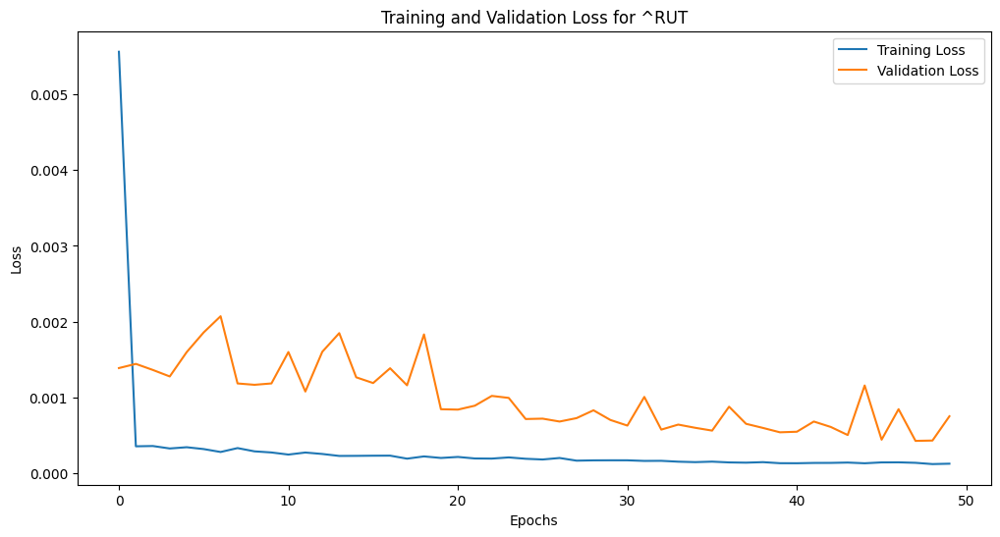

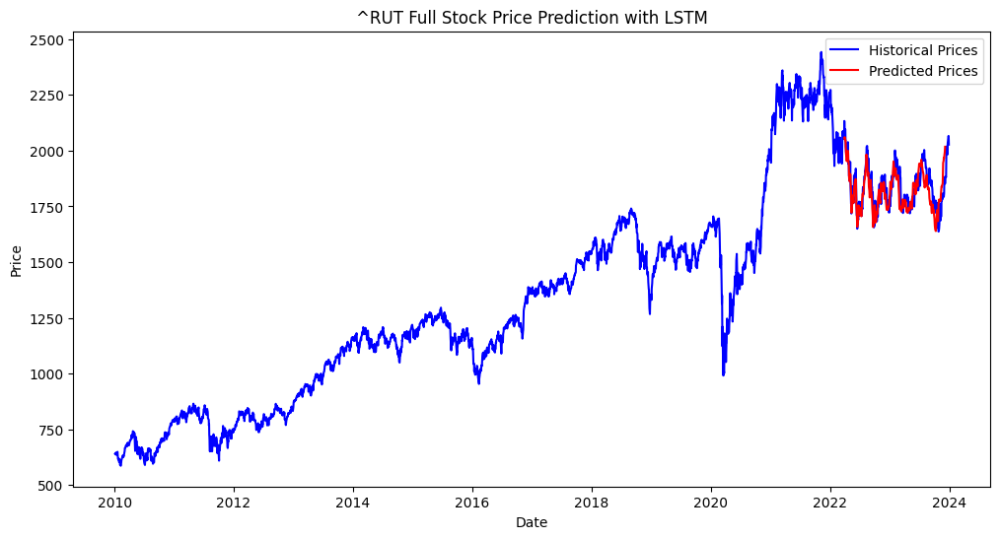

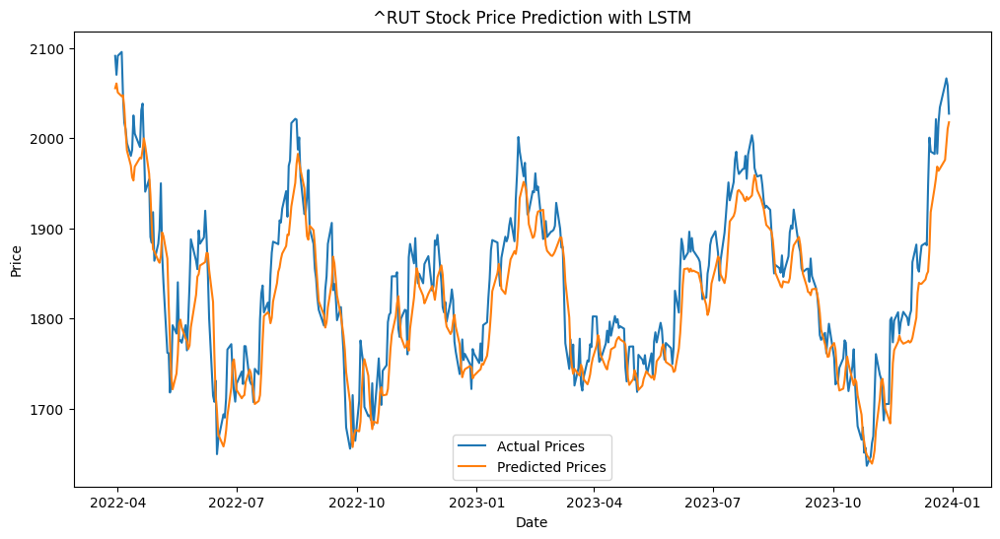

Average margin of difference for ^RUT: 32.28
Average margin of difference for ^RUT (percentage): 1.75%
Directional accuracy for ^RUT: 47.17%


In [ ]:
# Import Libraries
import yfinance as yf
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import math

# Function to create LSTM model and evaluate it
def evaluate_lstm(stock_ticker):
    print(f"Evaluating {stock_ticker}")

    # Fetch Data
    historical_data = yf.download(stock_ticker, start="2010-01-01", end="2024-01-01")
    data = yf.download(stock_ticker, start="2010-01-01", end="2022-01-01")
    closing_prices = data['Close']
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(closing_prices.values.reshape(-1, 1))

    # Prepare Data
    SEQ_LENGTH = 60
    x, y = create_sequences(scaled_data, SEQ_LENGTH)
    split = int(0.8 * len(x))
    x_train, x_val = x[:split], x[split:]
    y_train, y_val = y[:split], y[split:]

    # Build Model
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(SEQ_LENGTH, 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train Model
    history = model.fit(x_train, y_train, validation_data=(x_val, y_val), batch_size=32, epochs=50)

    # Evaluate Model
    test_data = yf.download(stock_ticker, start="2022-01-01", end="2024-01-01")
    scaled_test_data = scaler.transform(test_data['Close'].values.reshape(-1, 1))
    x_test, y_test = create_sequences(scaled_test_data, SEQ_LENGTH)

    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Calculate error metrics
    mae = mean_absolute_error(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    rmse = math.sqrt(mse)

    print(f"{stock_ticker} - Mean Absolute Error (MAE): {mae}")
    print(f"{stock_ticker} - Mean Squared Error (MSE): {mse}")
    print(f"{stock_ticker} - Root Mean Squared Error (RMSE): {rmse}")

    # Plot training and validation loss
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title(f"Training and Validation Loss for {stock_ticker}")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(historical_data['Close'], label='Historical Prices', color='blue')
    forecast_dates = pd.date_range(start=test_data.index[SEQ_LENGTH], periods=len(predictions), freq='B')
    plt.plot(forecast_dates, predictions.flatten(), label='Predicted Prices', color='red')
    plt.legend()
    plt.title(f"{stock_ticker} Full Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Plot actual vs predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(test_data.index[SEQ_LENGTH:], test_data['Close'][SEQ_LENGTH:], label='Actual Prices')
    plt.plot(test_data.index[SEQ_LENGTH:], predictions, label='Predicted Prices')
    plt.legend()
    plt.title(f"{stock_ticker} Stock Price Prediction with LSTM")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.show()

    # Calculate and print the average margin of difference
    avg_margin = average_margin_of_difference(test_data['Close'][SEQ_LENGTH:], predictions.flatten())
    avg_margin_percentage = average_margin_of_difference_percentage(test_data['Close'][SEQ_LENGTH:], predictions.flatten())
    direction_accuracy = directional_accuracy(test_data['Close'][SEQ_LENGTH:], predictions.flatten())

    print(f"Average margin of difference for {stock_ticker}: {avg_margin:.2f}")
    print(f"Average margin of difference for {stock_ticker} (percentage): {avg_margin_percentage:.2f}%")
    print(f"Directional accuracy for {stock_ticker}: {direction_accuracy:.2f}%")

# Helper function to create sequences
def create_sequences(data, seq_length):
    x = []
    y = []
    for i in range(seq_length, len(data)):
        x.append(data[i - seq_length:i])
        y.append(data[i])
    return np.array(x), np.array(y)

# Function to calculate the average margin of difference between actual and predicted prices
def average_margin_of_difference(actual, predicted):
    margins = actual.values - predicted
    avg_margin = np.mean(np.abs(margins))
    return avg_margin

# Function to calculate the average margin of difference as a percentage
def average_margin_of_difference_percentage(actual, predicted):
    margins = actual.values - predicted
    avg_margin_percentage = np.mean(np.abs(margins) / actual.values) * 100
    return avg_margin_percentage

# Function to calculate directional accuracy
def directional_accuracy(actual, predicted):
    actual_diff = np.sign(np.diff(actual.values, prepend=actual.values[0]))
    predicted_diff = np.sign(np.diff(predicted, prepend=predicted[0]))
    accuracy = np.mean(actual_diff == predicted_diff) * 100
    return accuracy

# Evaluate for multiple stocks
for ticker in ["^GSPC", "^DJI", "^IXIC", "^RUT"]:
    evaluate_lstm(ticker)


#### FB Prophet

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbk5ysc82/d_yhwdy5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbk5ysc82/ma842m8a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93327', 'data', 'file=/tmp/tmpbk5ysc82/d_yhwdy5.json', 'init=/tmp/tmpbk5ysc82/ma842m8a.json', 'output', 'file=/tmp/tmpbk5ysc82/prophet_modelwym60qnt/prophet_model-20240513021020.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:10:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:10:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


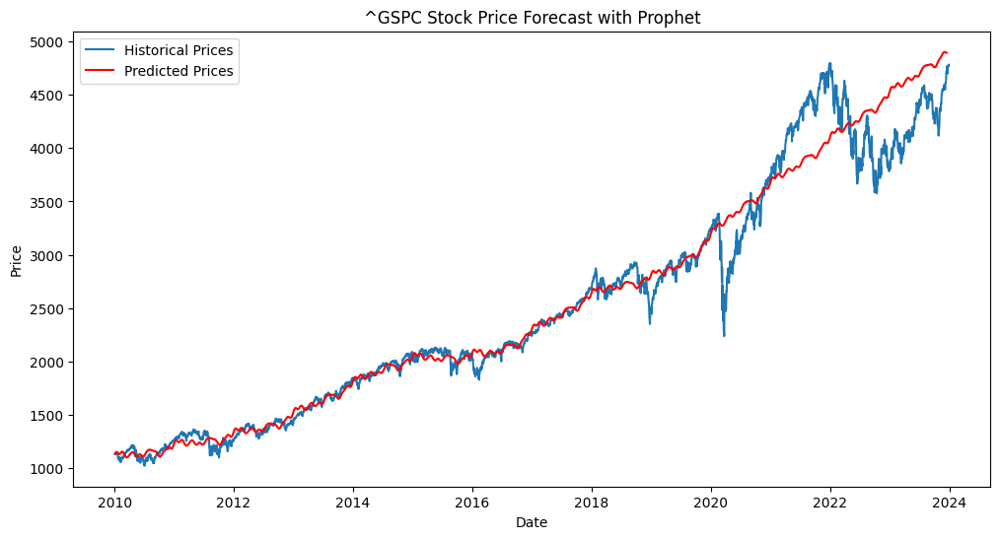

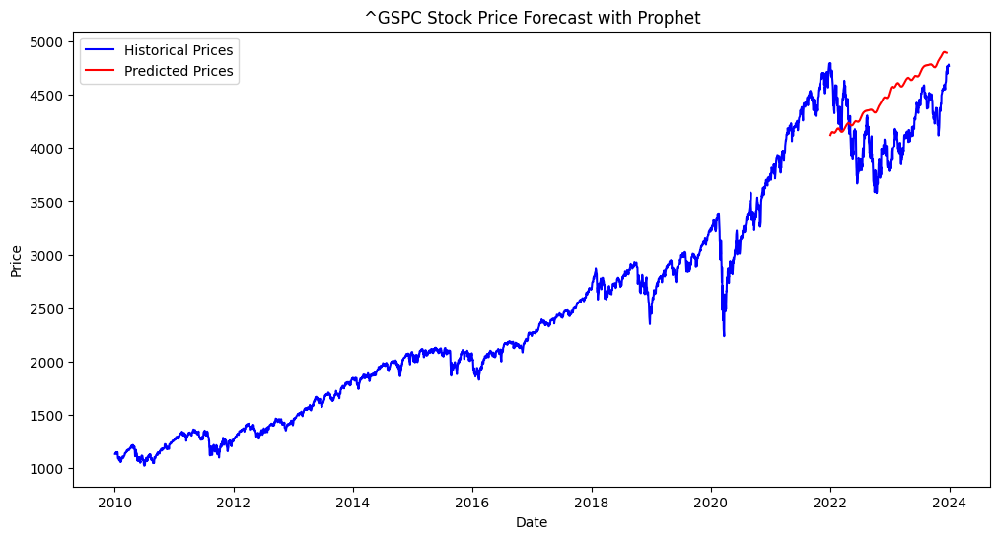

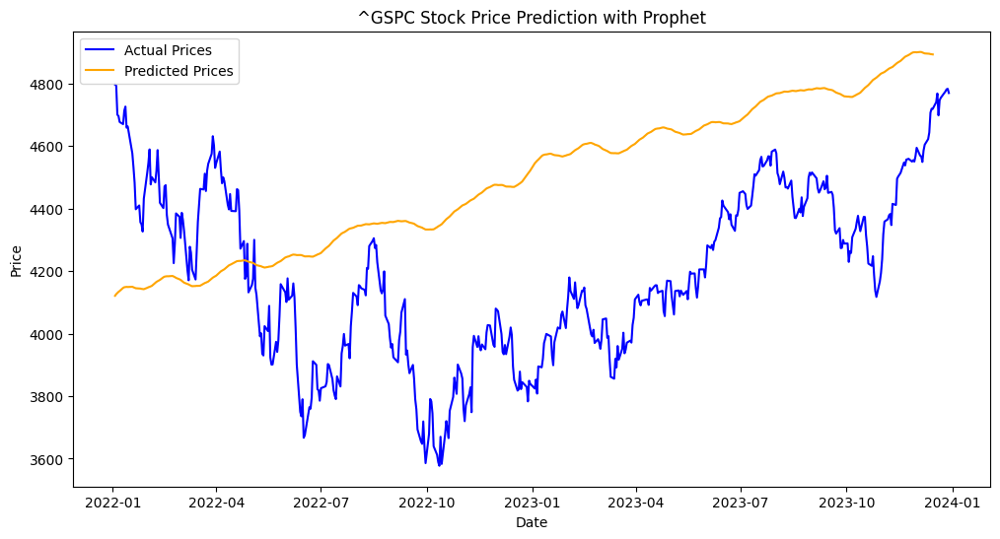

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbk5ysc82/pn_wxpk0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbk5ysc82/_066eumi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84056', 'data', 'file=/tmp/tmpbk5ysc82/pn_wxpk0.json', 'init=/tmp/tmpbk5ysc82/_066eumi.json', 'output', 'file=/tmp/tmpbk5ysc82/prophet_model5ftgs4ls/prophet_model-20240513021025.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:10:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:10:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


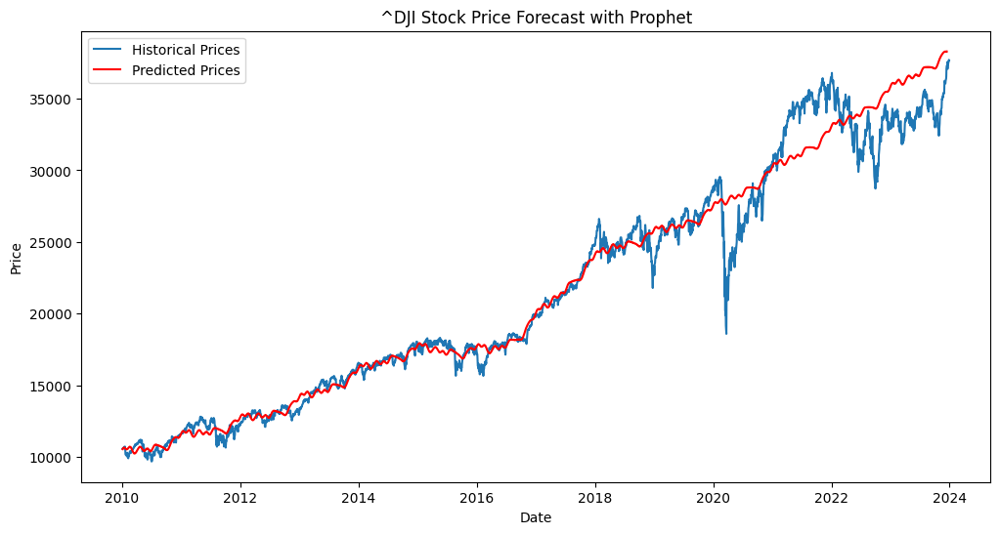

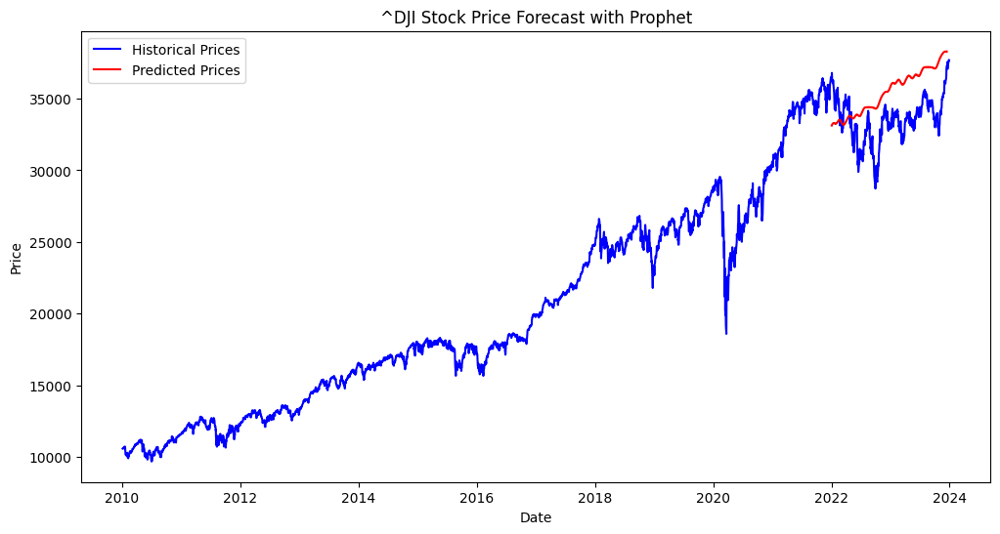

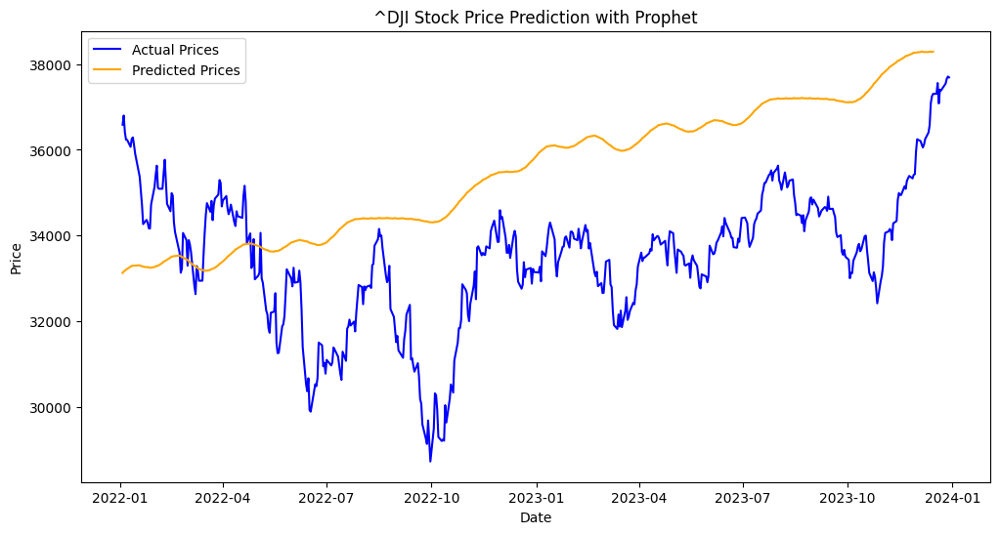

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbk5ysc82/2a4bluv7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbk5ysc82/2x0zhwfz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36931', 'data', 'file=/tmp/tmpbk5ysc82/2a4bluv7.json', 'init=/tmp/tmpbk5ysc82/2x0zhwfz.json', 'output', 'file=/tmp/tmpbk5ysc82/prophet_models0fhffqf/prophet_model-20240513021029.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:10:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:10:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


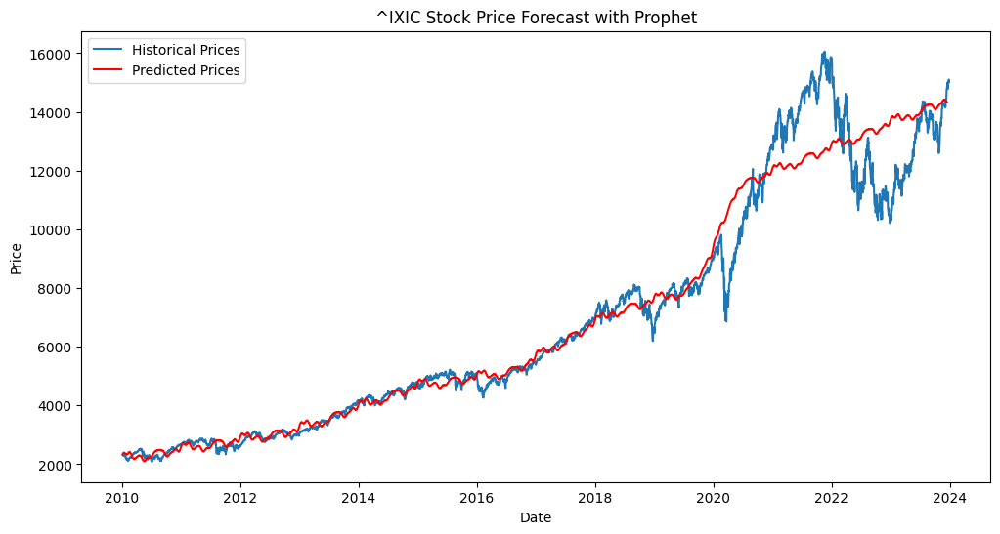

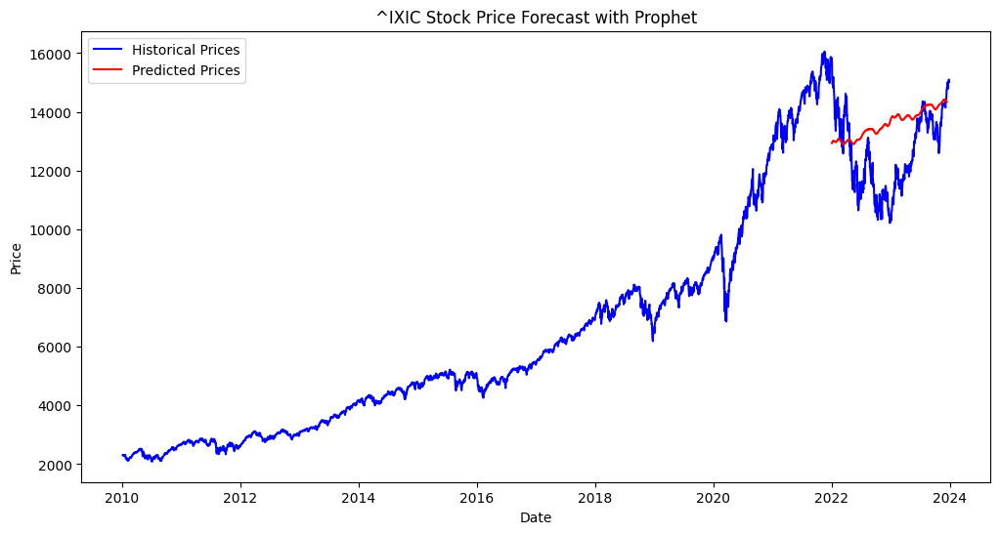

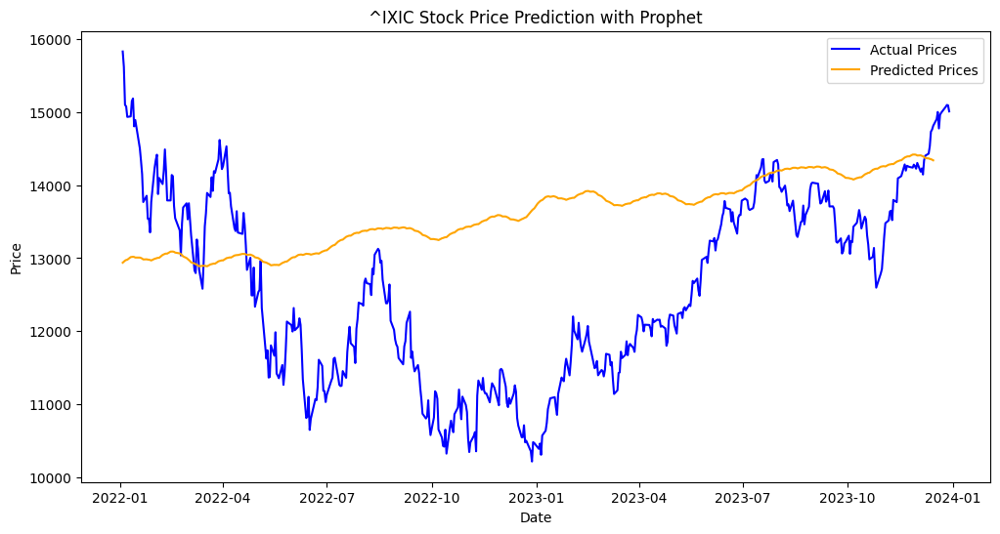

[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbk5ysc82/zdwt7dcp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbk5ysc82/pv641knz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45373', 'data', 'file=/tmp/tmpbk5ysc82/zdwt7dcp.json', 'init=/tmp/tmpbk5ysc82/pv641knz.json', 'output', 'file=/tmp/tmpbk5ysc82/prophet_modelmaijmdiq/prophet_model-20240513021034.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:10:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:10:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


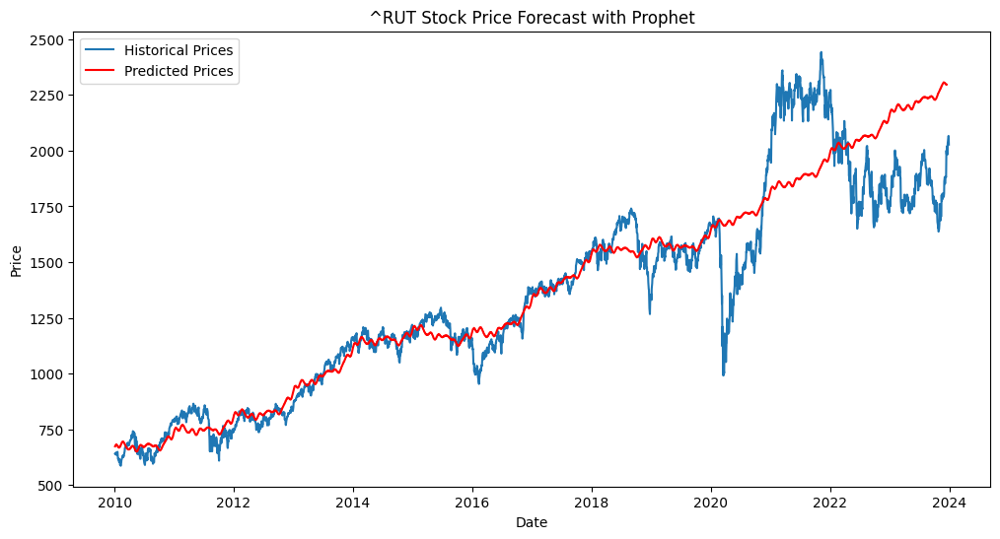

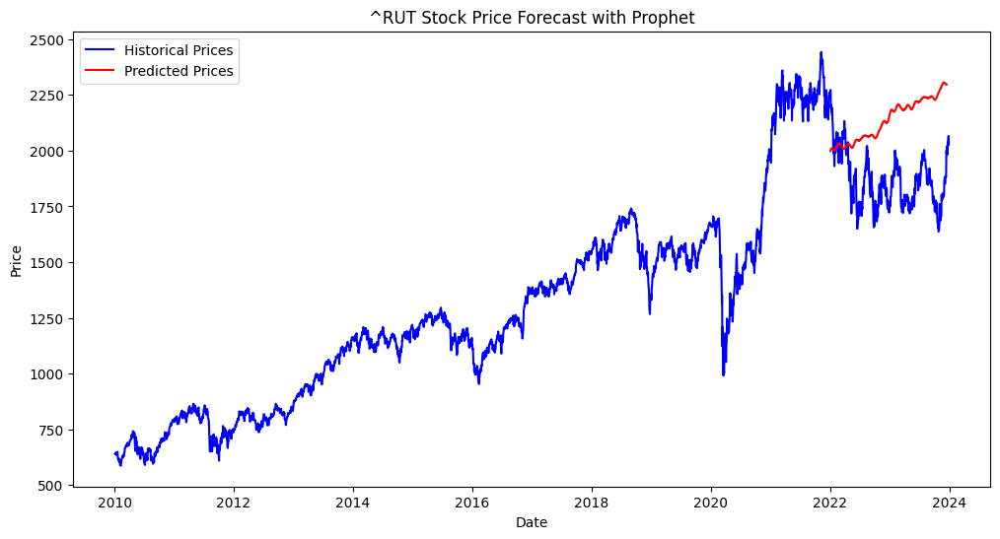

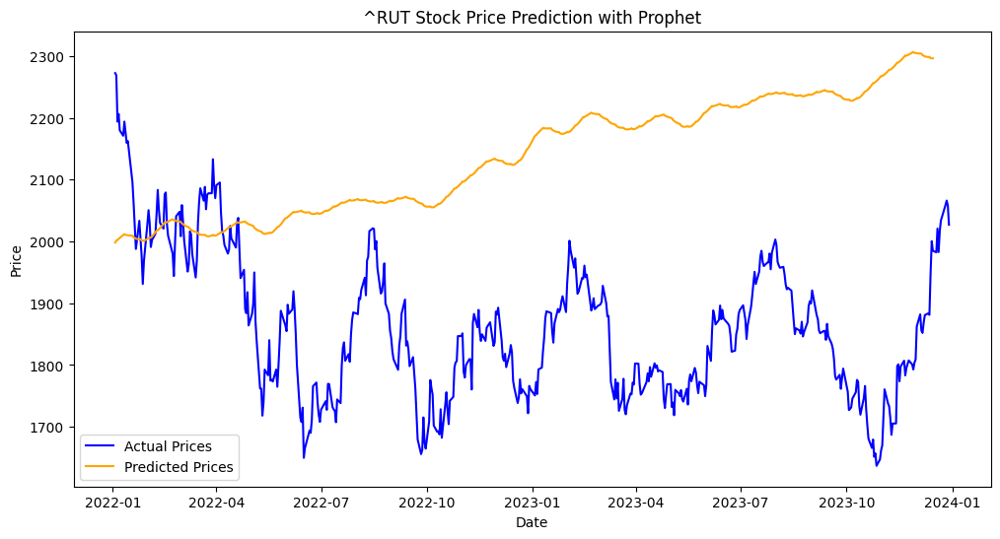

CPU times: user 11.5 s, sys: 1.43 s, total: 12.9 s
Wall time: 19.4 s


In [ ]:
%%time
from prophet import Prophet
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

def run_prophet(ticker):
    # Download data
    data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    df = pd.DataFrame(data['Close'])
    df.reset_index(inplace=True)
    df.rename(columns={'Date': 'ds', 'Close': 'y'}, inplace=True)

    # Fit the Prophet model on data up to the beginning of 2023
    m = Prophet(daily_seasonality=False)
    m.fit(df[df['ds'] < '2022-01-01'])  # Train only on data before 2023

    # Create future dataframe for forecasting
    future = m.make_future_dataframe(periods=len(data['2022-01-01':]), freq='B')
    forecast = m.predict(future)

    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices')
    plt.plot(forecast['ds'], forecast['yhat'], color='red', label='Predicted Prices')
    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()
    # Plot historical and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices', color='blue')  # Historical prices

    # Only plot predicted prices starting from 2023
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], color='red', label='Predicted Prices')  # Predicted prices

    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    # Filter actual data for plotting
    actual_data = df[df['ds'] >= '2022-01-01']
    plt.plot(actual_data['ds'], actual_data['y'], label='Actual Prices', color='blue')

    # Filter forecast data for plotting
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], label='Predicted Prices', color='orange')

    plt.title(f"{ticker} Stock Price Prediction with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

run_prophet("^GSPC")
run_prophet("^DJI")
run_prophet("^IXIC")
run_prophet("^RUT")


[*********************100%%**********************]  1 of 1 completed
DEBUG:cmdstanpy:input tempfile: /tmp/tmpiyt82fn3/h_u62dma.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpiyt82fn3/lrq6osvf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42012', 'data', 'file=/tmp/tmpiyt82fn3/h_u62dma.json', 'init=/tmp/tmpiyt82fn3/lrq6osvf.json', 'output', 'file=/tmp/tmpiyt82fn3/prophet_model3oy713m_/prophet_model-20240519001057.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:10:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:10:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


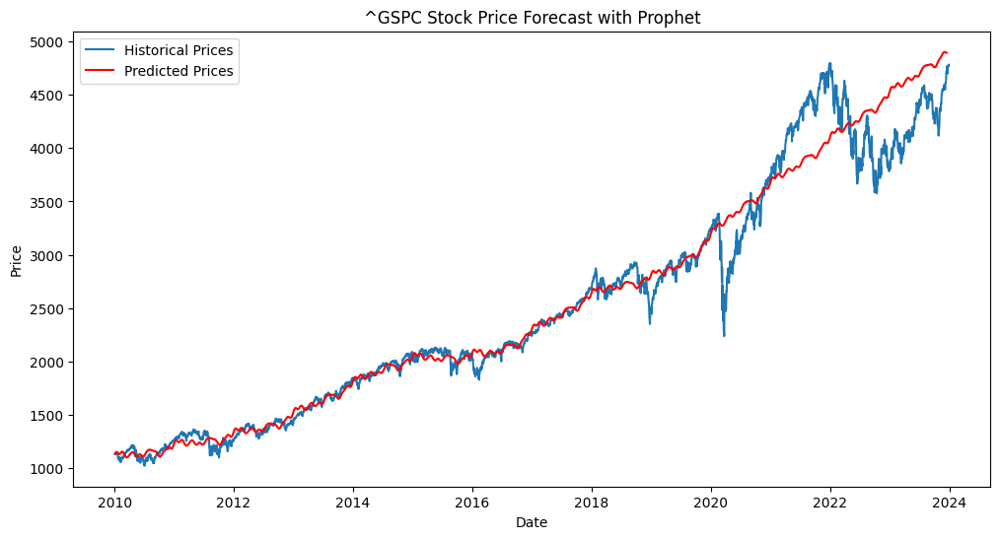

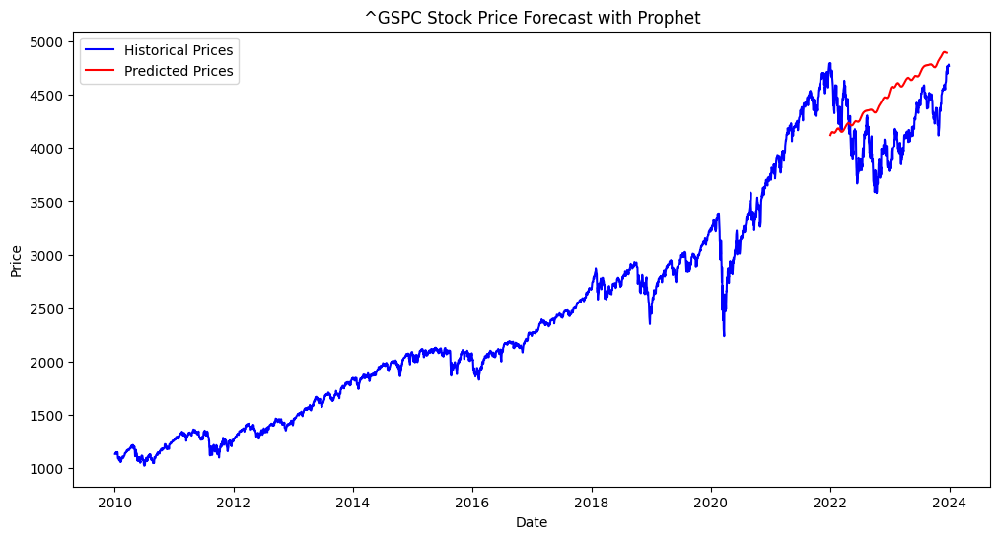

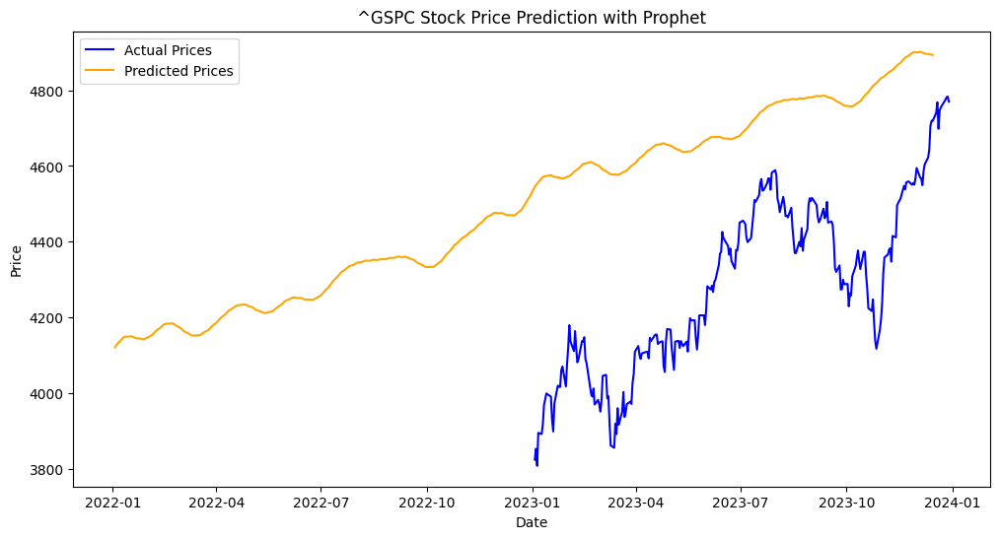

ValueError: operands could not be broadcast together with shapes (250,) (501,) 

In [ ]:
# beginning of forecast is 2022
from prophet import Prophet
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def run_prophet(ticker):
    # Download data
    data = yf.download(ticker, start="2010-01-01", end="2024-01-01")
    df = pd.DataFrame(data['Close'])
    df.reset_index(inplace=True)
    df.rename(columns={'Date': 'ds', 'Close': 'y'}, inplace=True)

    # Fit the Prophet model on data up to the beginning of 2022
    m = Prophet(daily_seasonality=False)
    m.fit(df[df['ds'] < '2023-01-01'])  # Train only on data before 2022

    # Create future dataframe for forecasting
    future = m.make_future_dataframe(periods=len(data['2023-01-01':]), freq='B')
    forecast = m.predict(future)

    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices')
    plt.plot(forecast['ds'], forecast['yhat'], color='red', label='Predicted Prices')
    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    # Plot historical and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Historical Prices', color='blue')  # Historical prices

    # Only plot predicted prices starting from 2022
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], color='red', label='Predicted Prices')  # Predicted prices

    plt.title(f"{ticker} Stock Price Forecast with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    # Filter actual data for plotting
    actual_data = df[df['ds'] >= '2023-01-01']
    plt.plot(actual_data['ds'], actual_data['y'], label='Actual Prices', color='blue')

    # Filter forecast data for plotting
    forecasted_data = forecast[forecast['ds'] >= '2022-01-01']
    plt.plot(forecasted_data['ds'], forecasted_data['yhat'], label='Predicted Prices', color='orange')

    plt.title(f"{ticker} Stock Price Prediction with Prophet")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    # Calculate and print the average margin of difference
    avg_margin = average_margin_of_difference(actual_data['y'], forecasted_data['yhat'])
    avg_margin_percentage = average_margin_of_difference_percentage(actual_data['y'], forecasted_data['yhat'])
    direction_accuracy = directional_accuracy(actual_data['y'], forecasted_data['yhat'])

    print(f"Average margin of difference for {ticker}: {avg_margin:.2f}")
    print(f"Average margin of difference for {ticker} (percentage): {avg_margin_percentage:.2f}%")
    print(f"Directional accuracy for {ticker}: {direction_accuracy:.2f}%")

# Function to calculate the average margin of difference between actual and predicted prices
def average_margin_of_difference(actual, predicted):
    margins = actual.values - predicted.values
    avg_margin = np.mean(np.abs(margins))
    return avg_margin

# Function to calculate the average margin of difference as a percentage
def average_margin_of_difference_percentage(actual, predicted):
    margins = actual.values - predicted.values
    avg_margin_percentage = np.mean(np.abs(margins) / actual.values) * 100
    return avg_margin_percentage

# Function to calculate directional accuracy
def directional_accuracy(actual, predicted):
    actual_diff = np.sign(np.diff(actual.values, prepend=actual.values[0]))
    predicted_diff = np.sign(np.diff(predicted.values, prepend=predicted.values[0]))
    accuracy = np.mean(actual_diff == predicted_diff) * 100
    return accuracy

# Run the Prophet model for multiple stocks
run_prophet("^GSPC")
run_prophet("^DJI")
run_prophet("^IXIC")
run_prophet("^RUT")
